## 1. Importing the libraries and setup device agnostic code

In [ ]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tqdm.auto import tqdm
from timeit import default_timer as timer

import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import random_split, DataLoader

import torchvision
from torchvision import transforms

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

## 2. Getting a dataset

In [ ]:
train_dataset = torchvision.datasets.MNIST(
    root = "dataset",
    train = True,
    download = True
)

test_dataset = torchvision.datasets.MNIST(
    root = "dataset",
    train = False,
    download = True
)

100%|██████████| 9912422/9912422 [00:00<00:00, 85330770.36it/s]


Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 83254772.39it/s]

Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 28043271.48it/s]


Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 16394603.07it/s]

Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw



In [ ]:
train_transform = transforms.Compose([
    transforms.ToTensor(),
])
train_dataset.transform = train_transform

test_transform = transforms.Compose([
    transforms.ToTensor()
])
test_dataset.transform = test_transform

### 2.1 Check input and output

In [ ]:
len(train_dataset), len(test_dataset)

(60000, 10000)

In [ ]:
image, label = train_dataset[0]

image.shape, label

(torch.Size([1, 28, 28]), 5)

In [ ]:
class_names = train_dataset.classes
class_names

['0 - zero',
 '1 - one',
 '2 - two',
 '3 - three',
 '4 - four',
 '5 - five',
 '6 - six',
 '7 - seven',
 '8 - eight',
 '9 - nine']

### 2.2 Visualizing data

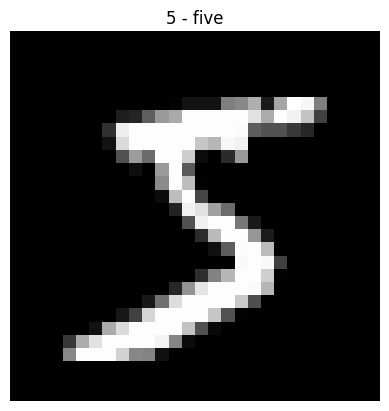

In [ ]:
plt.imshow(image.squeeze(), cmap = "gray")
plt.title(class_names[label]);
plt.axis(False);

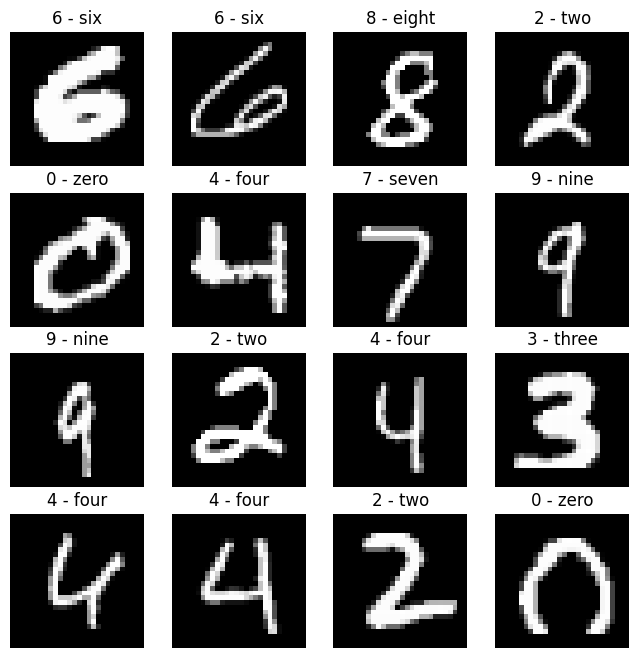

In [ ]:
torch.manual_seed(42)

fig = plt.figure(figsize = (8, 8))
rows, cols = 4, 4

for i in range(1, rows*cols + 1):
  idx = torch.randint(0, len(train_dataset), size = [1]).item()
  img, idx = train_dataset[idx]

  fig.add_subplot(rows, cols, i)
  plt.imshow(img.squeeze(), cmap = "gray")
  plt.title(class_names[idx])
  plt.axis(False);

## 3. Prepare DataLoader

In [ ]:
BATCH_SIZE = 256

In [ ]:
train_data, val_data = random_split(
    dataset = train_dataset,
    lengths = [int(0.8*len(train_dataset)), int(0.2*len(train_dataset))]
)

In [ ]:
train_loader = DataLoader(
    dataset = train_data,
    batch_size = BATCH_SIZE,
    shuffle = True
)

valid_loader = DataLoader(
    dataset = val_data,
    batch_size = BATCH_SIZE,
    shuffle = True
)

test_loader = DataLoader(
    dataset = test_dataset,
    batch_size = BATCH_SIZE,
    shuffle = False
)

In [ ]:
len(train_loader), len(valid_loader), len(test_loader)

(188, 47, 40)

In [ ]:
train_features_batch, train_labels_batch = next(iter(train_loader))
train_features_batch.shape, train_labels_batch.shape

(torch.Size([256, 1, 28, 28]), torch.Size([256]))

## 4. Variational Auto-Encoder

### 4.1 Variational Encoder

In [ ]:
class Encoder(nn.Module):

  def __init__(self, network):
    super(Encoder, self).__init__()

    # Initialization of the encoder network.
    self.encoder = network


  @staticmethod
  def reparameterization(mu, log_var):
    """
    This function reparameterizes nodes to prevent exploding gradients and provide backpropagation.
    The formula for reparameterization is the following: z = mu + std * epsilon,
    where epsilon ~ Normal(0, 1).
    """

    # Getting standard deviation from log-variance.
    std = torch.exp(0.5 * log_var)

    # Sampling epsilon from Normal(0, 1).
    eps = torch.randn_like(std)
    return mu + std * eps


  def encode(self, x):
    """
    This function returns the output of the encoder network, namely the means and standard deviations.
    """

    # Calculating the output of the encoder network of size 2L
    z = self.encoder(x)
    
    # Dividing the output to the mean and the log-variance
    mu, log_var = torch.chunk(z, 2, dim = 1)
    return mu, log_var


  def sample(self, mu, log_var):
    """
    Sampling procedure, mainly for forward pass and model testing.
    """

    z = self.reparameterization(mu, log_var)
    return z


  def forward(self, x):
    """
    PyTorch forward pass for nn.Module.
    """

    mu, log_var = self.encode(x)
    return self.sample(mu, log_var)

### 4.2 Decoder

In [ ]:
class Decoder(nn.Module):

  def __init__(self, network, num_vals):
    super(Decoder, self).__init__()

    # Initialization of the decoder network.
    self.decoder = network

    self.num_vals = num_vals


  def decode(self, z):
    """
    This function returns the output of the decoder network.
    """

    # Calculating the output of the decoder network.
    h = self.decoder(z)
    
    # Getting batch size and the dimensionality od x.
    b = h.shape[0]
    d = h.shape[2]

    h = h.view(b, d ** 2, self.num_vals)

    # To get probabilities for every pixel, we apply softmax function.
    mu = torch.softmax(h, 2)
    return mu


  def sample(self, mu):
    """
    Sampling procedure.
    """

    b = mu.shape[0]
    m = mu.shape[1]

    mu = mu.view(b, -1, self.num_vals)
    p = mu.view(-1, self.num_vals)

    x_new = torch.multinomial(p, num_samples=1).view(b, m)
    return x_new


  def forward(self, z):
    """
    PyTorch forward pass for nn.Module.
    """
    mu = self.decode(z)
    return self.sample(mu)

### 4.3 Main class

In [ ]:
class VariationalAutoEncoder(nn.Module):

  def __init__(self, encoder_network, decoder_network, num_vals=256):
    super(VariationalAutoEncoder, self).__init__()

    # Initialization of the model components.
    self.encoder = Encoder(network=encoder_network)
    self.decoder = Decoder(network=decoder_network, num_vals=num_vals)

    self.num_vals = num_vals

  def forward(self, x):
    # encoder path
    mu_z, log_var_z = self.encoder.encode(x)
    z = self.encoder.sample(mu_z, log_var_z)

    # decoder path
    mu_x = self.decoder.decode(z)

    return mu_z, log_var_z, mu_x

## 5. Evidence Lower Bound Optimization

In [ ]:
EPS = 1.e-5

def log_categorical(x, mu_x, num_classes):
  """

  """
  # Reshaping process
  x = x.view(x.shape[0], x.shape[2] ** 2)

  # Image one hot encoding
  x_one_hot = F.one_hot(x.long(), num_classes=num_classes)
  log_p = x_one_hot * torch.log(torch.clamp(mu_x, EPS, 1.0 - EPS))

  return torch.sum(log_p, -1)


def reconstruction_error(x_real, mu_x, num_classes):
  """
  This function compute the reconstruction loss between real images and predicted parameters.
  """

  error = log_categorical(
      x=x_real,
      mu_x=mu_x,
      num_classes=num_classes
  ).sum(-1) / x_real.size(0)

  return error 


def kullback_leibler_divergence(mu1, log_var1, mu2, log_var2):
  """
  This function compute the Kullback-Leibler divergence between two gaussians.
  """

  return (log_var2 - log_var1 + (torch.exp(log_var1) + (mu1 - mu2) ** 2) / torch.exp(log_var2) - 1) / 2


def kl_loss(mu_z, log_var_z):
  """
  This function compute Kullback_Leibler divergence between N(z; mu_z, sigma_z^2) and N(0, 1)
  """

  kl_divergence = kullback_leibler_divergence(
      mu1=mu_z,
      log_var1=log_var_z,
      mu2=torch.zeros(1, device=device),
      log_var2=torch.zeros(1, device=device)
  ).sum()

  return kl_divergence / mu_z.size(0)

In [ ]:
def ELBO(x, mu_z, log_var_z, mu_x, num_classes=256, beta=1):

  """
  This function computes the lower bound on the log-likelihood of data, called Evidence Lower Bound Optimization (ELBO).
  The variables mu_z and log_var_z come from encoder, while the variable mu_x comes from decoder.
  """

  RE = reconstruction_error(
      x_real=x,
      mu_x=mu_x,
      num_classes=num_classes)

  KL = kl_loss(
      mu_z=mu_z,
      log_var_z=log_var_z)

  #print(KL, beta, beta * KL)
  return (-RE + beta * KL).sum()

## 6. Auxiliary functions

### 6.1. Train and test loop

In [ ]:
def train_step(model: torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               optimizer: torch.optim.Optimizer,
               beta: torch.tensor,
               device: torch.device):
  
  """ Performs a training with model trying to learn on data_loader. """

  train_loss = 0.0

  # Put model into training mode
  model.train()

  for batch_idx, (X, y) in enumerate(data_loader):
    # Put data on target device
    X = X.to(device)
    
    # Forward pass
    mu_z, log_var_z, mu_x = model(X)

    # Calculate loss per batch
    loss = ELBO(X, mu_z, log_var_z, mu_x, beta=beta)
    train_loss += loss.item()

    # Backward pass
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    

  # Divide total train loss and acc by length of train dataloader
  train_loss /= len(data_loader)
    
  print(f"\nTrain loss: {train_loss:.2f}")

In [ ]:
def test_step(model: torch.nn.Module,
              data_loader: torch.utils.data.DataLoader,
              beta: torch.tensor,
              device: torch.device):
  
  """ Performs a testing loop step on model going over data_loader. """

  val_loss = 0.0

  # Put model in evaluate mode
  model.eval()

  # Turn on inference mode context manager
  with torch.inference_mode():
    for X, _ in data_loader:
      # Send the data to the target device
      X = X.to(device)

      # Forward pass
      mu_z, log_var_z, mu_x = model(X)

      # Calculate loss per batch
      loss = ELBO(X, mu_z, log_var_z, mu_x, beta=beta)
      val_loss += loss.item()
    
    # Adjust metrics and print out
    val_loss /= len(data_loader)

    print(f"Test loss: {val_loss:.2f}")

### 6.2 Plotting

In [ ]:
def plot_outputs(encoder: torch.nn.Module,
                 decoder: torch.nn.Module,
                 dataset: torchvision.datasets.MNIST):

    idx = random.randint(0, len(dataset) - 1)
    x, y = dataset[idx]
    x = x.unsqueeze(dim = 0).to(device)

    encoder.eval()
    decoder.eval()

    with torch.inference_mode():
      mu_z, log_var_z = encoder.encode(x)
      z = encoder.sample(mu_z, log_var_z)

      mu_x = decoder.decode(z)
      x_recon = decoder.sample(mu_x)

      gen = torch.randn(16).unsqueeze(dim = 0).to(device)
      mu_gen = decoder.decode(gen)
      x_gen = decoder.sample(mu_gen)

    print(f"ELBO: {ELBO(x, mu_z, log_var_z, mu_x)}")
    x_recon = x_recon.view(1, 28, 28)
    x_gen = x_gen.view(1, 28, 28)

    # Plotting the original image.
    plt.subplot(2, 2, 1)
    plt.axis("off")
    plt.imshow(x.cpu().squeeze().numpy(), cmap = "gray")
    plt.title("Original image")

    # Plotting the reconstruced image.
    plt.subplot(2, 2, 2)
    plt.axis("off")
    plt.imshow(x_recon.cpu().squeeze().numpy(), cmap = "gray")
    plt.title("Reconstructed image") 

    # Plotting the generated image.
    plt.subplot(2, 2, 3)
    plt.axis("off")
    plt.imshow(x_gen.cpu().squeeze().numpy(), cmap = "gray")
    plt.title("Generated random image") 

    plt.show()

## 7. Building a neural networks and initialize model

### 7.1 Hyperparameters

In [ ]:
L = 16  # number of latents
num_vals = 256 # the number of how many values a pixel can take

lr = 0.0001 # learning rate
num_epochs = 1000 # max. number of epochs

beta = 4. # regularization coefficient for Kullback–Leibler divergence

### 7.2 Initialize VAE

In [ ]:
encoder = nn.Sequential(
    # Covolutional layers
    nn.Conv2d(
        in_channels=1,
        out_channels=8,
        kernel_size=3,
        stride=2,
        padding=1),
    nn.ReLU(),
    
    nn.Conv2d(
        in_channels=8,
        out_channels=16,
        kernel_size=3,
        stride=2,
        padding=1),
    nn.BatchNorm2d(num_features=16),
    nn.ReLU(),

    nn.Conv2d(
        in_channels=16,
        out_channels=32,
        kernel_size=3,
        stride=2,
        padding=0),
    nn.ReLU(),

    # Flatten and linear layers
    nn.Flatten(),
    nn.Linear(
        in_features=32 * 3 * 3,
        out_features=256),
    nn.ReLU(),

    # The output of size 2L
    nn.Linear(
        in_features=256,
        out_features=2 * L))

decoder = nn.Sequential(
        # Linear layers
        nn.Linear(
            in_features=L,
            out_features=128),
        nn.ReLU(inplace=True),

        nn.Linear(
            in_features=128,
            out_features=32 * 3 * 3),
        nn.ReLU(inplace=True),

        # Unflatten layer
        nn.Unflatten(dim=1, unflattened_size=(32, 3, 3)),

        # Transposed convolutional layers
        nn.ConvTranspose2d(
            in_channels=32,
            out_channels=64,
            kernel_size=3,
            stride=2,
            output_padding=0),
        nn.BatchNorm2d(64),
        nn.ReLU(inplace=True),

        nn.ConvTranspose2d(
            in_channels=64,
            out_channels=128,
            kernel_size=3,
            stride=2,
            padding=1,
            output_padding=1),
        nn.BatchNorm2d(128),
        nn.ReLU(inplace=True),

        nn.ConvTranspose2d(
            in_channels=128,
            out_channels=256,
            kernel_size=3,
            stride=2,
            padding=1,
            output_padding=1))

torch.manual_seed(42)

model = VariationalAutoEncoder(
    encoder_network=encoder,
    decoder_network=decoder,
    num_vals=num_vals
).to(device)

In [ ]:
model

VariationalAutoEncoder(
  (encoder): Encoder(
    (encoder): Sequential(
      (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): ReLU()
      (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (3): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): ReLU()
      (5): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
      (6): ReLU()
      (7): Flatten(start_dim=1, end_dim=-1)
      (8): Linear(in_features=288, out_features=256, bias=True)
      (9): ReLU()
      (10): Linear(in_features=256, out_features=32, bias=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): Linear(in_features=16, out_features=128, bias=True)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=128, out_features=288, bias=True)
      (3): ReLU(inplace=True)
      (4): Unflatten(dim=1, unflattened_size=(32, 3, 3))
      (5): ConvTranspose2d(32, 64, kernel_size=(3, 3), stride=(2, 2))
      (

## 8. Setup optimizer

In [ ]:
optimizer = torch.optim.Adam(
    params = model.parameters(),
    lr = lr
)

## 9. Training session

  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch: 1
------

Train loss: 2818.84
Test loss: 1284.00
ELBO: 1664.5970458984375


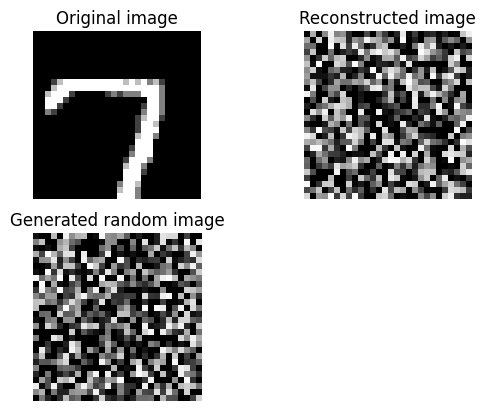

Epoch: 2
------

Train loss: 560.62
Test loss: 226.50
ELBO: 202.80072021484375


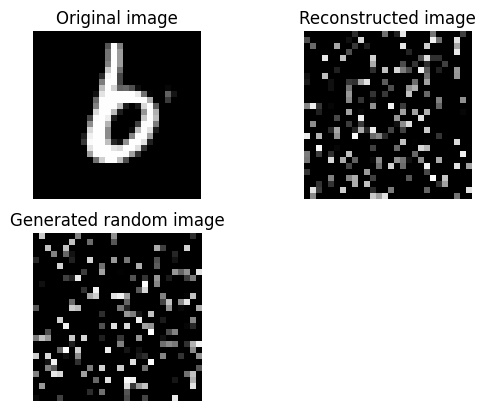

Epoch: 3
------

Train loss: 142.70
Test loss: 97.97
ELBO: 72.93441009521484


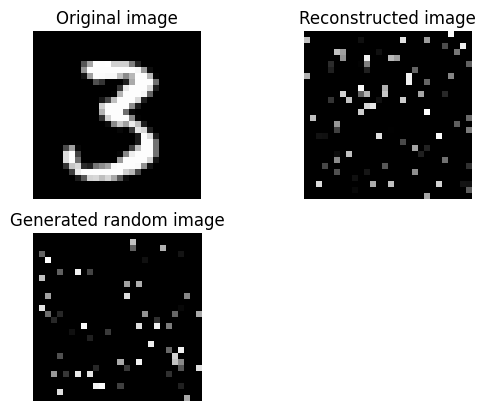

Epoch: 4
------

Train loss: 78.56
Test loss: 64.26
ELBO: 42.71427536010742


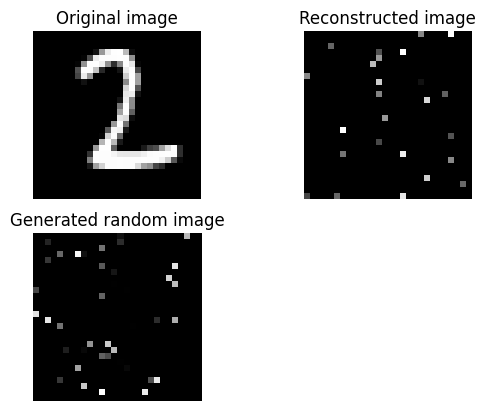

Epoch: 5
------

Train loss: 56.63
Test loss: 49.96
ELBO: 34.24909973144531


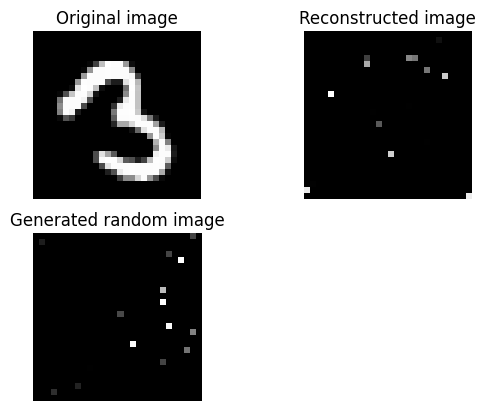

Epoch: 6
------

Train loss: 46.32
Test loss: 42.50
ELBO: 25.897153854370117


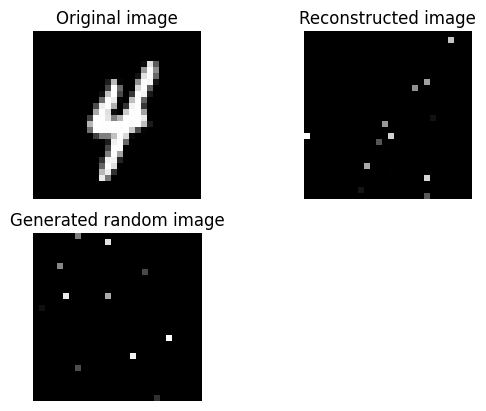

Epoch: 7
------

Train loss: 40.53
Test loss: 38.06
ELBO: 27.662830352783203


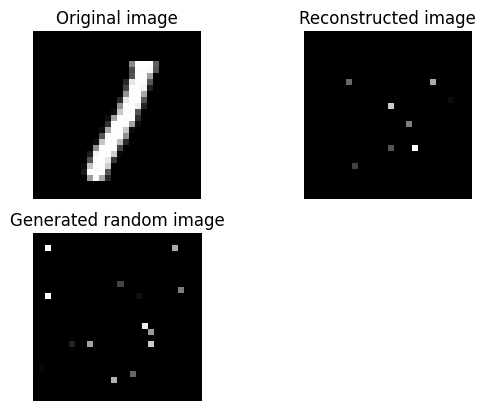

Epoch: 8
------

Train loss: 37.07
Test loss: 35.25
ELBO: 15.294692039489746


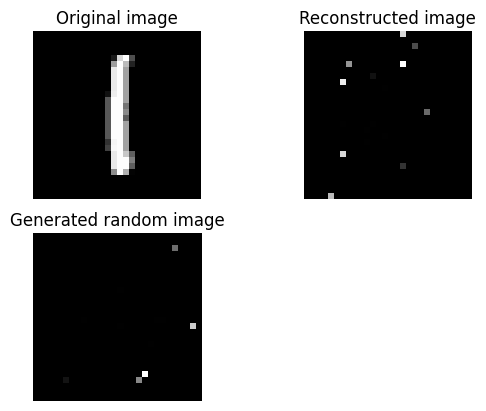

Epoch: 9
------

Train loss: 34.74
Test loss: 33.35
ELBO: 16.049135208129883


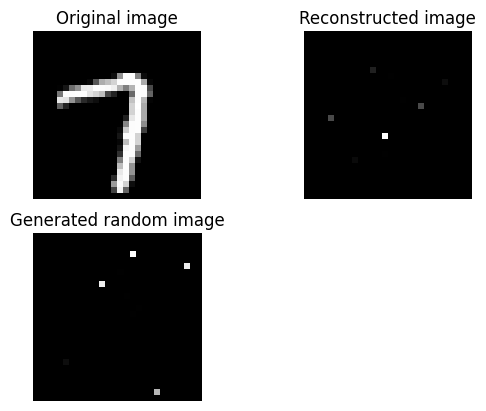

Epoch: 10
------

Train loss: 33.12
Test loss: 31.99
ELBO: 12.221567153930664


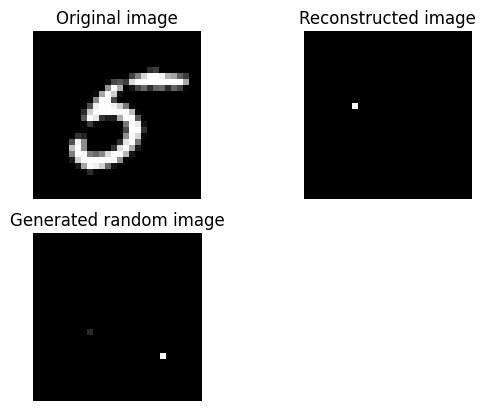

Epoch: 11
------

Train loss: 31.99
Test loss: 31.00
ELBO: 12.421887397766113


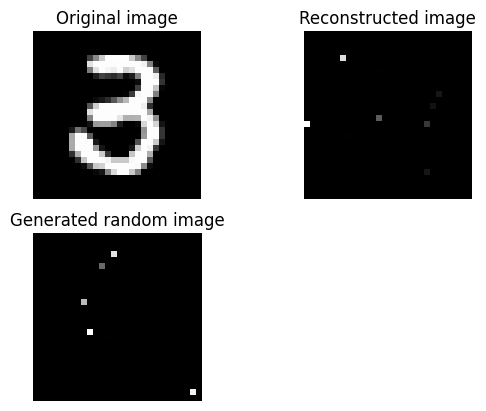

Epoch: 12
------

Train loss: 31.12
Test loss: 30.24
ELBO: 12.57020092010498


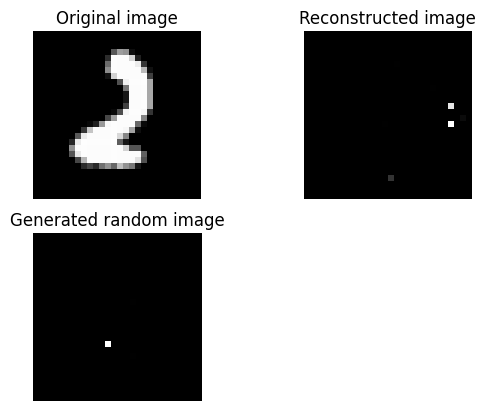

Epoch: 13
------

Train loss: 30.45
Test loss: 29.67
ELBO: 11.055264472961426


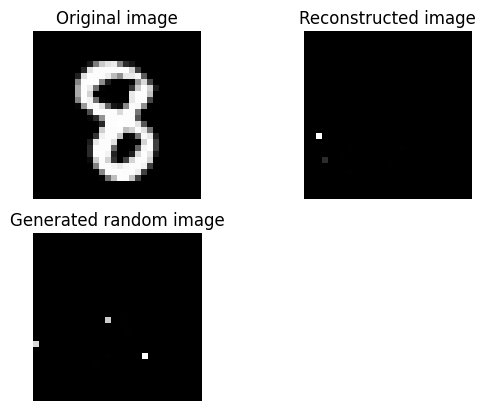

Epoch: 14
------

Train loss: 29.97
Test loss: 29.18
ELBO: 10.479242324829102


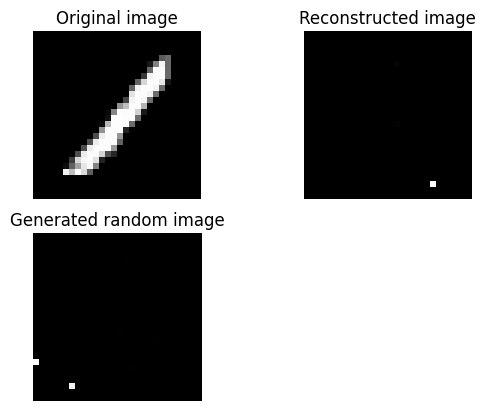

Epoch: 15
------

Train loss: 29.54
Test loss: 28.86
ELBO: 29.413602828979492


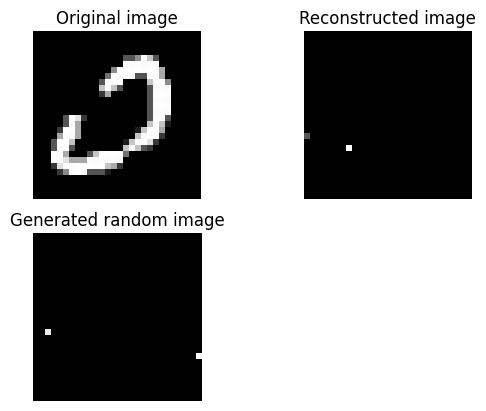

Epoch: 16
------

Train loss: 29.23
Test loss: 28.52
ELBO: 6.822812557220459


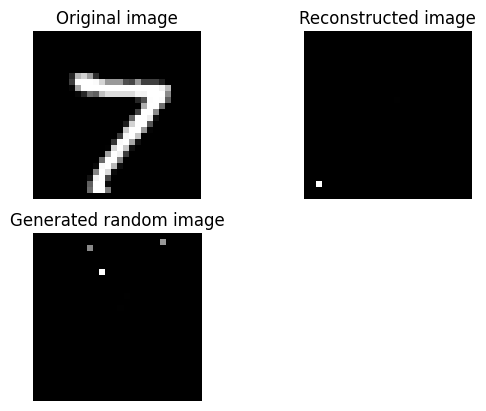

Epoch: 17
------

Train loss: 28.97
Test loss: 28.33
ELBO: 10.16115951538086


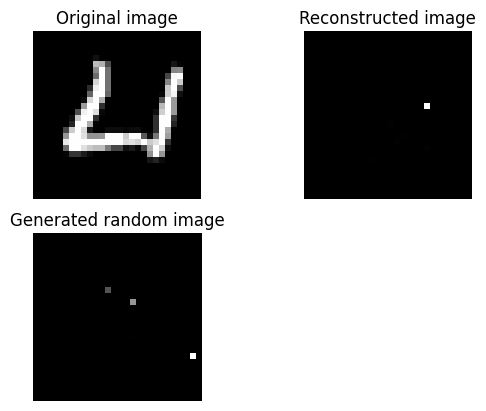

Epoch: 18
------

Train loss: 28.72
Test loss: 28.10
ELBO: 11.019582748413086


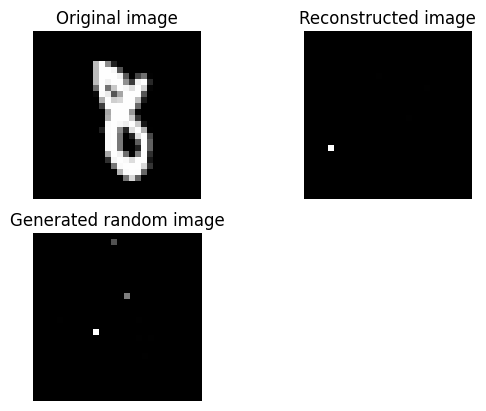

Epoch: 19
------

Train loss: 28.57
Test loss: 27.96
ELBO: 9.94465160369873


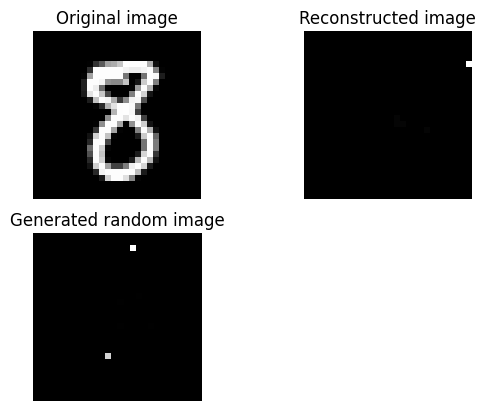

Epoch: 20
------

Train loss: 28.40
Test loss: 27.80
ELBO: 13.73900318145752


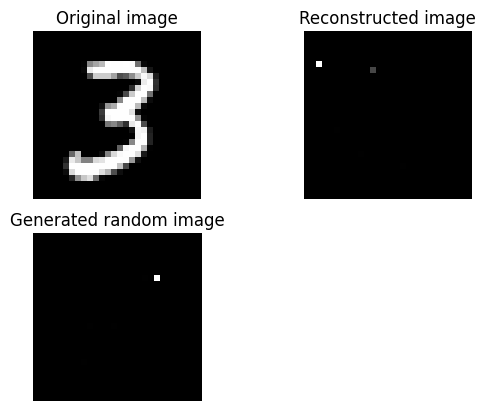

Epoch: 21
------

Train loss: 28.29
Test loss: 27.69
ELBO: 9.494972229003906


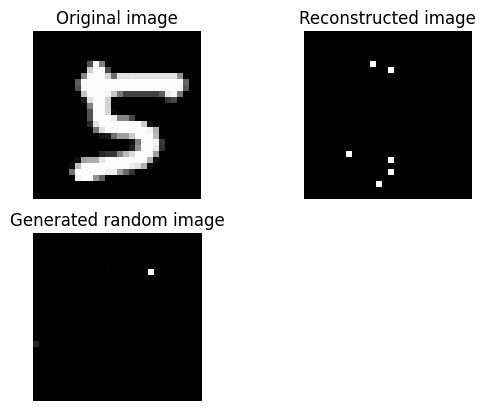

Epoch: 22
------

Train loss: 28.16
Test loss: 27.59
ELBO: 8.689126968383789


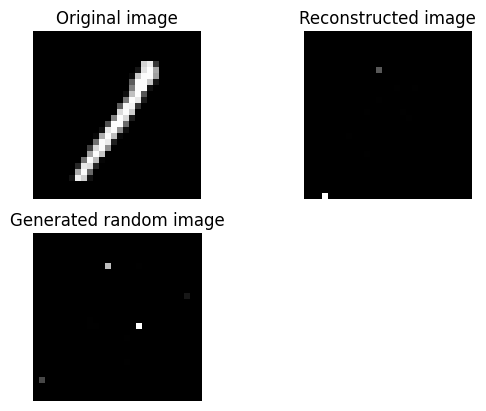

Epoch: 23
------

Train loss: 28.07
Test loss: 27.53
ELBO: 10.938993453979492


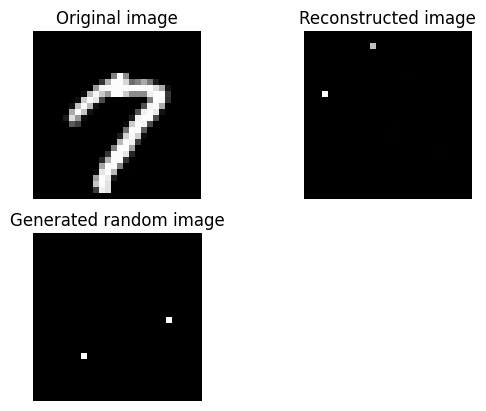

Epoch: 24
------

Train loss: 27.98
Test loss: 27.46
ELBO: 5.799660682678223


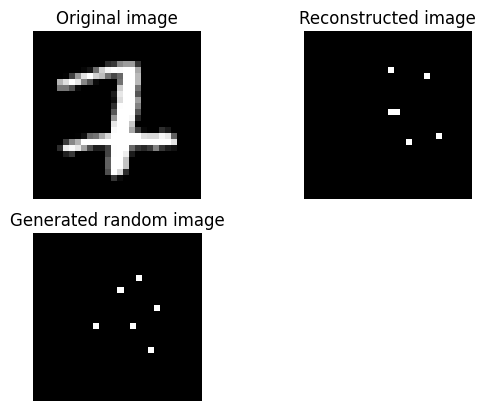

Epoch: 25
------

Train loss: 27.93
Test loss: 27.38
ELBO: 13.437816619873047


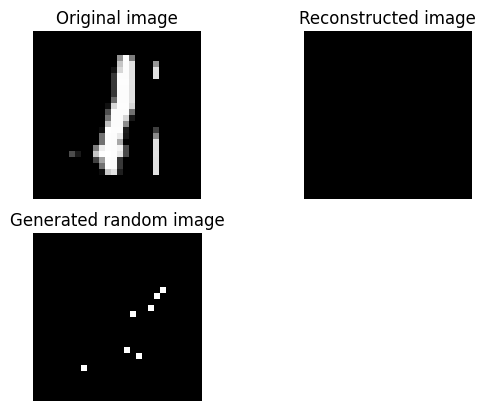

Epoch: 26
------

Train loss: 27.83
Test loss: 27.27
ELBO: 10.488040924072266


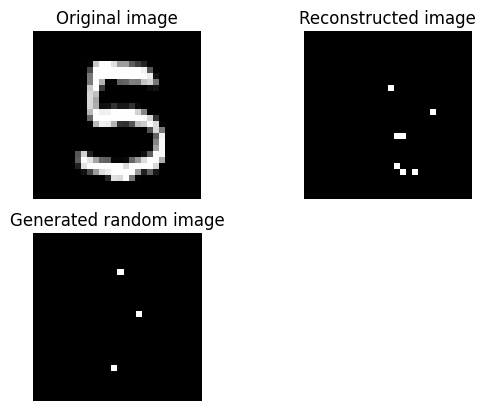

Epoch: 27
------

Train loss: 27.82
Test loss: 27.27
ELBO: 8.797456741333008


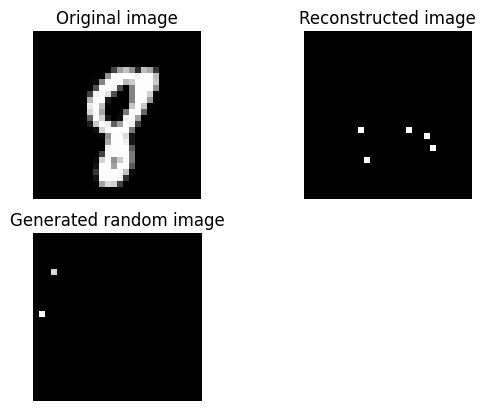

Epoch: 28
------

Train loss: 27.74
Test loss: 27.20
ELBO: 9.902243614196777


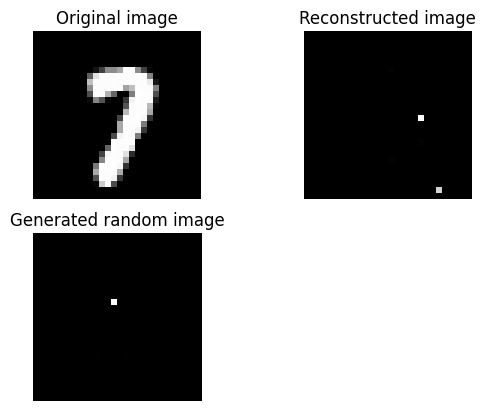

Epoch: 29
------

Train loss: 27.75
Test loss: 27.16
ELBO: 9.264595985412598


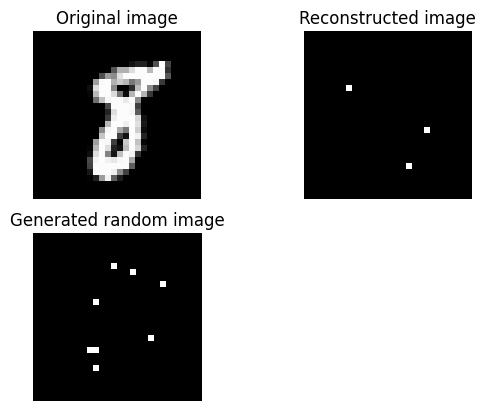

Epoch: 30
------

Train loss: 27.69
Test loss: 27.12
ELBO: 17.58662223815918


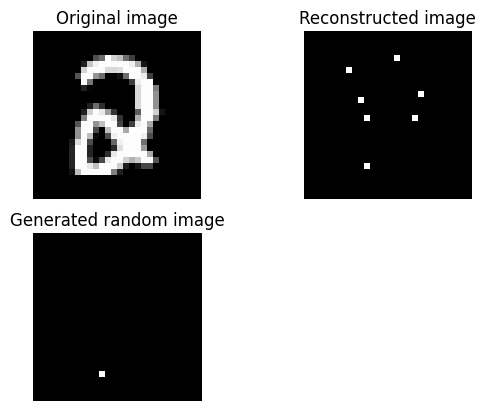

Epoch: 31
------

Train loss: 27.66
Test loss: 27.12
ELBO: 8.91364860534668


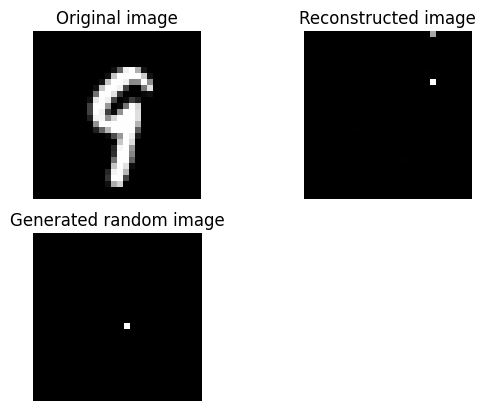

Epoch: 32
------

Train loss: 27.62
Test loss: 27.06
ELBO: 9.49190616607666


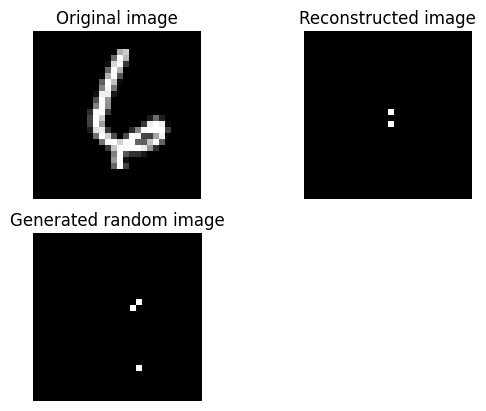

Epoch: 33
------

Train loss: 27.61
Test loss: 27.07
ELBO: 23.424983978271484


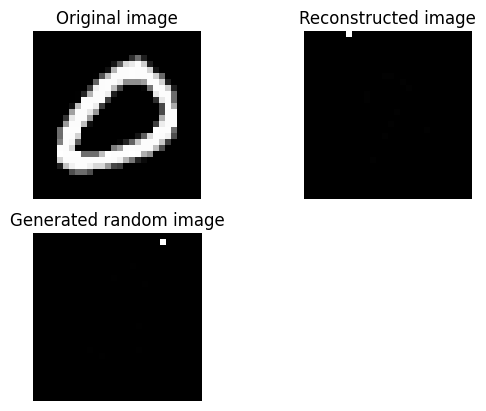

Epoch: 34
------

Train loss: 27.55
Test loss: 27.03
ELBO: 5.230978965759277


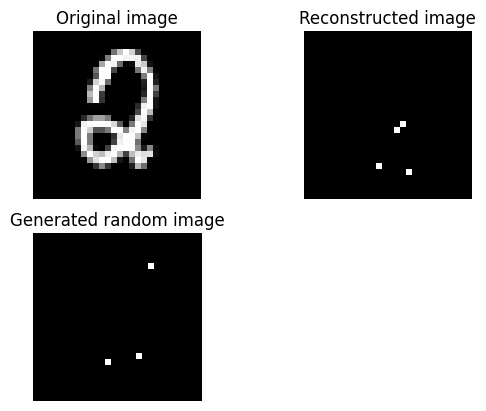

Epoch: 35
------

Train loss: 27.54
Test loss: 27.03
ELBO: 9.44421100616455


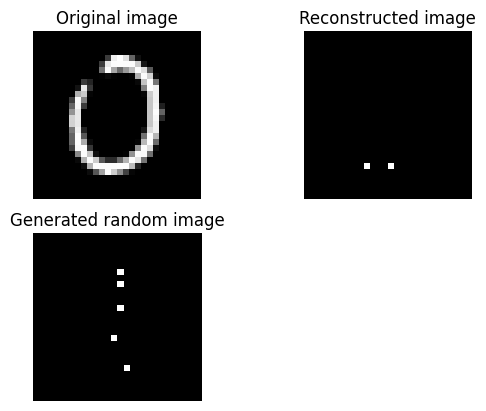

Epoch: 36
------

Train loss: 27.53
Test loss: 27.00
ELBO: 9.146713256835938


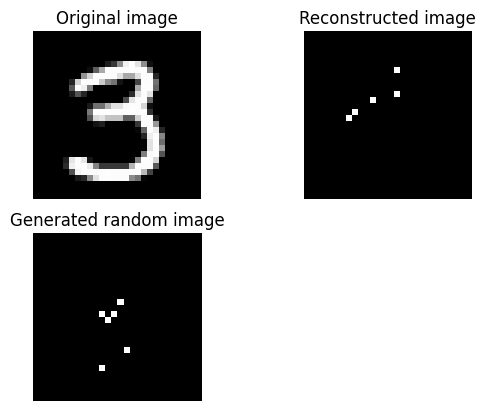

Epoch: 37
------

Train loss: 27.57
Test loss: 27.00
ELBO: 16.63213348388672


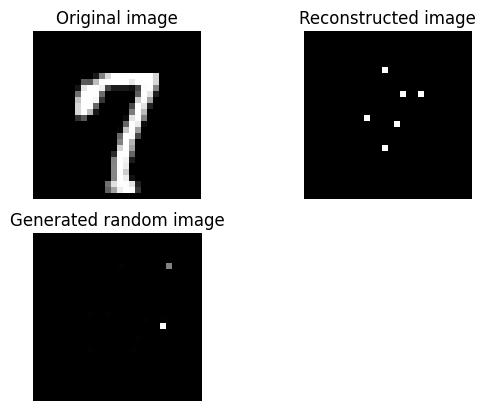

Epoch: 38
------

Train loss: 27.51
Test loss: 26.98
ELBO: 28.573230743408203


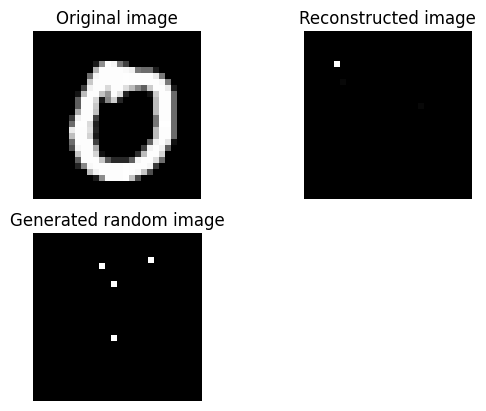

Epoch: 39
------

Train loss: 27.48
Test loss: 26.95
ELBO: 9.664901733398438


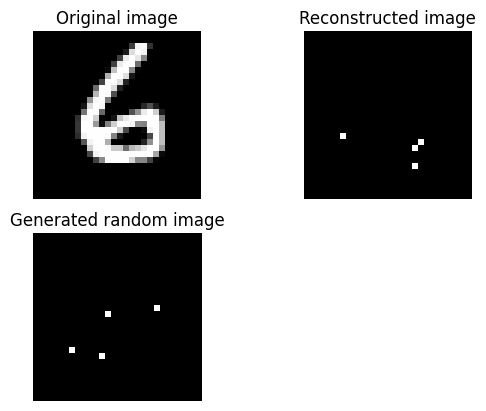

Epoch: 40
------

Train loss: 27.48
Test loss: 26.95
ELBO: 8.665109634399414


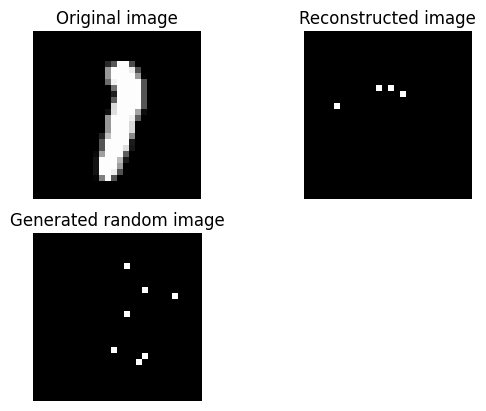

Epoch: 41
------

Train loss: 27.46
Test loss: 26.95
ELBO: 9.328875541687012


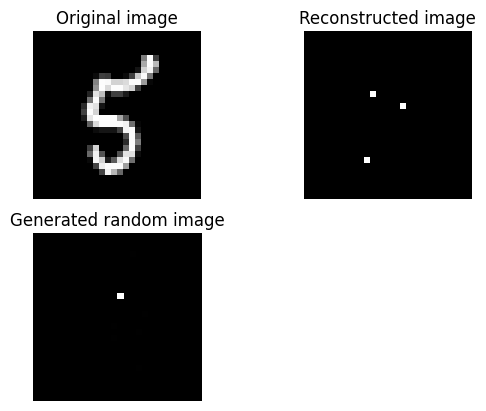

Epoch: 42
------

Train loss: 27.45
Test loss: 26.93
ELBO: 9.680464744567871


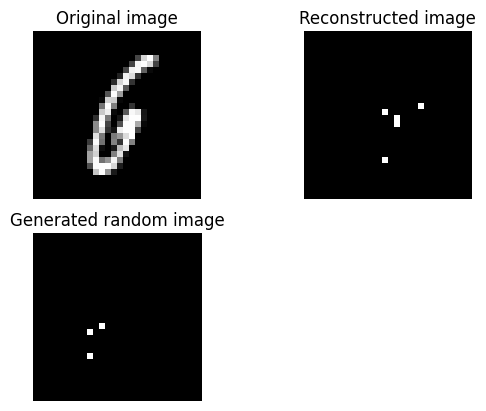

Epoch: 43
------

Train loss: 27.46
Test loss: 26.93
ELBO: 8.470602035522461


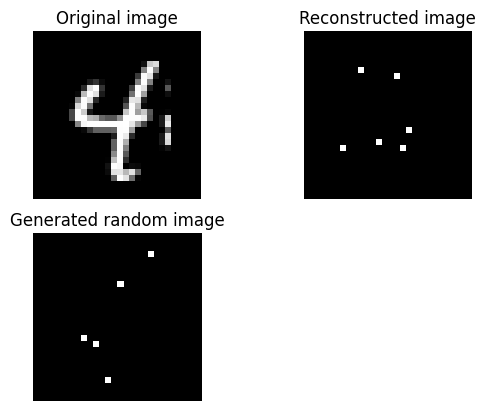

Epoch: 44
------

Train loss: 27.47
Test loss: 26.92
ELBO: 9.558809280395508


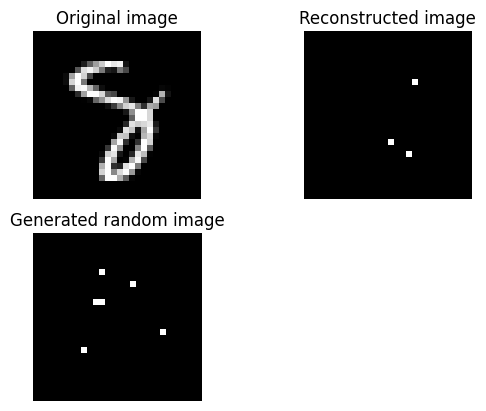

Epoch: 45
------

Train loss: 27.46
Test loss: 26.90
ELBO: 4.875499248504639


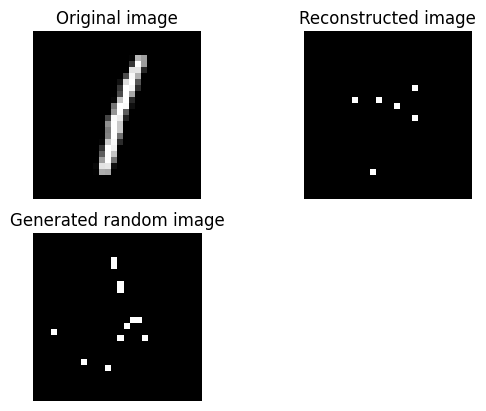

Epoch: 46
------

Train loss: 27.43
Test loss: 26.88
ELBO: 9.02499008178711


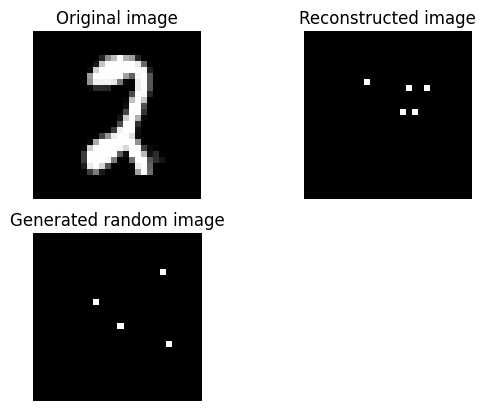

Epoch: 47
------

Train loss: 27.44
Test loss: 26.87
ELBO: 13.868120193481445


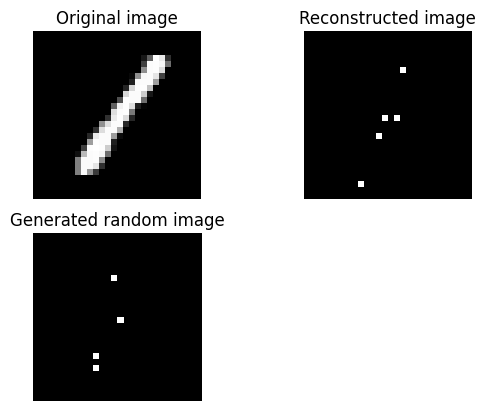

Epoch: 48
------

Train loss: 27.44
Test loss: 26.90
ELBO: 9.438787460327148


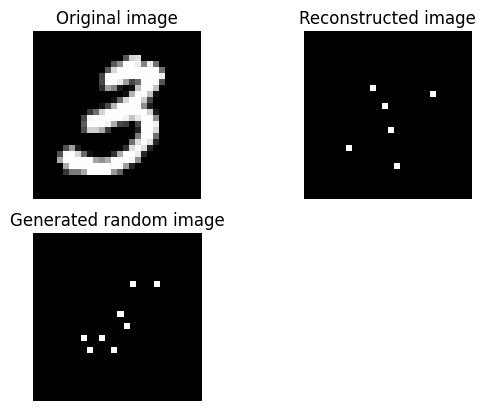

Epoch: 49
------

Train loss: 27.40
Test loss: 26.91
ELBO: 16.647056579589844


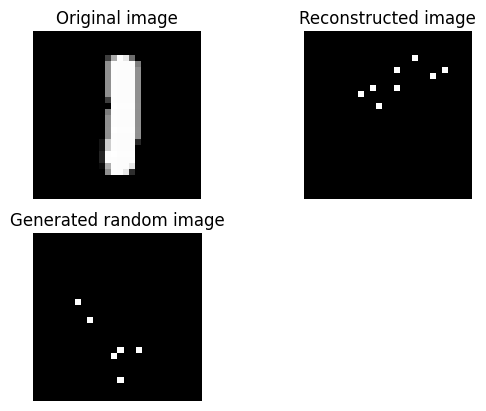

Epoch: 50
------

Train loss: 27.40
Test loss: 26.86
ELBO: 13.947212219238281


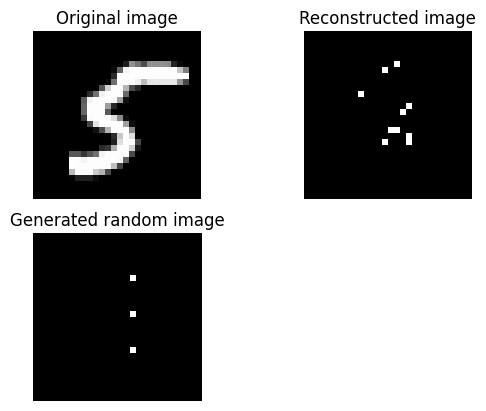

Epoch: 51
------

Train loss: 27.43
Test loss: 26.89
ELBO: 4.642405033111572


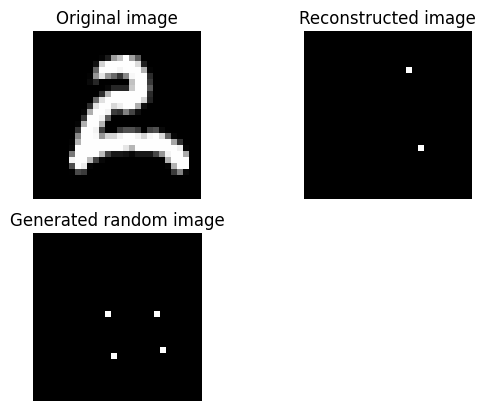

Epoch: 52
------

Train loss: 27.40
Test loss: 26.87
ELBO: 10.10836410522461


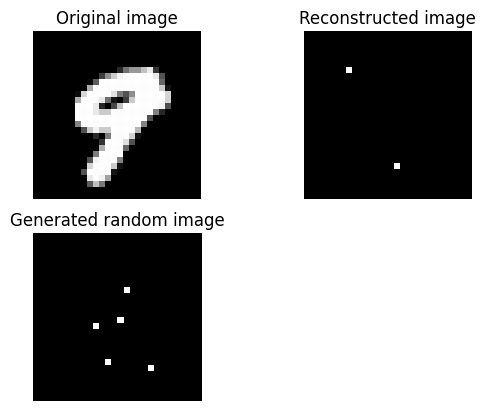

Epoch: 53
------

Train loss: 27.39
Test loss: 26.90
ELBO: 9.482115745544434


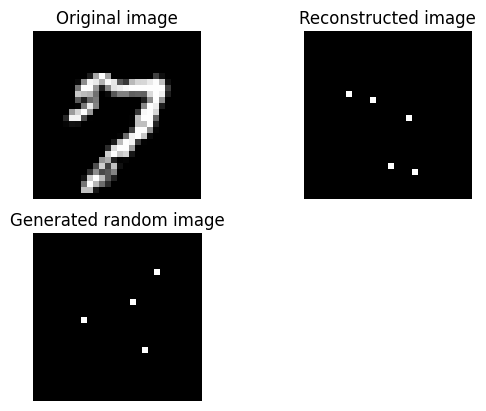

Epoch: 54
------

Train loss: 27.39
Test loss: 26.85
ELBO: 12.084091186523438


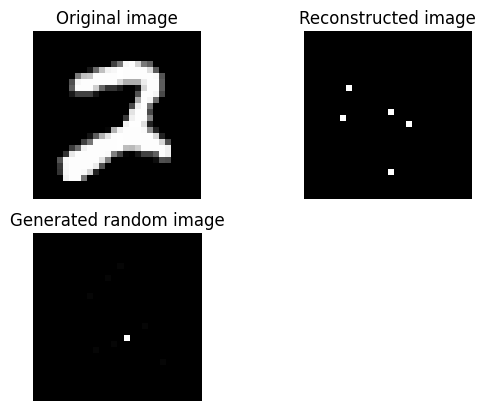

Epoch: 55
------

Train loss: 27.39
Test loss: 26.90
ELBO: 9.711833953857422


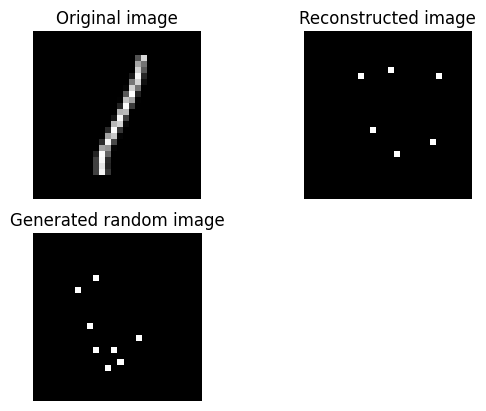

Epoch: 56
------

Train loss: 27.42
Test loss: 26.85
ELBO: 5.437995910644531


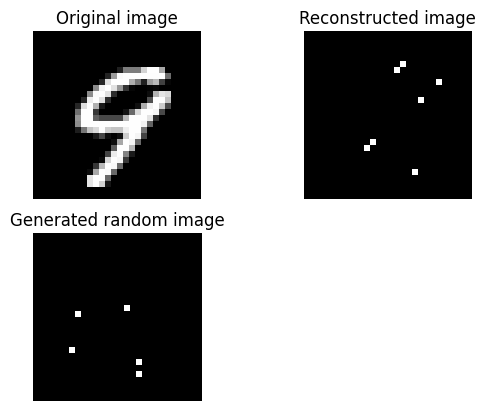

Epoch: 57
------

Train loss: 27.39
Test loss: 26.85
ELBO: 9.857294082641602


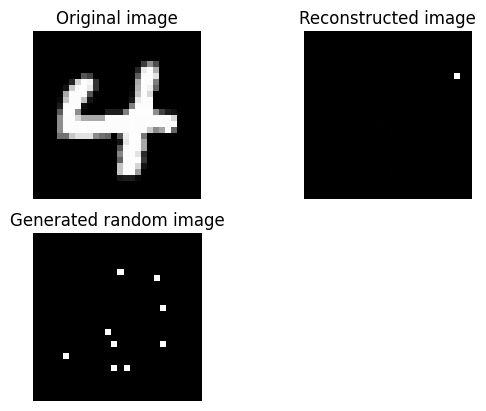

Epoch: 58
------

Train loss: 27.34
Test loss: 26.86
ELBO: 12.323464393615723


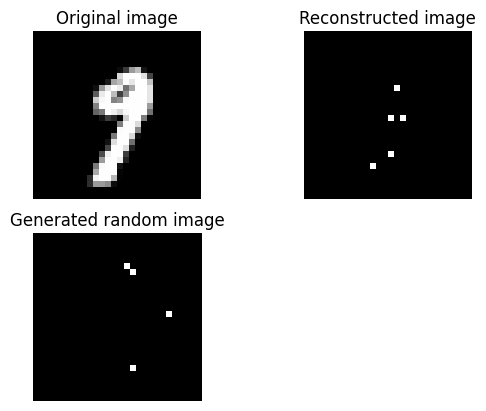

Epoch: 59
------

Train loss: 27.38
Test loss: 26.87
ELBO: 547.622802734375


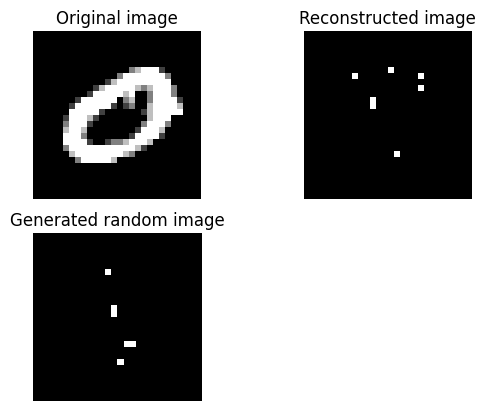

Epoch: 60
------

Train loss: 27.35
Test loss: 26.85
ELBO: 441.66546630859375


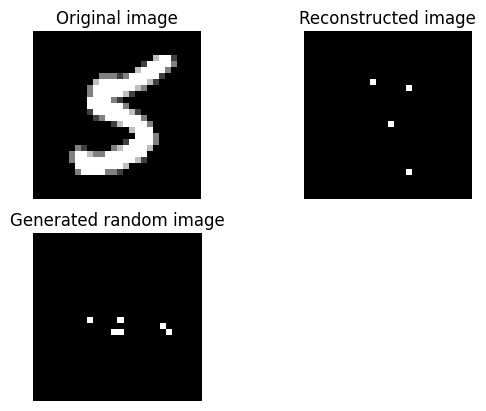

Epoch: 61
------

Train loss: 27.36
Test loss: 26.82
ELBO: 25.670303344726562


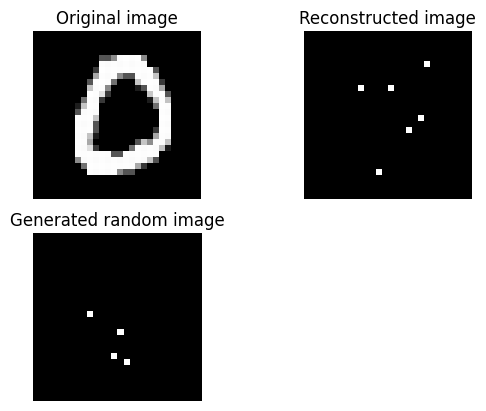

Epoch: 62
------

Train loss: 27.41
Test loss: 26.84
ELBO: 12.1961669921875


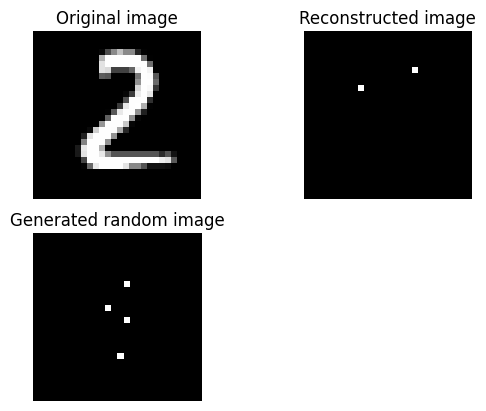

Epoch: 63
------

Train loss: 27.39
Test loss: 26.86
ELBO: 8.398031234741211


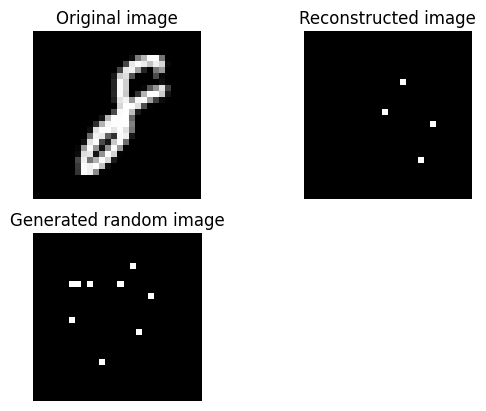

Epoch: 64
------

Train loss: 27.36
Test loss: 26.87
ELBO: 16.565628051757812


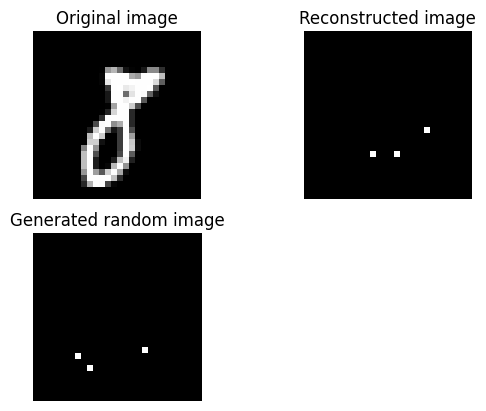

Epoch: 65
------

Train loss: 27.35
Test loss: 26.83
ELBO: 9.27507209777832


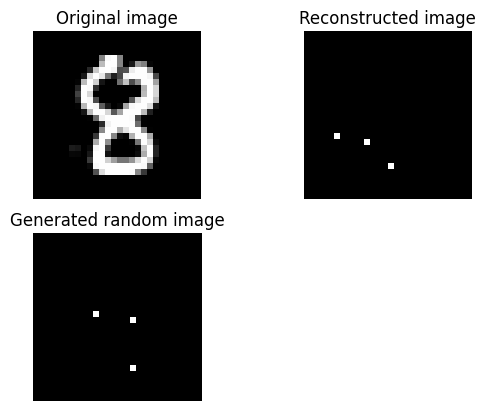

Epoch: 66
------

Train loss: 27.34
Test loss: 26.83
ELBO: 9.131331443786621


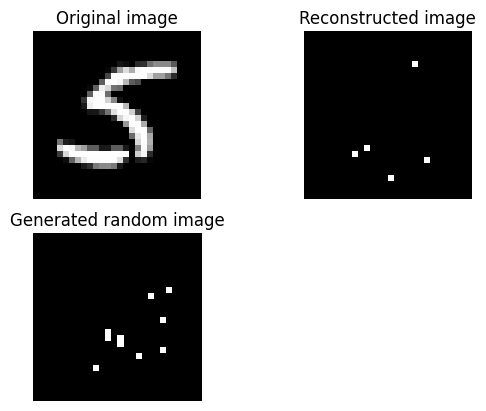

Epoch: 67
------

Train loss: 27.40
Test loss: 26.85
ELBO: 8.997626304626465


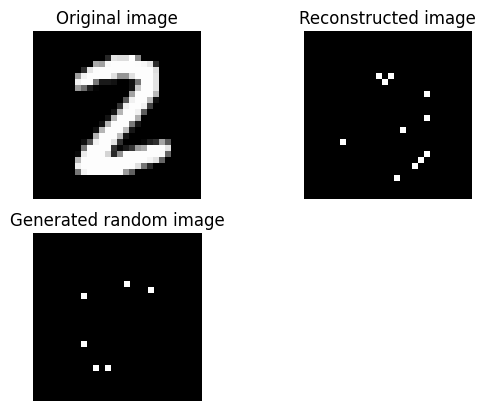

Epoch: 68
------

Train loss: 27.36
Test loss: 26.85
ELBO: 13.055734634399414


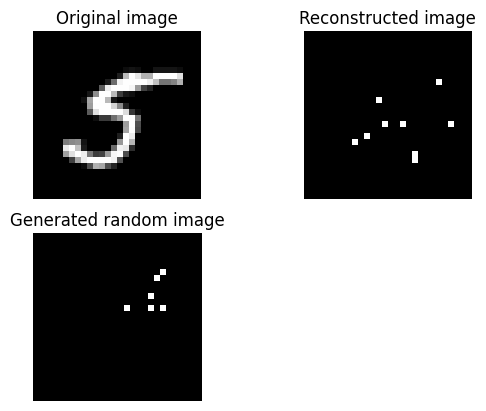

Epoch: 69
------

Train loss: 27.36
Test loss: 26.86
ELBO: 9.634761810302734


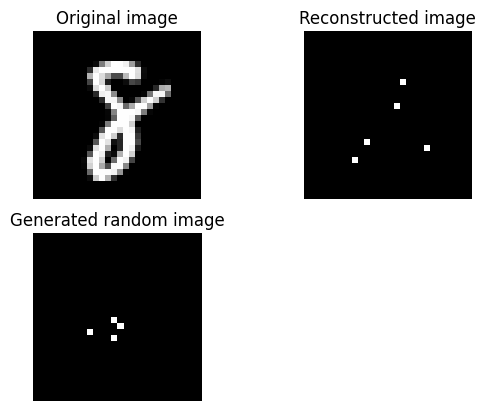

Epoch: 70
------

Train loss: 27.38
Test loss: 26.80
ELBO: 13.09068775177002


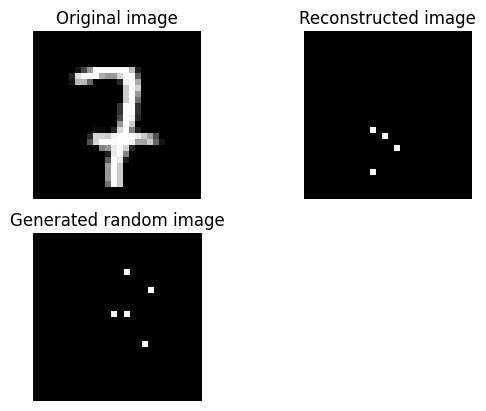

Epoch: 71
------

Train loss: 27.37
Test loss: 26.83
ELBO: 23.712677001953125


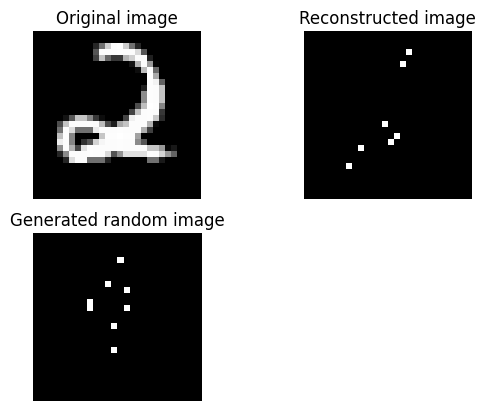

Epoch: 72
------

Train loss: 27.33
Test loss: 26.85
ELBO: 8.475656509399414


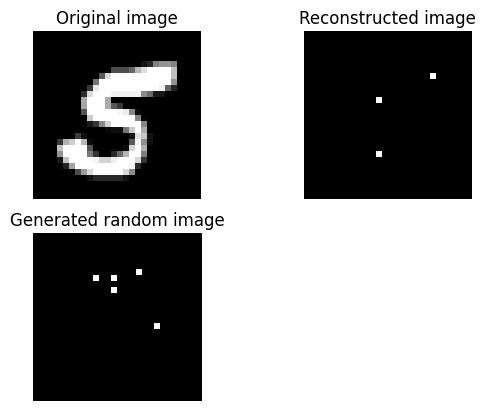

Epoch: 73
------

Train loss: 27.36
Test loss: 26.86
ELBO: 18.99529457092285


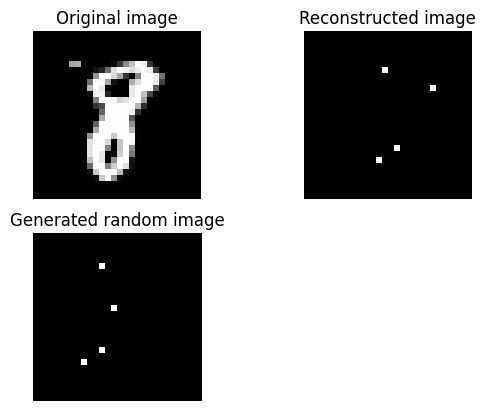

Epoch: 74
------

Train loss: 27.36
Test loss: 26.83
ELBO: 16.486122131347656


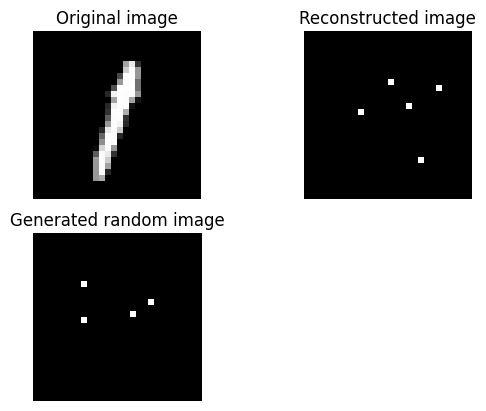

Epoch: 75
------

Train loss: 27.34
Test loss: 26.86
ELBO: 9.356178283691406


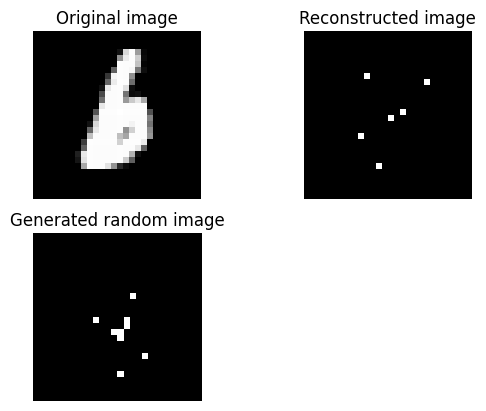

Epoch: 76
------

Train loss: 27.36
Test loss: 26.83
ELBO: 5.341472625732422


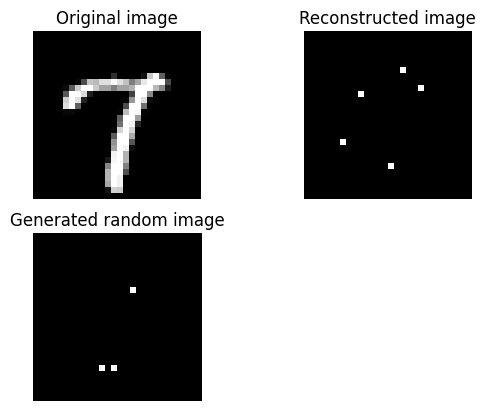

Epoch: 77
------

Train loss: 27.35
Test loss: 26.80
ELBO: 8.829106330871582


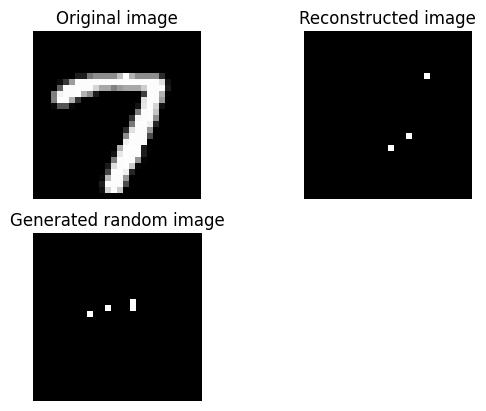

Epoch: 78
------

Train loss: 27.37
Test loss: 26.83
ELBO: 8.864215850830078


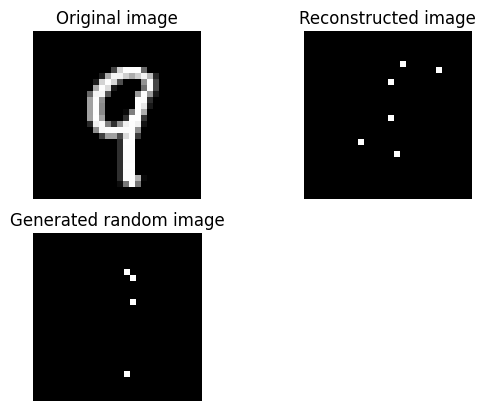

Epoch: 79
------

Train loss: 27.38
Test loss: 26.81
ELBO: 8.138364791870117


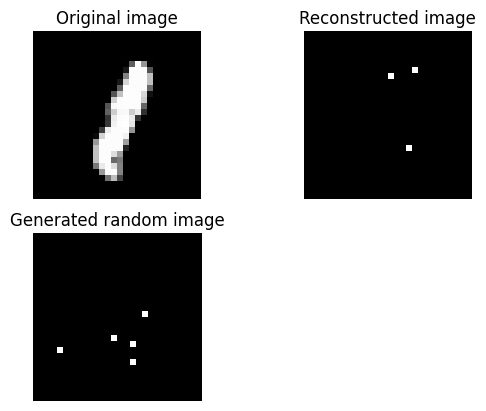

Epoch: 80
------

Train loss: 27.36
Test loss: 26.83
ELBO: 9.157660484313965


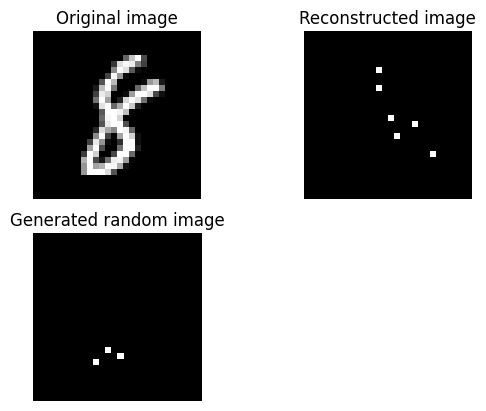

Epoch: 81
------

Train loss: 27.35
Test loss: 26.82
ELBO: 9.275609970092773


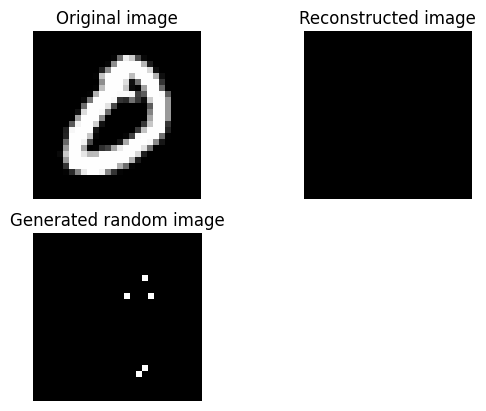

Epoch: 82
------

Train loss: 27.35
Test loss: 26.86
ELBO: 5.123485565185547


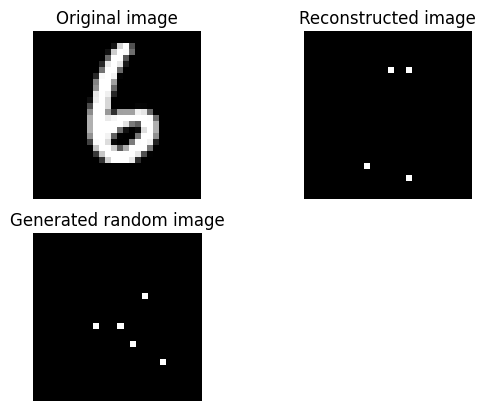

Epoch: 83
------

Train loss: 27.37
Test loss: 26.82
ELBO: 658.8211059570312


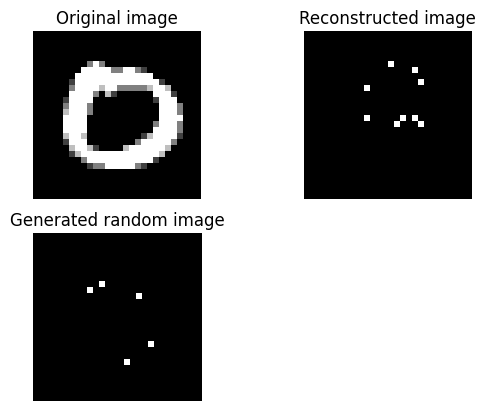

Epoch: 84
------

Train loss: 27.35
Test loss: 26.81
ELBO: 9.205423355102539


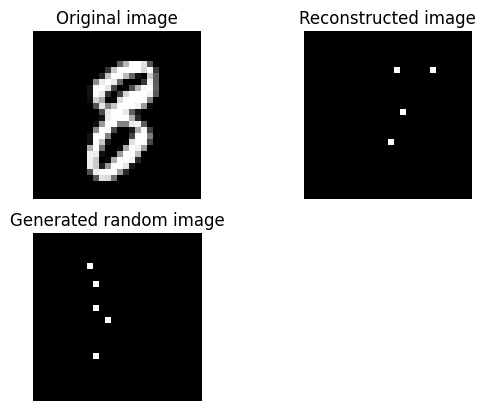

Epoch: 85
------

Train loss: 27.37
Test loss: 26.84
ELBO: 13.0927152633667


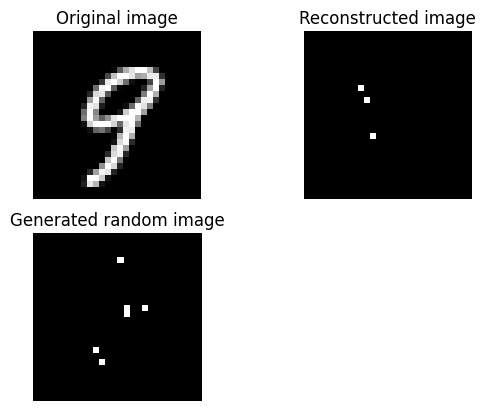

Epoch: 86
------

Train loss: 27.36
Test loss: 26.85
ELBO: 9.624509811401367


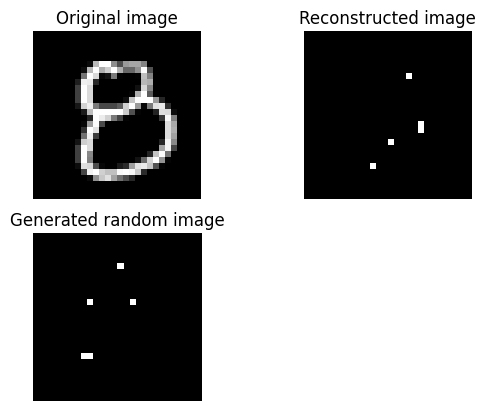

Epoch: 87
------

Train loss: 27.39
Test loss: 26.83
ELBO: 12.514921188354492


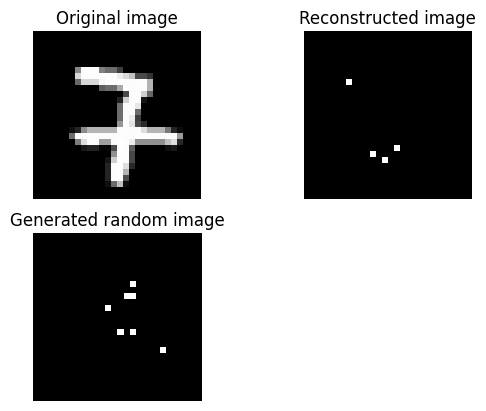

Epoch: 88
------

Train loss: 27.35
Test loss: 26.82
ELBO: 12.654556274414062


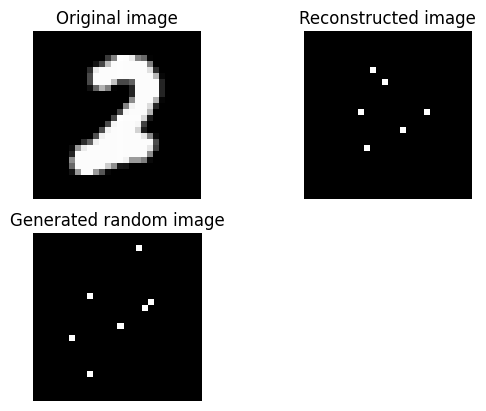

Epoch: 89
------

Train loss: 27.34
Test loss: 26.82
ELBO: 9.612024307250977


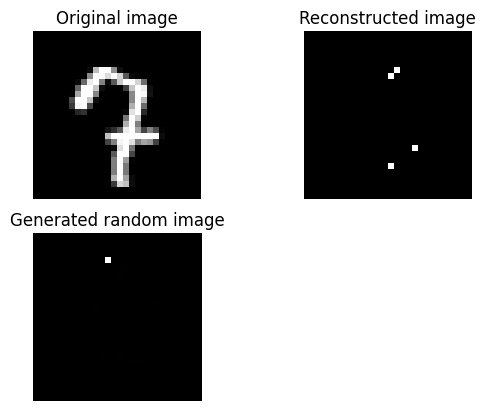

Epoch: 90
------

Train loss: 27.35
Test loss: 26.81
ELBO: 12.000954627990723


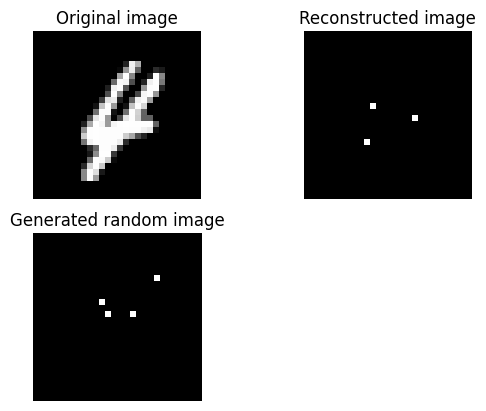

Epoch: 91
------

Train loss: 27.37
Test loss: 26.83
ELBO: 8.756414413452148


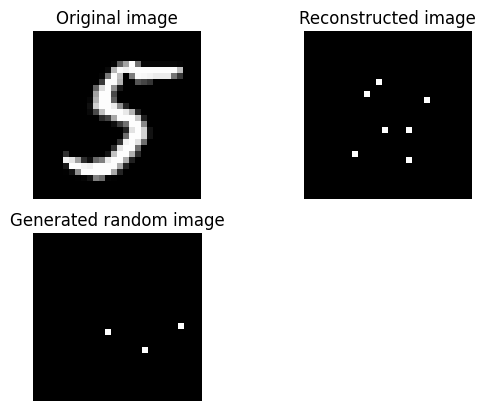

Epoch: 92
------

Train loss: 27.35
Test loss: 26.83
ELBO: 8.811283111572266


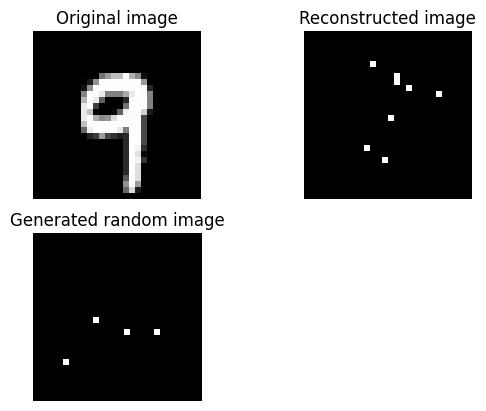

Epoch: 93
------

Train loss: 27.35
Test loss: 26.82
ELBO: 16.858131408691406


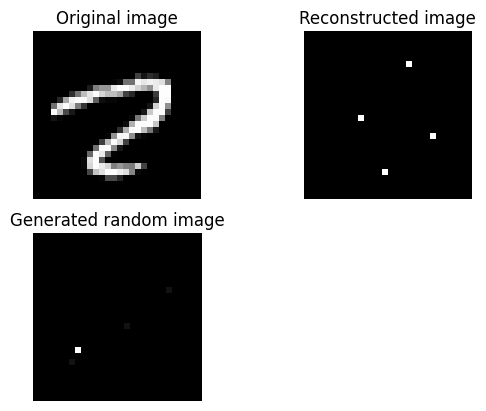

Epoch: 94
------

Train loss: 27.33
Test loss: 26.82
ELBO: 10.894787788391113


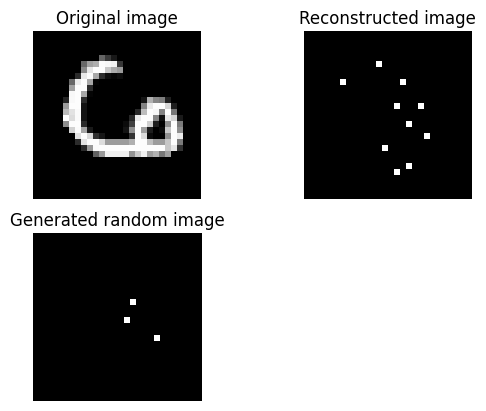

Epoch: 95
------

Train loss: 27.32
Test loss: 26.83
ELBO: 13.297868728637695


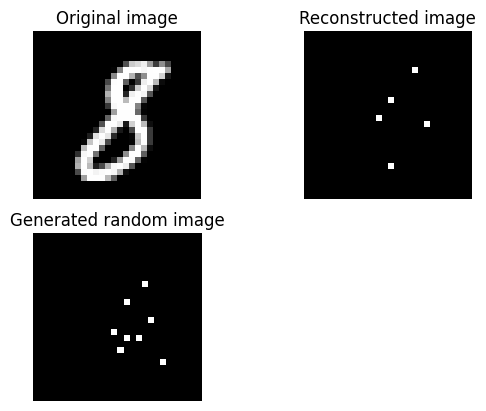

Epoch: 96
------

Train loss: 27.33
Test loss: 26.82
ELBO: 16.490093231201172


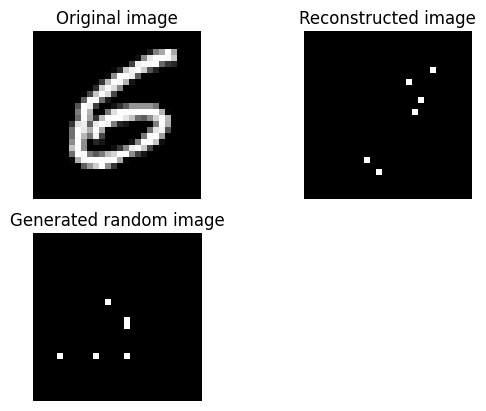

Epoch: 97
------

Train loss: 27.34
Test loss: 26.82
ELBO: 9.09195613861084


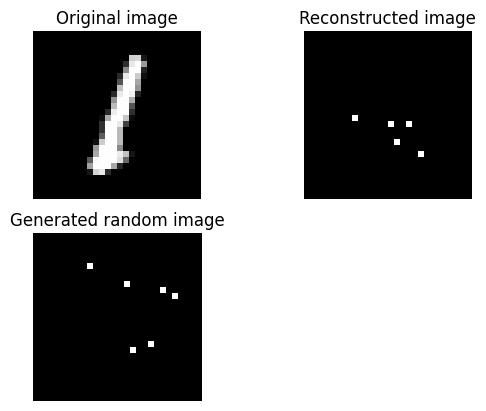

Epoch: 98
------

Train loss: 27.34
Test loss: 26.85
ELBO: 16.333528518676758


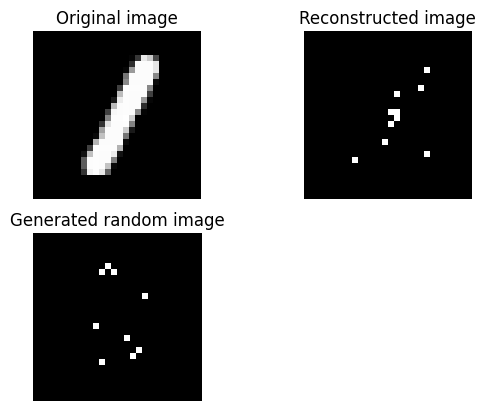

Epoch: 99
------

Train loss: 27.36
Test loss: 26.81
ELBO: 16.5275936126709


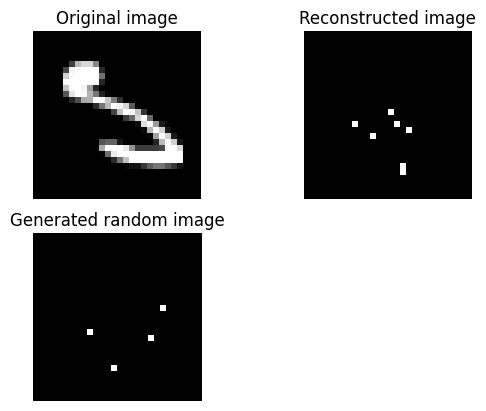

Epoch: 100
------

Train loss: 27.37
Test loss: 26.85
ELBO: 8.578213691711426


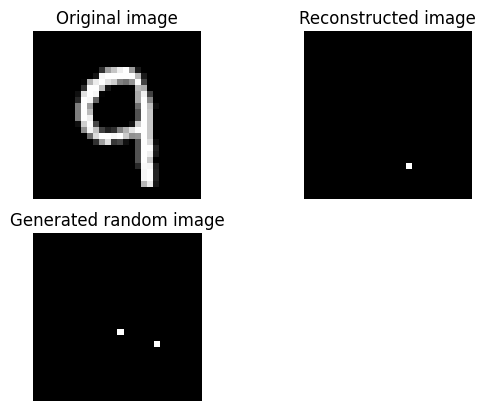

Epoch: 101
------

Train loss: 27.35
Test loss: 26.82
ELBO: 24.247146606445312


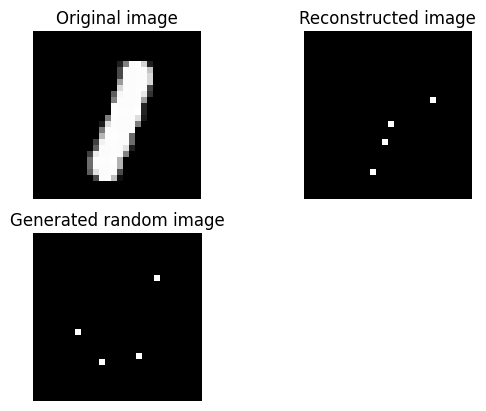

Epoch: 102
------

Train loss: 27.32
Test loss: 26.86
ELBO: 8.327374458312988


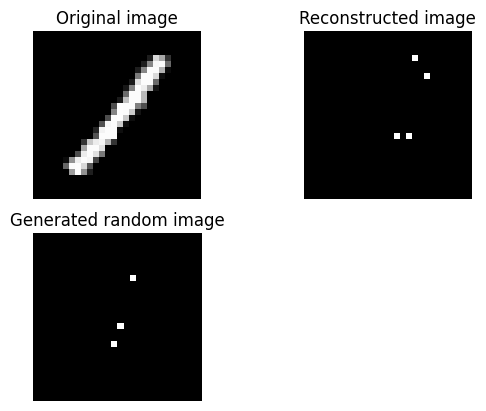

Epoch: 103
------

Train loss: 27.34
Test loss: 26.89
ELBO: 13.383024215698242


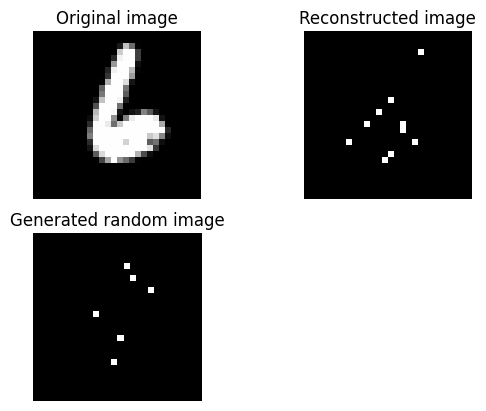

Epoch: 104
------

Train loss: 27.39
Test loss: 26.80
ELBO: 8.559926986694336


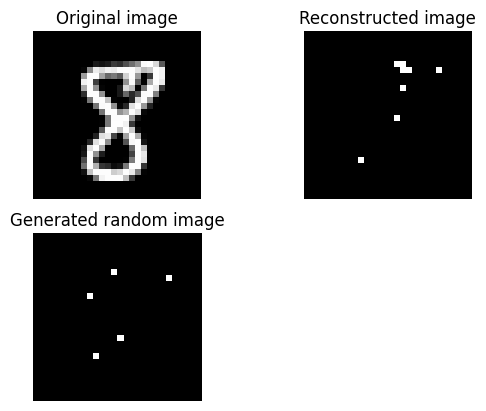

Epoch: 105
------

Train loss: 27.37
Test loss: 26.82
ELBO: 11.185171127319336


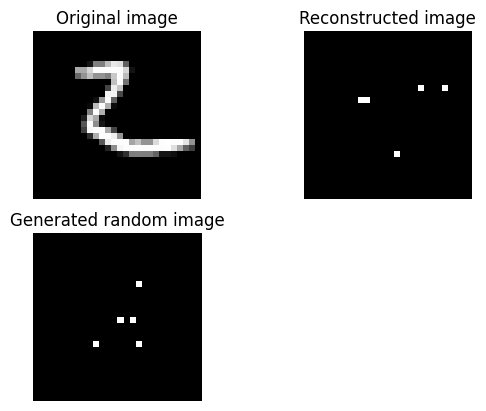

Epoch: 106
------

Train loss: 27.35
Test loss: 26.83
ELBO: 13.880393981933594


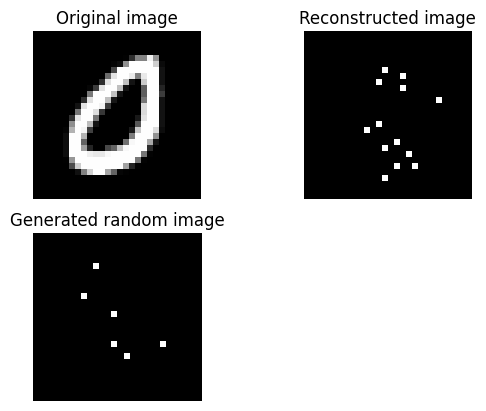

Epoch: 107
------

Train loss: 27.36
Test loss: 26.83
ELBO: 10.065159797668457


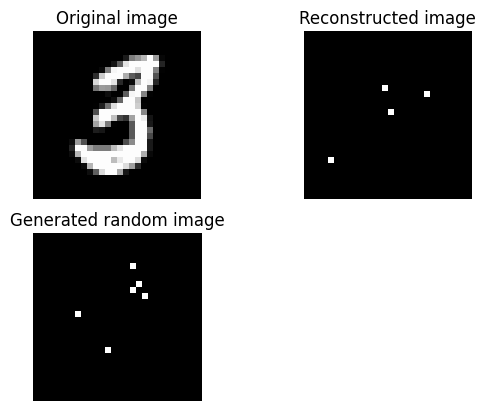

Epoch: 108
------

Train loss: 27.34
Test loss: 26.84
ELBO: 5.313570022583008


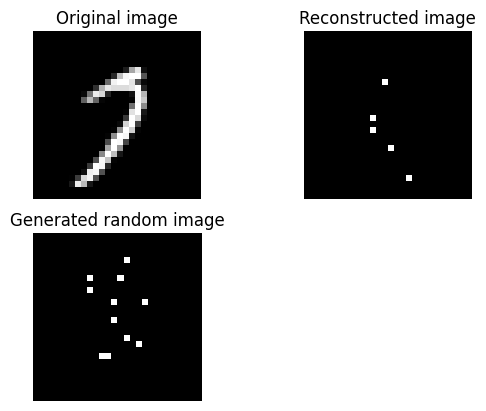

Epoch: 109
------

Train loss: 27.36
Test loss: 26.83
ELBO: 18.20281982421875


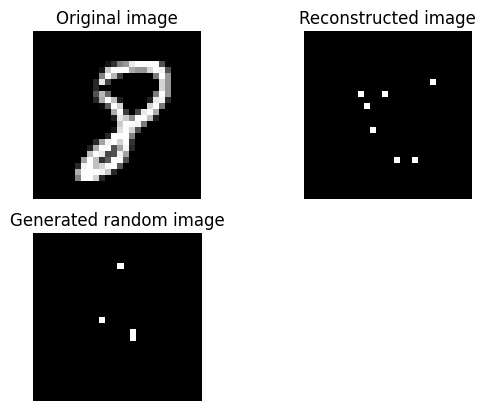

Epoch: 110
------

Train loss: 27.34
Test loss: 26.84
ELBO: 13.152383804321289


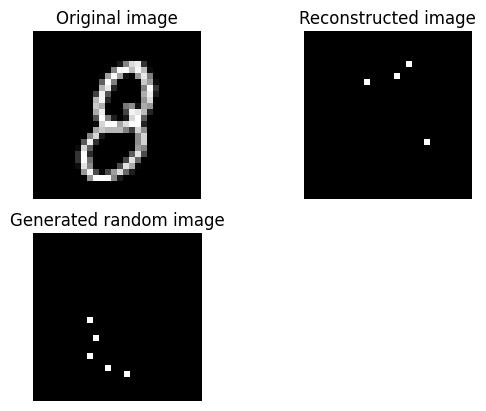

Epoch: 111
------

Train loss: 27.38
Test loss: 26.84
ELBO: 8.631994247436523


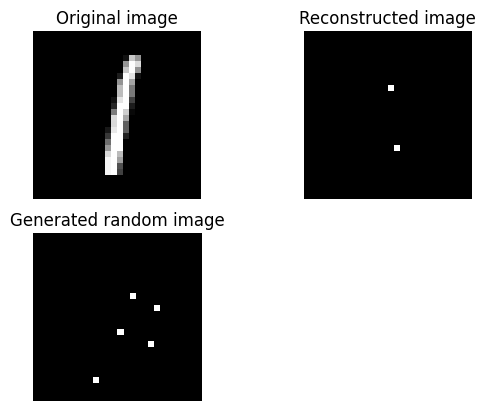

Epoch: 112
------

Train loss: 27.38
Test loss: 26.83
ELBO: 10.199615478515625


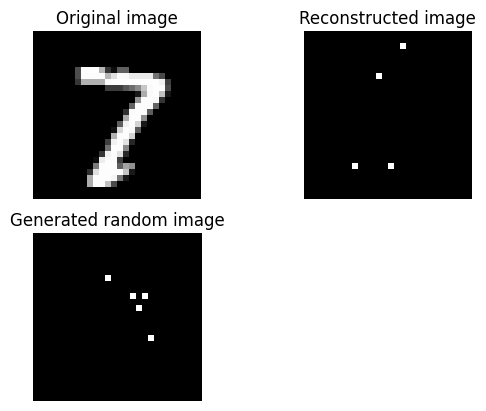

Epoch: 113
------

Train loss: 27.35
Test loss: 26.84
ELBO: 16.854755401611328


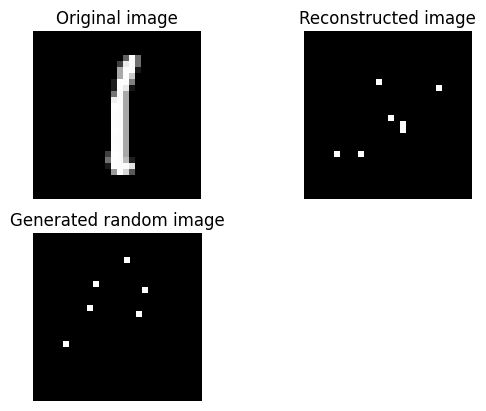

Epoch: 114
------

Train loss: 27.33
Test loss: 26.82
ELBO: 5.454922676086426


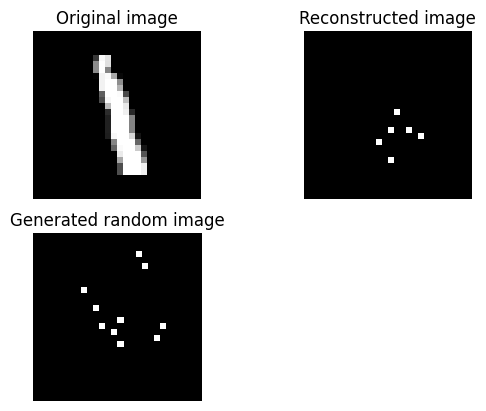

Epoch: 115
------

Train loss: 27.38
Test loss: 26.88
ELBO: 16.92123031616211


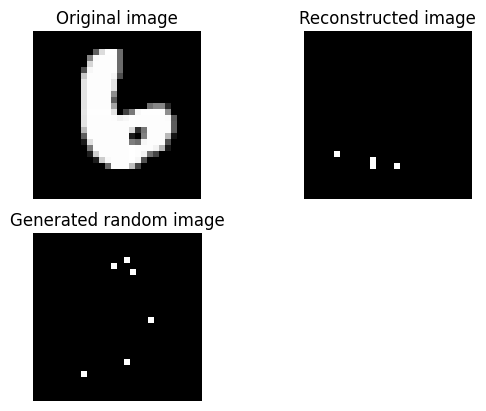

Epoch: 116
------

Train loss: 27.34
Test loss: 26.83
ELBO: 8.453282356262207


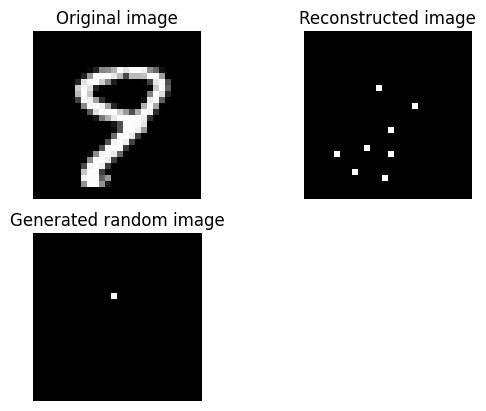

Epoch: 117
------

Train loss: 27.34
Test loss: 26.80
ELBO: 8.954421997070312


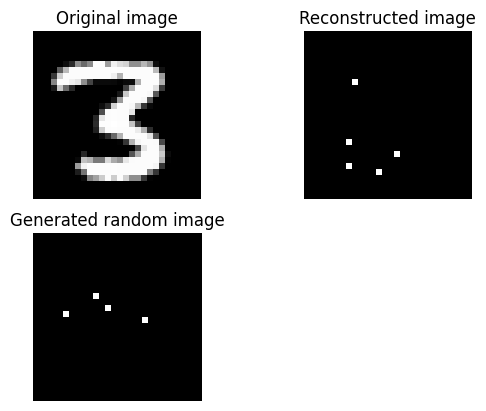

Epoch: 118
------

Train loss: 27.33
Test loss: 26.81
ELBO: 9.506808280944824


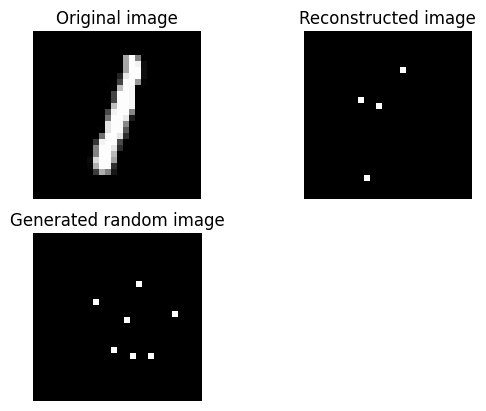

Epoch: 119
------

Train loss: 27.35
Test loss: 26.83
ELBO: 296.2070617675781


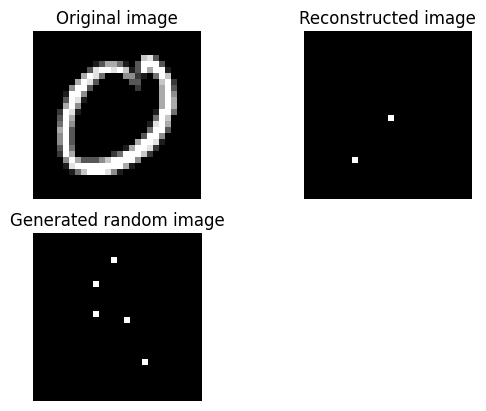

Epoch: 120
------

Train loss: 27.35
Test loss: 26.81
ELBO: 601.4398803710938


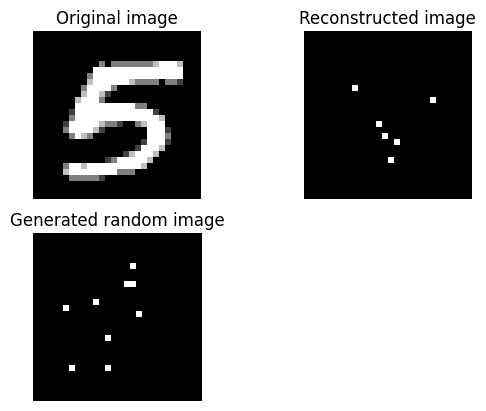

Epoch: 121
------

Train loss: 27.38
Test loss: 26.82
ELBO: 10.097005844116211


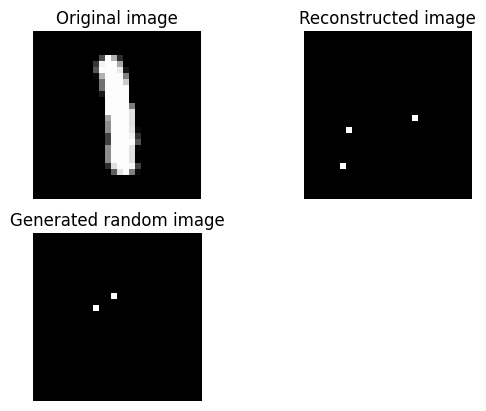

Epoch: 122
------

Train loss: 27.32
Test loss: 26.82
ELBO: 16.824312210083008


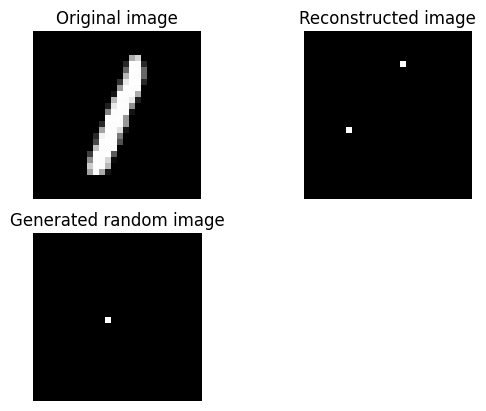

Epoch: 123
------

Train loss: 27.37
Test loss: 26.83
ELBO: 29.996807098388672


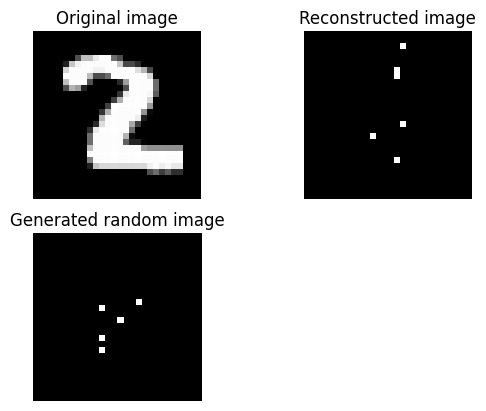

Epoch: 124
------

Train loss: 27.36
Test loss: 26.81
ELBO: 8.943191528320312


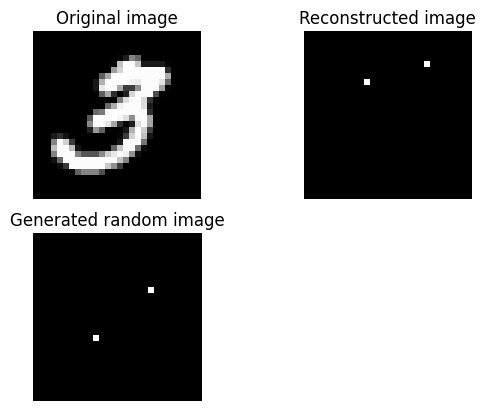

Epoch: 125
------

Train loss: 27.38
Test loss: 26.80
ELBO: 16.268348693847656


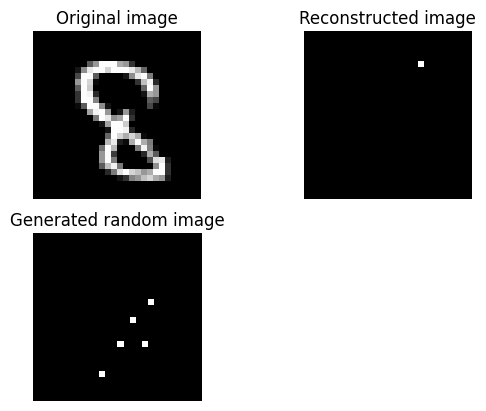

Epoch: 126
------

Train loss: 27.34
Test loss: 26.82
ELBO: 8.79010009765625


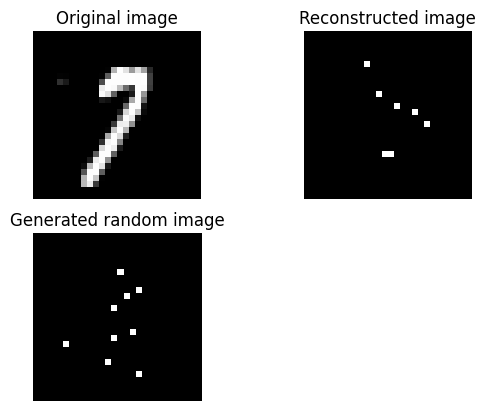

Epoch: 127
------

Train loss: 27.36
Test loss: 26.85
ELBO: 12.246511459350586


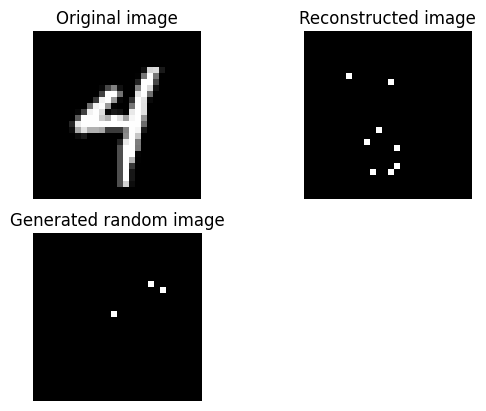

Epoch: 128
------

Train loss: 27.36
Test loss: 26.84
ELBO: 15.682855606079102


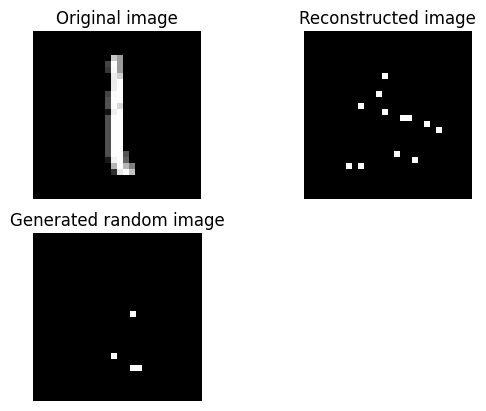

Epoch: 129
------

Train loss: 27.36
Test loss: 26.82
ELBO: 8.818787574768066


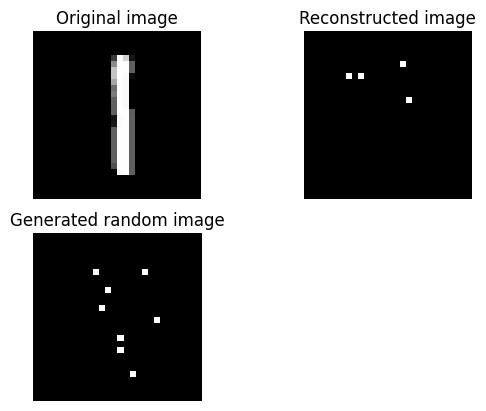

Epoch: 130
------

Train loss: 27.34
Test loss: 26.83
ELBO: 9.164430618286133


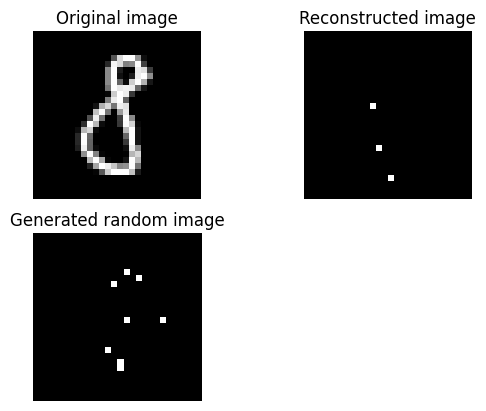

Epoch: 131
------

Train loss: 27.38
Test loss: 26.79
ELBO: 9.096663475036621


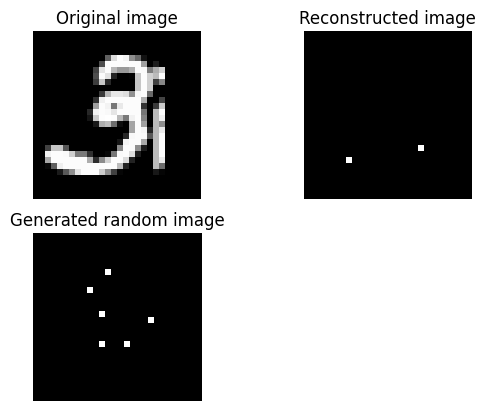

Epoch: 132
------

Train loss: 27.38
Test loss: 26.80
ELBO: 17.372102737426758


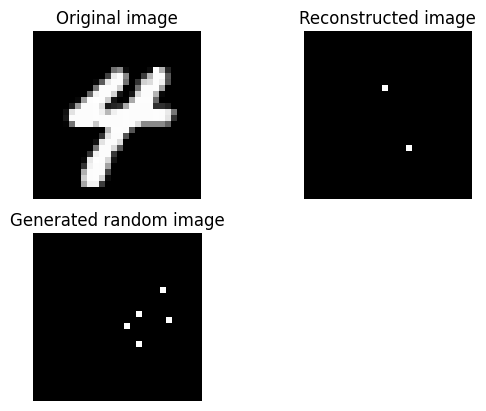

Epoch: 133
------

Train loss: 27.33
Test loss: 26.82
ELBO: 15.881772994995117


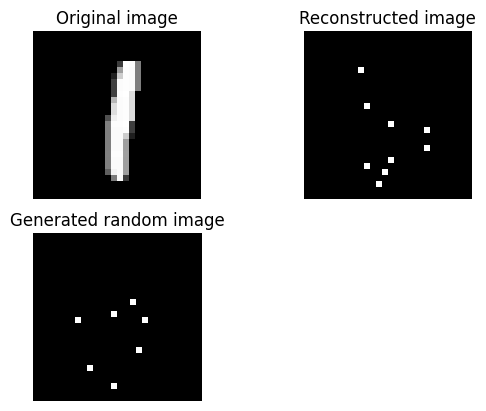

Epoch: 134
------

Train loss: 27.35
Test loss: 26.83
ELBO: 9.043320655822754


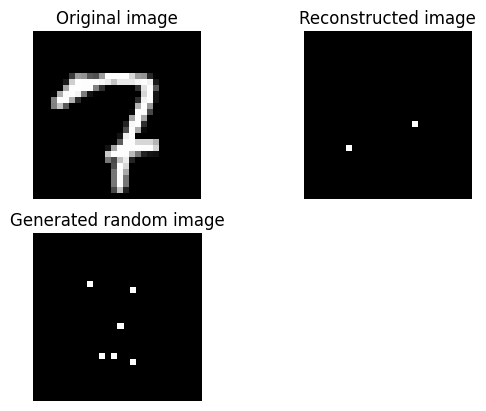

Epoch: 135
------

Train loss: 27.40
Test loss: 26.83
ELBO: 5.399435997009277


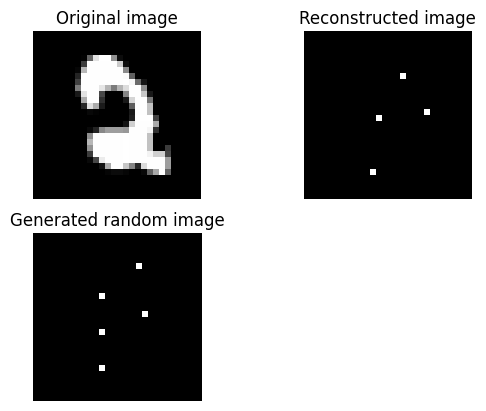

Epoch: 136
------

Train loss: 27.35
Test loss: 26.81
ELBO: 13.867177963256836


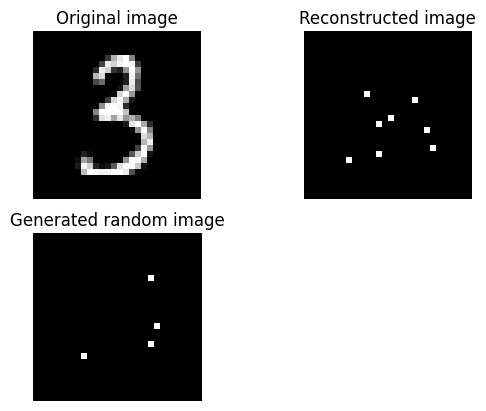

Epoch: 137
------

Train loss: 27.35
Test loss: 26.82
ELBO: 9.765291213989258


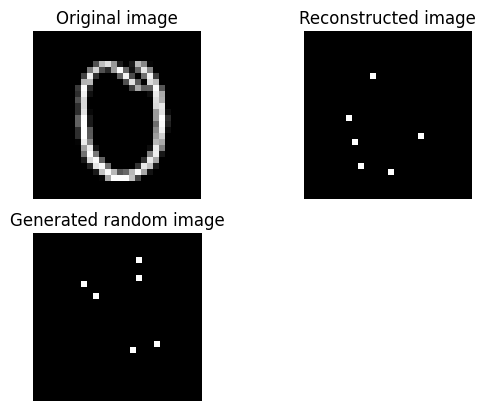

Epoch: 138
------

Train loss: 27.37
Test loss: 26.80
ELBO: 12.26240348815918


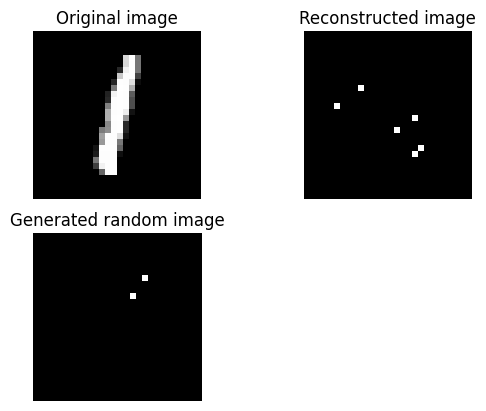

Epoch: 139
------

Train loss: 27.36
Test loss: 26.80
ELBO: 16.55301856994629


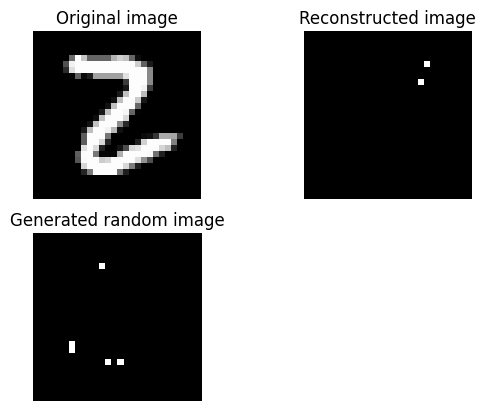

Epoch: 140
------

Train loss: 27.34
Test loss: 26.83
ELBO: 10.585176467895508


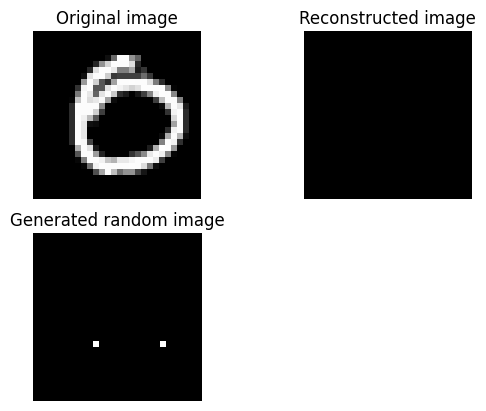

Epoch: 141
------

Train loss: 27.34
Test loss: 26.81
ELBO: 16.759492874145508


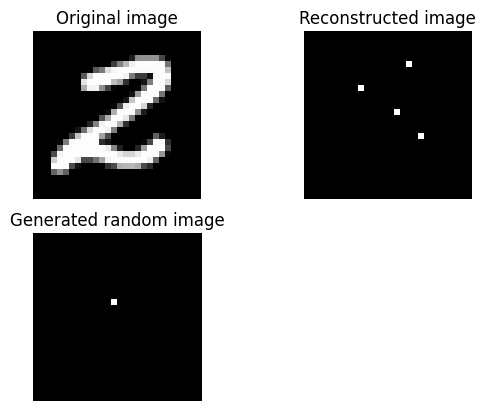

Epoch: 142
------

Train loss: 27.32
Test loss: 26.84
ELBO: 11.202900886535645


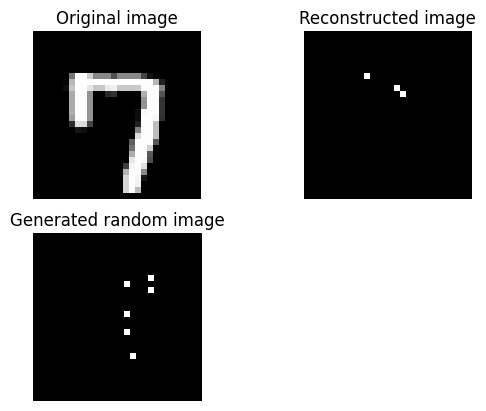

Epoch: 143
------

Train loss: 27.33
Test loss: 26.83
ELBO: 9.135529518127441


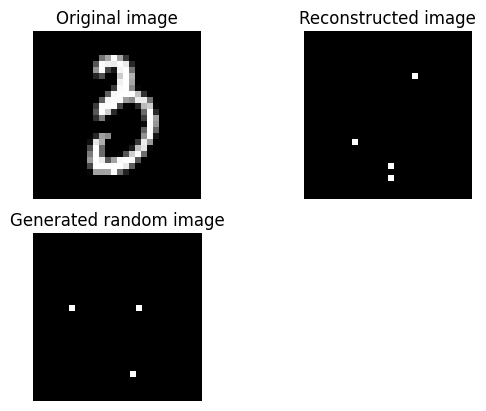

Epoch: 144
------

Train loss: 27.35
Test loss: 26.81
ELBO: 13.348532676696777


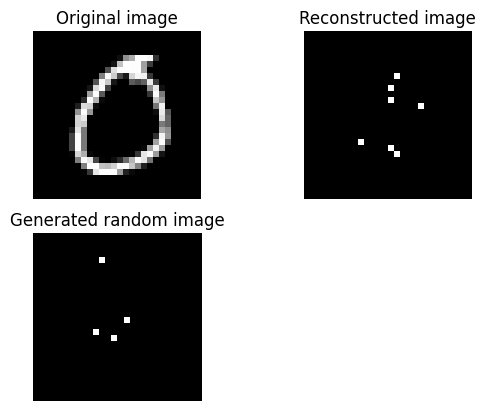

Epoch: 145
------

Train loss: 27.34
Test loss: 26.85
ELBO: 11.152408599853516


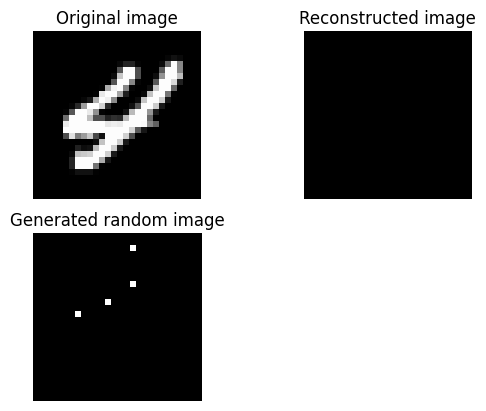

Epoch: 146
------

Train loss: 27.34
Test loss: 26.80
ELBO: 13.38248348236084


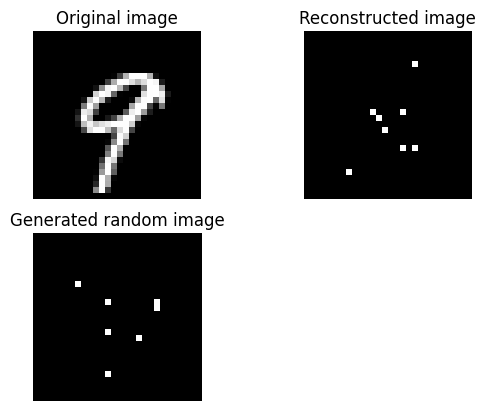

Epoch: 147
------

Train loss: 27.35
Test loss: 26.82
ELBO: 9.26785659790039


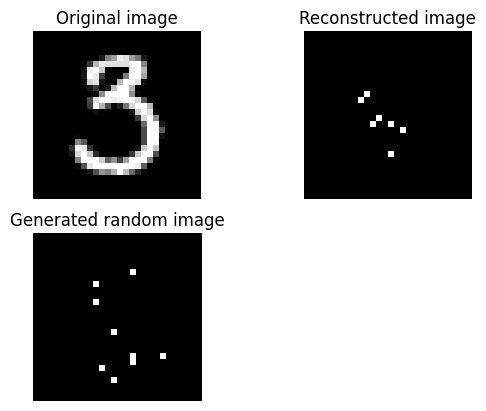

Epoch: 148
------

Train loss: 27.37
Test loss: 26.82
ELBO: 9.645490646362305


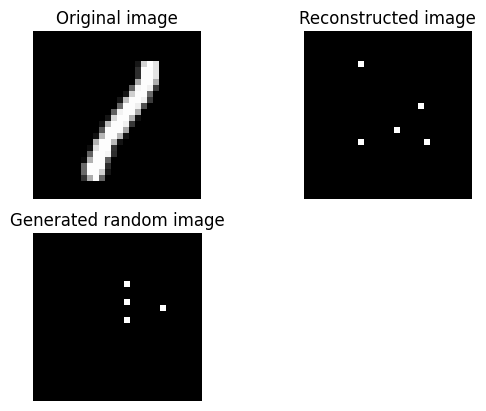

Epoch: 149
------

Train loss: 27.33
Test loss: 26.83
ELBO: 368.0462951660156


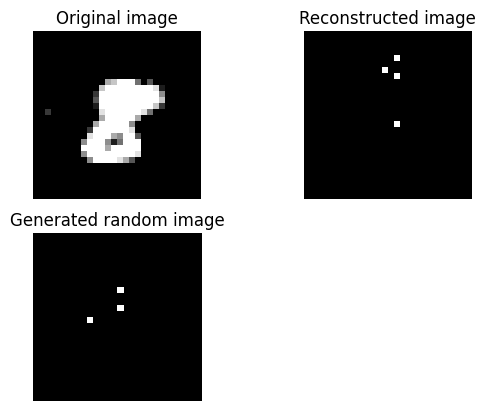

Epoch: 150
------

Train loss: 27.39
Test loss: 26.79
ELBO: 8.774676322937012


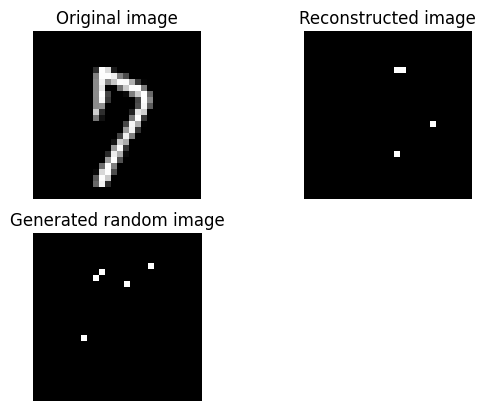

Epoch: 151
------

Train loss: 27.37
Test loss: 26.82
ELBO: 9.191009521484375


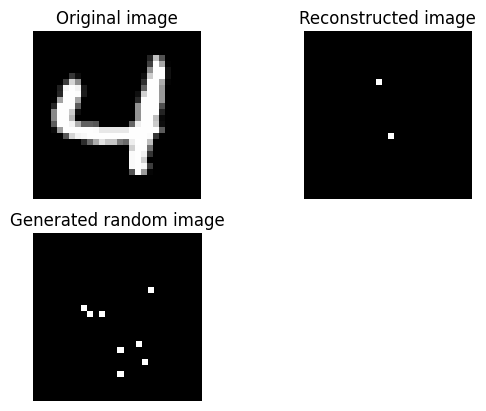

Epoch: 152
------

Train loss: 27.34
Test loss: 26.82
ELBO: 9.148246765136719


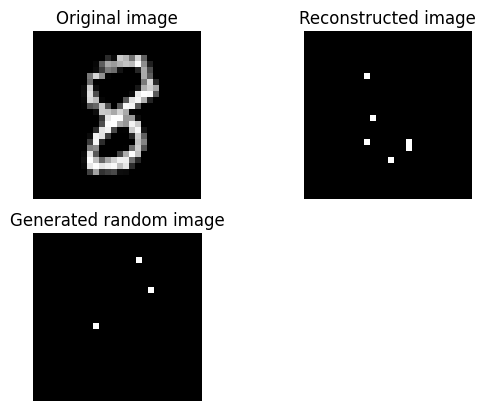

Epoch: 153
------

Train loss: 27.33
Test loss: 26.83
ELBO: 5.425856590270996


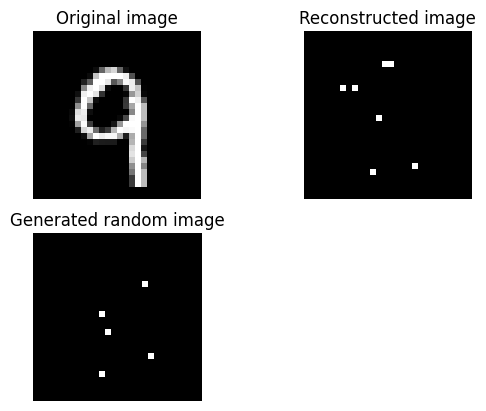

Epoch: 154
------

Train loss: 27.36
Test loss: 26.81
ELBO: 437.62677001953125


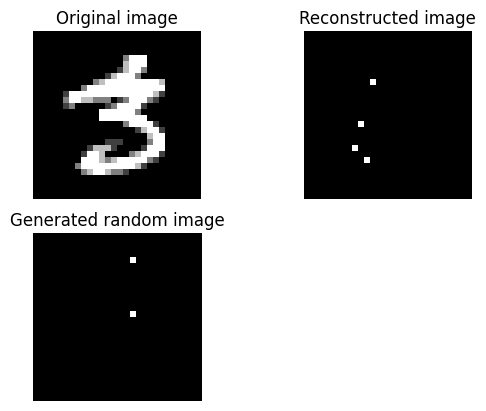

Epoch: 155
------

Train loss: 27.36
Test loss: 26.85
ELBO: 24.638654708862305


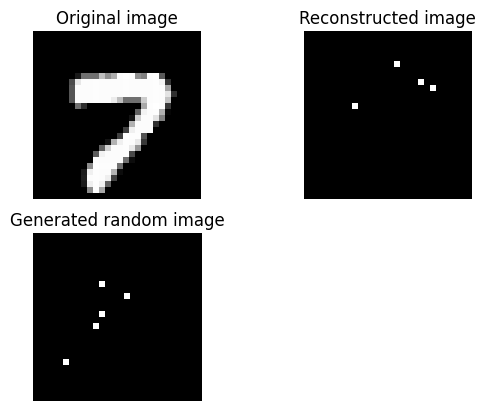

Epoch: 156
------

Train loss: 27.34
Test loss: 26.81
ELBO: 17.35196304321289


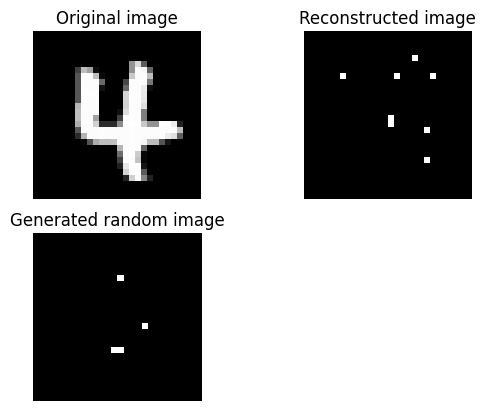

Epoch: 157
------

Train loss: 27.34
Test loss: 26.82
ELBO: 549.0314331054688


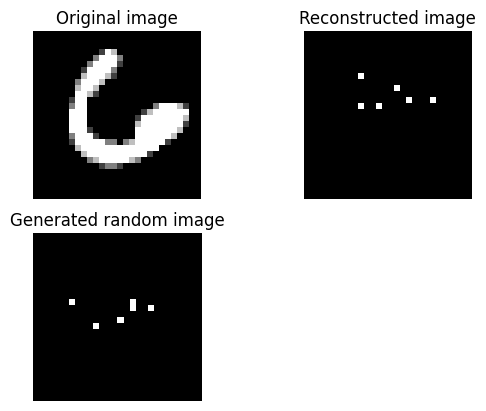

Epoch: 158
------

Train loss: 27.40
Test loss: 26.84
ELBO: 5.16798210144043


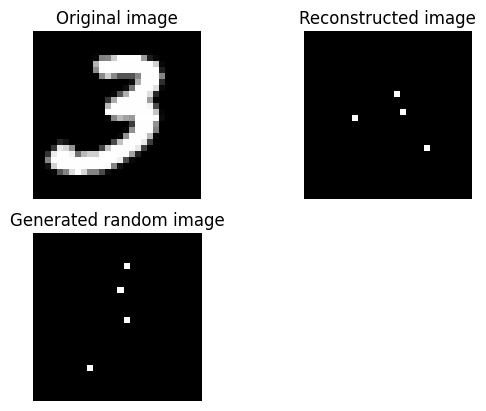

Epoch: 159
------

Train loss: 27.34
Test loss: 26.83
ELBO: 14.376298904418945


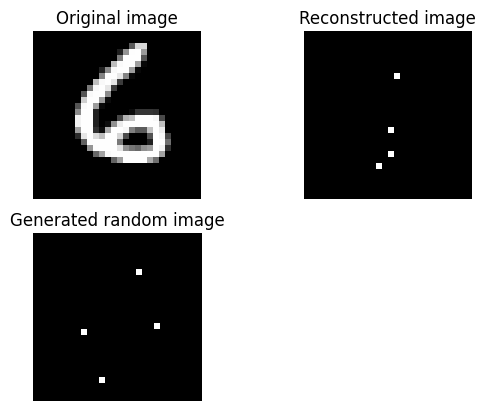

Epoch: 160
------

Train loss: 27.33
Test loss: 26.82
ELBO: 8.97861385345459


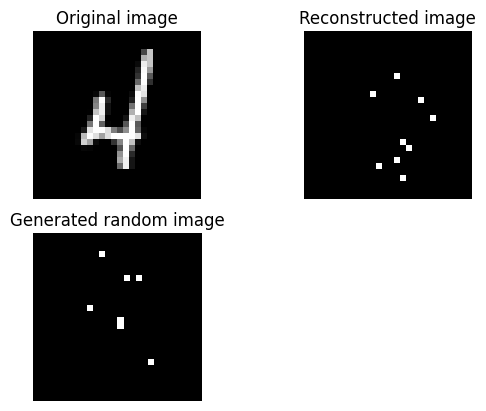

Epoch: 161
------

Train loss: 27.34
Test loss: 26.84
ELBO: 8.851634979248047


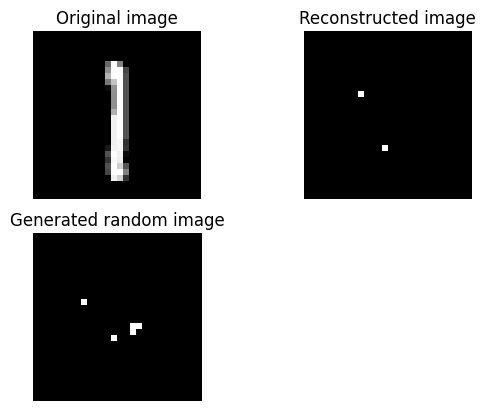

Epoch: 162
------

Train loss: 27.33
Test loss: 26.80
ELBO: 9.105549812316895


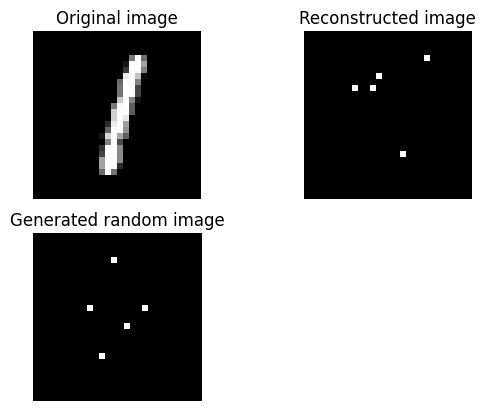

Epoch: 163
------

Train loss: 27.36
Test loss: 26.82
ELBO: 11.506038665771484


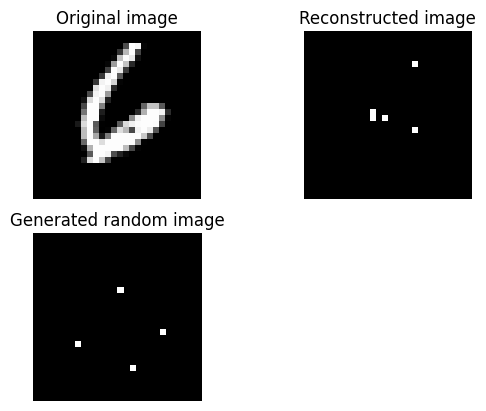

Epoch: 164
------

Train loss: 27.31
Test loss: 26.82
ELBO: 8.458512306213379


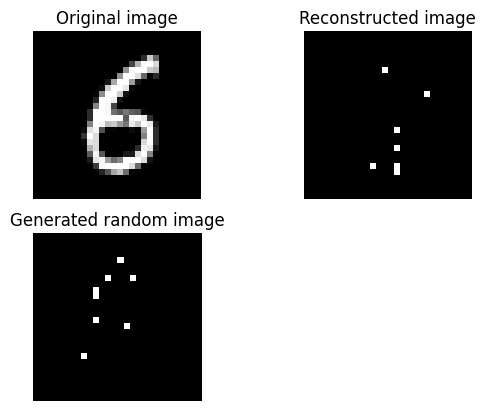

Epoch: 165
------

Train loss: 27.33
Test loss: 26.82
ELBO: 8.920230865478516


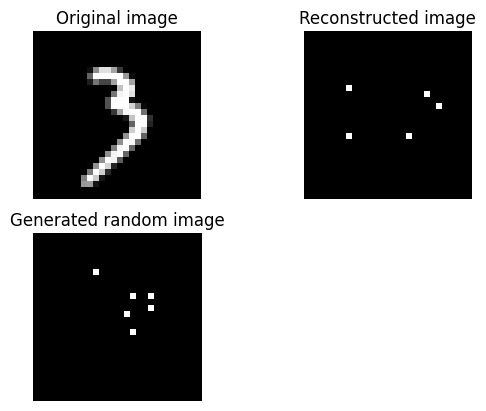

Epoch: 166
------

Train loss: 27.38
Test loss: 26.84
ELBO: 11.688051223754883


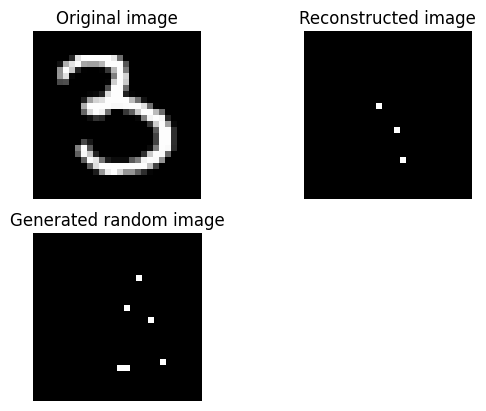

Epoch: 167
------

Train loss: 27.38
Test loss: 26.82
ELBO: 10.345391273498535


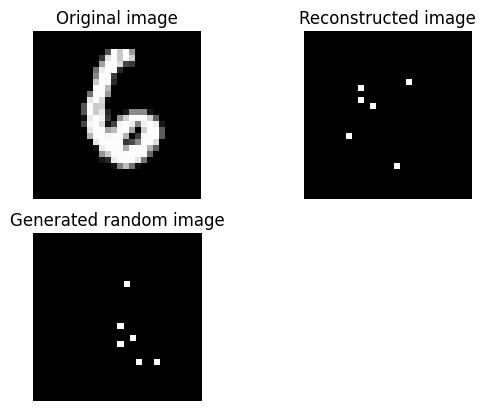

Epoch: 168
------

Train loss: 27.33
Test loss: 26.82
ELBO: 8.6083984375


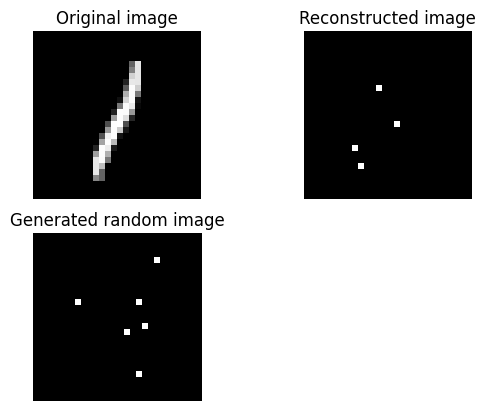

Epoch: 169
------

Train loss: 27.34
Test loss: 26.84
ELBO: 21.269256591796875


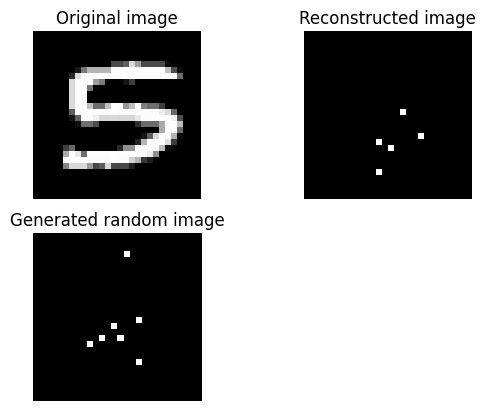

Epoch: 170
------

Train loss: 27.35
Test loss: 26.83
ELBO: 8.907499313354492


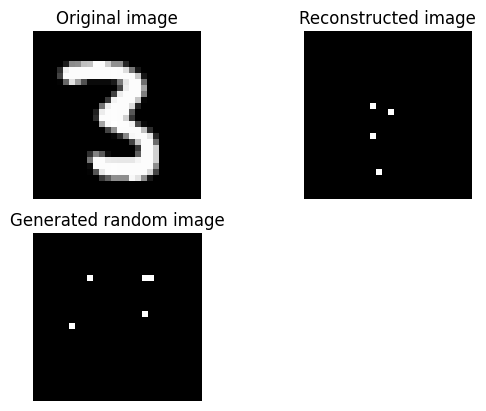

Epoch: 171
------

Train loss: 27.32
Test loss: 26.82
ELBO: 4.988345146179199


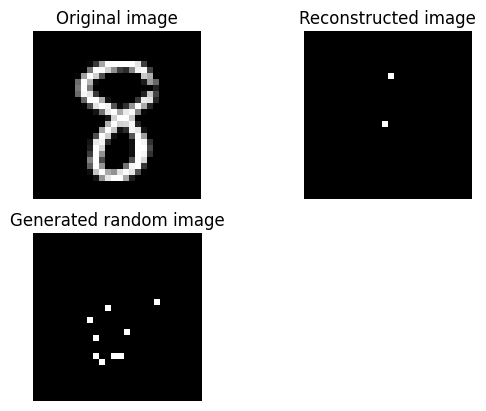

Epoch: 172
------

Train loss: 27.35
Test loss: 26.83
ELBO: 21.16094398498535


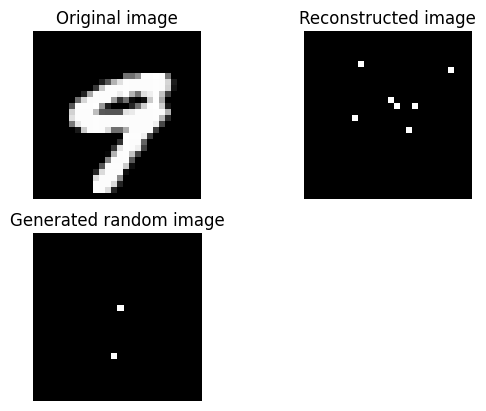

Epoch: 173
------

Train loss: 27.34
Test loss: 26.80
ELBO: 5.144292831420898


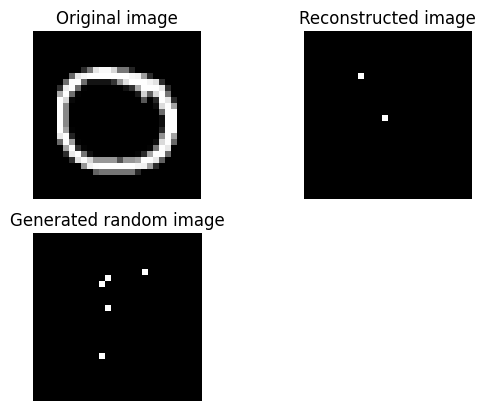

Epoch: 174
------

Train loss: 27.36
Test loss: 26.81
ELBO: 5.271303176879883


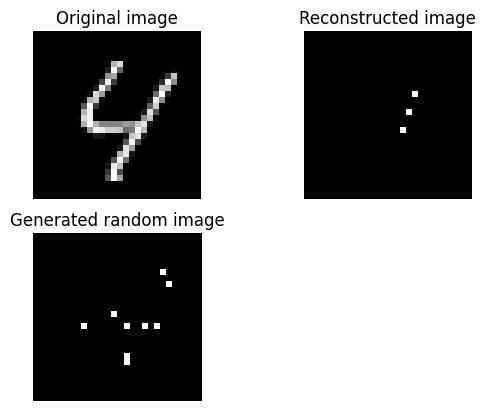

Epoch: 175
------

Train loss: 27.35
Test loss: 26.84
ELBO: 9.915238380432129


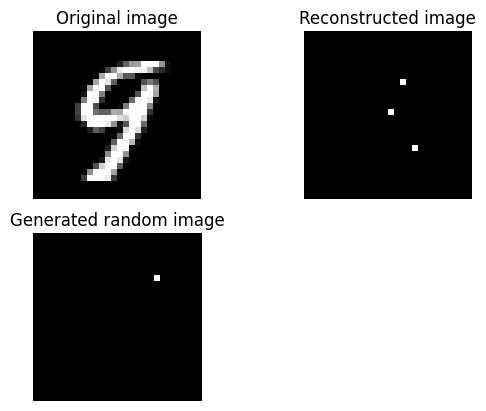

Epoch: 176
------

Train loss: 27.36
Test loss: 26.82
ELBO: 5.222508430480957


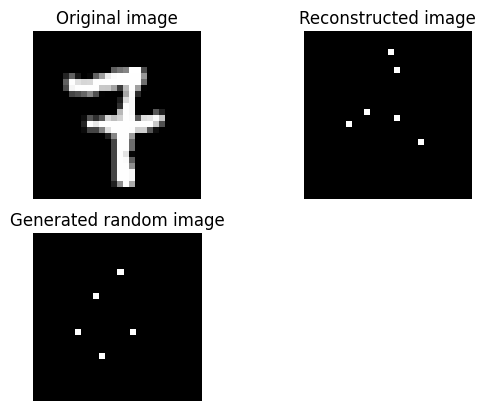

Epoch: 177
------

Train loss: 27.35
Test loss: 26.82
ELBO: 8.719722747802734


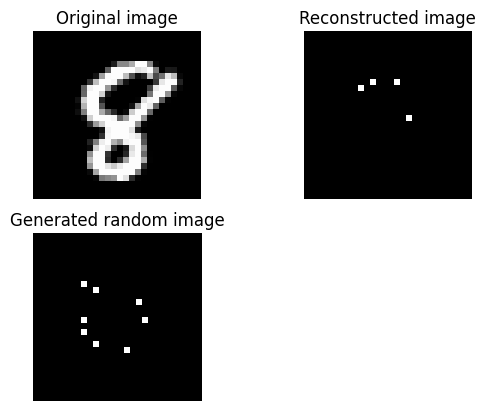

Epoch: 178
------

Train loss: 27.39
Test loss: 26.79
ELBO: 9.442864418029785


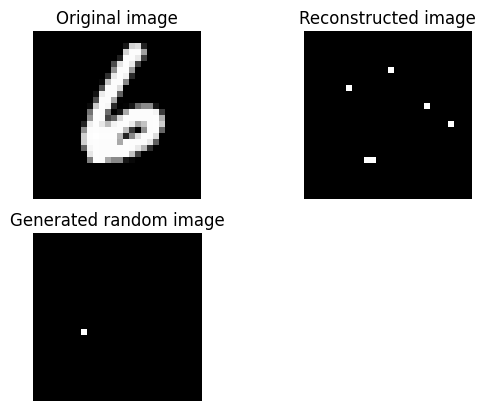

Epoch: 179
------

Train loss: 27.35
Test loss: 26.80
ELBO: 11.531519889831543


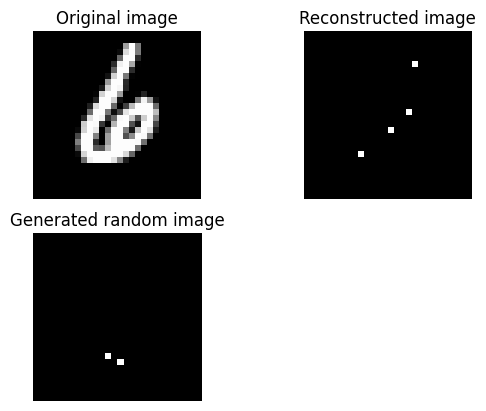

Epoch: 180
------

Train loss: 27.33
Test loss: 26.84
ELBO: 14.0442533493042


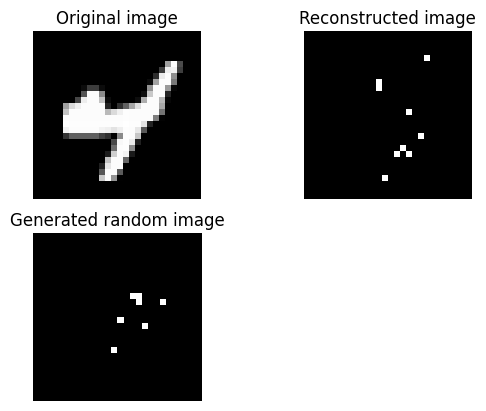

Epoch: 181
------

Train loss: 27.36
Test loss: 26.83
ELBO: 8.89175033569336


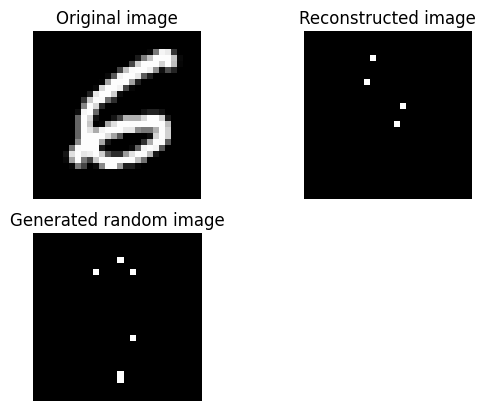

Epoch: 182
------

Train loss: 27.36
Test loss: 26.79
ELBO: 23.841644287109375


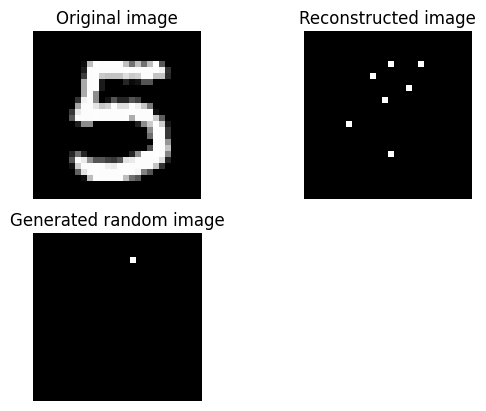

Epoch: 183
------

Train loss: 27.32
Test loss: 26.81
ELBO: 16.70138168334961


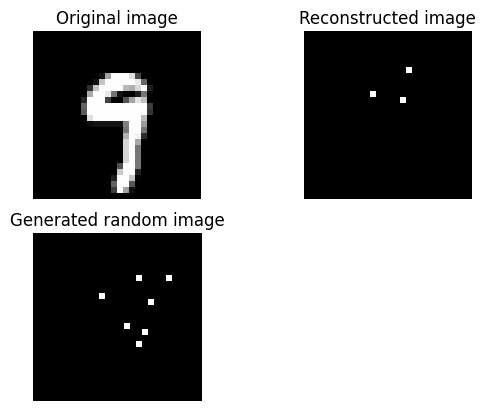

Epoch: 184
------

Train loss: 27.33
Test loss: 26.84
ELBO: 13.185640335083008


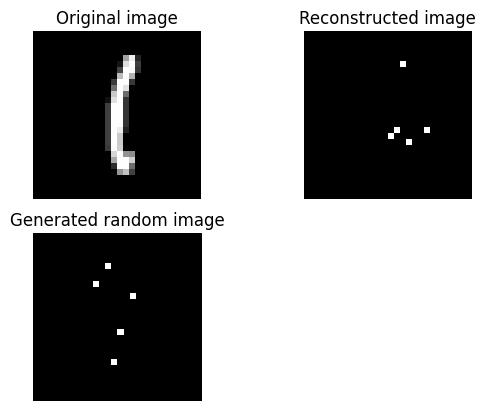

Epoch: 185
------

Train loss: 27.34
Test loss: 26.83
ELBO: 12.068029403686523


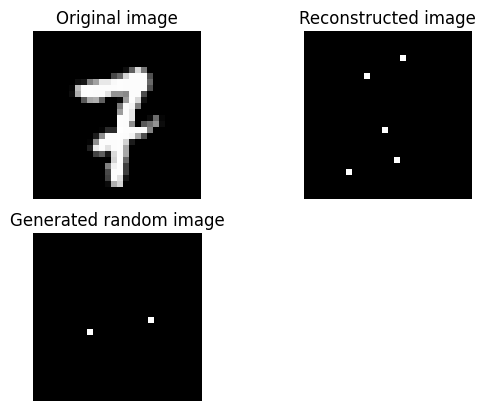

Epoch: 186
------

Train loss: 27.34
Test loss: 26.79
ELBO: 8.548652648925781


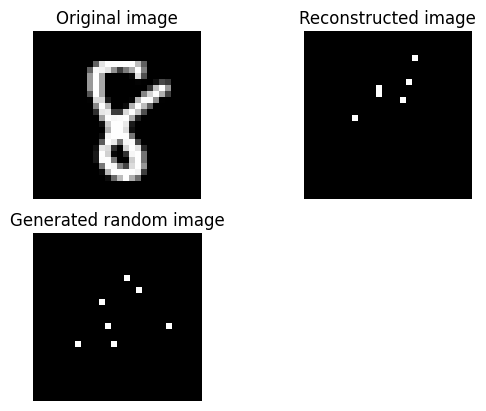

Epoch: 187
------

Train loss: 27.37
Test loss: 26.80
ELBO: 8.661518096923828


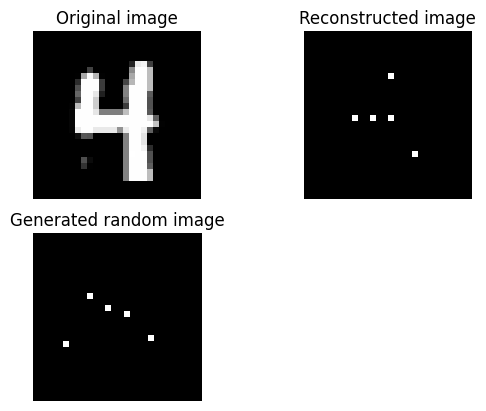

Epoch: 188
------

Train loss: 27.34
Test loss: 26.82
ELBO: 16.88564682006836


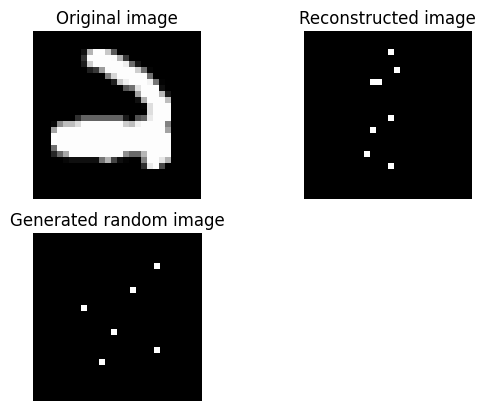

Epoch: 189
------

Train loss: 27.33
Test loss: 26.79
ELBO: 14.650487899780273


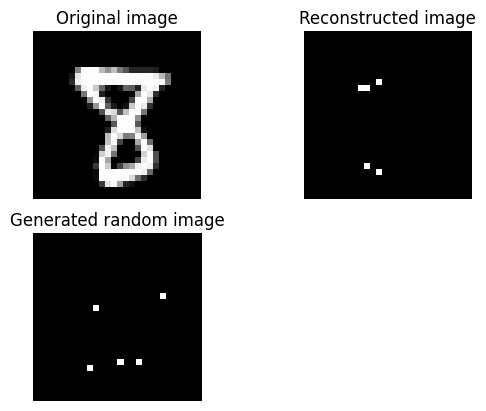

Epoch: 190
------

Train loss: 27.33
Test loss: 26.81
ELBO: 110.13932037353516


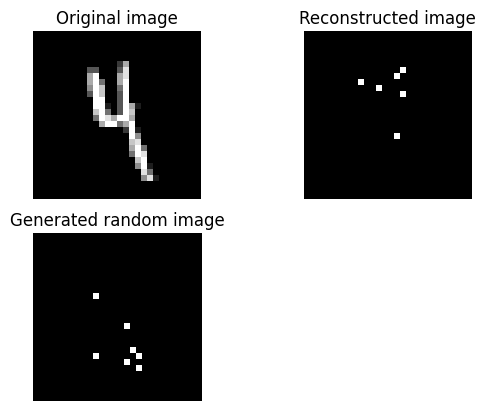

Epoch: 191
------

Train loss: 27.33
Test loss: 26.79
ELBO: 5.1253228187561035


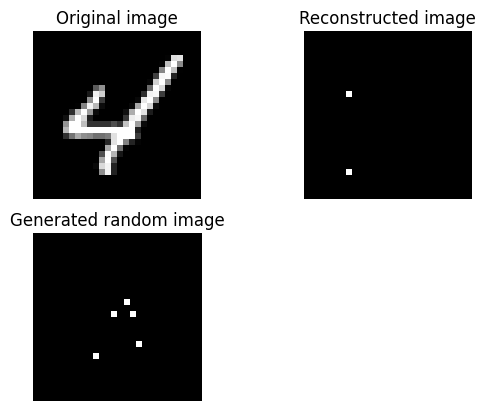

Epoch: 192
------

Train loss: 27.34
Test loss: 26.81
ELBO: 9.193099975585938


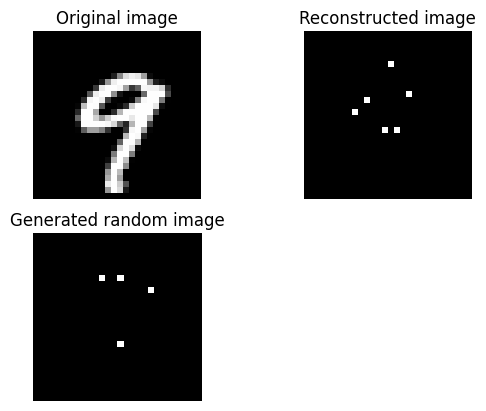

Epoch: 193
------

Train loss: 27.32
Test loss: 26.80
ELBO: 9.220664024353027


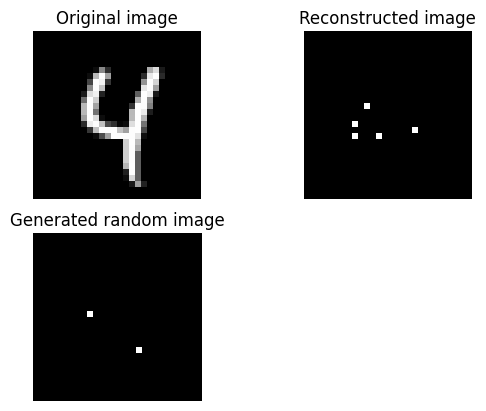

Epoch: 194
------

Train loss: 27.35
Test loss: 26.82
ELBO: 9.178593635559082


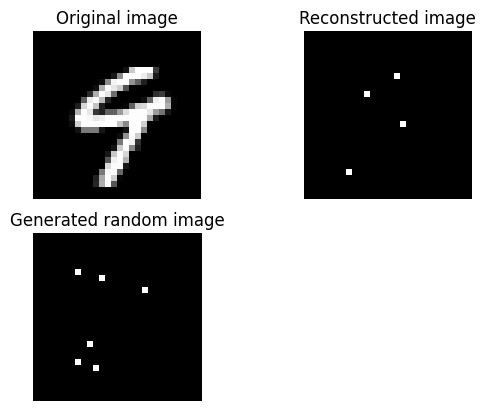

Epoch: 195
------

Train loss: 27.35
Test loss: 26.83
ELBO: 12.457759857177734


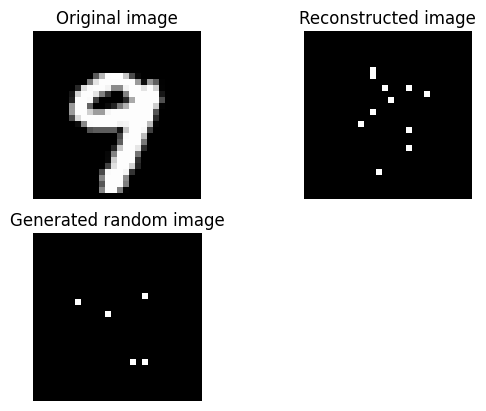

Epoch: 196
------

Train loss: 27.31
Test loss: 26.77
ELBO: 9.257270812988281


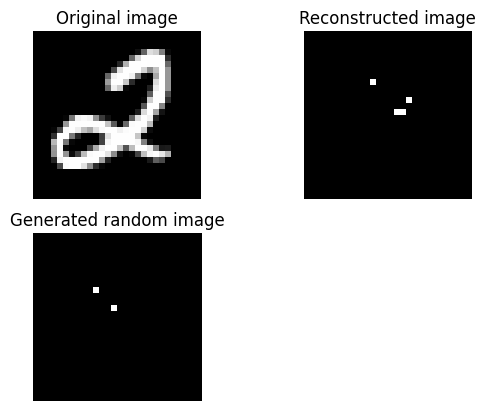

Epoch: 197
------

Train loss: 27.36
Test loss: 26.80
ELBO: 16.713092803955078


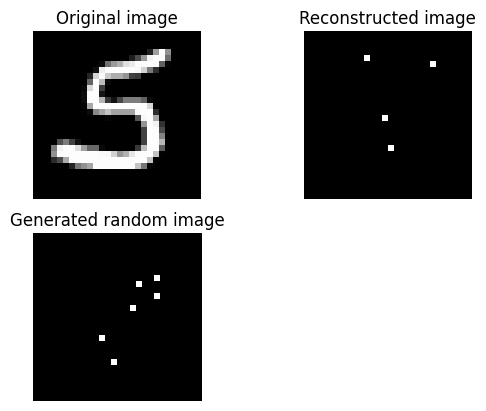

Epoch: 198
------

Train loss: 27.34
Test loss: 26.81
ELBO: 13.080253601074219


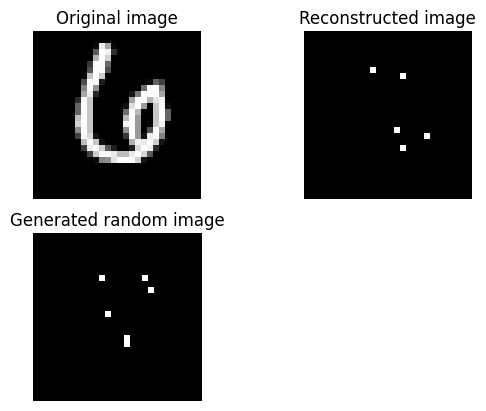

Epoch: 199
------

Train loss: 27.34
Test loss: 26.83
ELBO: 9.62895679473877


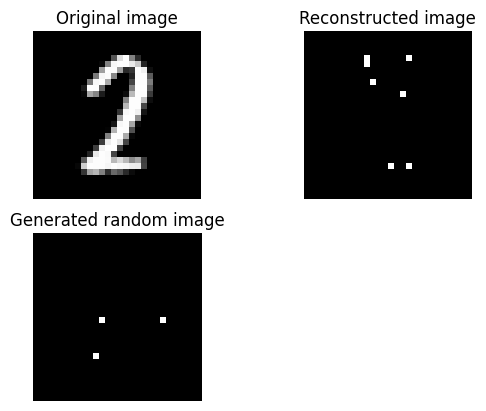

Epoch: 200
------

Train loss: 27.35
Test loss: 26.79
ELBO: 13.262261390686035


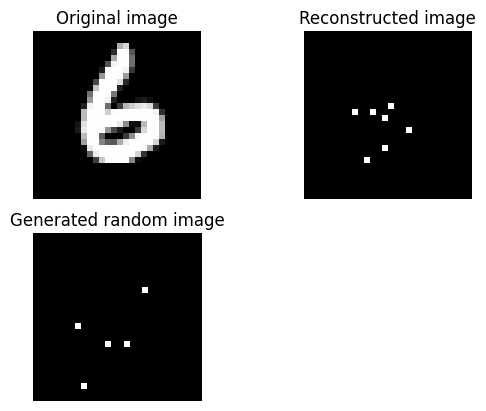

Epoch: 201
------

Train loss: 27.34
Test loss: 26.80
ELBO: 123.6283950805664


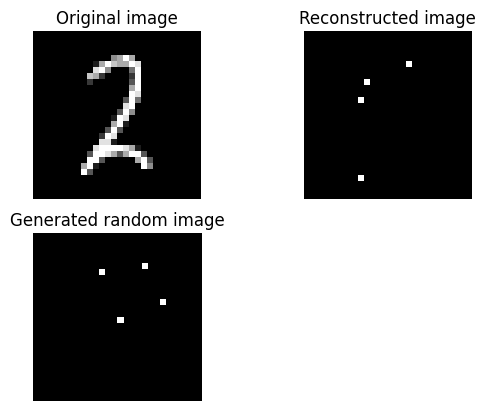

Epoch: 202
------

Train loss: 27.35
Test loss: 26.80
ELBO: 25.065345764160156


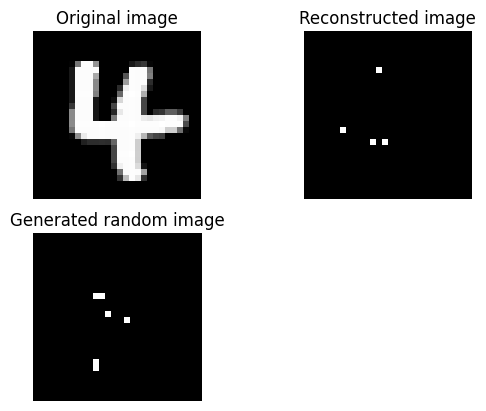

Epoch: 203
------

Train loss: 27.33
Test loss: 26.82
ELBO: 8.407964706420898


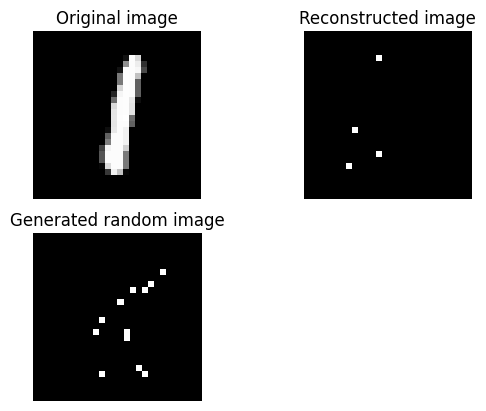

Epoch: 204
------

Train loss: 27.35
Test loss: 26.86
ELBO: 9.242865562438965


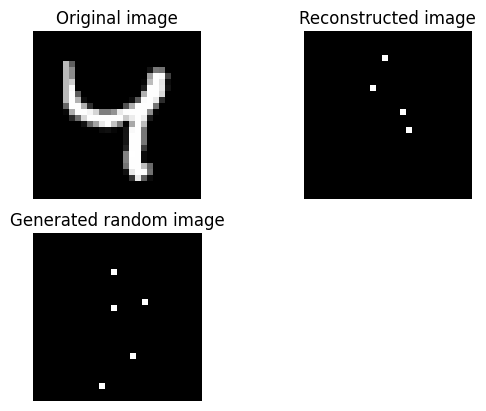

Epoch: 205
------

Train loss: 27.32
Test loss: 26.81
ELBO: 12.300250053405762


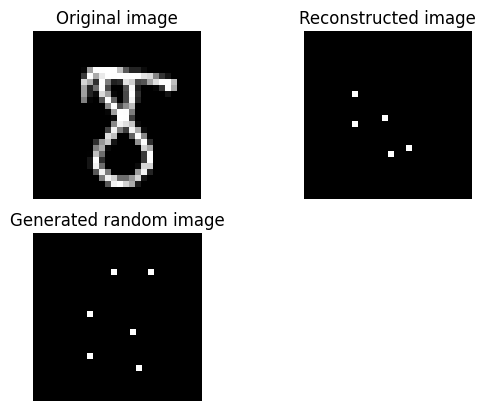

Epoch: 206
------

Train loss: 27.34
Test loss: 26.80
ELBO: 312.6611022949219


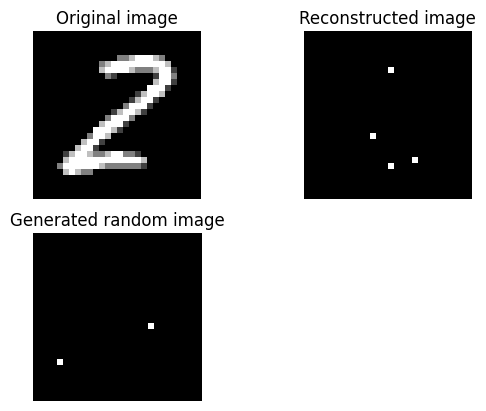

Epoch: 207
------

Train loss: 27.34
Test loss: 26.83
ELBO: 9.066644668579102


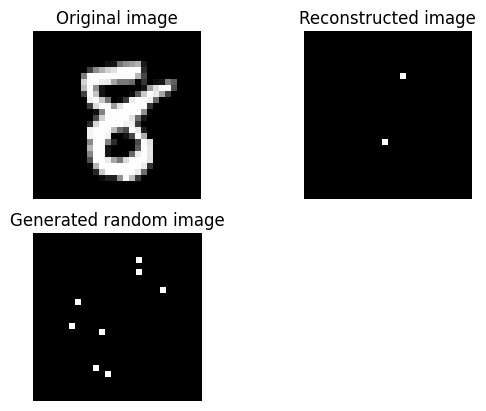

Epoch: 208
------

Train loss: 27.34
Test loss: 26.79
ELBO: 9.329936027526855


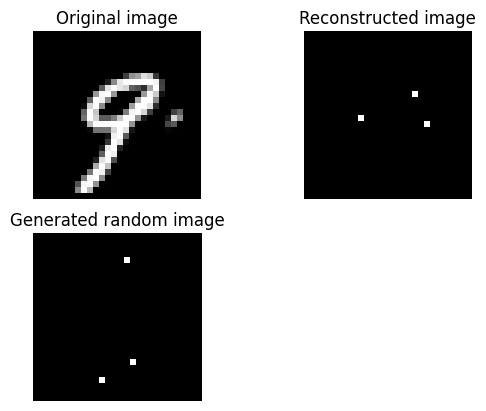

Epoch: 209
------

Train loss: 27.38
Test loss: 26.81
ELBO: 12.896248817443848


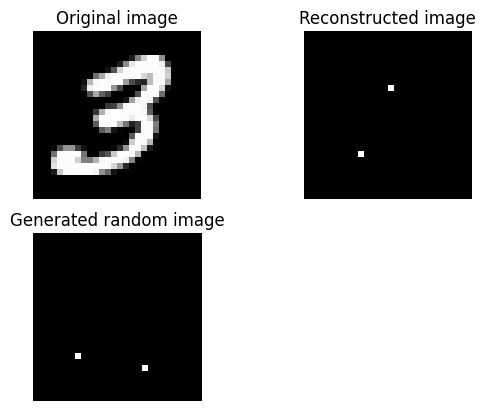

Epoch: 210
------

Train loss: 27.34
Test loss: 26.80
ELBO: 8.574724197387695


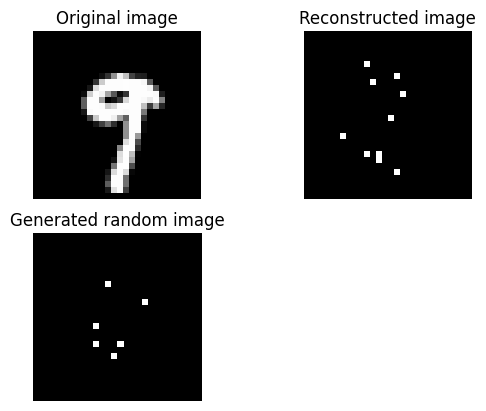

Epoch: 211
------

Train loss: 27.32
Test loss: 26.82
ELBO: 12.987537384033203


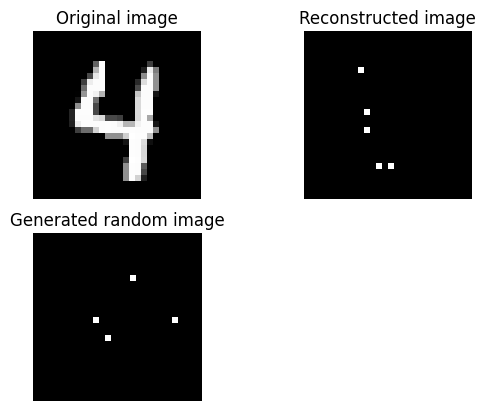

Epoch: 212
------

Train loss: 27.32
Test loss: 26.82
ELBO: 8.957060813903809


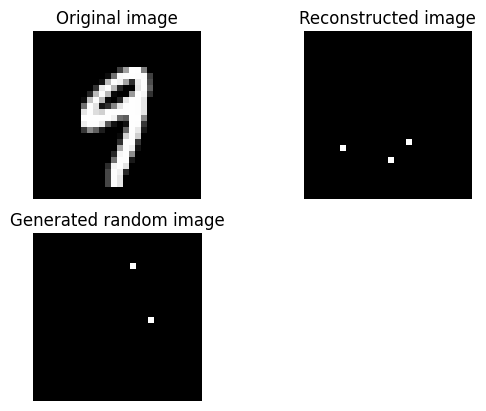

Epoch: 213
------

Train loss: 27.34
Test loss: 26.81
ELBO: 9.51264762878418


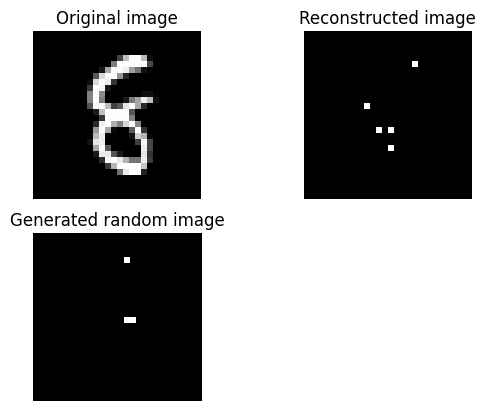

Epoch: 214
------

Train loss: 27.33
Test loss: 26.79
ELBO: 5.237756729125977


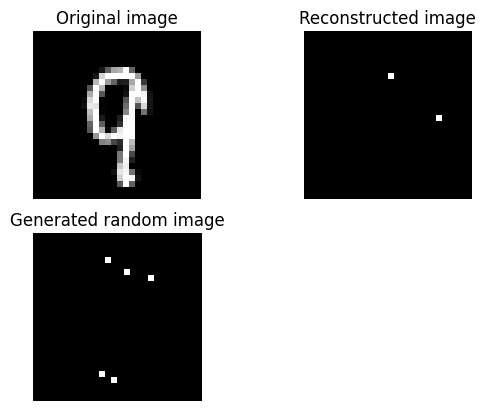

Epoch: 215
------

Train loss: 27.34
Test loss: 26.78
ELBO: 9.312397003173828


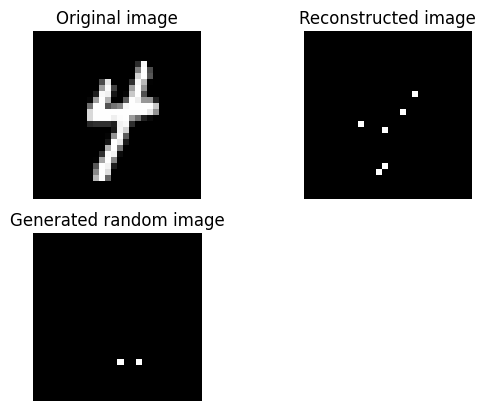

Epoch: 216
------

Train loss: 27.34
Test loss: 26.85
ELBO: 17.377338409423828


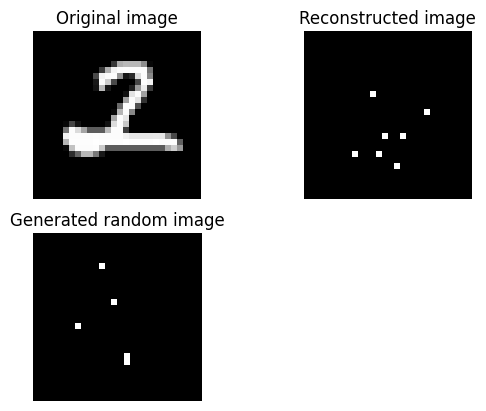

Epoch: 217
------

Train loss: 27.32
Test loss: 26.83
ELBO: 4.937114715576172


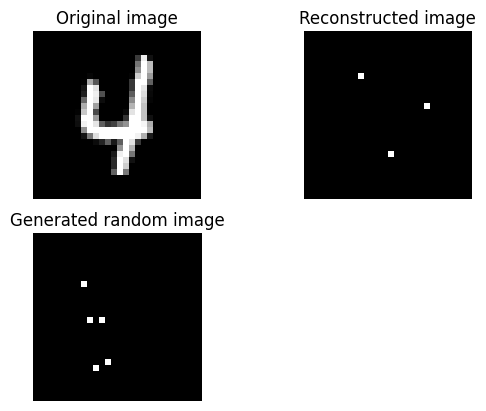

Epoch: 218
------

Train loss: 27.32
Test loss: 26.79
ELBO: 9.131305694580078


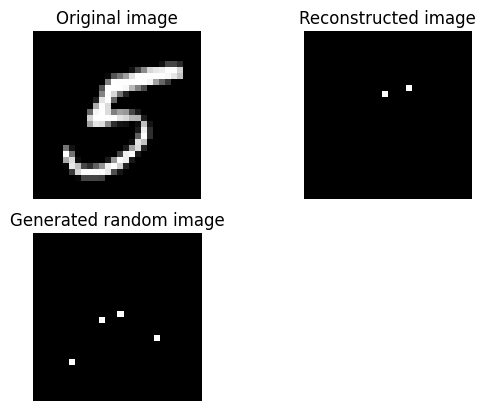

Epoch: 219
------

Train loss: 27.34
Test loss: 26.80
ELBO: 35.628929138183594


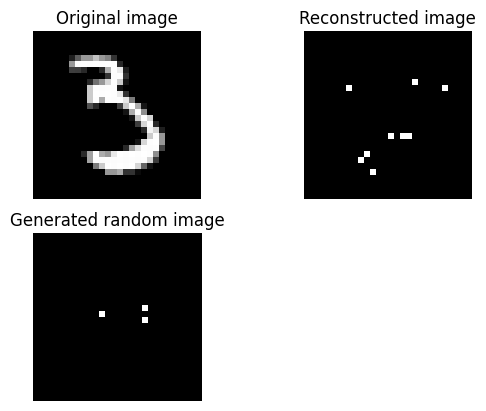

Epoch: 220
------

Train loss: 27.35
Test loss: 26.82
ELBO: 20.292095184326172


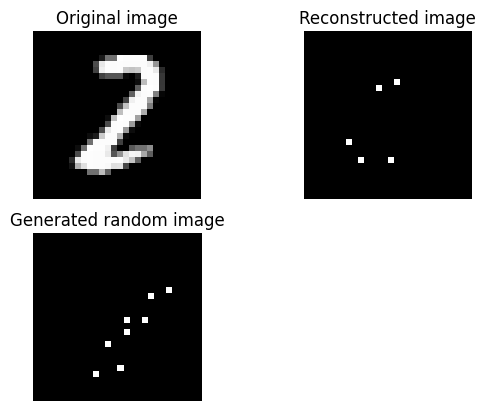

Epoch: 221
------

Train loss: 27.34
Test loss: 26.80
ELBO: 15.996408462524414


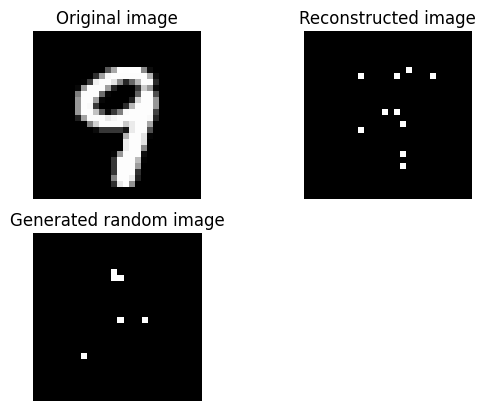

Epoch: 222
------

Train loss: 27.34
Test loss: 26.80
ELBO: 9.230806350708008


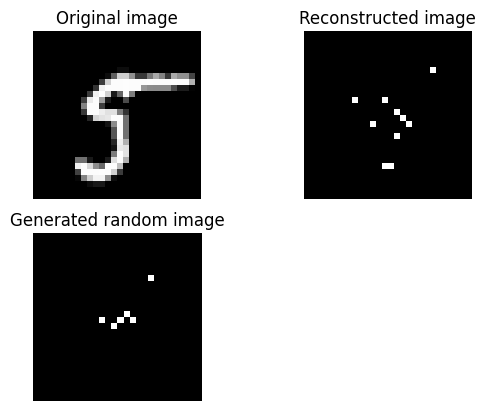

Epoch: 223
------

Train loss: 27.34
Test loss: 26.82
ELBO: 10.717869758605957


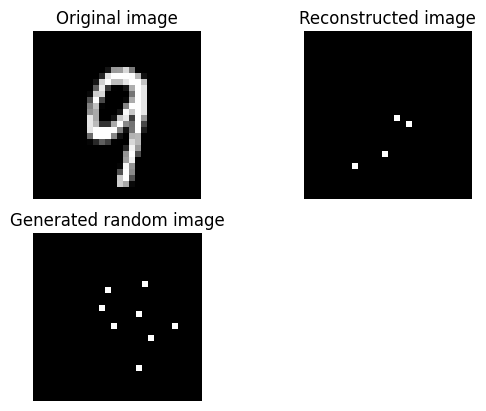

Epoch: 224
------

Train loss: 27.35
Test loss: 26.81
ELBO: 11.372160911560059


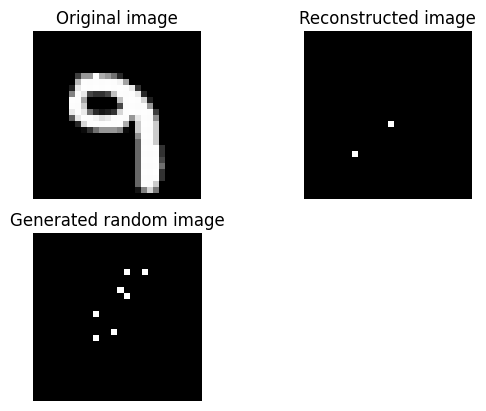

Epoch: 225
------

Train loss: 27.34
Test loss: 26.81
ELBO: 17.709774017333984


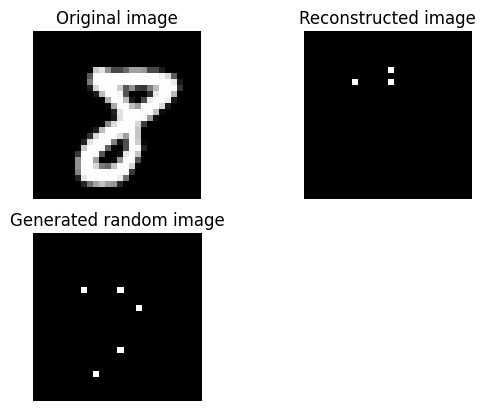

Epoch: 226
------

Train loss: 27.35
Test loss: 26.81
ELBO: 9.276863098144531


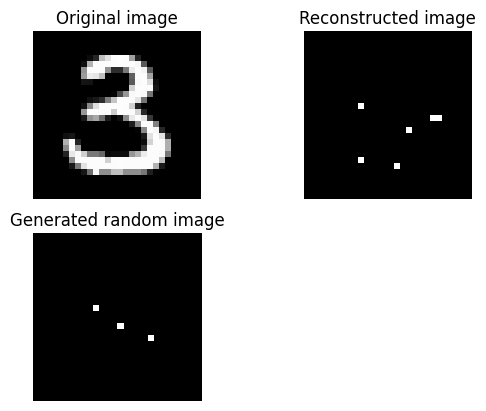

Epoch: 227
------

Train loss: 27.36
Test loss: 26.79
ELBO: 19.470428466796875


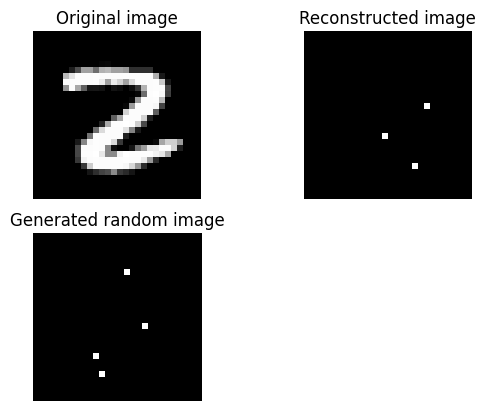

Epoch: 228
------

Train loss: 27.34
Test loss: 26.80
ELBO: 17.9324893951416


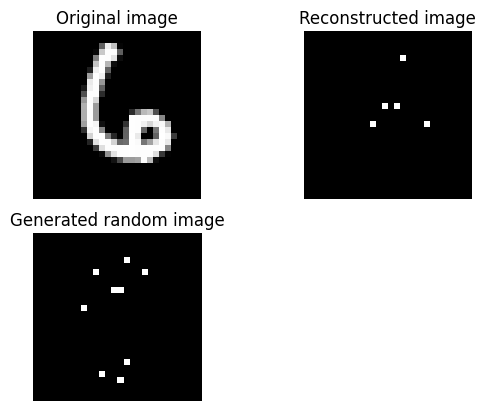

Epoch: 229
------

Train loss: 27.36
Test loss: 26.79
ELBO: 9.31763744354248


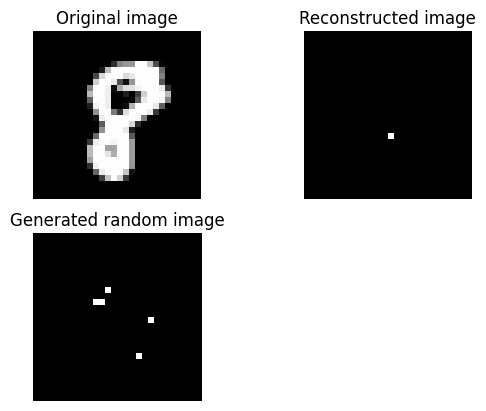

Epoch: 230
------

Train loss: 27.33
Test loss: 26.80
ELBO: 8.79010009765625


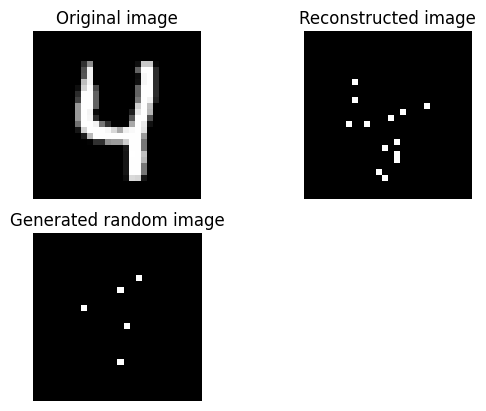

Epoch: 231
------

Train loss: 27.33
Test loss: 26.78
ELBO: 17.329063415527344


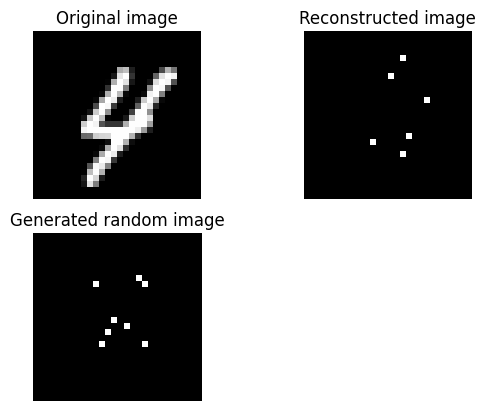

Epoch: 232
------

Train loss: 27.33
Test loss: 26.80
ELBO: 8.375884056091309


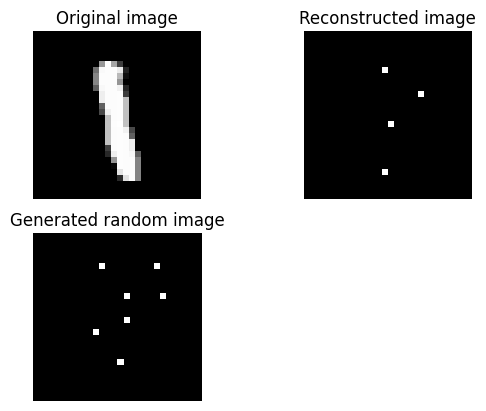

Epoch: 233
------

Train loss: 27.37
Test loss: 26.76
ELBO: 5.183041572570801


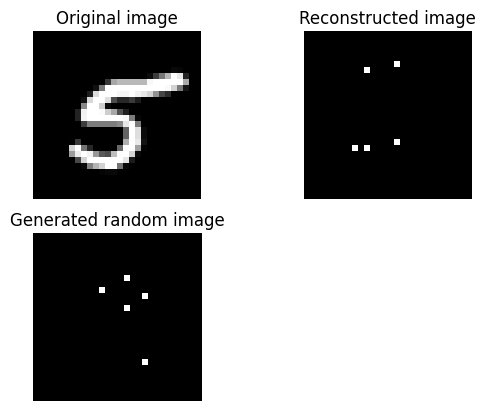

Epoch: 234
------

Train loss: 27.34
Test loss: 26.81
ELBO: 20.908519744873047


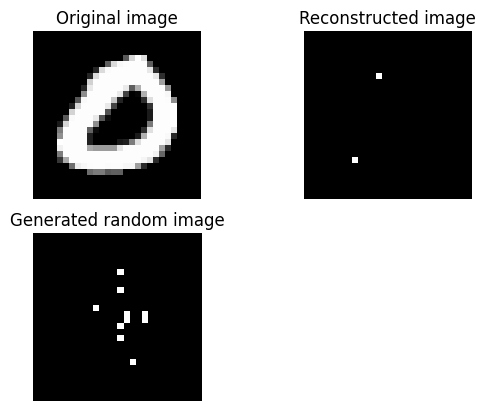

Epoch: 235
------

Train loss: 27.38
Test loss: 26.81
ELBO: 20.4918155670166


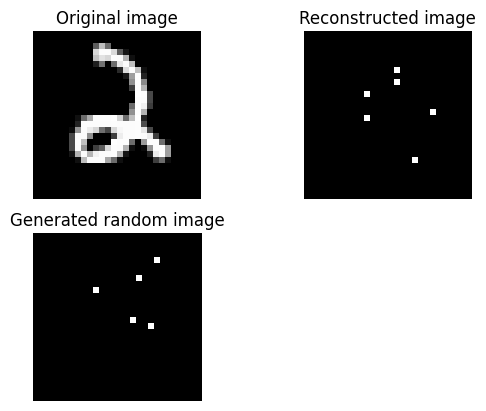

Epoch: 236
------

Train loss: 27.35
Test loss: 26.81
ELBO: 9.188302993774414


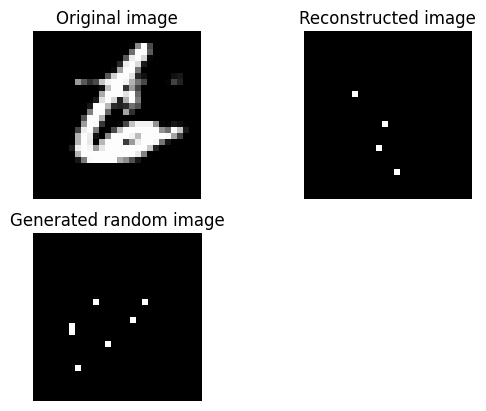

Epoch: 237
------

Train loss: 27.32
Test loss: 26.78
ELBO: 9.421161651611328


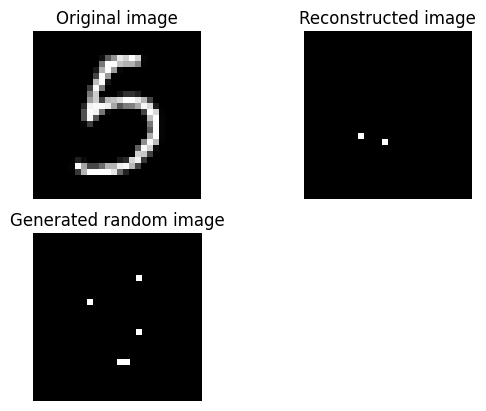

Epoch: 238
------

Train loss: 27.34
Test loss: 26.81
ELBO: 11.754581451416016


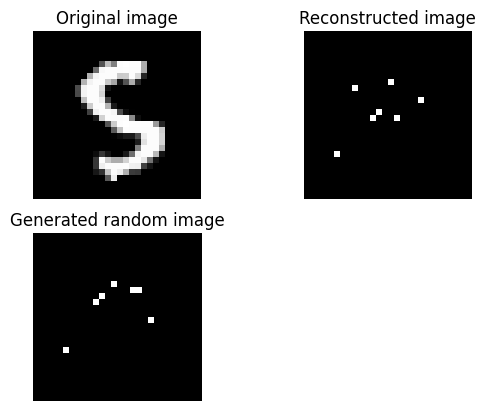

Epoch: 239
------

Train loss: 27.33
Test loss: 26.80
ELBO: 4.937546730041504


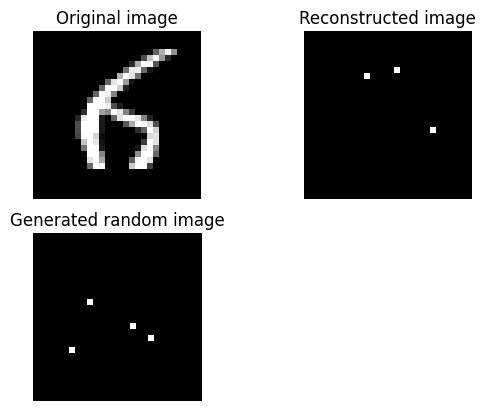

Epoch: 240
------

Train loss: 27.33
Test loss: 26.83
ELBO: 8.857531547546387


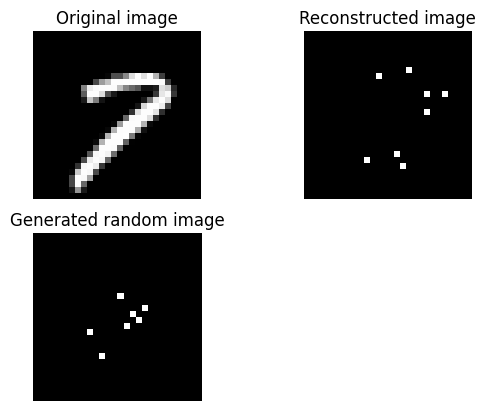

Epoch: 241
------

Train loss: 27.34
Test loss: 26.83
ELBO: 21.820293426513672


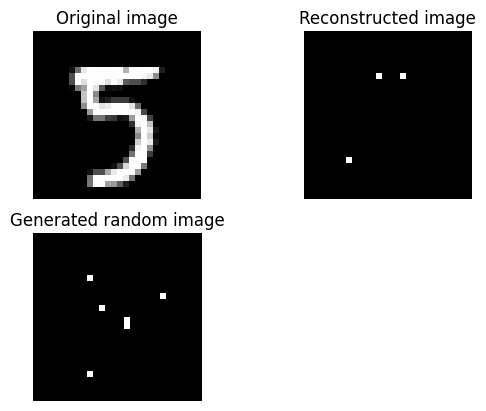

Epoch: 242
------

Train loss: 27.38
Test loss: 26.80
ELBO: 12.451166152954102


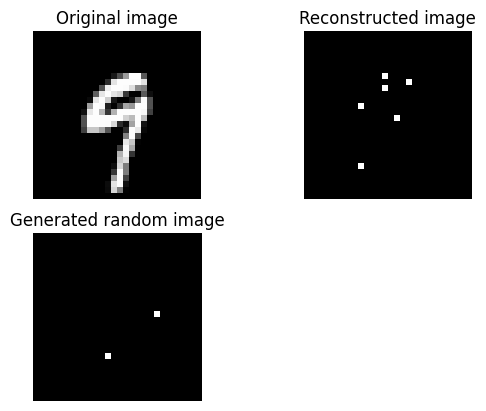

Epoch: 243
------

Train loss: 27.32
Test loss: 26.79
ELBO: 16.214618682861328


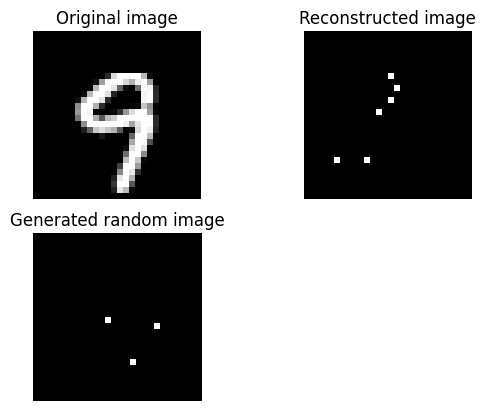

Epoch: 244
------

Train loss: 27.32
Test loss: 26.82
ELBO: 10.083657264709473


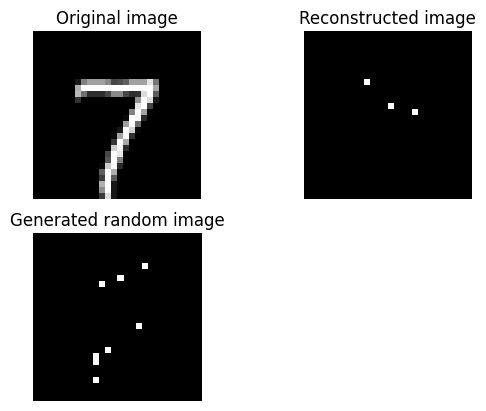

Epoch: 245
------

Train loss: 27.34
Test loss: 26.82
ELBO: 9.270331382751465


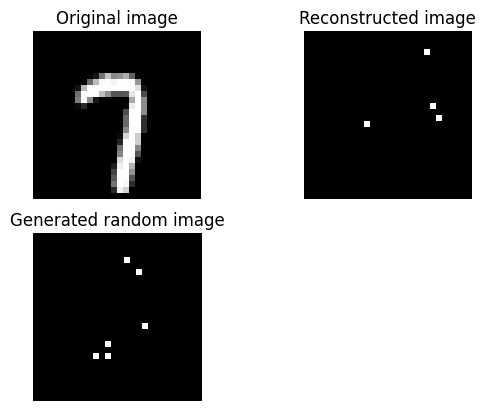

Epoch: 246
------

Train loss: 27.34
Test loss: 26.82
ELBO: 5.372908592224121


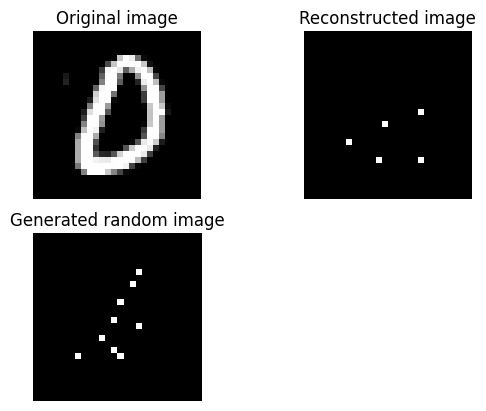

Epoch: 247
------

Train loss: 27.32
Test loss: 26.81
ELBO: 5.188751220703125


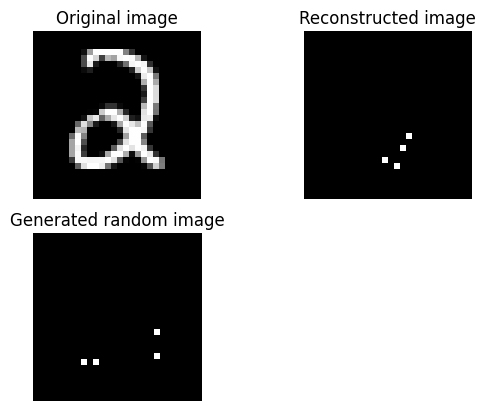

Epoch: 248
------

Train loss: 27.34
Test loss: 26.82
ELBO: 9.319509506225586


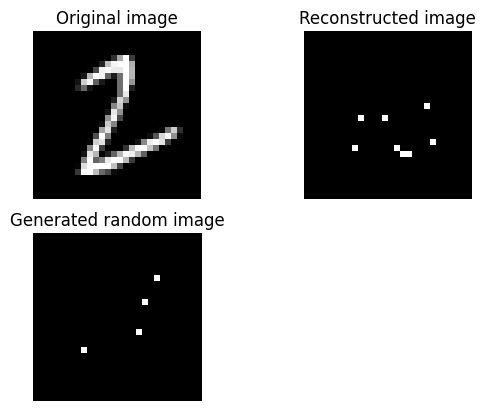

Epoch: 249
------

Train loss: 27.33
Test loss: 26.83
ELBO: 9.780722618103027


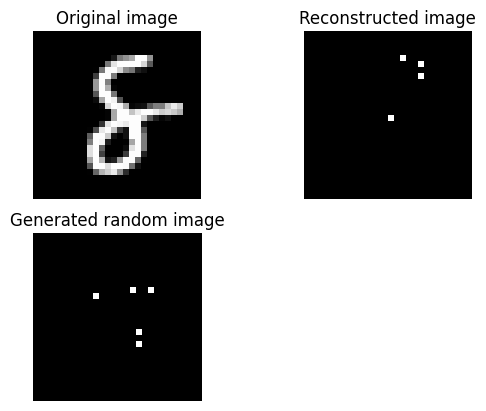

Epoch: 250
------

Train loss: 27.36
Test loss: 26.83
ELBO: 12.9531831741333


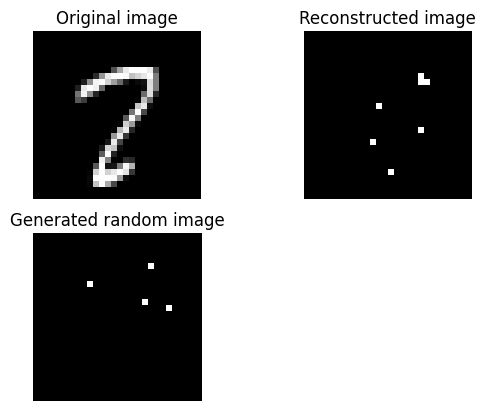

Epoch: 251
------

Train loss: 27.36
Test loss: 26.81
ELBO: 8.709357261657715


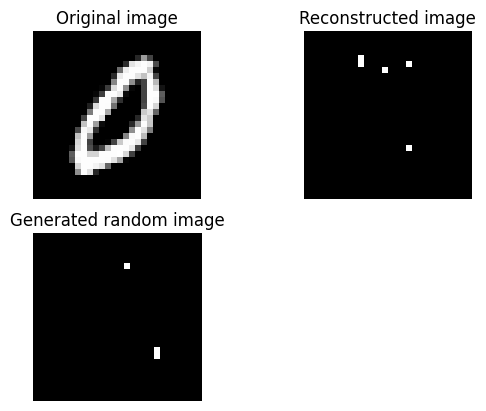

Epoch: 252
------

Train loss: 27.34
Test loss: 26.80
ELBO: 9.252663612365723


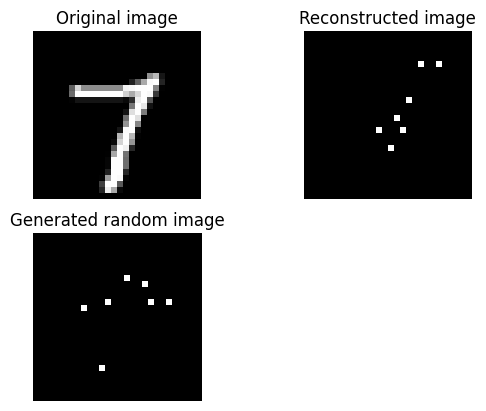

Epoch: 253
------

Train loss: 27.35
Test loss: 26.78
ELBO: 8.969017028808594


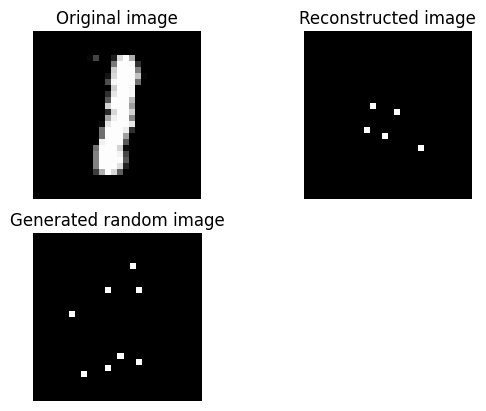

Epoch: 254
------

Train loss: 27.36
Test loss: 26.82
ELBO: 12.591667175292969


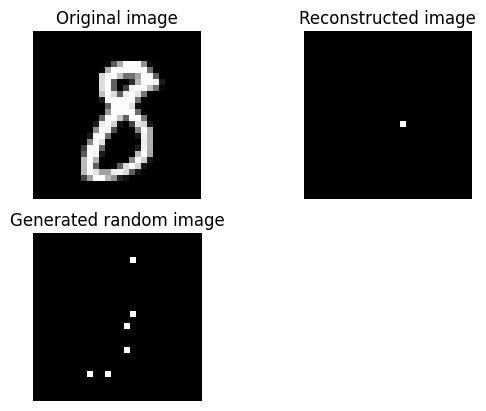

Epoch: 255
------

Train loss: 27.34
Test loss: 26.79
ELBO: 13.076715469360352


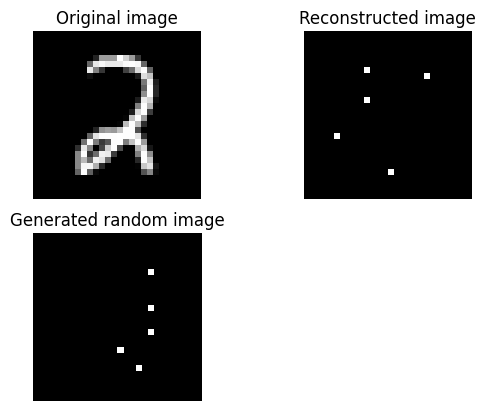

Epoch: 256
------

Train loss: 27.32
Test loss: 26.83
ELBO: 8.83262825012207


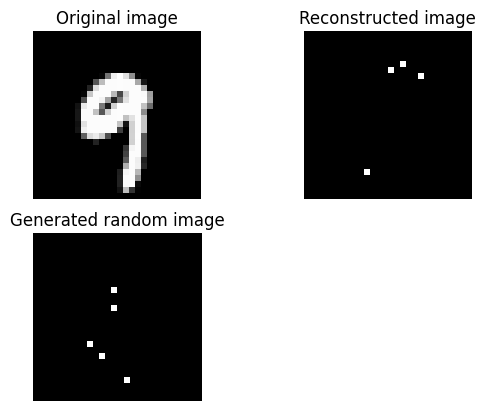

Epoch: 257
------

Train loss: 27.33
Test loss: 26.83
ELBO: 12.176177978515625


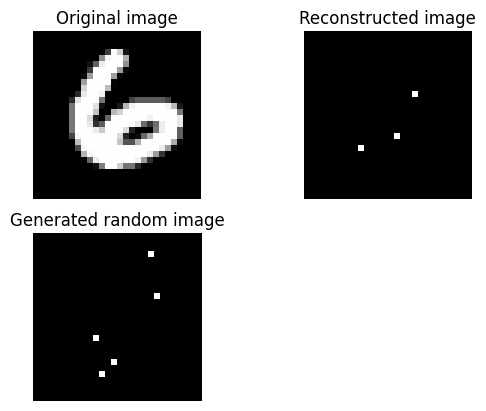

Epoch: 258
------

Train loss: 27.34
Test loss: 26.80
ELBO: 13.185307502746582


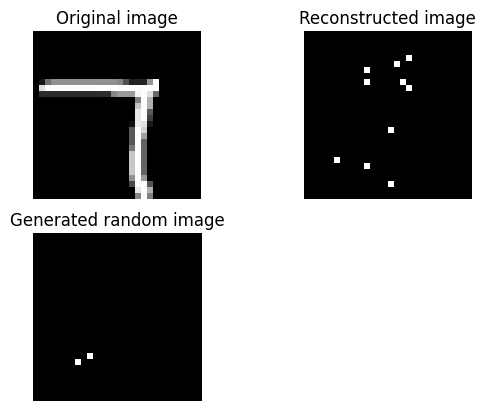

Epoch: 259
------

Train loss: 27.36
Test loss: 26.81
ELBO: 10.960905075073242


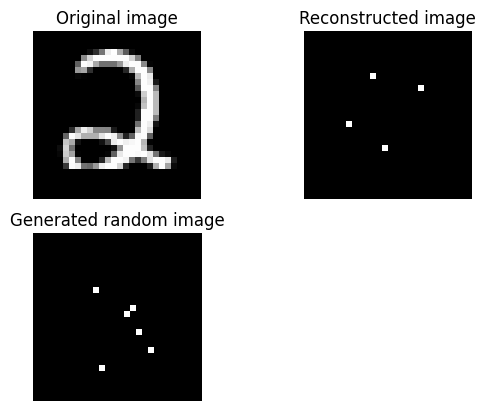

Epoch: 260
------

Train loss: 27.34
Test loss: 26.79
ELBO: 10.782938003540039


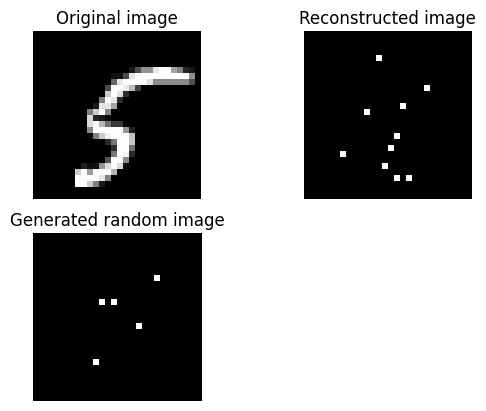

Epoch: 261
------

Train loss: 27.35
Test loss: 26.79
ELBO: 13.340648651123047


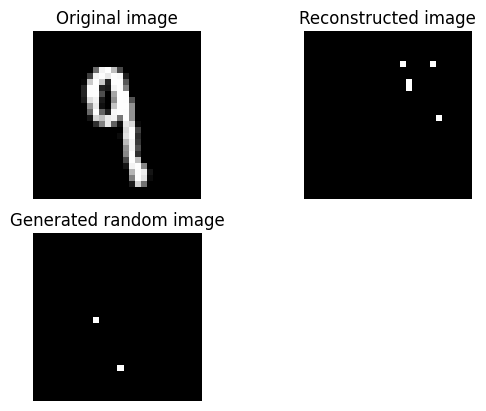

Epoch: 262
------

Train loss: 27.30
Test loss: 26.81
ELBO: 8.95793342590332


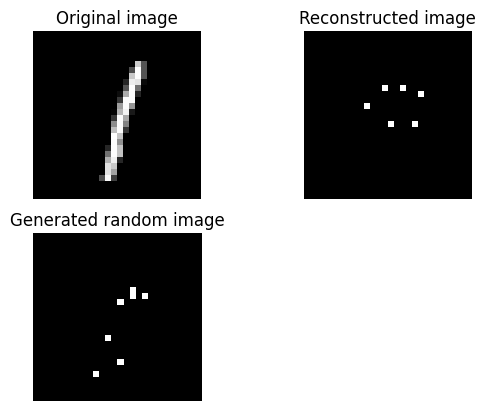

Epoch: 263
------

Train loss: 27.35
Test loss: 26.79
ELBO: 486.78082275390625


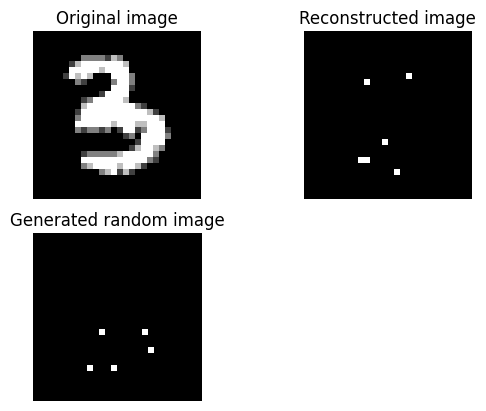

Epoch: 264
------

Train loss: 27.31
Test loss: 26.83
ELBO: 16.95063018798828


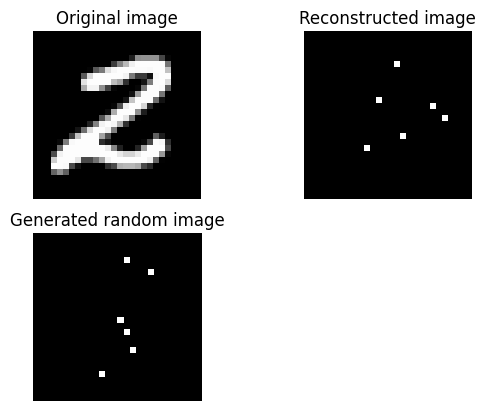

Epoch: 265
------

Train loss: 27.32
Test loss: 26.79
ELBO: 8.862436294555664


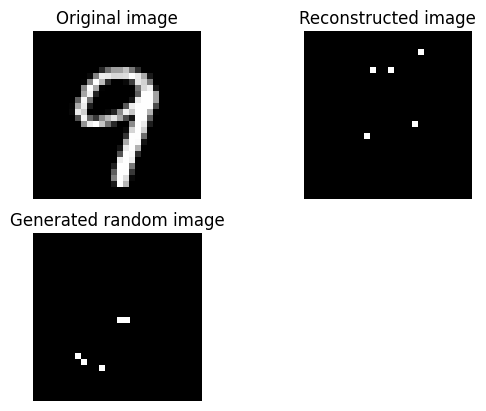

Epoch: 266
------

Train loss: 27.36
Test loss: 26.81
ELBO: 12.34130859375


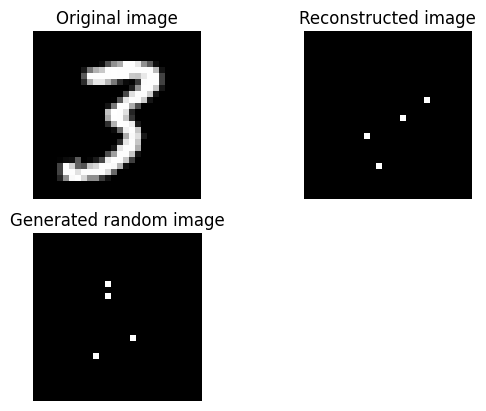

Epoch: 267
------

Train loss: 27.33
Test loss: 26.81
ELBO: 9.188688278198242


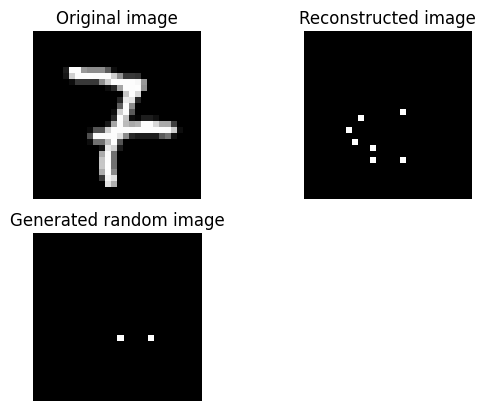

Epoch: 268
------

Train loss: 27.34
Test loss: 26.79
ELBO: 9.030267715454102


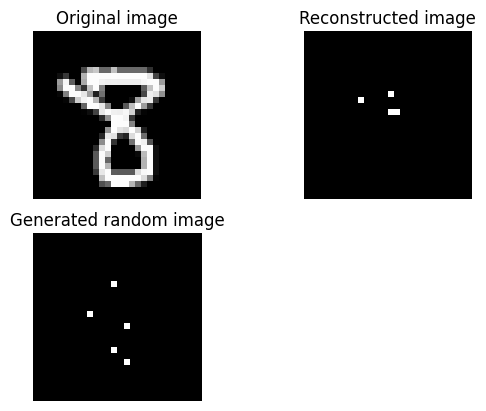

Epoch: 269
------

Train loss: 27.32
Test loss: 26.84
ELBO: 13.44853401184082


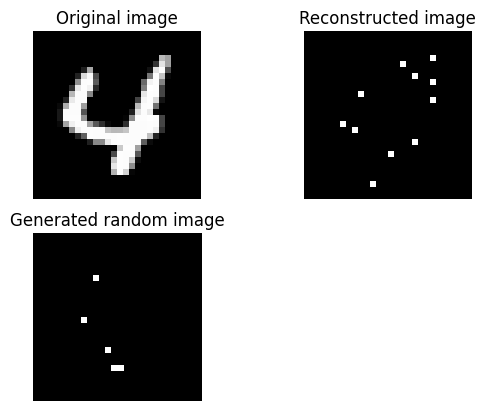

Epoch: 270
------

Train loss: 27.33
Test loss: 26.86
ELBO: 10.136934280395508


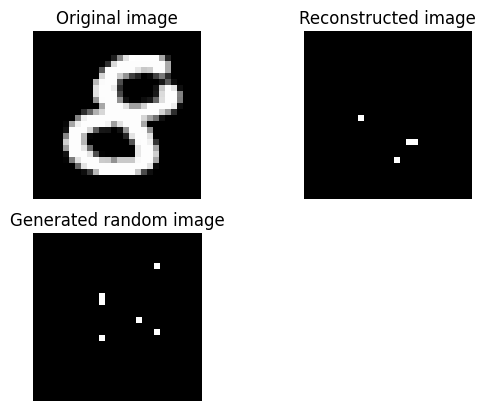

Epoch: 271
------

Train loss: 27.34
Test loss: 26.80
ELBO: 4.971797943115234


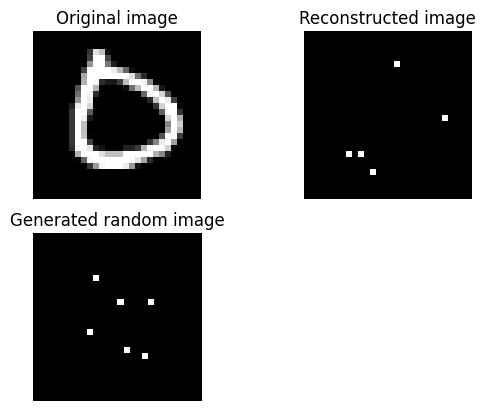

Epoch: 272
------

Train loss: 27.36
Test loss: 26.77
ELBO: 9.286076545715332


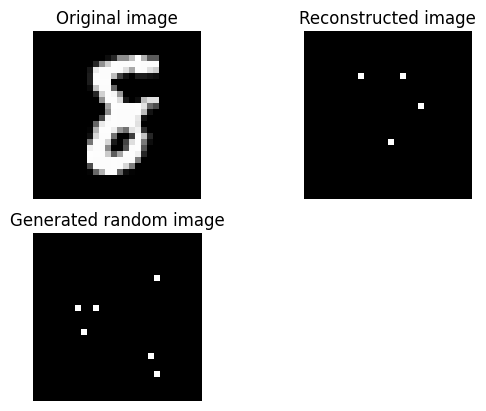

Epoch: 273
------

Train loss: 27.35
Test loss: 26.80
ELBO: 13.080172538757324


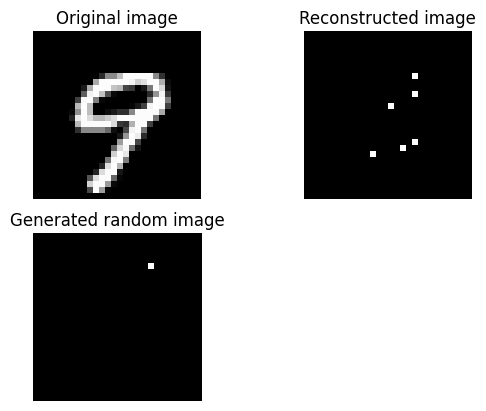

Epoch: 274
------

Train loss: 27.36
Test loss: 26.81
ELBO: 14.770103454589844


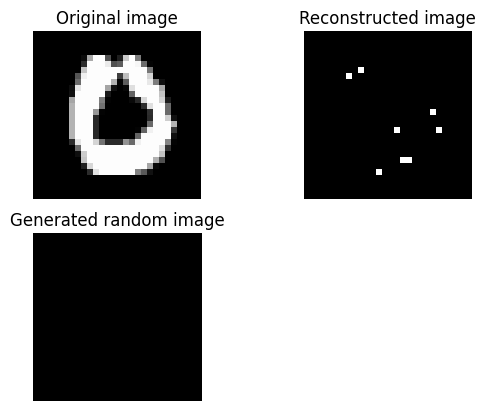

Epoch: 275
------

Train loss: 27.32
Test loss: 26.79
ELBO: 9.305057525634766


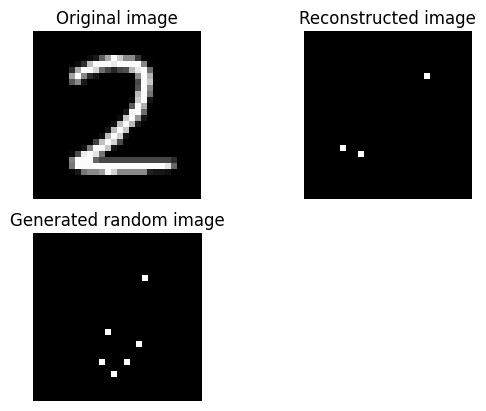

Epoch: 276
------

Train loss: 27.35
Test loss: 26.80
ELBO: 8.928010940551758


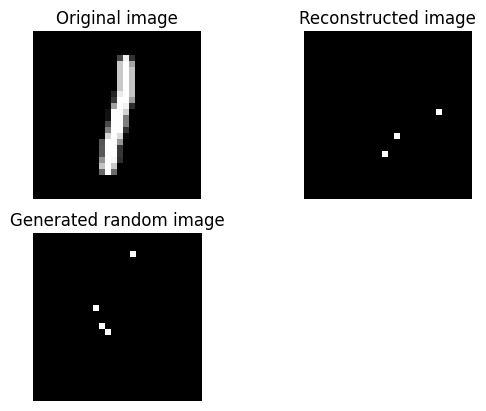

Epoch: 277
------

Train loss: 27.36
Test loss: 26.82
ELBO: 13.014631271362305


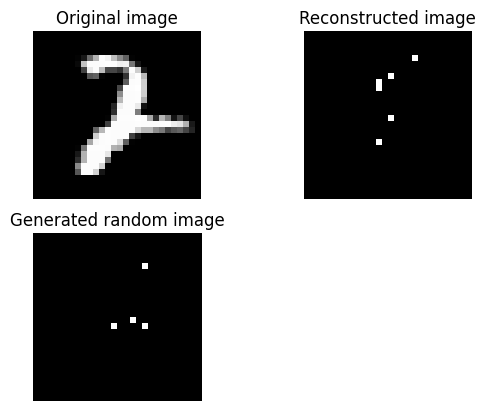

Epoch: 278
------

Train loss: 27.34
Test loss: 26.81
ELBO: 15.749563217163086


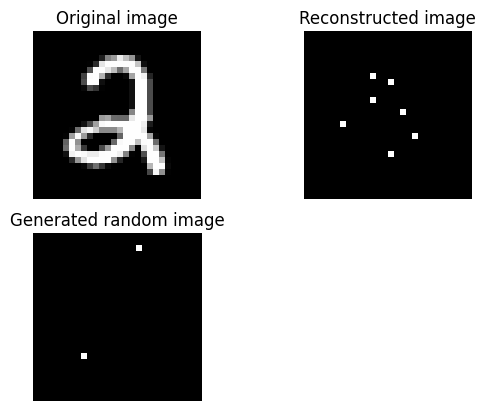

Epoch: 279
------

Train loss: 27.31
Test loss: 26.83
ELBO: 9.666729927062988


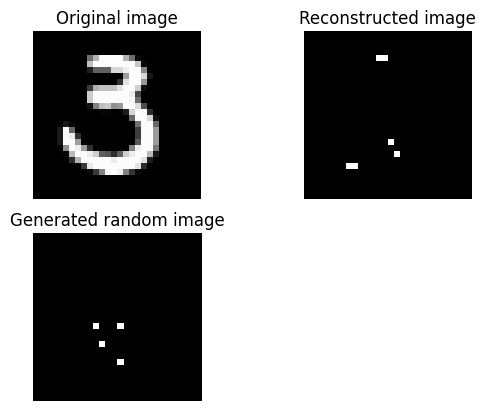

Epoch: 280
------

Train loss: 27.31
Test loss: 26.82
ELBO: 510.1382751464844


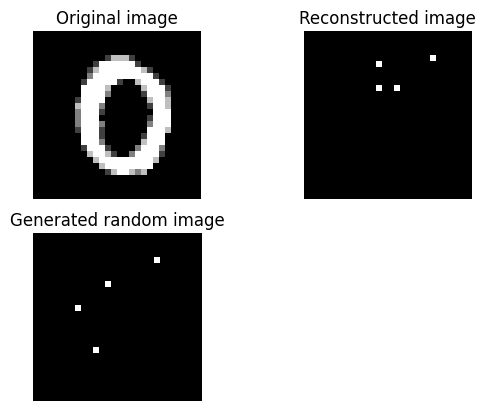

Epoch: 281
------

Train loss: 27.32
Test loss: 26.80
ELBO: 12.890680313110352


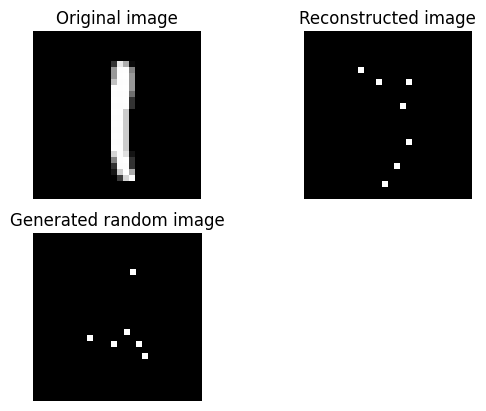

Epoch: 282
------

Train loss: 27.32
Test loss: 26.81
ELBO: 9.251789093017578


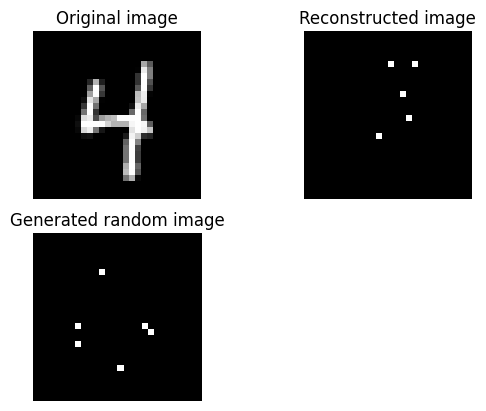

Epoch: 283
------

Train loss: 27.33
Test loss: 26.82
ELBO: 9.353473663330078


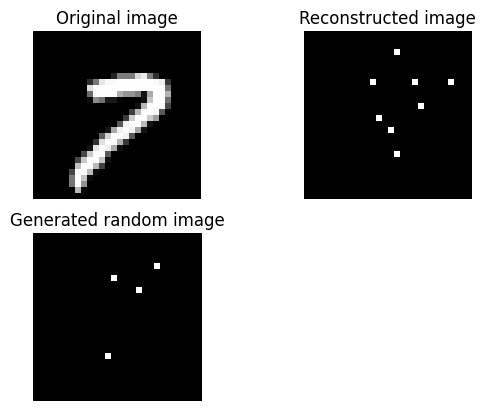

Epoch: 284
------

Train loss: 27.32
Test loss: 26.80
ELBO: 8.327713966369629


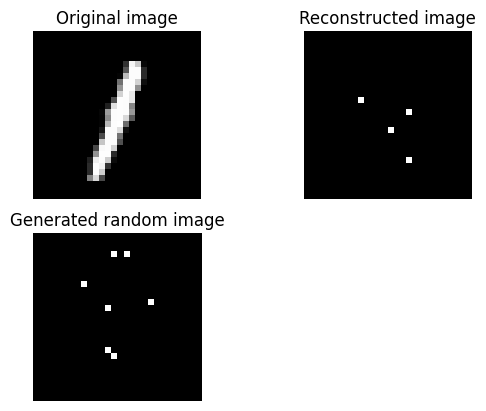

Epoch: 285
------

Train loss: 27.33
Test loss: 26.82
ELBO: 17.006128311157227


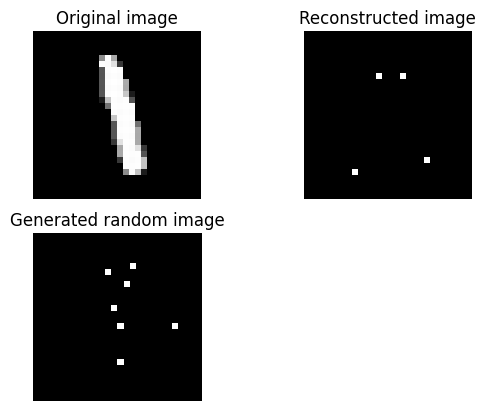

Epoch: 286
------

Train loss: 27.34
Test loss: 26.79
ELBO: 8.691332817077637


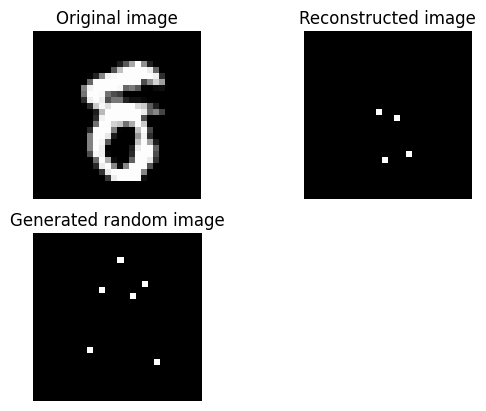

Epoch: 287
------

Train loss: 27.33
Test loss: 26.78
ELBO: 5.263778209686279


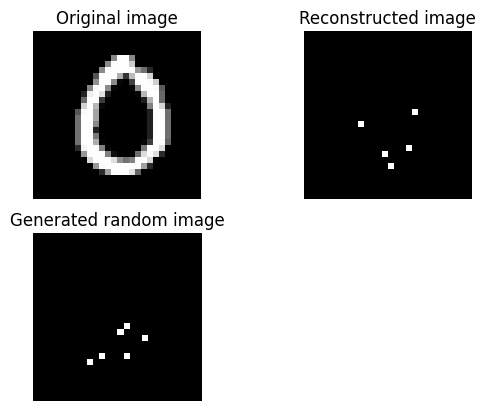

Epoch: 288
------

Train loss: 27.36
Test loss: 26.80
ELBO: 10.411660194396973


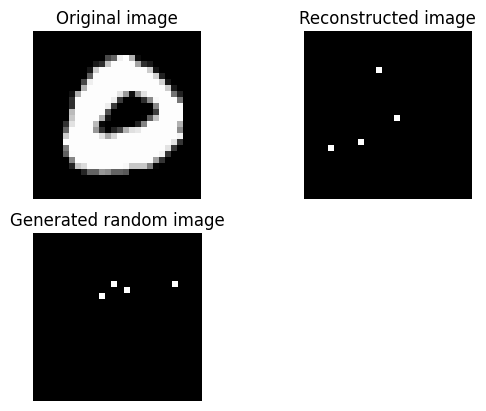

Epoch: 289
------

Train loss: 27.33
Test loss: 26.81
ELBO: 10.105586051940918


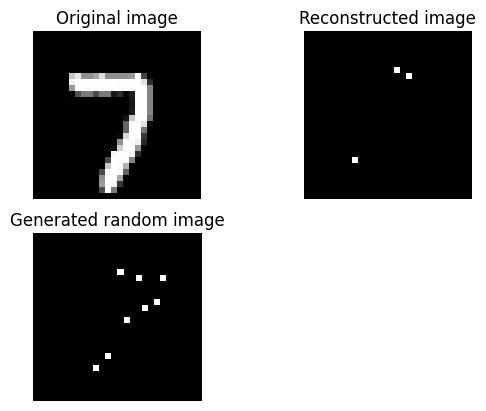

Epoch: 290
------

Train loss: 27.30
Test loss: 26.81
ELBO: 9.212790489196777


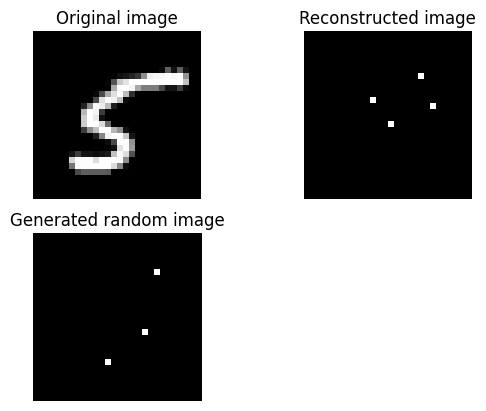

Epoch: 291
------

Train loss: 27.34
Test loss: 26.81
ELBO: 8.446495056152344


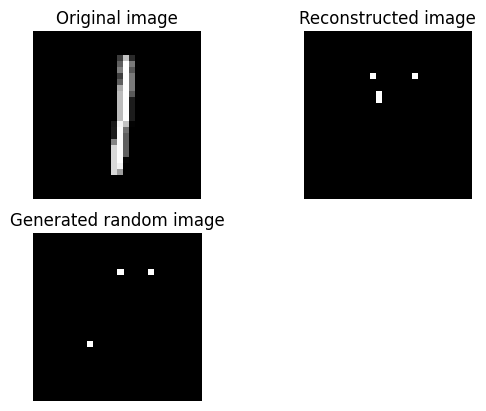

Epoch: 292
------

Train loss: 27.32
Test loss: 26.80
ELBO: 13.031063079833984


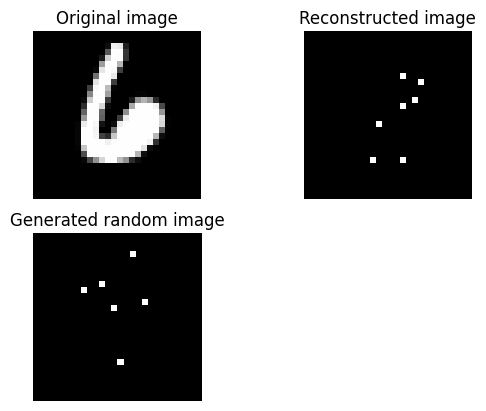

Epoch: 293
------

Train loss: 27.32
Test loss: 26.80
ELBO: 5.292586326599121


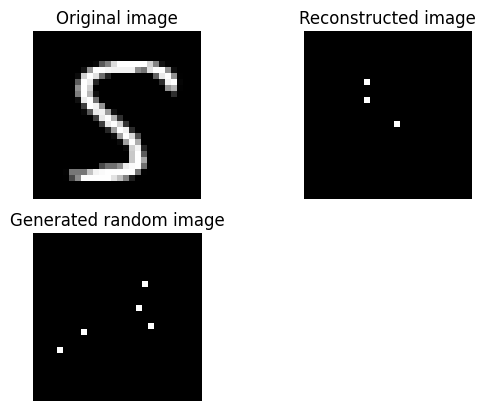

Epoch: 294
------

Train loss: 27.32
Test loss: 26.83
ELBO: 12.78462028503418


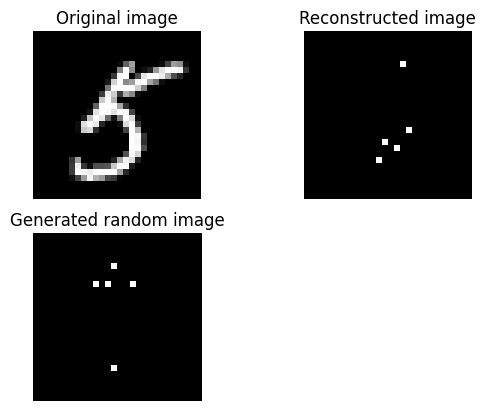

Epoch: 295
------

Train loss: 27.33
Test loss: 26.79
ELBO: 9.237117767333984


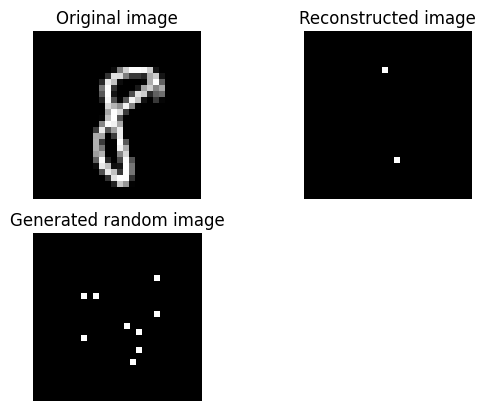

Epoch: 296
------

Train loss: 27.35
Test loss: 26.80
ELBO: 8.725863456726074


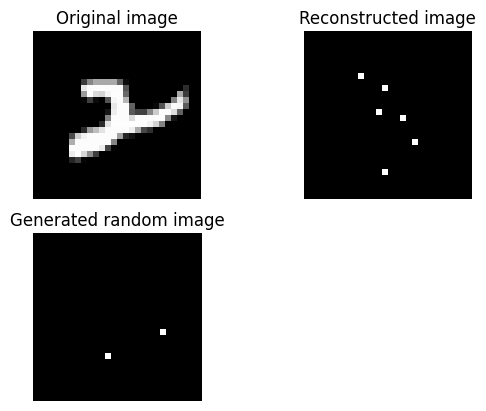

Epoch: 297
------

Train loss: 27.31
Test loss: 26.82
ELBO: 8.901723861694336


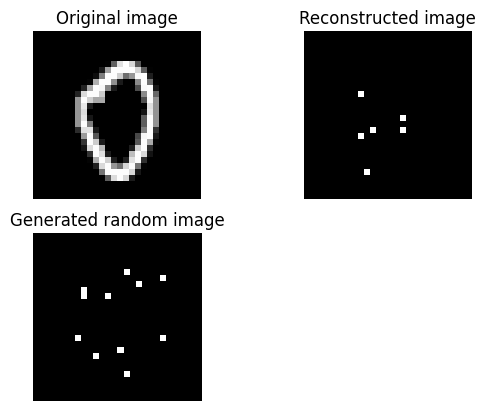

Epoch: 298
------

Train loss: 27.31
Test loss: 26.81
ELBO: 17.383020401000977


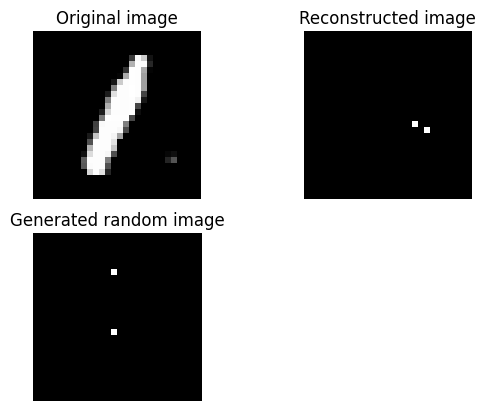

Epoch: 299
------

Train loss: 27.34
Test loss: 26.81
ELBO: 13.081031799316406


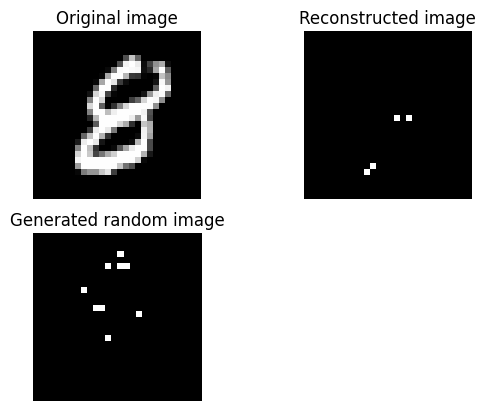

Epoch: 300
------

Train loss: 27.33
Test loss: 26.78
ELBO: 16.363122940063477


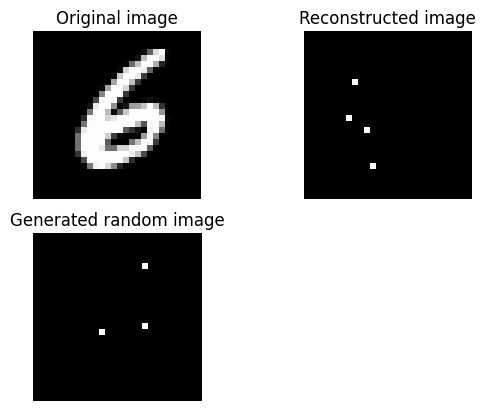

Epoch: 301
------

Train loss: 27.32
Test loss: 26.83
ELBO: 9.165986061096191


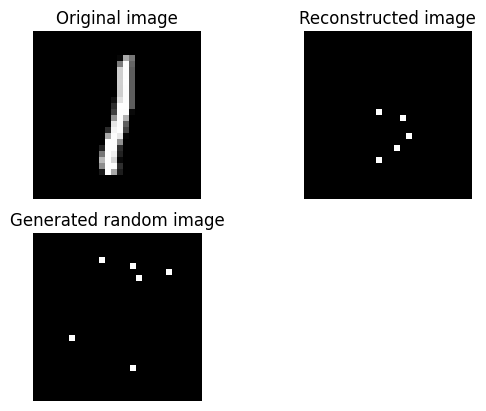

Epoch: 302
------

Train loss: 27.31
Test loss: 26.80
ELBO: 10.355566024780273


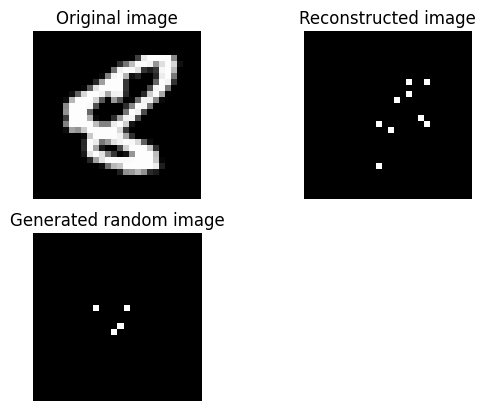

Epoch: 303
------

Train loss: 27.35
Test loss: 26.83
ELBO: 9.522459030151367


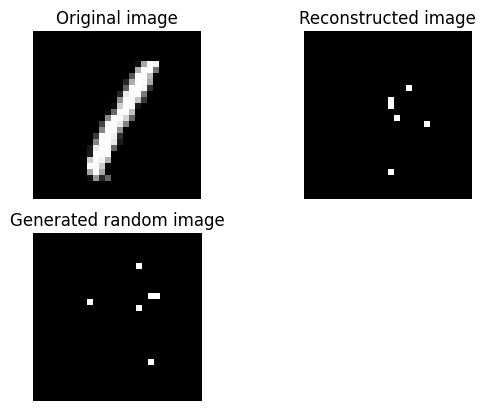

Epoch: 304
------

Train loss: 27.33
Test loss: 26.84
ELBO: 5.441686630249023


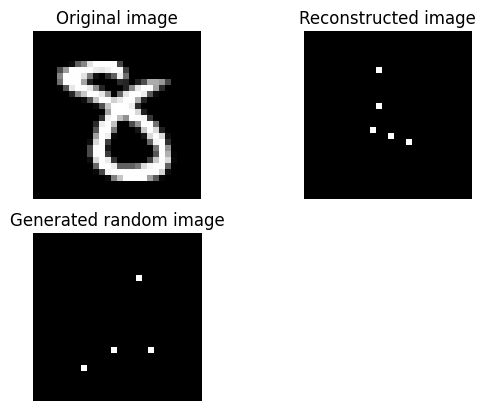

Epoch: 305
------

Train loss: 27.33
Test loss: 26.80
ELBO: 8.667920112609863


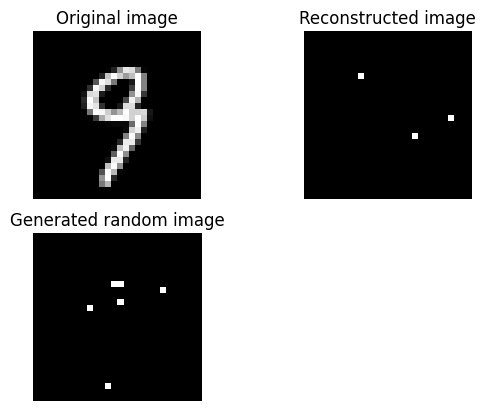

Epoch: 306
------

Train loss: 27.32
Test loss: 26.81
ELBO: 8.839832305908203


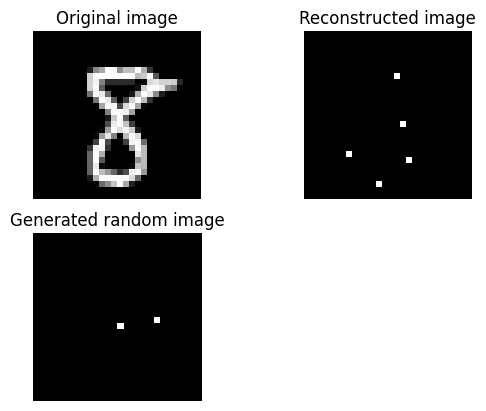

Epoch: 307
------

Train loss: 27.35
Test loss: 26.81
ELBO: 8.430877685546875


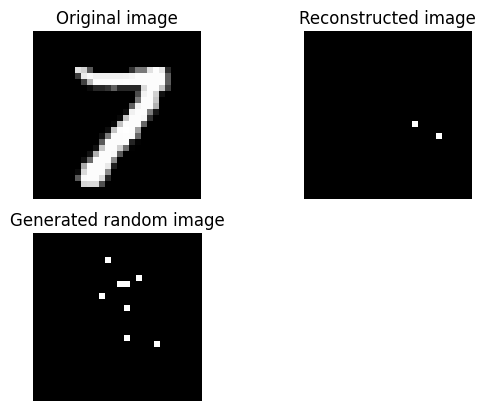

Epoch: 308
------

Train loss: 27.35
Test loss: 26.80
ELBO: 16.222312927246094


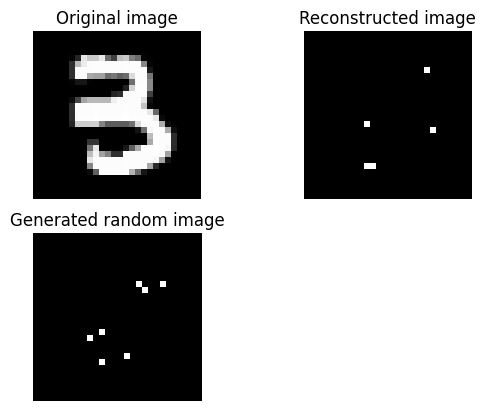

Epoch: 309
------

Train loss: 27.30
Test loss: 26.83
ELBO: 9.21339225769043


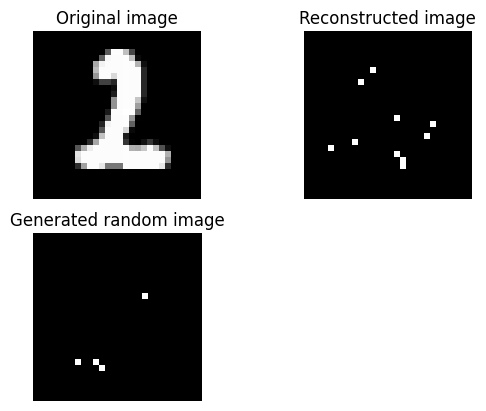

Epoch: 310
------

Train loss: 27.33
Test loss: 26.80
ELBO: 9.631013870239258


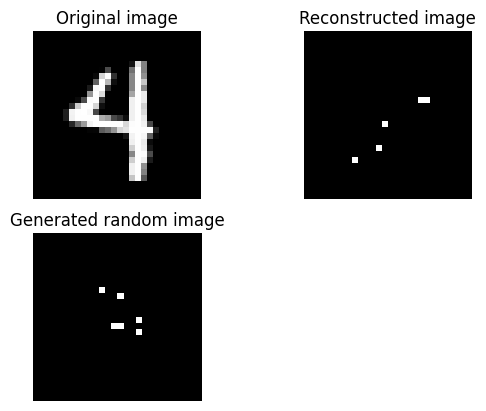

Epoch: 311
------

Train loss: 27.31
Test loss: 26.79
ELBO: 8.828466415405273


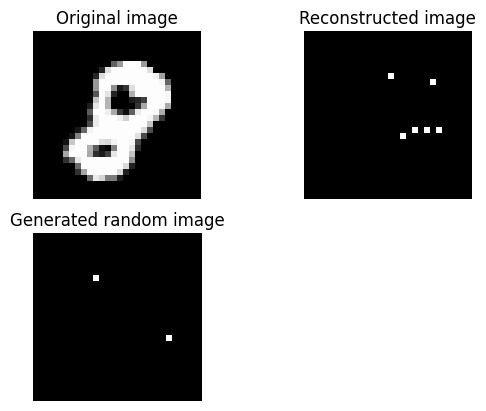

Epoch: 312
------

Train loss: 27.35
Test loss: 26.81
ELBO: 5.113478183746338


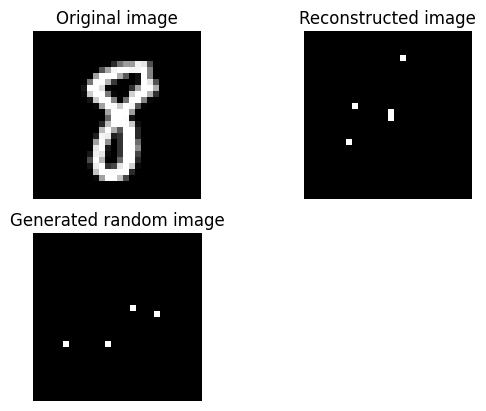

Epoch: 313
------

Train loss: 27.35
Test loss: 26.79
ELBO: 9.517324447631836


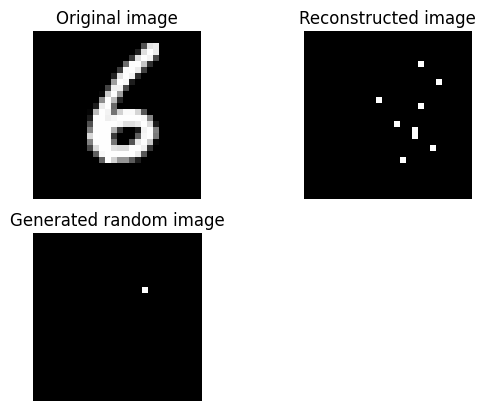

Epoch: 314
------

Train loss: 27.33
Test loss: 26.81
ELBO: 13.315445899963379


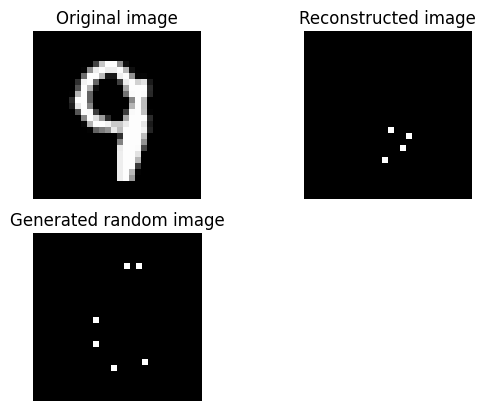

Epoch: 315
------

Train loss: 27.35
Test loss: 26.81
ELBO: 13.241167068481445


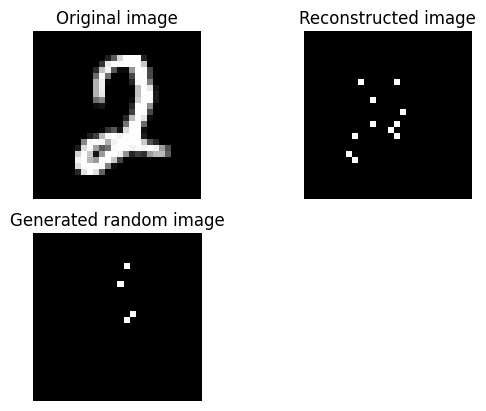

Epoch: 316
------

Train loss: 27.32
Test loss: 26.79
ELBO: 447.4828796386719


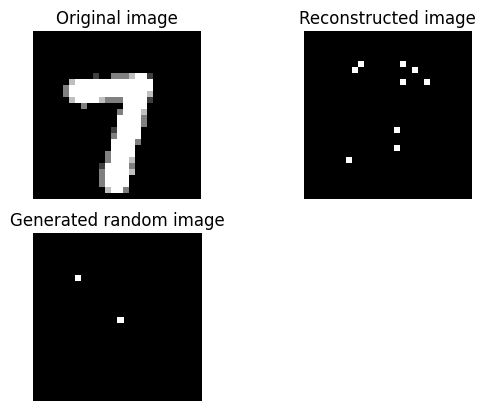

Epoch: 317
------

Train loss: 27.31
Test loss: 26.83
ELBO: 9.143495559692383


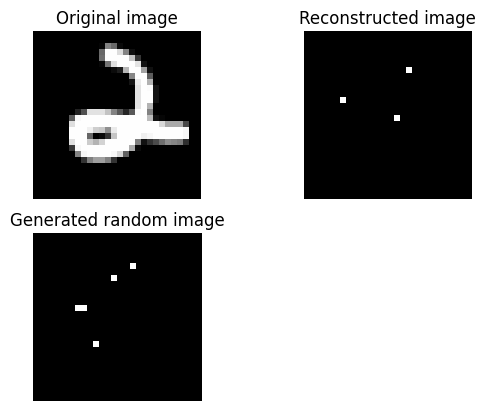

Epoch: 318
------

Train loss: 27.33
Test loss: 26.82
ELBO: 9.276935577392578


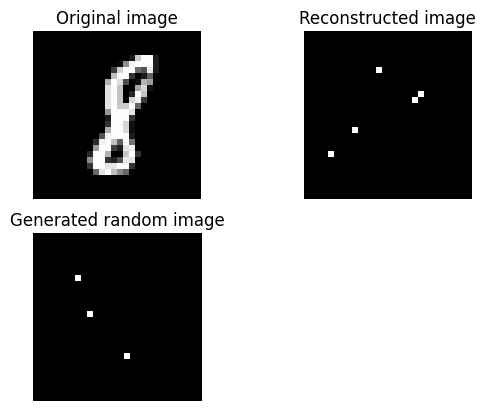

Epoch: 319
------

Train loss: 27.32
Test loss: 26.80
ELBO: 8.732027053833008


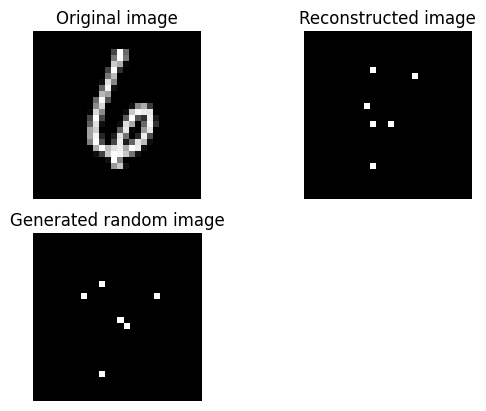

Epoch: 320
------

Train loss: 27.34
Test loss: 26.80
ELBO: 8.853458404541016


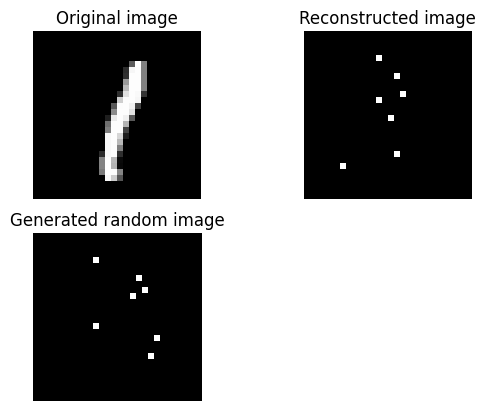

Epoch: 321
------

Train loss: 27.34
Test loss: 26.77
ELBO: 17.32626724243164


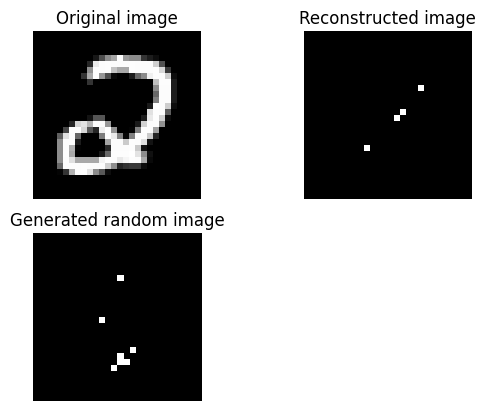

Epoch: 322
------

Train loss: 27.34
Test loss: 26.80
ELBO: 12.770671844482422


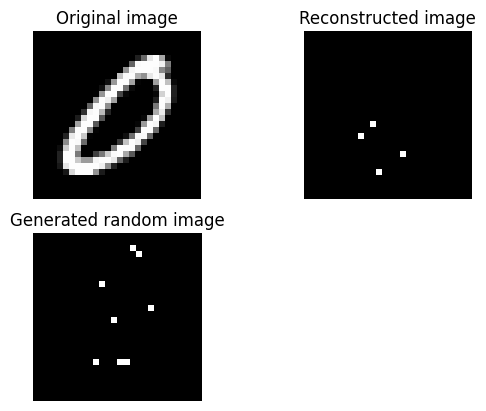

Epoch: 323
------

Train loss: 27.33
Test loss: 26.79
ELBO: 8.224360466003418


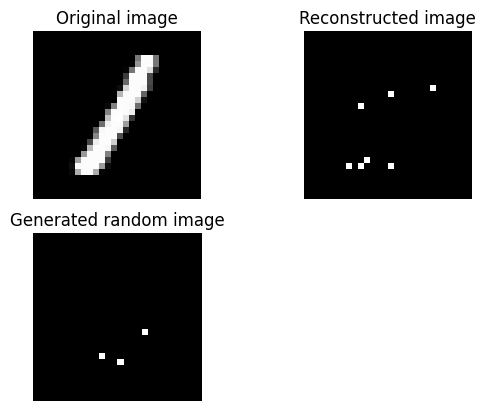

Epoch: 324
------

Train loss: 27.32
Test loss: 26.82
ELBO: 9.708425521850586


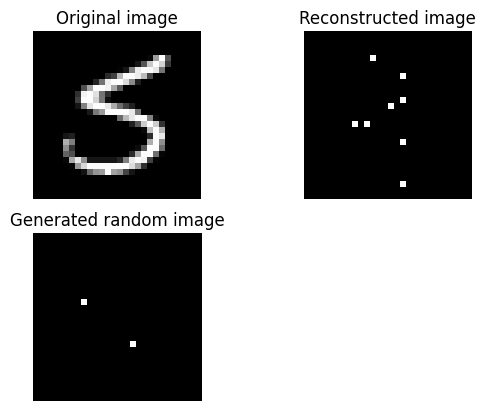

Epoch: 325
------

Train loss: 27.33
Test loss: 26.84
ELBO: 9.200056076049805


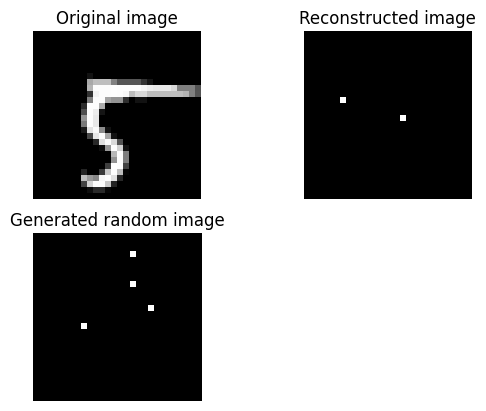

Epoch: 326
------

Train loss: 27.32
Test loss: 26.79
ELBO: 9.184510231018066


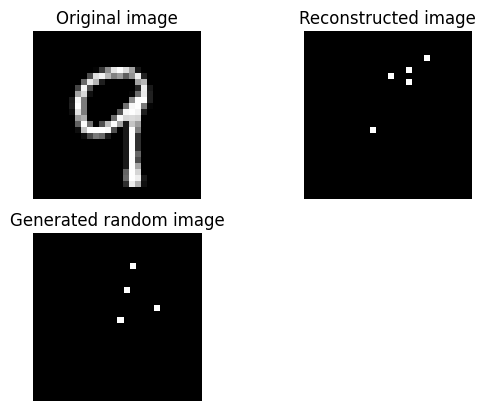

Epoch: 327
------

Train loss: 27.32
Test loss: 26.81
ELBO: 11.175768852233887


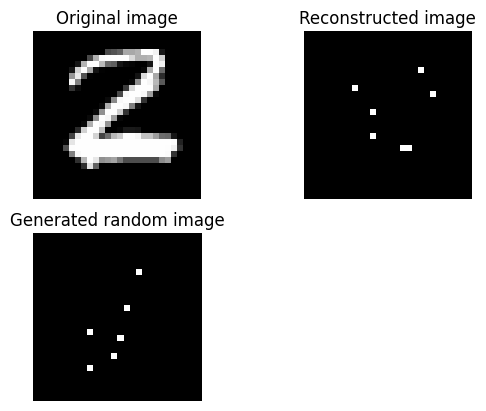

Epoch: 328
------

Train loss: 27.31
Test loss: 26.79
ELBO: 8.678728103637695


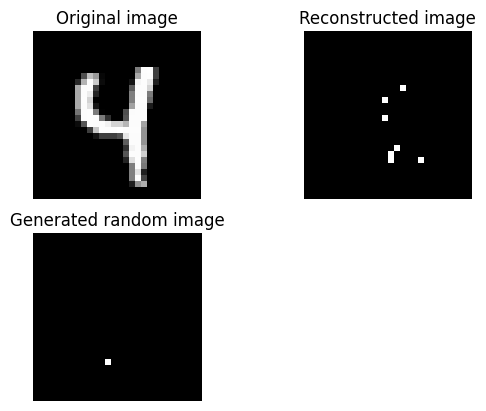

Epoch: 329
------

Train loss: 27.34
Test loss: 26.82
ELBO: 8.555614471435547


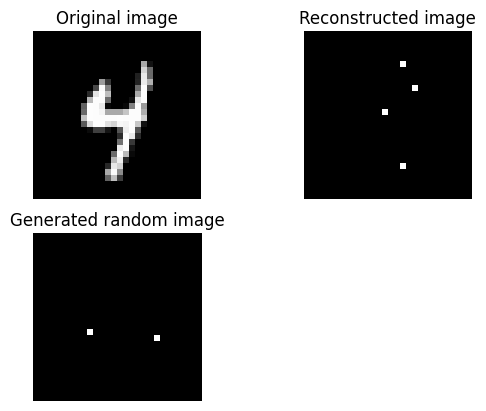

Epoch: 330
------

Train loss: 27.36
Test loss: 26.80
ELBO: 5.4826130867004395


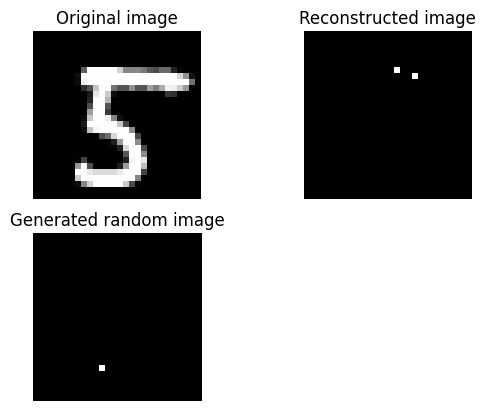

Epoch: 331
------

Train loss: 27.31
Test loss: 26.78
ELBO: 13.306792259216309


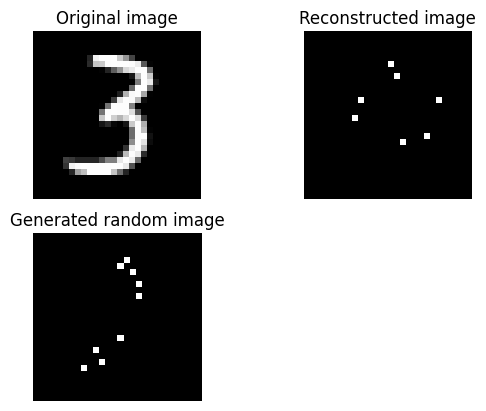

Epoch: 332
------

Train loss: 27.32
Test loss: 26.80
ELBO: 8.641057014465332


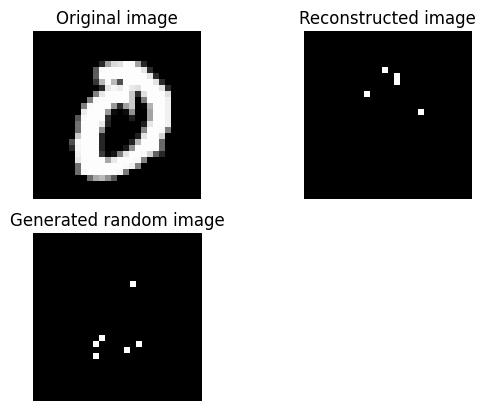

Epoch: 333
------

Train loss: 27.30
Test loss: 26.80
ELBO: 9.440784454345703


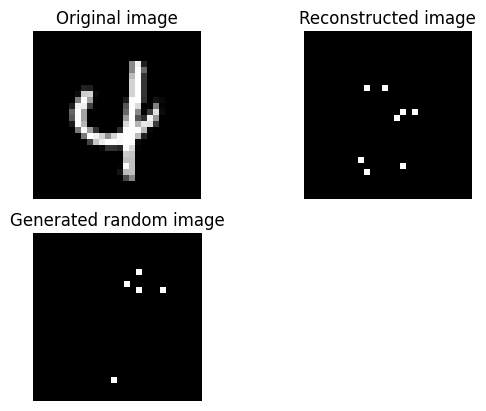

Epoch: 334
------

Train loss: 27.37
Test loss: 26.82
ELBO: 10.374467849731445


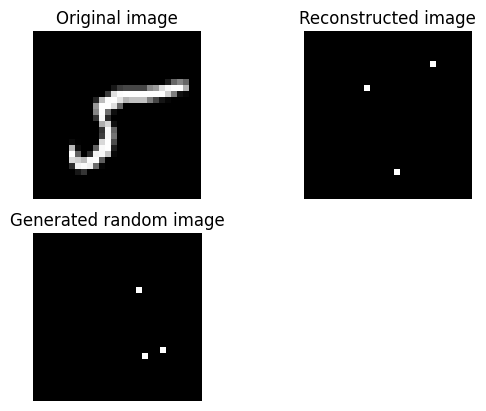

Epoch: 335
------

Train loss: 27.36
Test loss: 26.80
ELBO: 11.67809772491455


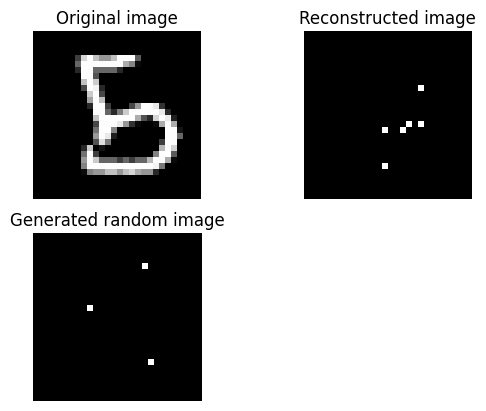

Epoch: 336
------

Train loss: 27.30
Test loss: 26.80
ELBO: 8.52804183959961


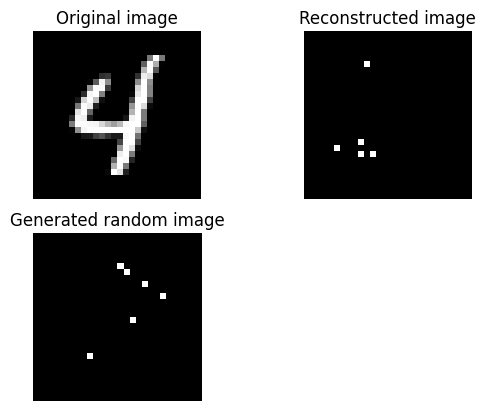

Epoch: 337
------

Train loss: 27.34
Test loss: 26.79
ELBO: 8.9072265625


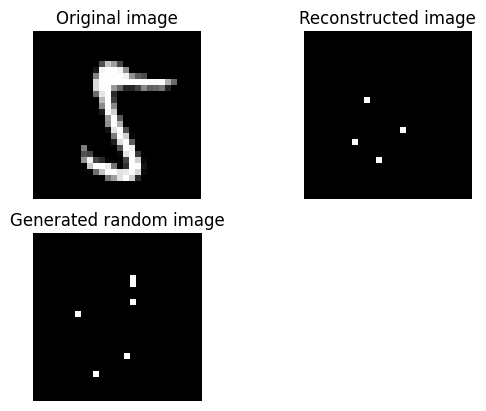

Epoch: 338
------

Train loss: 27.33
Test loss: 26.80
ELBO: 9.268356323242188


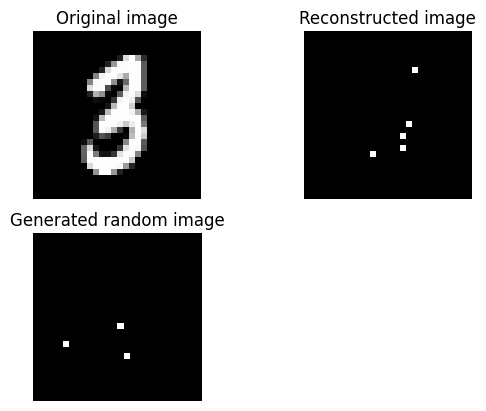

Epoch: 339
------

Train loss: 27.34
Test loss: 26.81
ELBO: 13.169120788574219


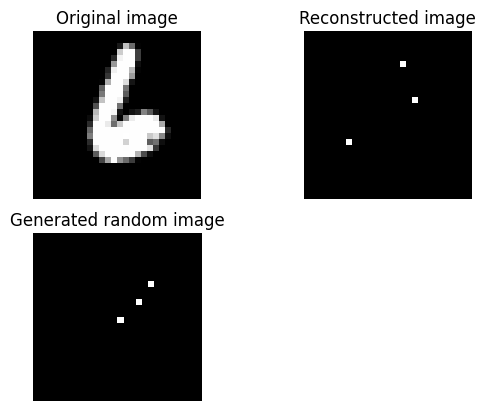

Epoch: 340
------

Train loss: 27.32
Test loss: 26.80
ELBO: 4.990111351013184


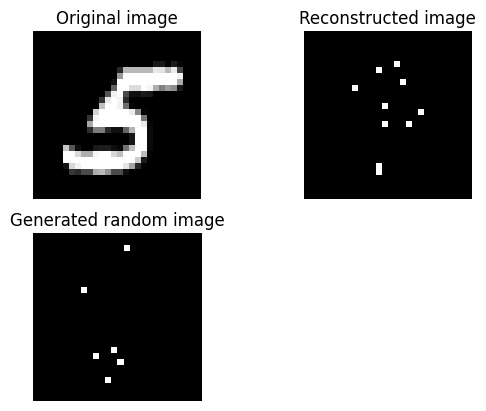

Epoch: 341
------

Train loss: 27.31
Test loss: 26.80
ELBO: 13.596952438354492


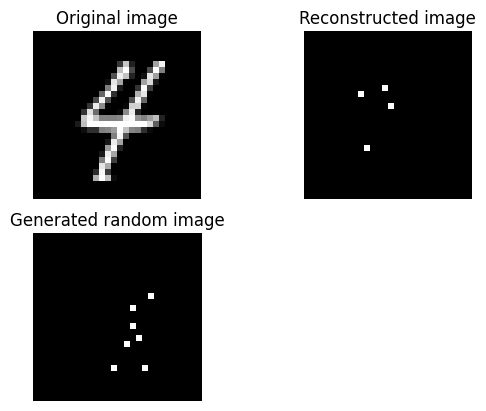

Epoch: 342
------

Train loss: 27.33
Test loss: 26.82
ELBO: 16.76593017578125


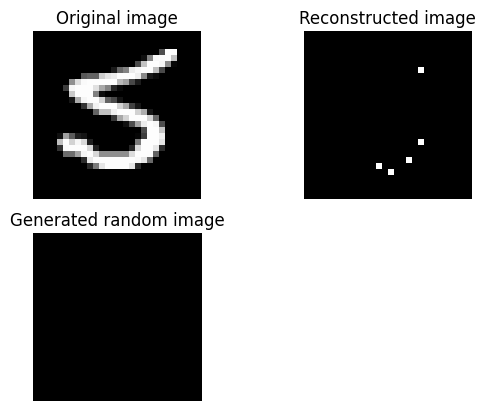

Epoch: 343
------

Train loss: 27.32
Test loss: 26.83
ELBO: 9.09736442565918


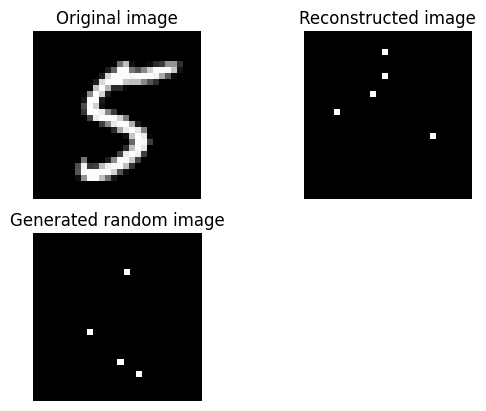

Epoch: 344
------

Train loss: 27.34
Test loss: 26.79
ELBO: 16.54454803466797


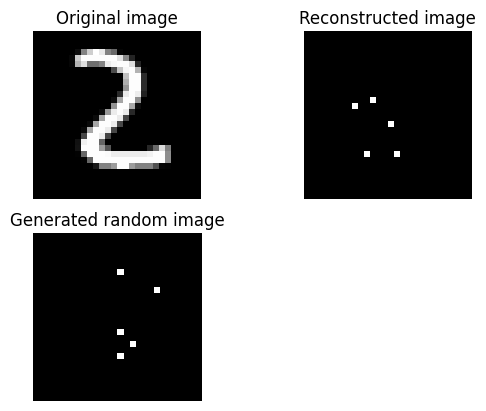

Epoch: 345
------

Train loss: 27.31
Test loss: 26.82
ELBO: 9.330913543701172


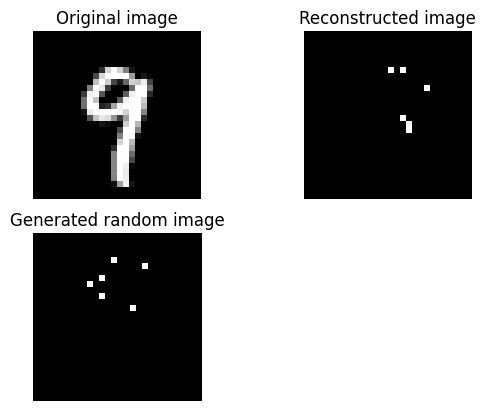

Epoch: 346
------

Train loss: 27.33
Test loss: 26.81
ELBO: 12.921456336975098


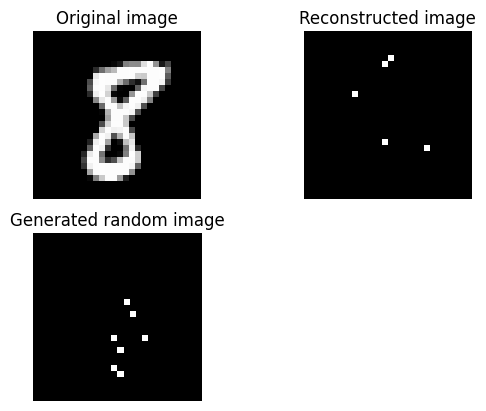

Epoch: 347
------

Train loss: 27.32
Test loss: 26.81
ELBO: 12.731816291809082


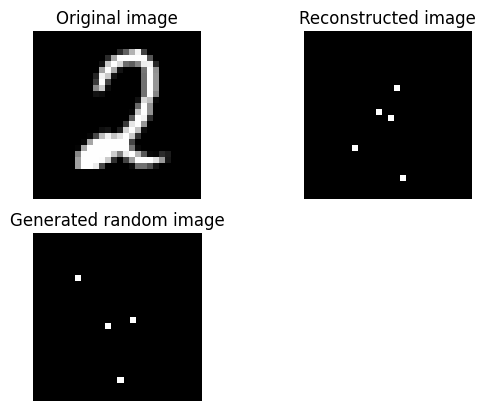

Epoch: 348
------

Train loss: 27.30
Test loss: 26.79
ELBO: 15.733583450317383


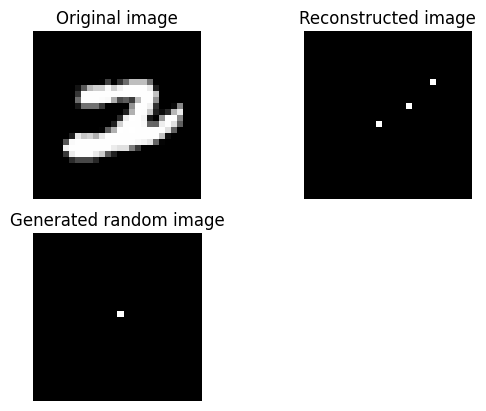

Epoch: 349
------

Train loss: 27.37
Test loss: 26.81
ELBO: 9.193939208984375


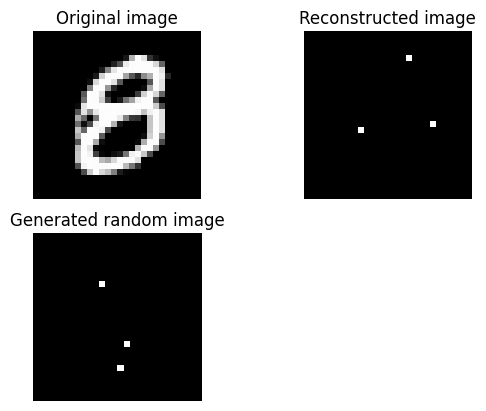

Epoch: 350
------

Train loss: 27.33
Test loss: 26.80
ELBO: 10.834765434265137


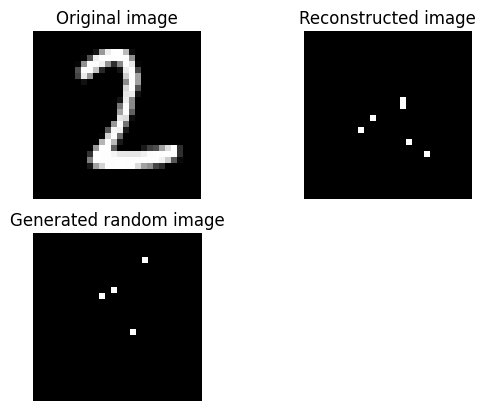

Epoch: 351
------

Train loss: 27.35
Test loss: 26.80
ELBO: 23.058151245117188


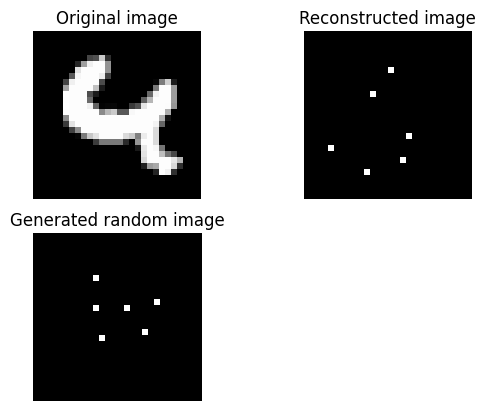

Epoch: 352
------

Train loss: 27.32
Test loss: 26.81
ELBO: 12.002232551574707


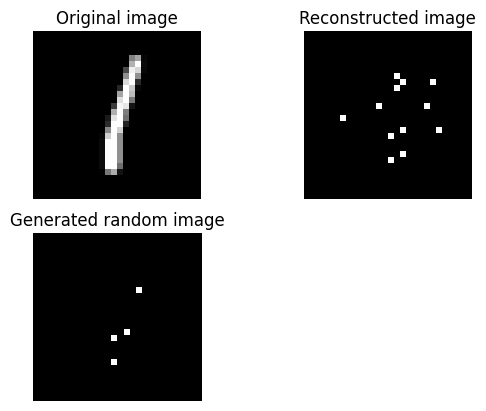

Epoch: 353
------

Train loss: 27.33
Test loss: 26.80
ELBO: 9.645402908325195


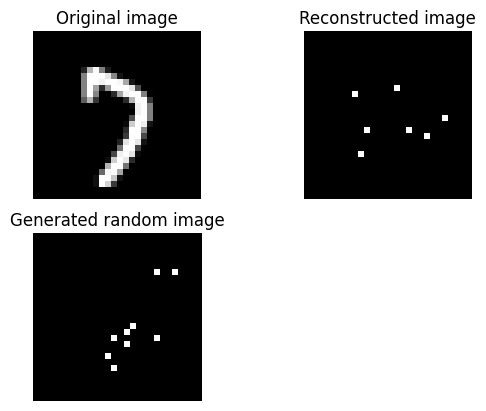

Epoch: 354
------

Train loss: 27.30
Test loss: 26.79
ELBO: 13.866146087646484


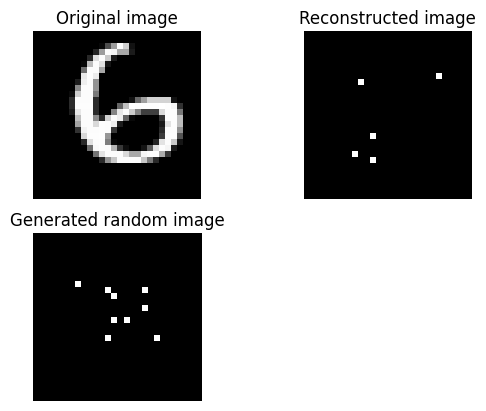

Epoch: 355
------

Train loss: 27.34
Test loss: 26.80
ELBO: 18.234783172607422


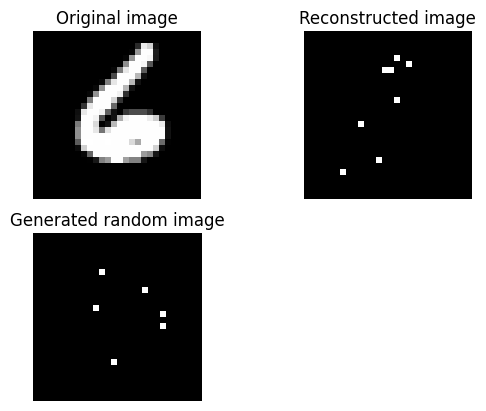

Epoch: 356
------

Train loss: 27.33
Test loss: 26.80
ELBO: 12.632197380065918


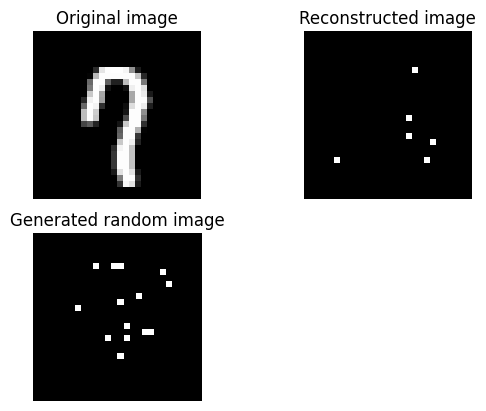

Epoch: 357
------

Train loss: 27.34
Test loss: 26.79
ELBO: 26.034832000732422


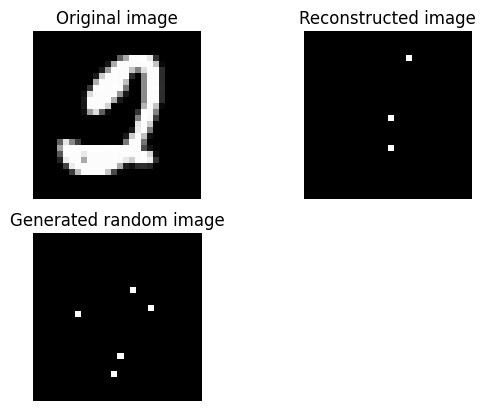

Epoch: 358
------

Train loss: 27.34
Test loss: 26.81
ELBO: 9.641448974609375


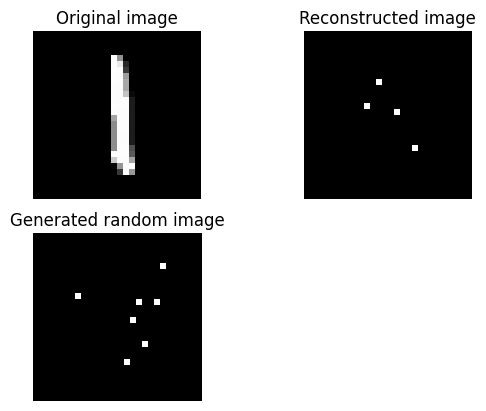

Epoch: 359
------

Train loss: 27.32
Test loss: 26.81
ELBO: 9.484476089477539


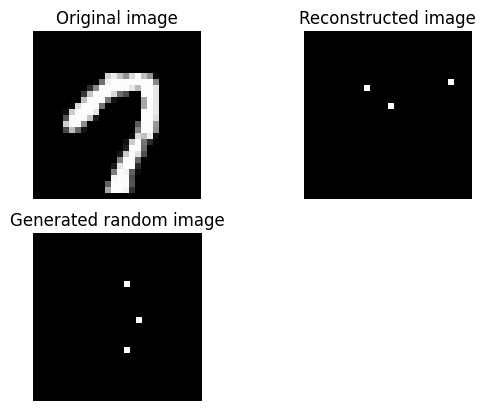

Epoch: 360
------

Train loss: 27.33
Test loss: 26.83
ELBO: 15.71773624420166


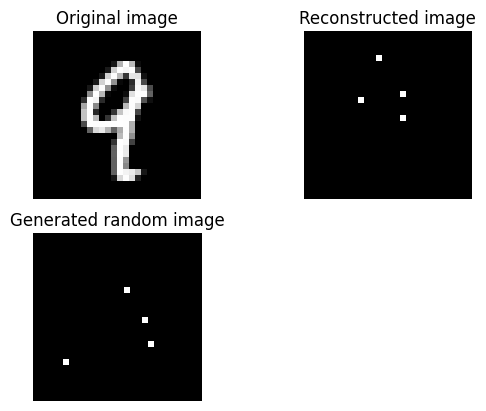

Epoch: 361
------

Train loss: 27.35
Test loss: 26.79
ELBO: 9.998912811279297


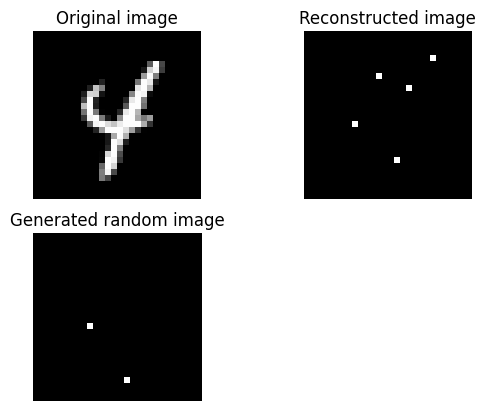

Epoch: 362
------

Train loss: 27.33
Test loss: 26.81
ELBO: 13.344237327575684


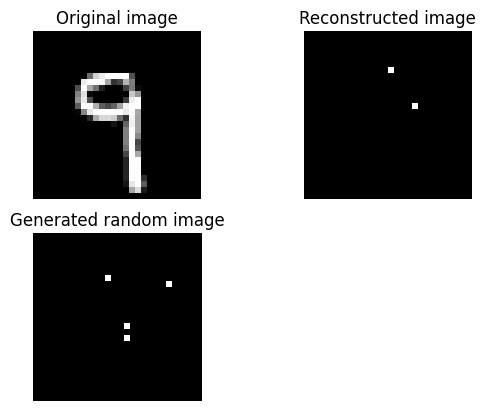

Epoch: 363
------

Train loss: 27.35
Test loss: 26.82
ELBO: 9.44339370727539


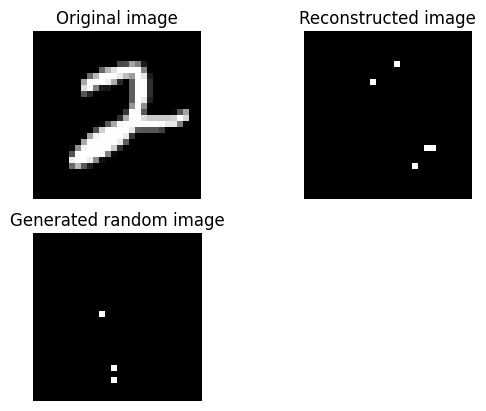

Epoch: 364
------

Train loss: 27.36
Test loss: 26.80
ELBO: 20.531278610229492


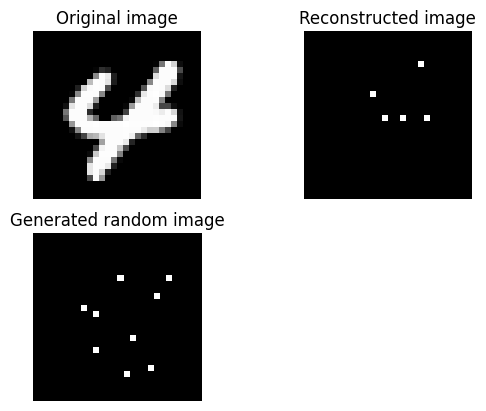

Epoch: 365
------

Train loss: 27.34
Test loss: 26.78
ELBO: 9.414722442626953


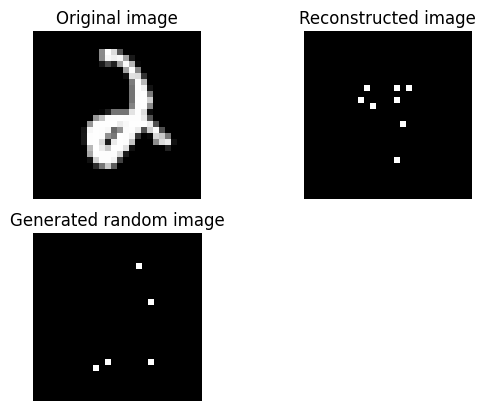

Epoch: 366
------

Train loss: 27.33
Test loss: 26.81
ELBO: 5.38306999206543


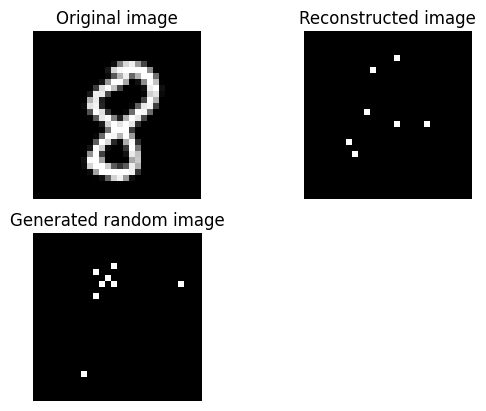

Epoch: 367
------

Train loss: 27.31
Test loss: 26.78
ELBO: 9.249563217163086


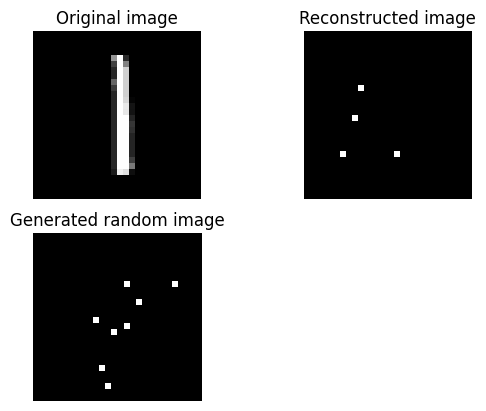

Epoch: 368
------

Train loss: 27.34
Test loss: 26.80
ELBO: 8.669206619262695


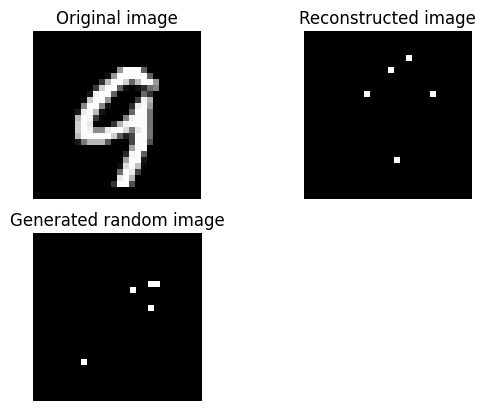

Epoch: 369
------

Train loss: 27.33
Test loss: 26.80
ELBO: 5.139655113220215


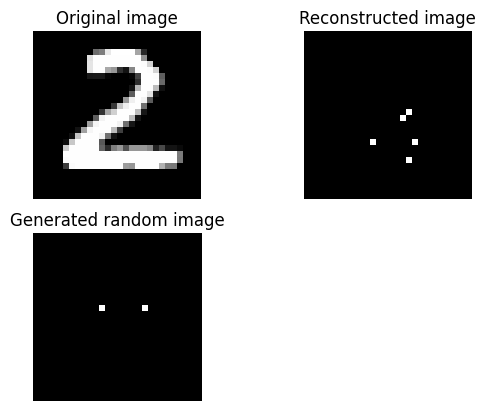

Epoch: 370
------

Train loss: 27.33
Test loss: 26.79
ELBO: 29.118364334106445


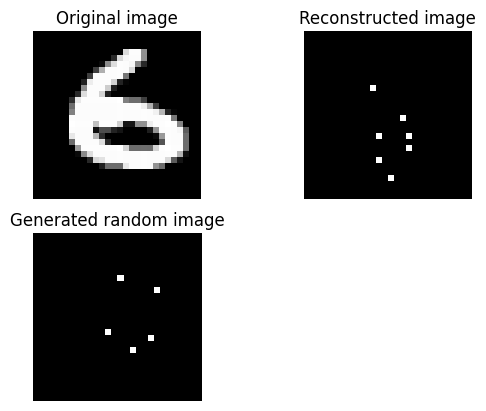

Epoch: 371
------

Train loss: 27.34
Test loss: 26.80
ELBO: 8.93829345703125


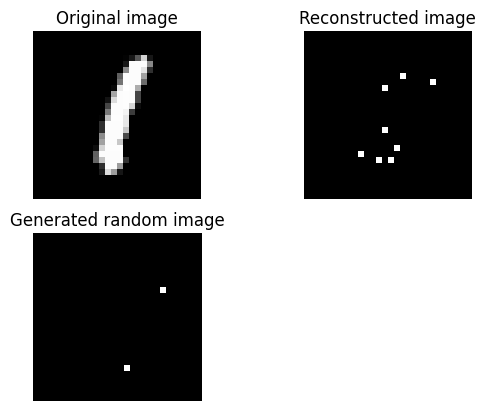

Epoch: 372
------

Train loss: 27.32
Test loss: 26.78
ELBO: 8.698027610778809


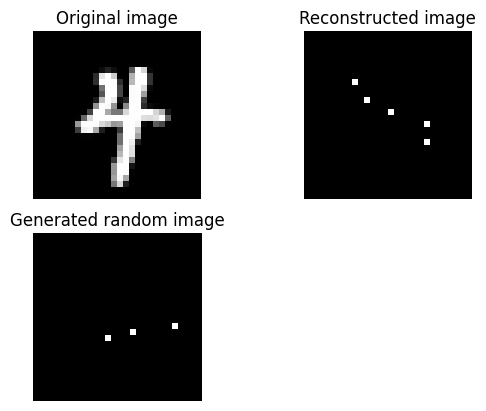

Epoch: 373
------

Train loss: 27.33
Test loss: 26.83
ELBO: 8.453229904174805


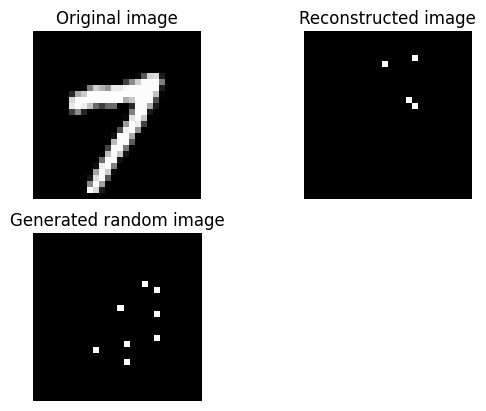

Epoch: 374
------

Train loss: 27.34
Test loss: 26.79
ELBO: 13.999631881713867


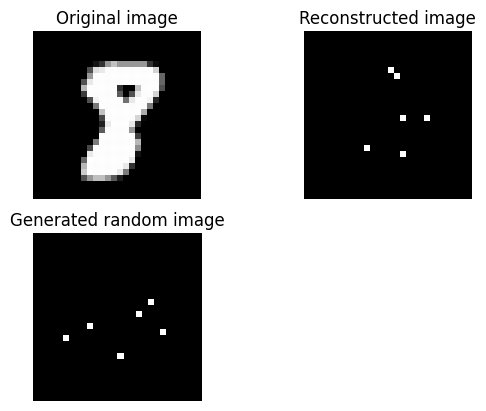

Epoch: 375
------

Train loss: 27.30
Test loss: 26.81
ELBO: 9.427926063537598


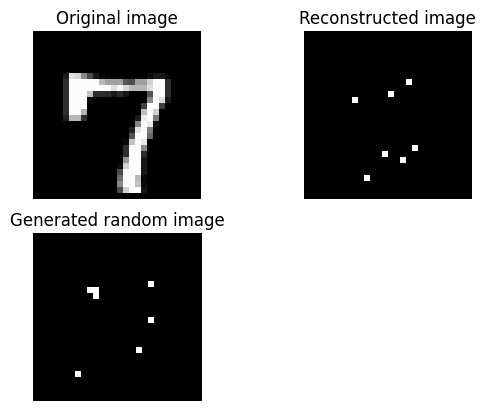

Epoch: 376
------

Train loss: 27.33
Test loss: 26.80
ELBO: 248.46408081054688


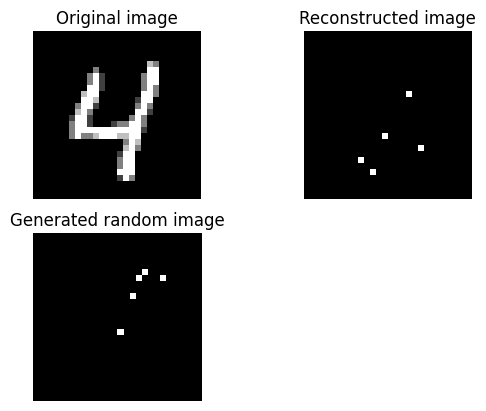

Epoch: 377
------

Train loss: 27.35
Test loss: 26.82
ELBO: 9.065621376037598


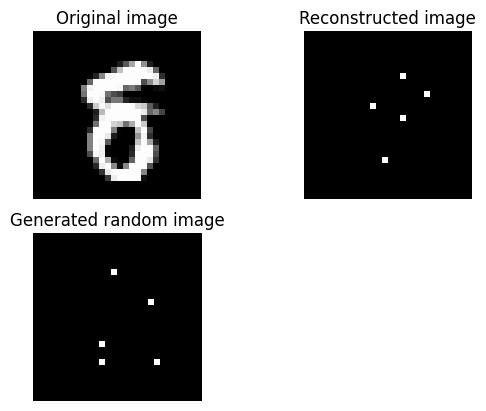

Epoch: 378
------

Train loss: 27.33
Test loss: 26.83
ELBO: 8.795372009277344


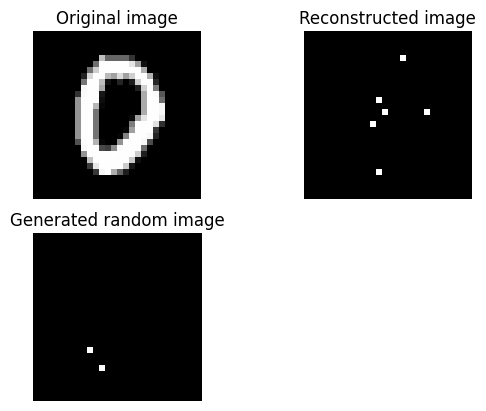

Epoch: 379
------

Train loss: 27.35
Test loss: 26.80
ELBO: 9.760007858276367


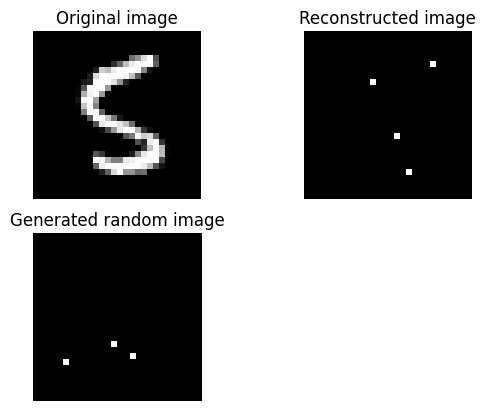

Epoch: 380
------

Train loss: 27.33
Test loss: 26.80
ELBO: 9.445229530334473


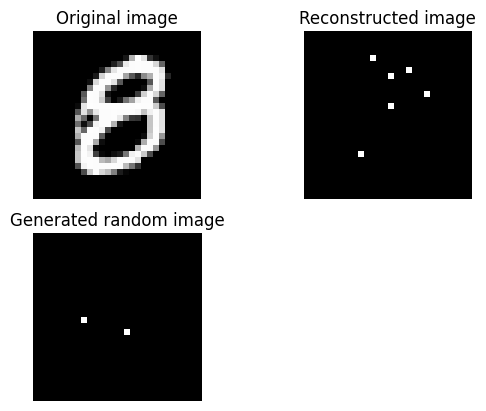

Epoch: 381
------

Train loss: 27.36
Test loss: 26.81
ELBO: 12.517541885375977


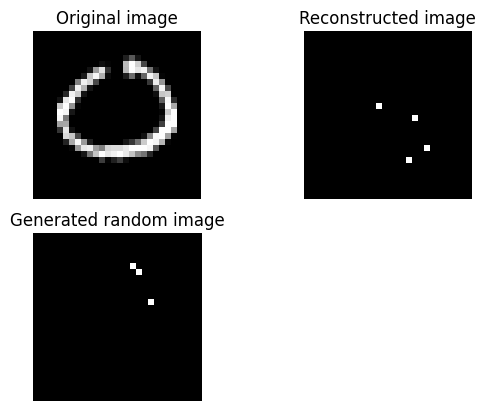

Epoch: 382
------

Train loss: 27.33
Test loss: 26.81
ELBO: 5.330517768859863


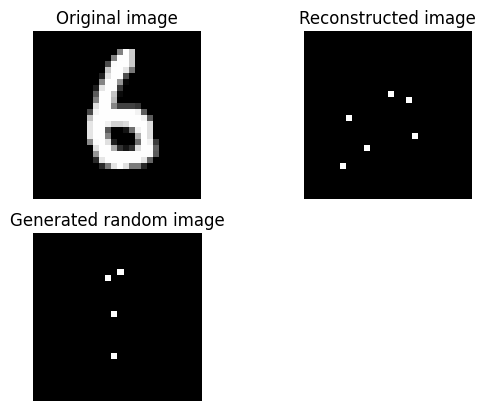

Epoch: 383
------

Train loss: 27.33
Test loss: 26.81
ELBO: 408.4661865234375


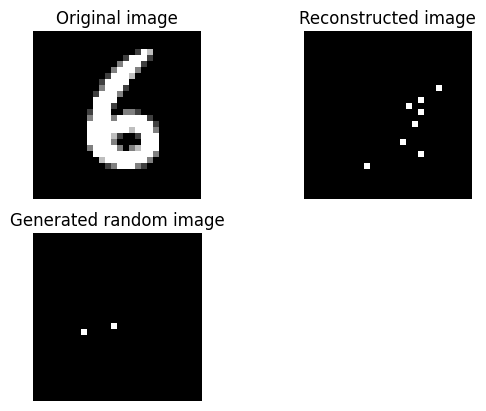

Epoch: 384
------

Train loss: 27.32
Test loss: 26.81
ELBO: 8.973816871643066


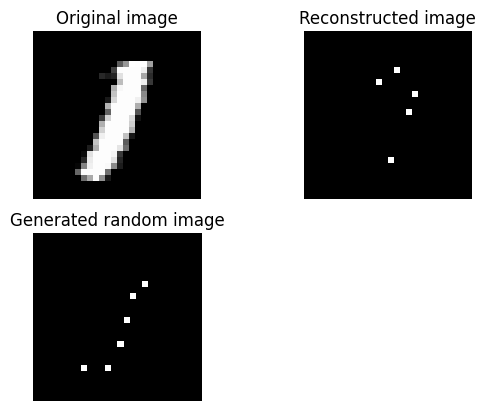

Epoch: 385
------

Train loss: 27.36
Test loss: 26.79
ELBO: 10.699716567993164


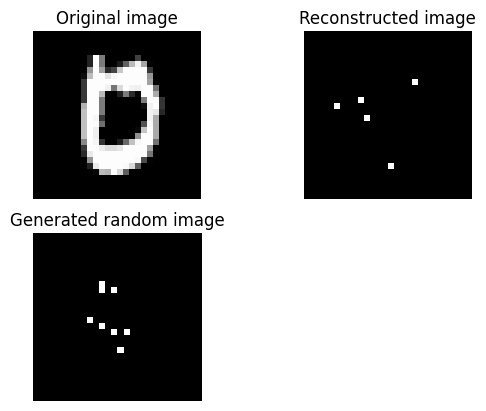

Epoch: 386
------

Train loss: 27.36
Test loss: 26.80
ELBO: 21.08197593688965


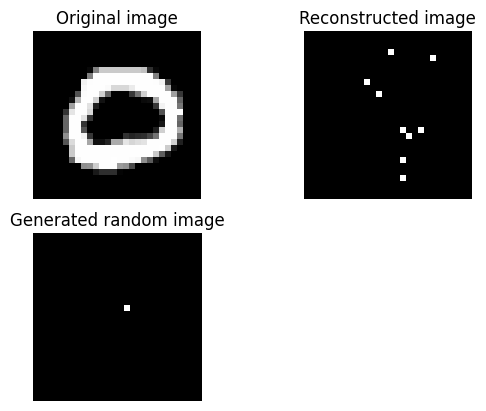

Epoch: 387
------

Train loss: 27.42
Test loss: 26.79
ELBO: 9.17266845703125


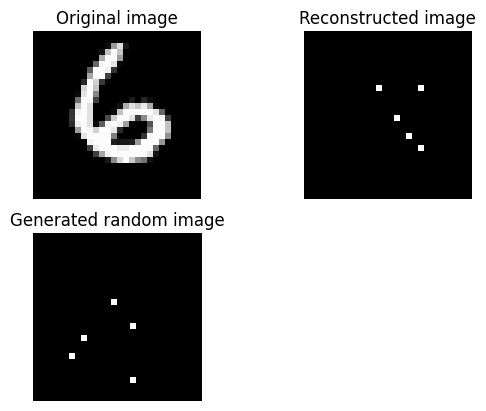

Epoch: 388
------

Train loss: 27.33
Test loss: 26.82
ELBO: 8.62597370147705


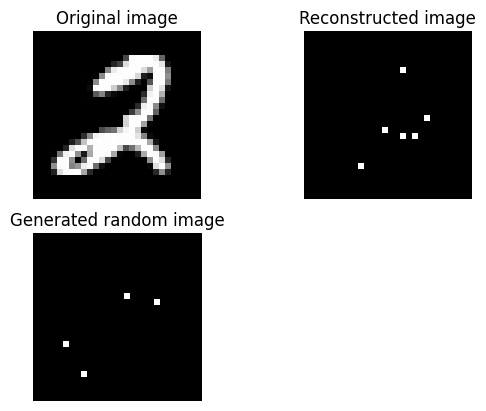

Epoch: 389
------

Train loss: 27.38
Test loss: 26.83
ELBO: 9.878816604614258


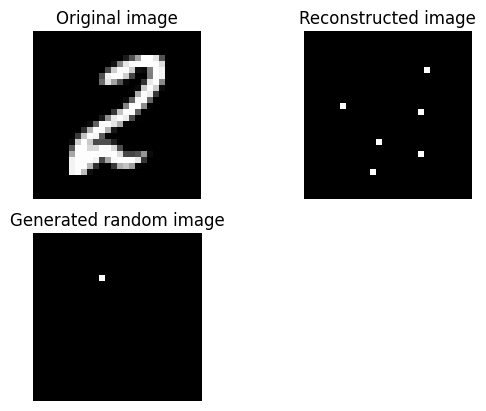

Epoch: 390
------

Train loss: 27.36
Test loss: 26.80
ELBO: 8.912912368774414


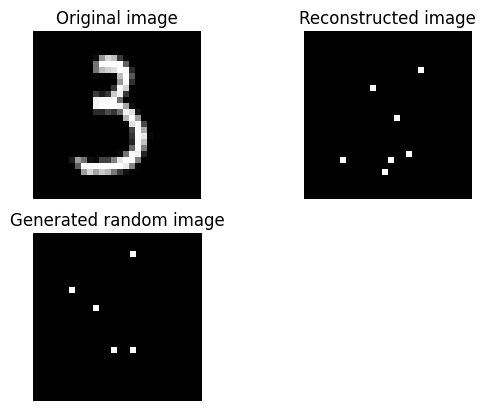

Epoch: 391
------

Train loss: 27.33
Test loss: 26.79
ELBO: 9.010223388671875


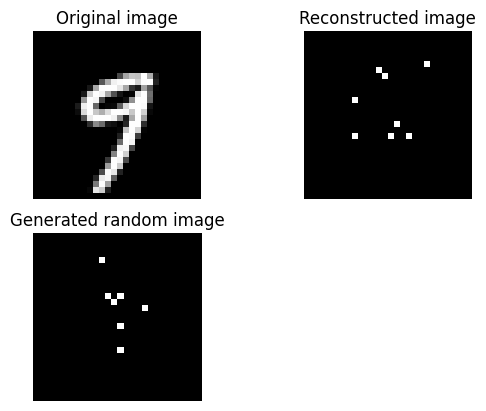

Epoch: 392
------

Train loss: 27.36
Test loss: 26.78
ELBO: 8.344440460205078


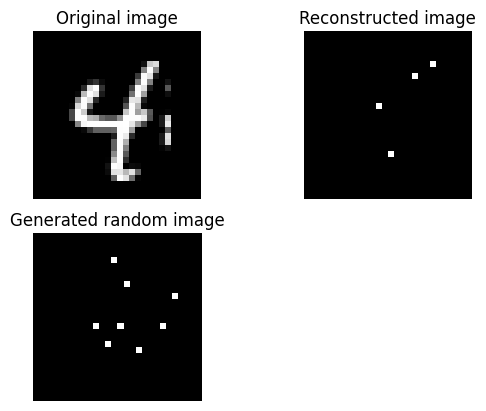

Epoch: 393
------

Train loss: 27.31
Test loss: 26.83
ELBO: 11.064811706542969


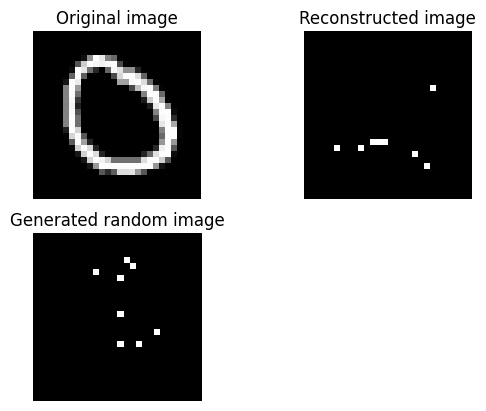

Epoch: 394
------

Train loss: 27.33
Test loss: 26.81
ELBO: 17.33592987060547


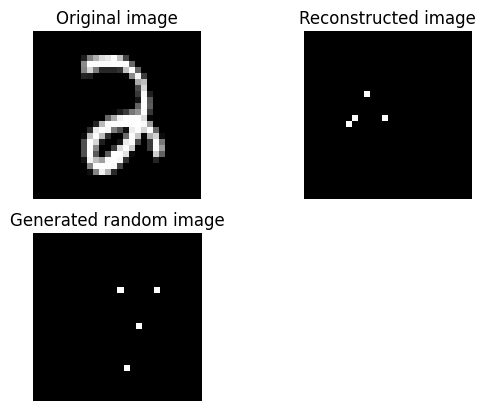

Epoch: 395
------

Train loss: 27.35
Test loss: 26.79
ELBO: 8.378351211547852


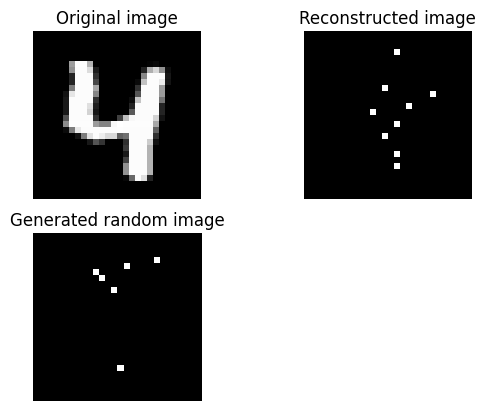

Epoch: 396
------

Train loss: 27.34
Test loss: 26.79
ELBO: 12.368978500366211


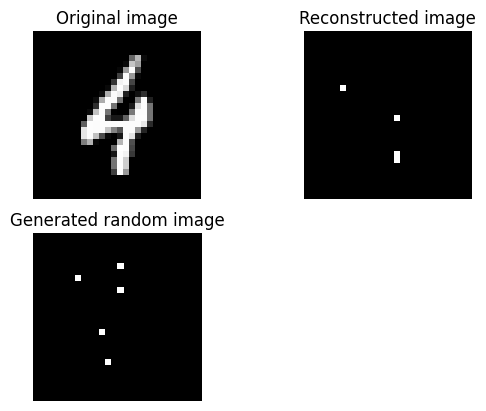

Epoch: 397
------

Train loss: 27.31
Test loss: 26.80
ELBO: 17.044321060180664


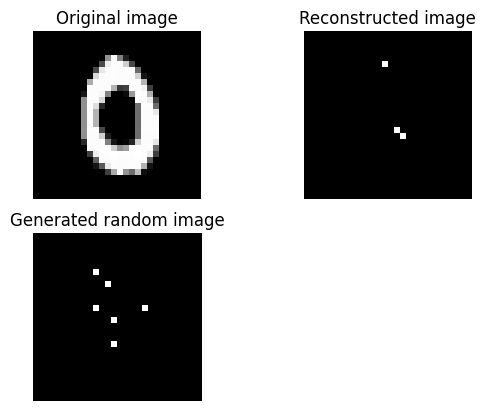

Epoch: 398
------

Train loss: 27.38
Test loss: 26.84
ELBO: 9.066088676452637


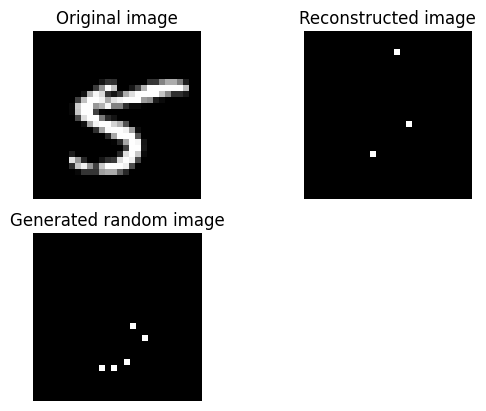

Epoch: 399
------

Train loss: 27.35
Test loss: 26.81
ELBO: 384.615478515625


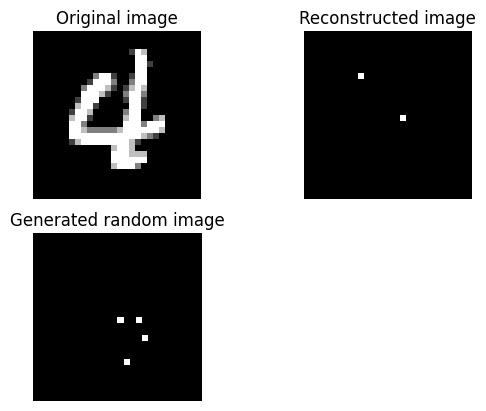

Epoch: 400
------

Train loss: 27.37
Test loss: 26.78
ELBO: 12.535825729370117


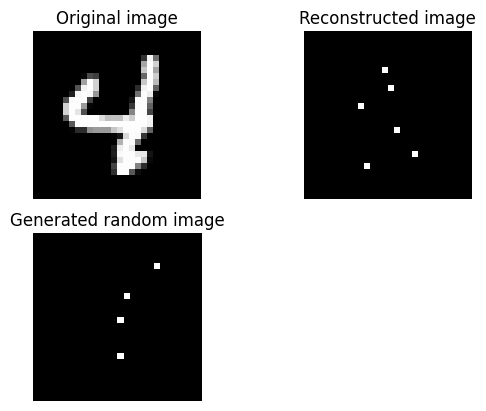

Epoch: 401
------

Train loss: 27.35
Test loss: 26.80
ELBO: 9.086982727050781


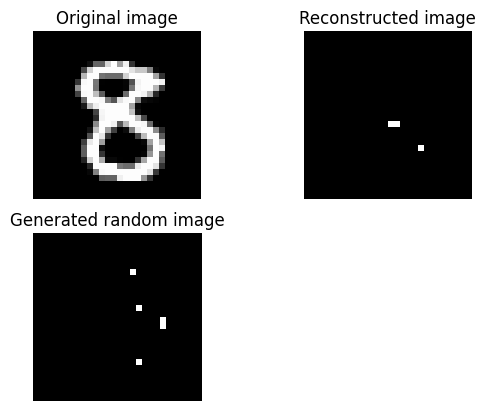

Epoch: 402
------

Train loss: 27.33
Test loss: 26.79
ELBO: 8.93740463256836


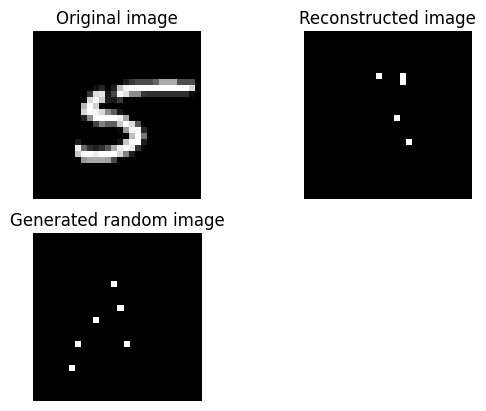

Epoch: 403
------

Train loss: 27.35
Test loss: 26.79
ELBO: 8.873624801635742


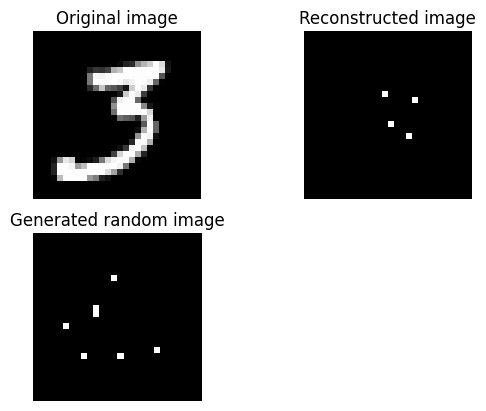

Epoch: 404
------

Train loss: 27.33
Test loss: 26.80
ELBO: 8.883999824523926


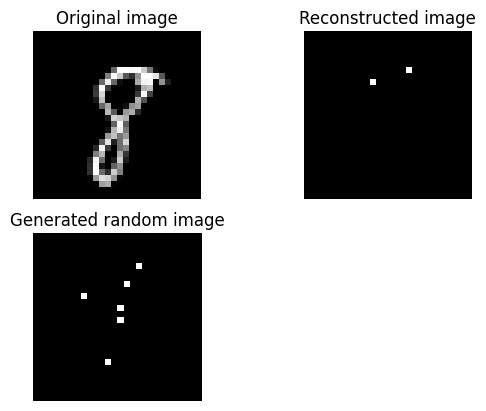

Epoch: 405
------

Train loss: 27.33
Test loss: 26.83
ELBO: 9.992504119873047


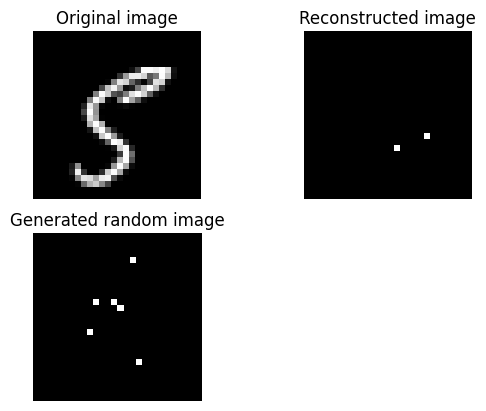

Epoch: 406
------

Train loss: 27.32
Test loss: 26.78
ELBO: 9.54169750213623


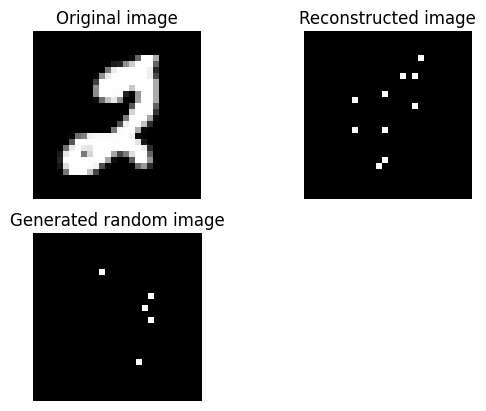

Epoch: 407
------

Train loss: 27.34
Test loss: 26.78
ELBO: 9.552319526672363


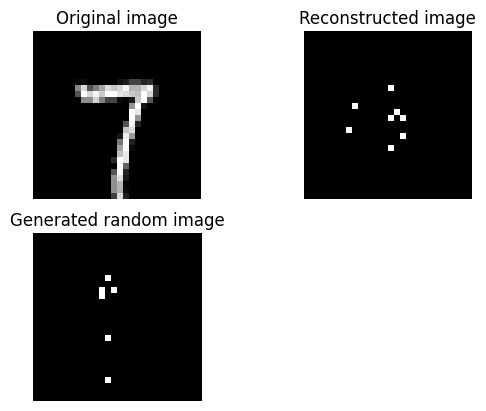

Epoch: 408
------

Train loss: 27.31
Test loss: 26.86
ELBO: 12.310283660888672


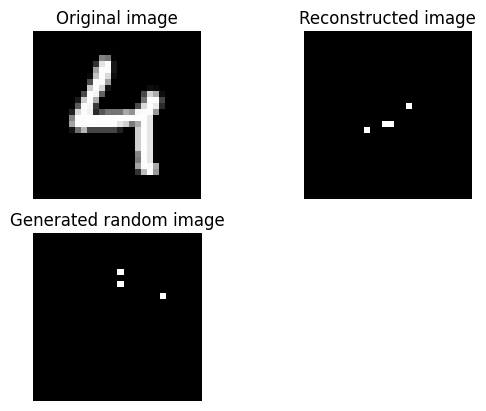

Epoch: 409
------

Train loss: 27.34
Test loss: 26.81
ELBO: 19.907764434814453


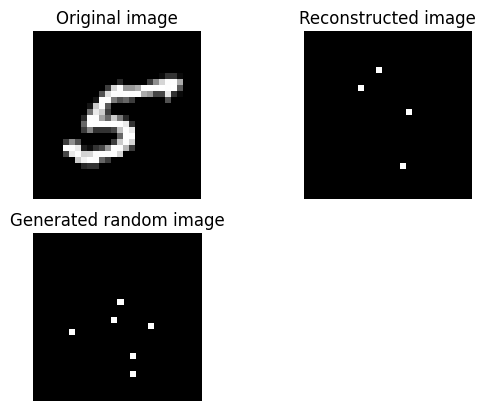

Epoch: 410
------

Train loss: 27.33
Test loss: 26.80
ELBO: 10.304912567138672


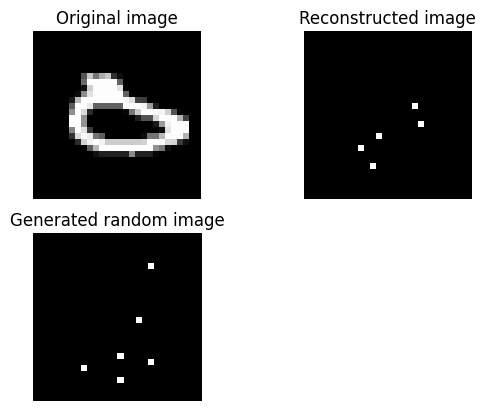

Epoch: 411
------

Train loss: 27.33
Test loss: 26.78
ELBO: 9.817917823791504


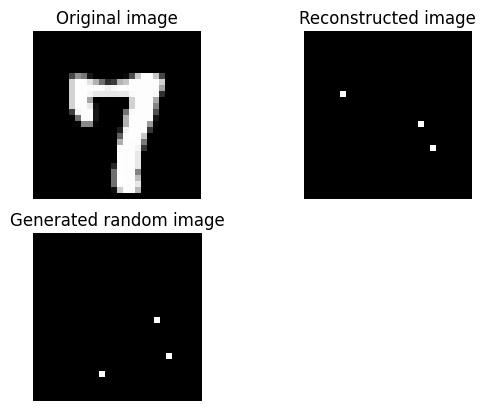

Epoch: 412
------

Train loss: 27.33
Test loss: 26.80
ELBO: 20.188262939453125


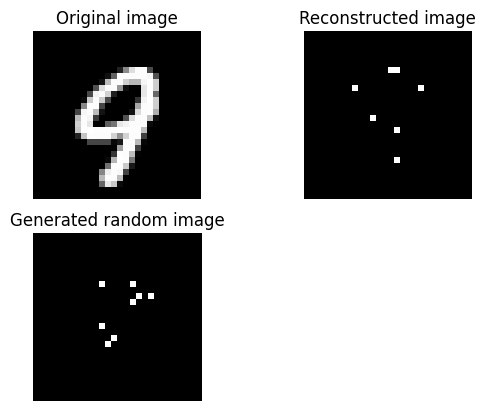

Epoch: 413
------

Train loss: 27.32
Test loss: 26.80
ELBO: 9.165104866027832


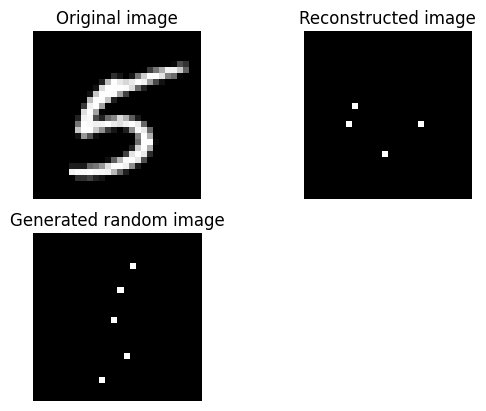

Epoch: 414
------

Train loss: 27.31
Test loss: 26.79
ELBO: 9.432991981506348


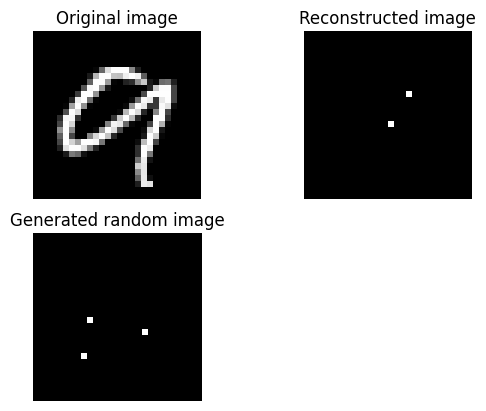

Epoch: 415
------

Train loss: 27.31
Test loss: 26.79
ELBO: 8.877859115600586


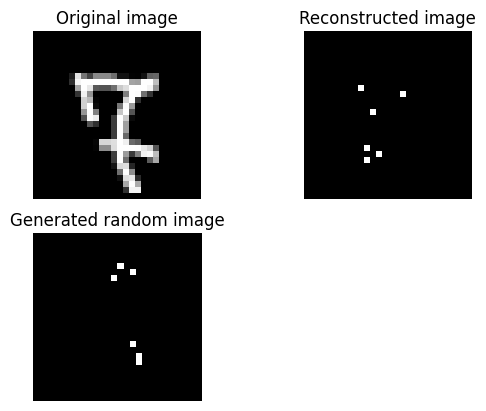

Epoch: 416
------

Train loss: 27.36
Test loss: 26.79
ELBO: 12.252225875854492


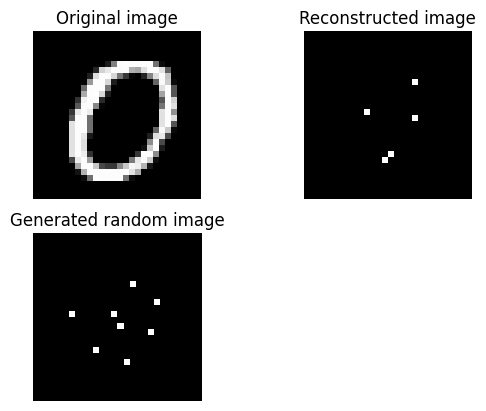

Epoch: 417
------

Train loss: 27.35
Test loss: 26.84
ELBO: 9.161066055297852


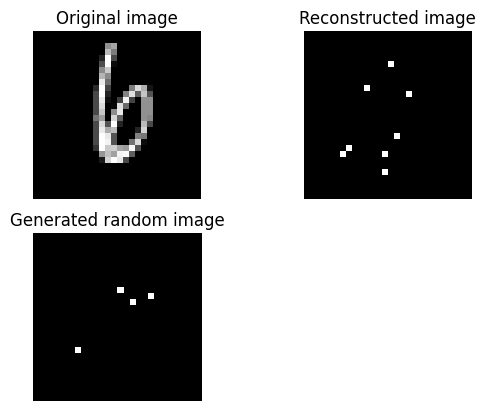

Epoch: 418
------

Train loss: 27.33
Test loss: 26.79
ELBO: 9.349946975708008


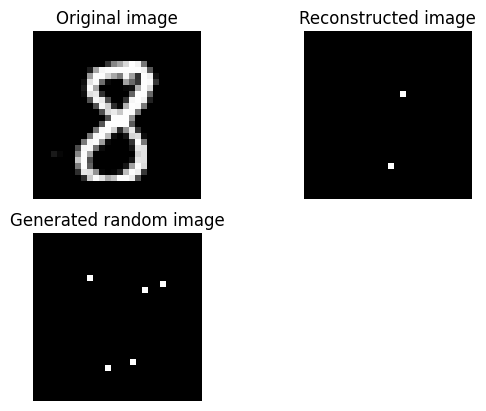

Epoch: 419
------

Train loss: 27.31
Test loss: 26.84
ELBO: 5.210964679718018


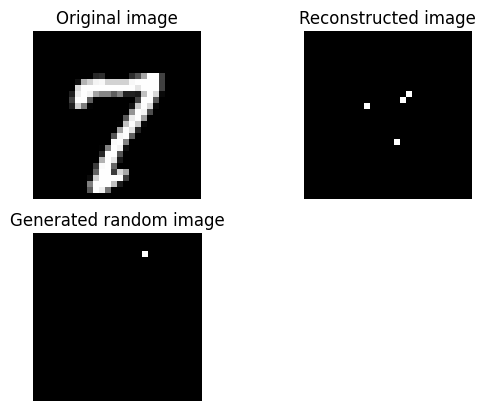

Epoch: 420
------

Train loss: 27.31
Test loss: 26.81
ELBO: 17.29307746887207


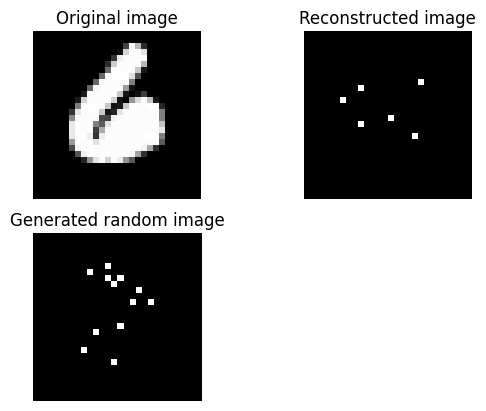

Epoch: 421
------

Train loss: 27.33
Test loss: 26.78
ELBO: 5.157967567443848


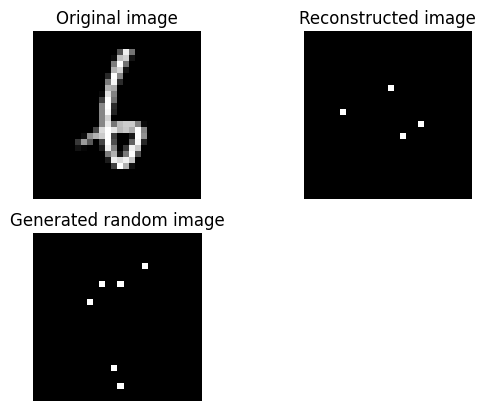

Epoch: 422
------

Train loss: 27.30
Test loss: 26.81
ELBO: 5.100576400756836


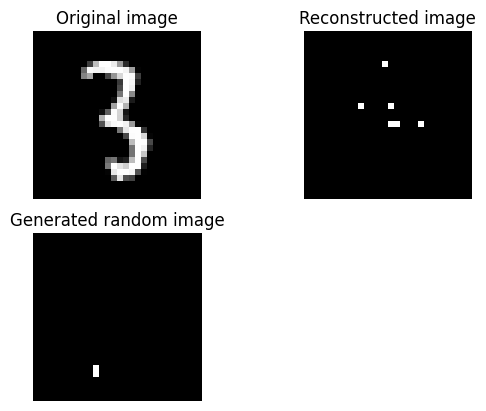

Epoch: 423
------

Train loss: 27.33
Test loss: 26.82
ELBO: 10.001380920410156


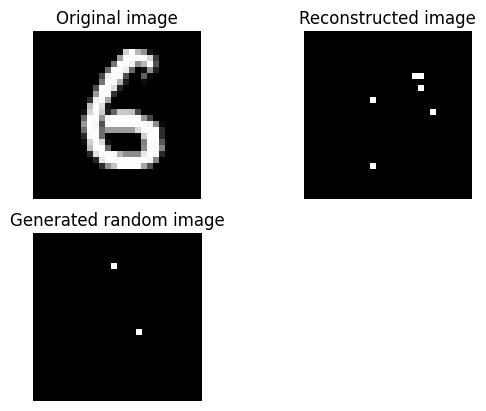

Epoch: 424
------

Train loss: 27.35
Test loss: 26.79
ELBO: 8.941505432128906


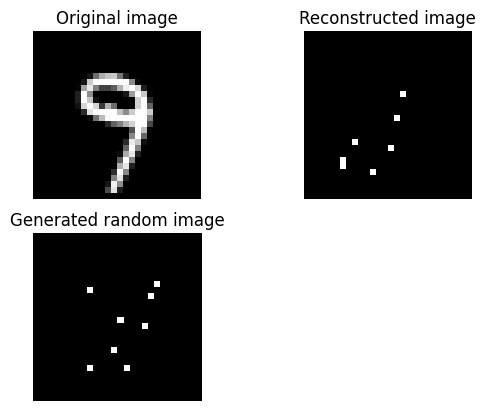

Epoch: 425
------

Train loss: 27.32
Test loss: 26.79
ELBO: 10.03664779663086


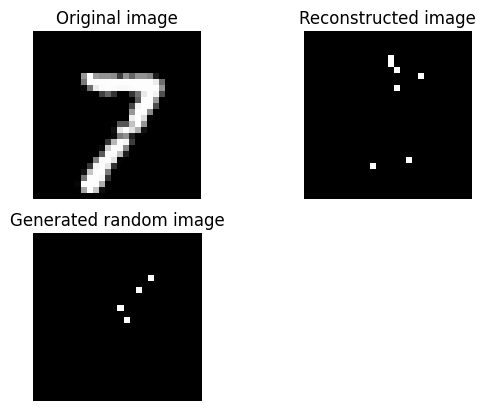

Epoch: 426
------

Train loss: 27.35
Test loss: 26.80
ELBO: 13.14984130859375


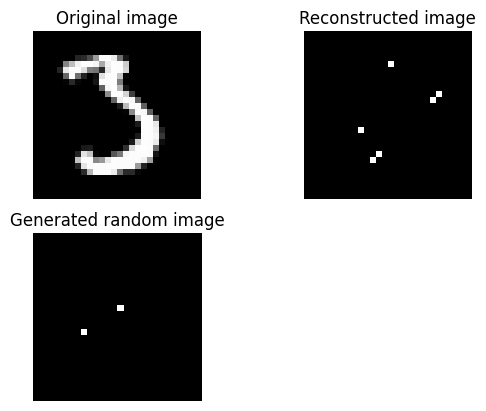

Epoch: 427
------

Train loss: 27.32
Test loss: 26.79
ELBO: 8.851765632629395


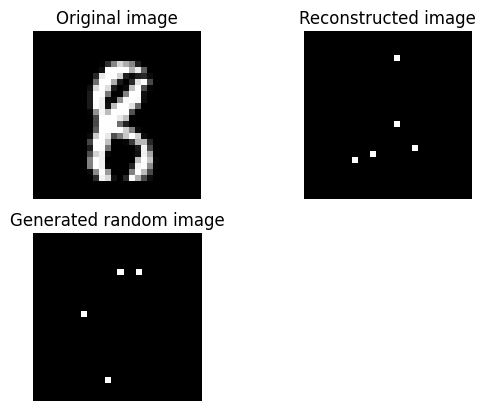

Epoch: 428
------

Train loss: 27.37
Test loss: 26.83
ELBO: 8.74212646484375


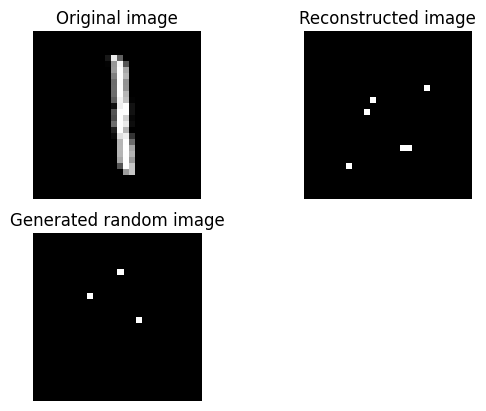

Epoch: 429
------

Train loss: 27.33
Test loss: 26.81
ELBO: 258.2679748535156


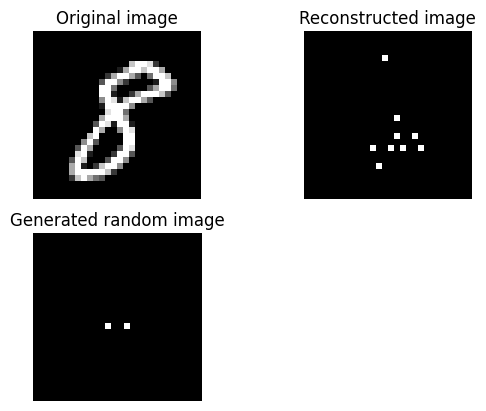

Epoch: 430
------

Train loss: 27.31
Test loss: 26.78
ELBO: 8.843158721923828


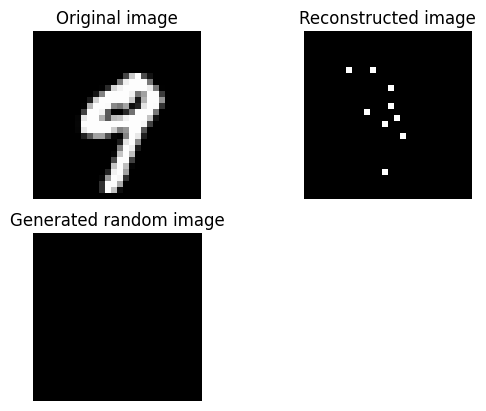

Epoch: 431
------

Train loss: 27.36
Test loss: 26.80
ELBO: 23.025184631347656


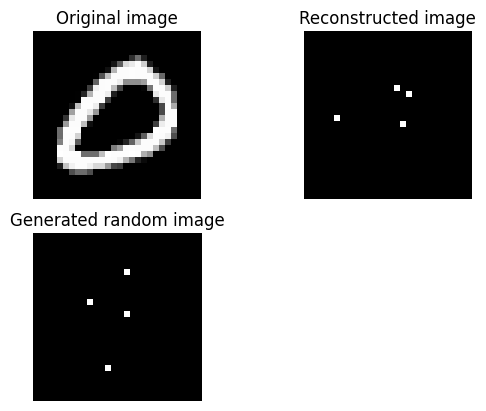

Epoch: 432
------

Train loss: 27.33
Test loss: 26.78
ELBO: 9.249930381774902


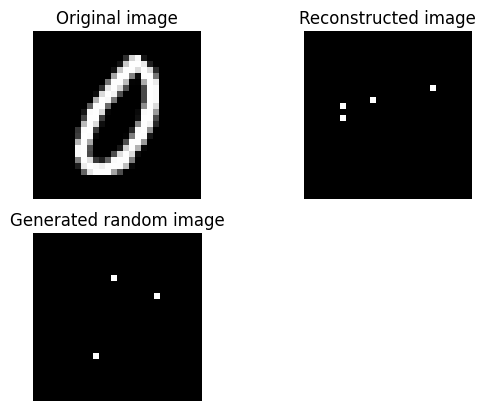

Epoch: 433
------

Train loss: 27.34
Test loss: 26.79
ELBO: 8.186073303222656


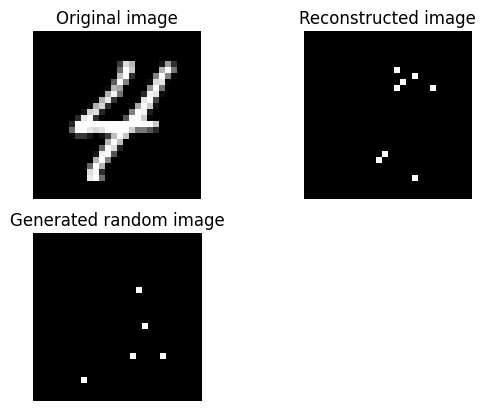

Epoch: 434
------

Train loss: 27.33
Test loss: 26.82
ELBO: 5.491586208343506


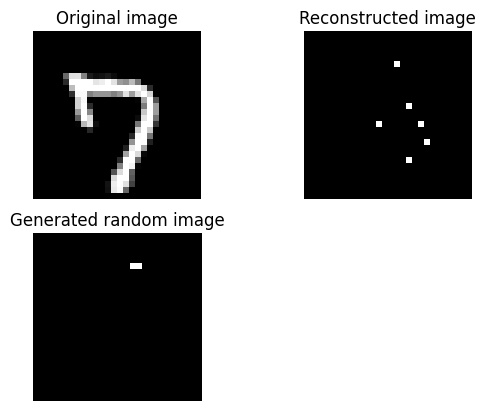

Epoch: 435
------

Train loss: 27.33
Test loss: 26.82
ELBO: 16.846532821655273


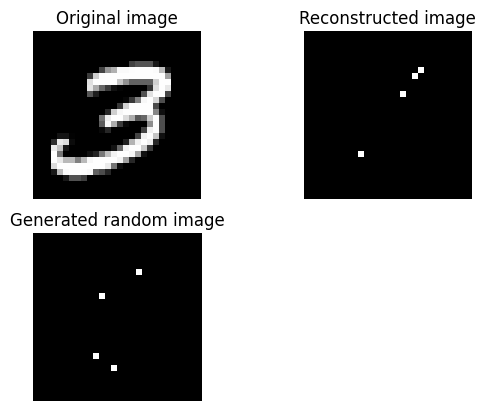

Epoch: 436
------

Train loss: 27.34
Test loss: 26.82
ELBO: 8.34011173248291


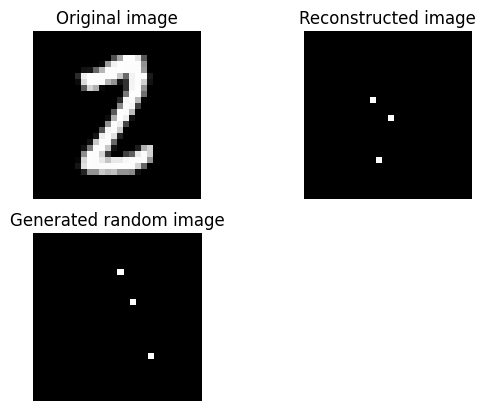

Epoch: 437
------

Train loss: 27.33
Test loss: 26.80
ELBO: 10.731548309326172


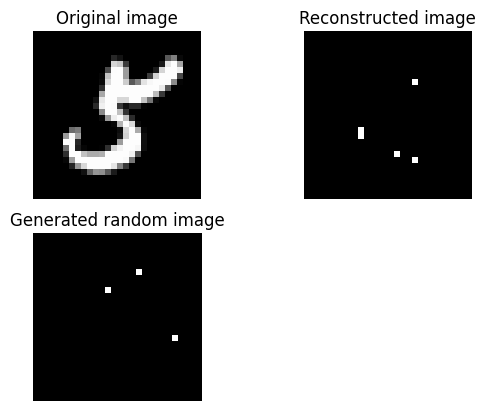

Epoch: 438
------

Train loss: 27.35
Test loss: 26.81
ELBO: 9.257848739624023


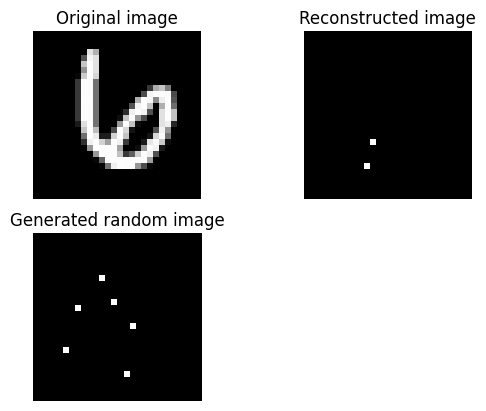

Epoch: 439
------

Train loss: 27.32
Test loss: 26.81
ELBO: 9.231773376464844


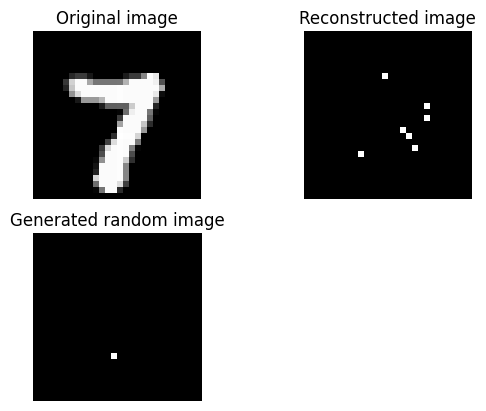

Epoch: 440
------

Train loss: 27.35
Test loss: 26.81
ELBO: 176.4176788330078


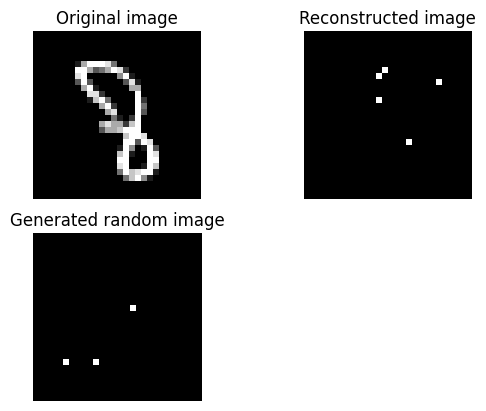

Epoch: 441
------

Train loss: 27.38
Test loss: 26.81
ELBO: 4.854720592498779


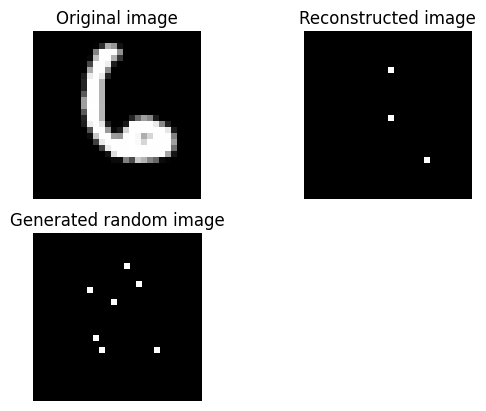

Epoch: 442
------

Train loss: 27.37
Test loss: 26.82
ELBO: 8.867951393127441


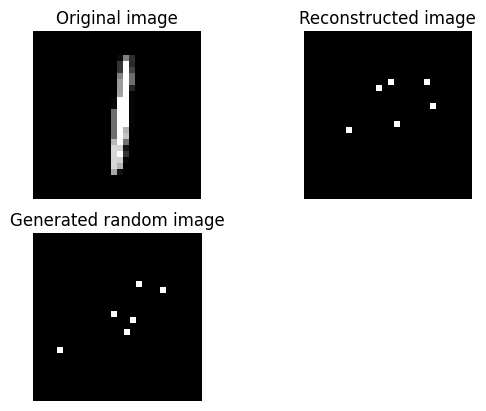

Epoch: 443
------

Train loss: 27.34
Test loss: 26.83
ELBO: 9.139945030212402


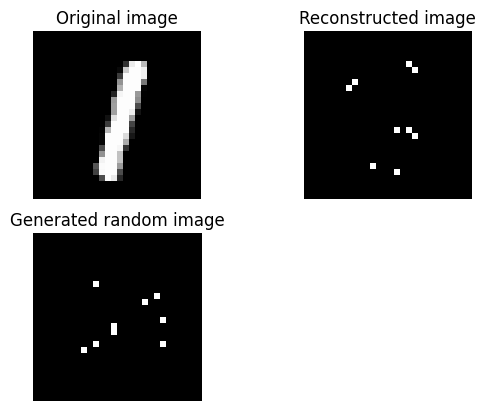

Epoch: 444
------

Train loss: 27.36
Test loss: 26.79
ELBO: 274.2496643066406


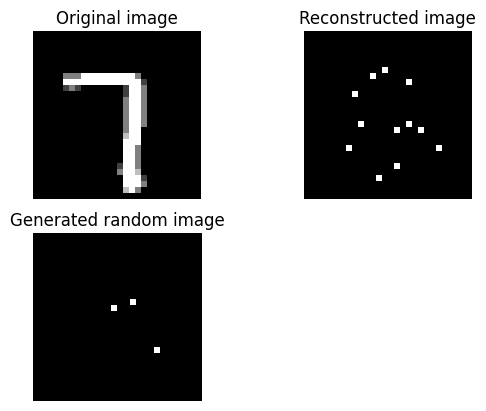

Epoch: 445
------

Train loss: 27.33
Test loss: 26.80
ELBO: 8.636366844177246


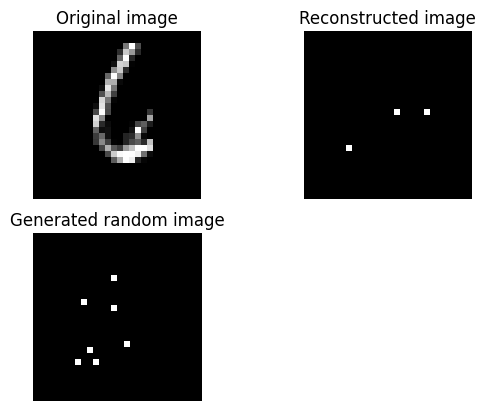

Epoch: 446
------

Train loss: 27.33
Test loss: 26.80
ELBO: 8.772042274475098


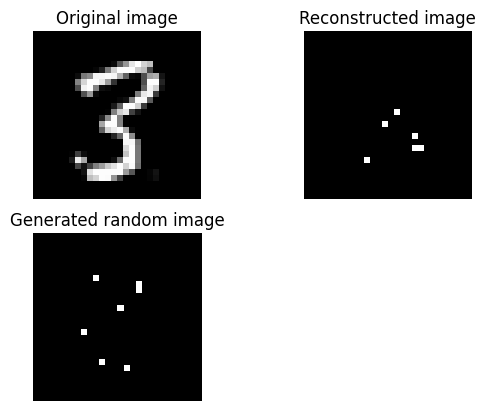

Epoch: 447
------

Train loss: 27.36
Test loss: 26.80
ELBO: 9.028006553649902


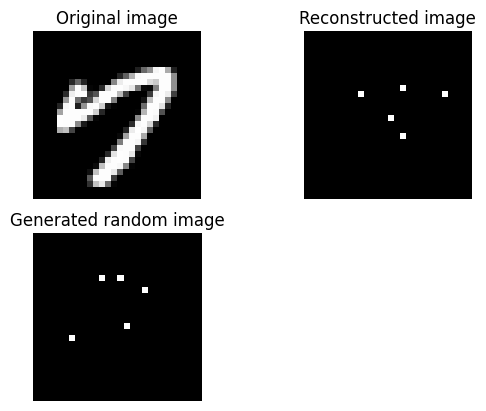

Epoch: 448
------

Train loss: 27.31
Test loss: 26.82
ELBO: 9.218257904052734


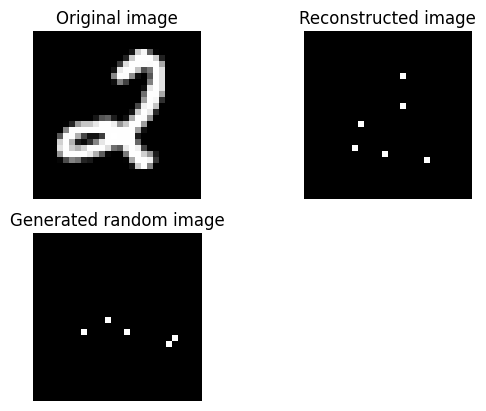

Epoch: 449
------

Train loss: 27.30
Test loss: 26.81
ELBO: 17.34981918334961


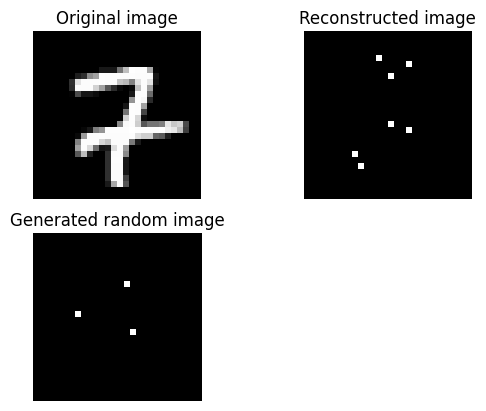

Epoch: 450
------

Train loss: 27.32
Test loss: 26.84
ELBO: 9.740276336669922


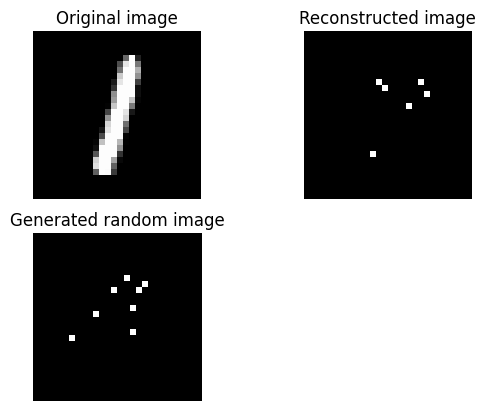

Epoch: 451
------

Train loss: 27.34
Test loss: 26.81
ELBO: 8.84914779663086


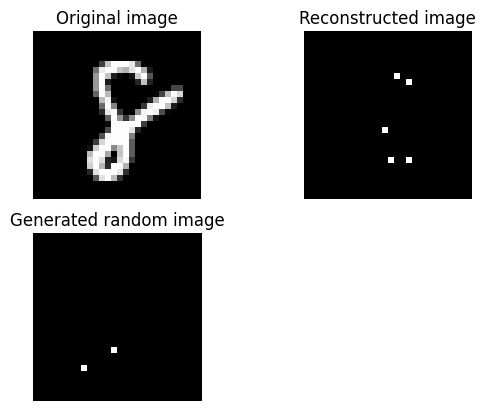

Epoch: 452
------

Train loss: 27.35
Test loss: 26.80
ELBO: 5.536646366119385


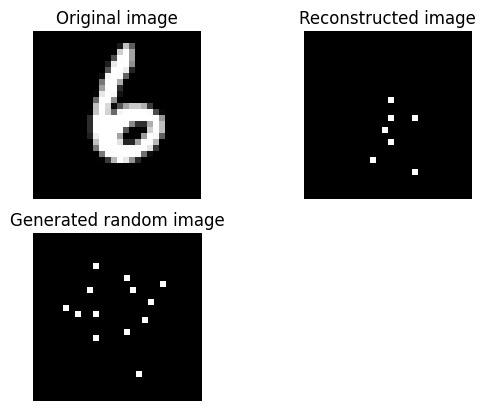

Epoch: 453
------

Train loss: 27.32
Test loss: 26.78
ELBO: 74.86471557617188


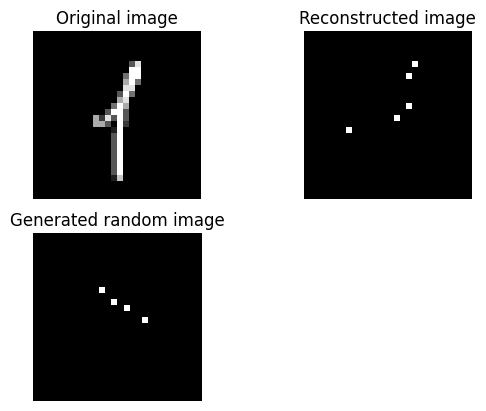

Epoch: 454
------

Train loss: 27.37
Test loss: 26.78
ELBO: 5.0308427810668945


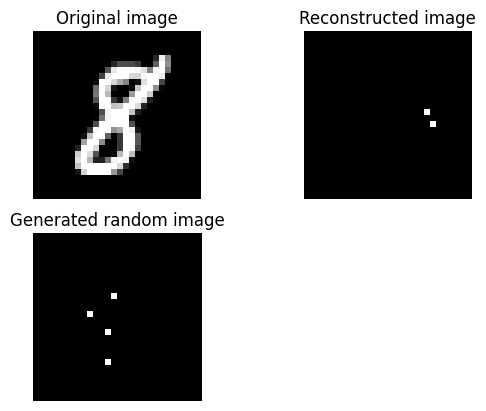

Epoch: 455
------

Train loss: 27.32
Test loss: 26.79
ELBO: 12.680034637451172


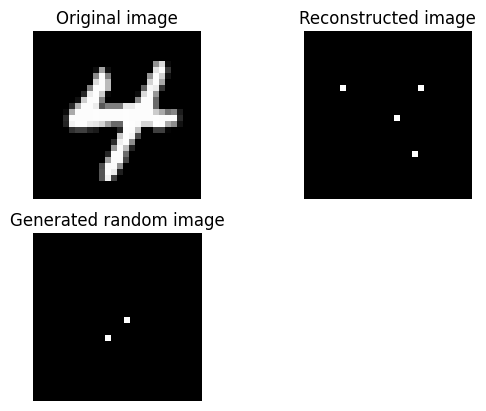

Epoch: 456
------

Train loss: 27.32
Test loss: 26.80
ELBO: 13.152398109436035


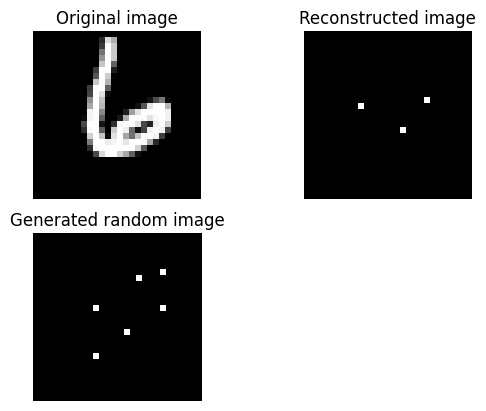

Epoch: 457
------

Train loss: 27.35
Test loss: 26.80
ELBO: 35.76535415649414


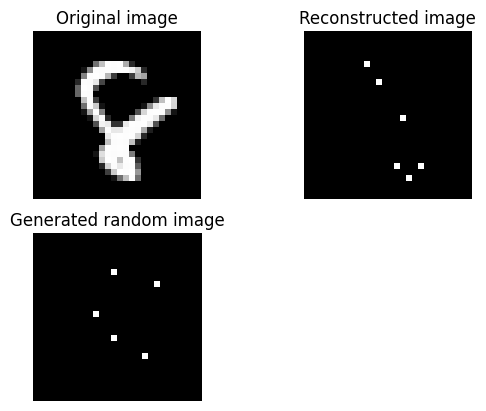

Epoch: 458
------

Train loss: 27.35
Test loss: 26.83
ELBO: 10.122581481933594


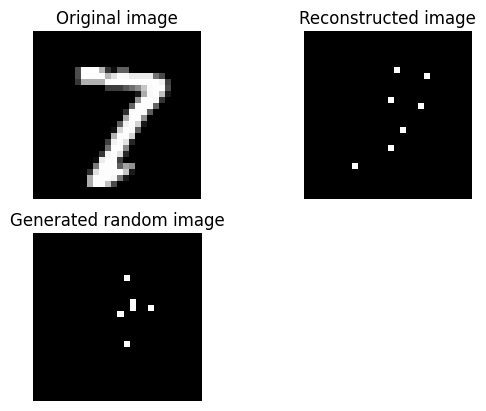

Epoch: 459
------

Train loss: 27.33
Test loss: 26.81
ELBO: 8.350582122802734


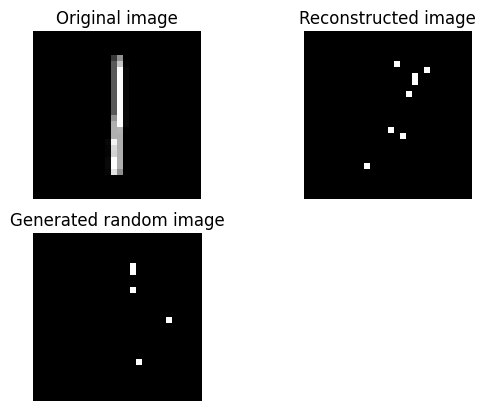

Epoch: 460
------

Train loss: 27.35
Test loss: 26.80
ELBO: 8.973925590515137


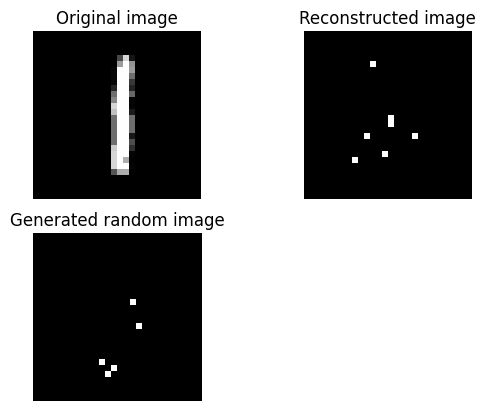

Epoch: 461
------

Train loss: 27.32
Test loss: 26.79
ELBO: 5.330958366394043


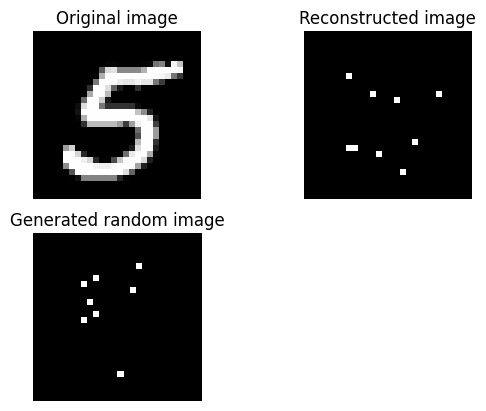

Epoch: 462
------

Train loss: 27.35
Test loss: 26.78
ELBO: 12.481660842895508


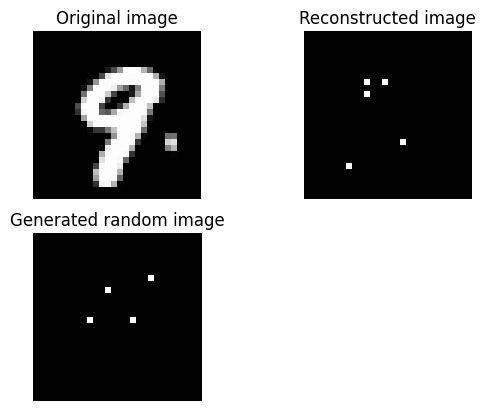

Epoch: 463
------

Train loss: 27.32
Test loss: 26.78
ELBO: 10.35935115814209


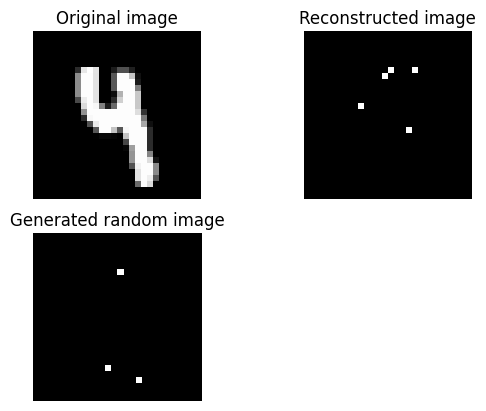

Epoch: 464
------

Train loss: 27.33
Test loss: 26.80
ELBO: 16.713348388671875


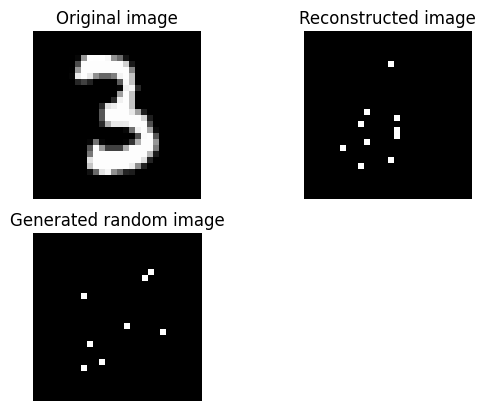

Epoch: 465
------

Train loss: 27.35
Test loss: 26.81
ELBO: 8.180183410644531


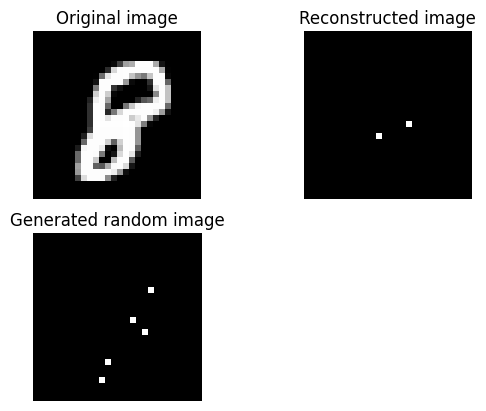

Epoch: 466
------

Train loss: 27.31
Test loss: 26.82
ELBO: 9.134572982788086


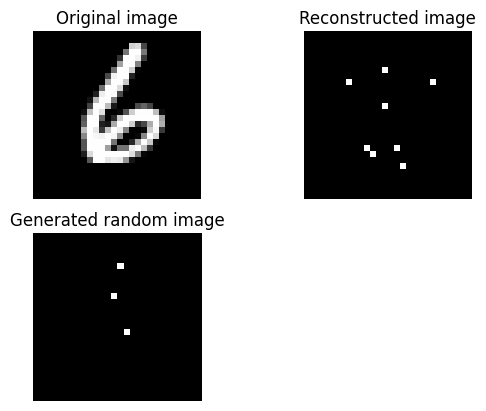

Epoch: 467
------

Train loss: 27.33
Test loss: 26.79
ELBO: 200.42559814453125


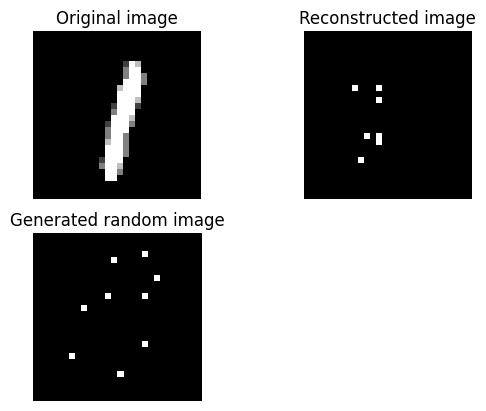

Epoch: 468
------

Train loss: 27.31
Test loss: 26.79
ELBO: 8.892857551574707


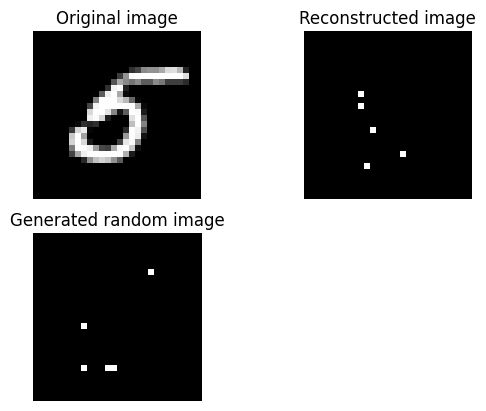

Epoch: 469
------

Train loss: 27.31
Test loss: 26.81
ELBO: 8.940570831298828


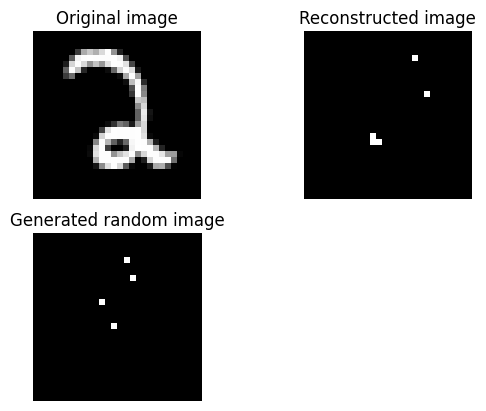

Epoch: 470
------

Train loss: 27.33
Test loss: 26.79
ELBO: 9.016040802001953


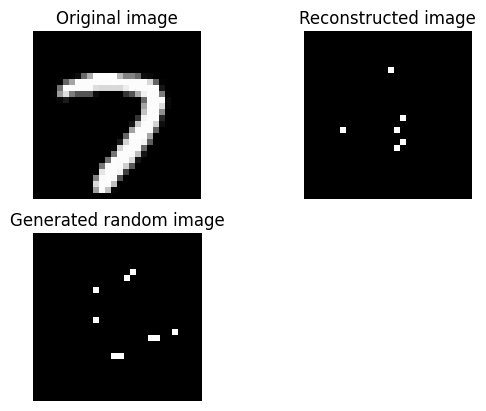

Epoch: 471
------

Train loss: 27.31
Test loss: 26.80
ELBO: 19.47399139404297


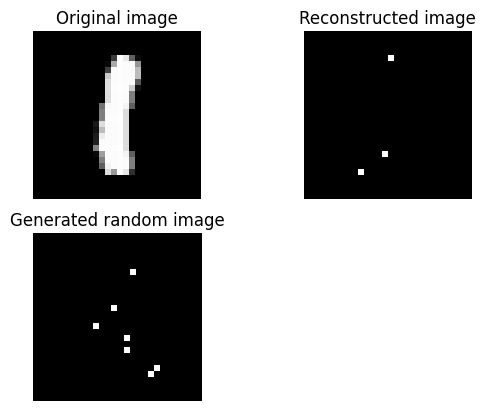

Epoch: 472
------

Train loss: 27.32
Test loss: 26.81
ELBO: 10.210119247436523


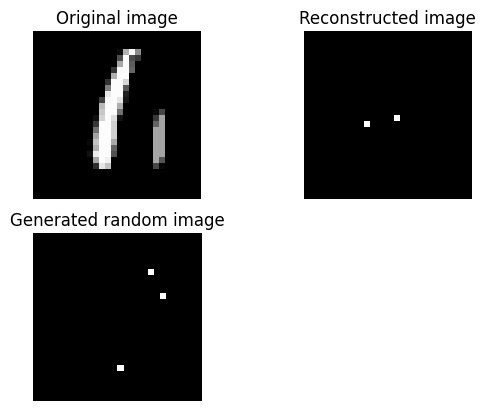

Epoch: 473
------

Train loss: 27.34
Test loss: 26.83
ELBO: 8.089834213256836


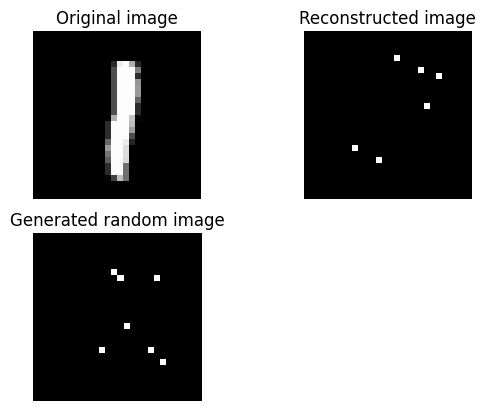

Epoch: 474
------

Train loss: 27.33
Test loss: 26.80
ELBO: 8.91961669921875


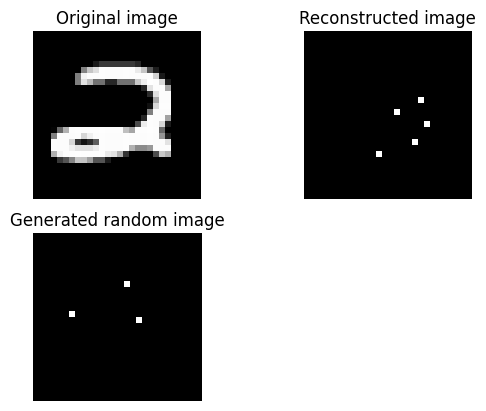

Epoch: 475
------

Train loss: 27.34
Test loss: 26.80
ELBO: 8.856210708618164


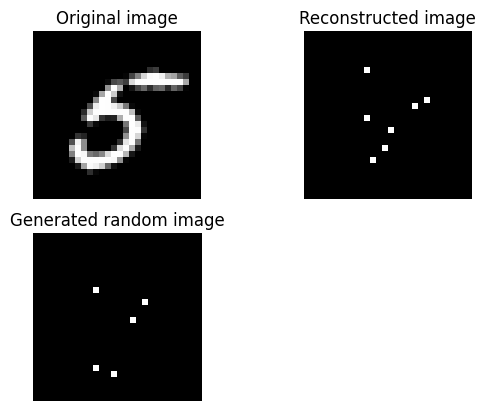

Epoch: 476
------

Train loss: 27.34
Test loss: 26.82
ELBO: 13.478917121887207


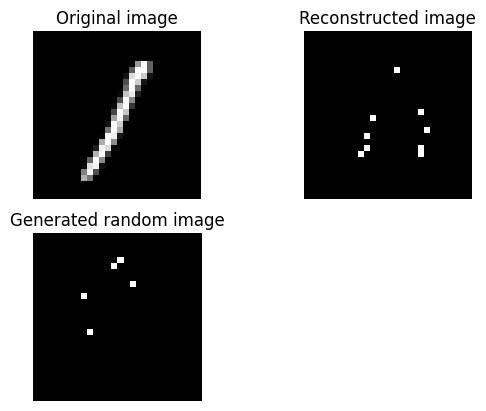

Epoch: 477
------

Train loss: 27.31
Test loss: 26.80
ELBO: 9.19880485534668


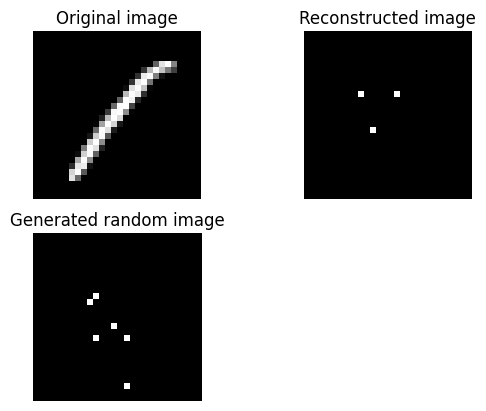

Epoch: 478
------

Train loss: 27.33
Test loss: 26.81
ELBO: 9.029458999633789


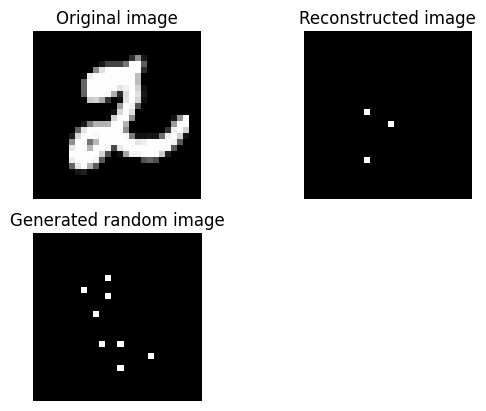

Epoch: 479
------

Train loss: 27.36
Test loss: 26.79
ELBO: 9.51413345336914


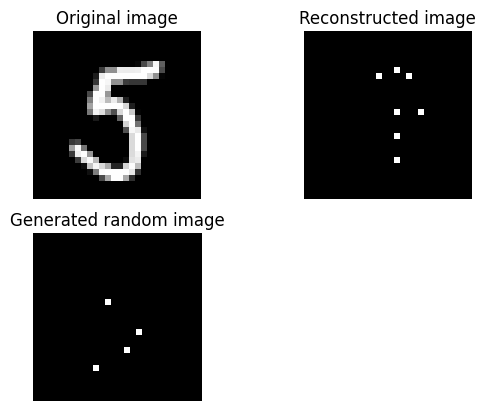

Epoch: 480
------

Train loss: 27.31
Test loss: 26.79
ELBO: 32.243247985839844


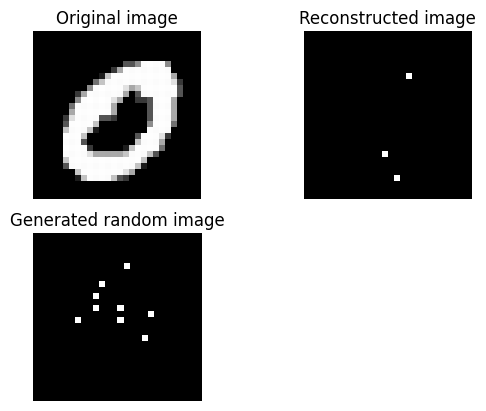

Epoch: 481
------

Train loss: 27.33
Test loss: 26.81
ELBO: 5.053417682647705


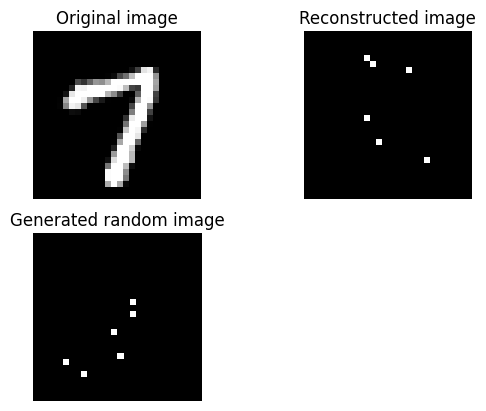

Epoch: 482
------

Train loss: 27.33
Test loss: 26.79
ELBO: 9.335458755493164


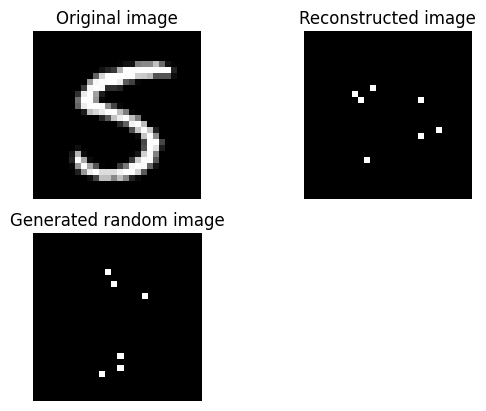

Epoch: 483
------

Train loss: 27.36
Test loss: 26.80
ELBO: 381.1751708984375


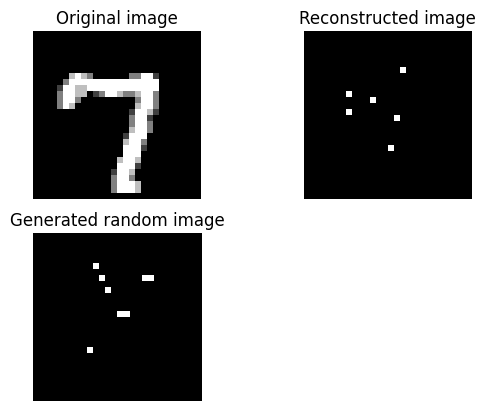

Epoch: 484
------

Train loss: 27.33
Test loss: 26.77
ELBO: 8.340065002441406


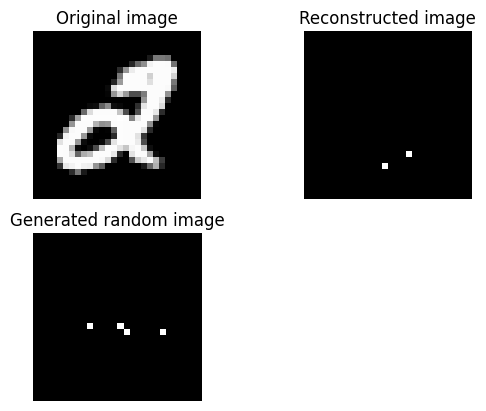

Epoch: 485
------

Train loss: 27.30
Test loss: 26.82
ELBO: 283.9509582519531


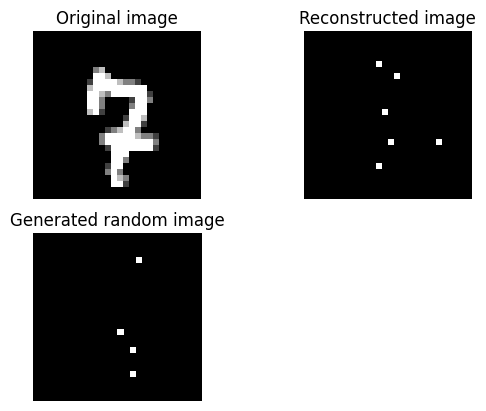

Epoch: 486
------

Train loss: 27.34
Test loss: 26.80
ELBO: 10.362893104553223


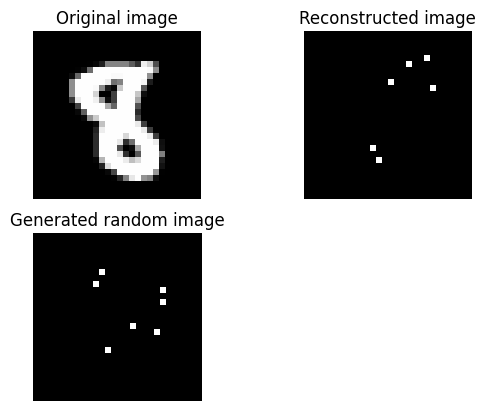

Epoch: 487
------

Train loss: 27.32
Test loss: 26.80
ELBO: 14.595102310180664


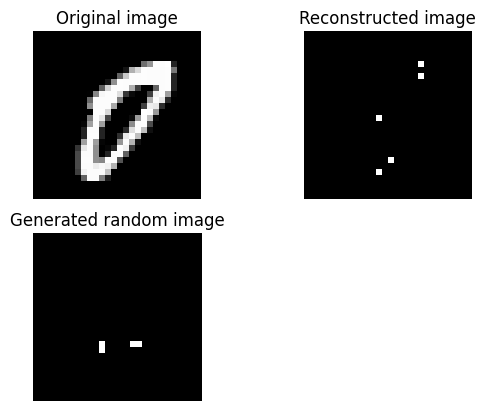

Epoch: 488
------

Train loss: 27.30
Test loss: 26.80
ELBO: 9.359787940979004


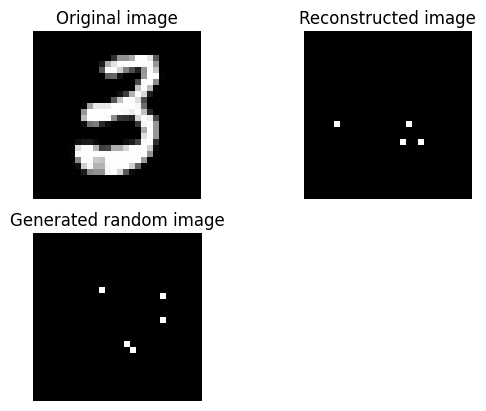

Epoch: 489
------

Train loss: 27.31
Test loss: 26.79
ELBO: 8.994839668273926


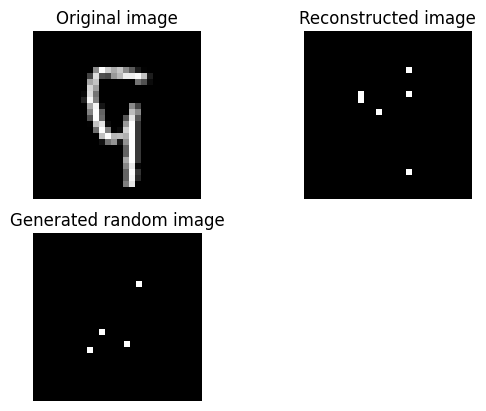

Epoch: 490
------

Train loss: 27.33
Test loss: 26.80
ELBO: 5.470954895019531


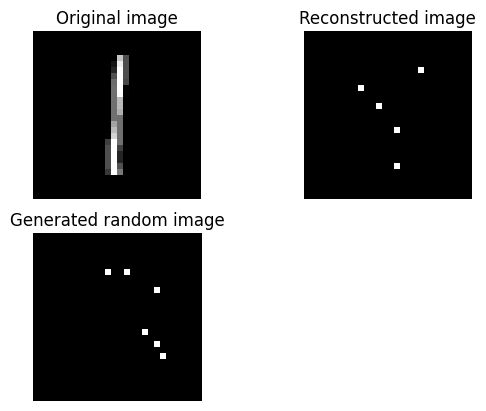

Epoch: 491
------

Train loss: 27.36
Test loss: 26.81
ELBO: 9.231058120727539


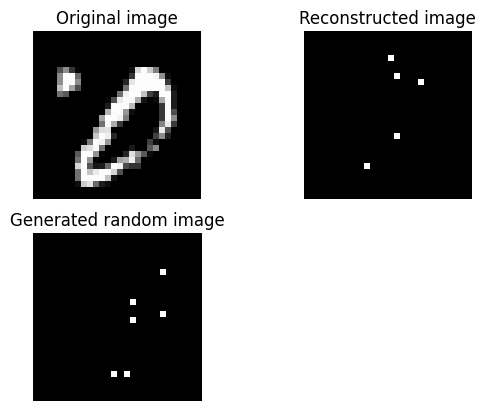

Epoch: 492
------

Train loss: 27.32
Test loss: 26.81
ELBO: 12.623125076293945


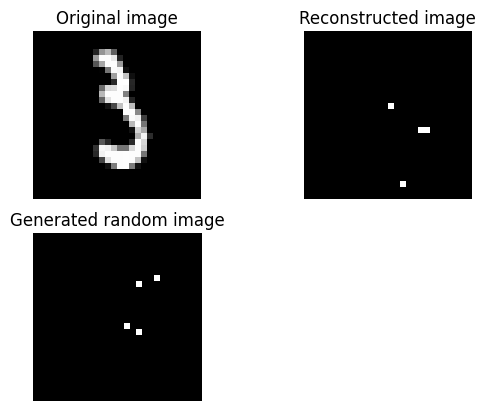

Epoch: 493
------

Train loss: 27.35
Test loss: 26.80
ELBO: 8.180892944335938


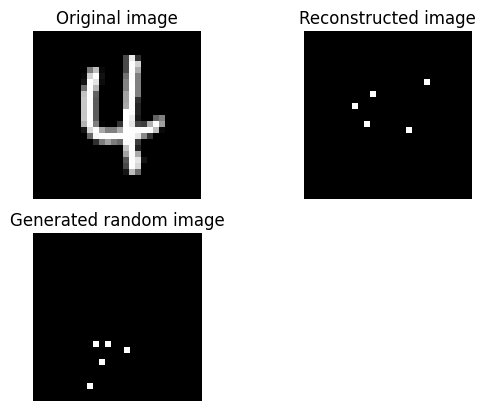

Epoch: 494
------

Train loss: 27.32
Test loss: 26.77
ELBO: 5.095296859741211


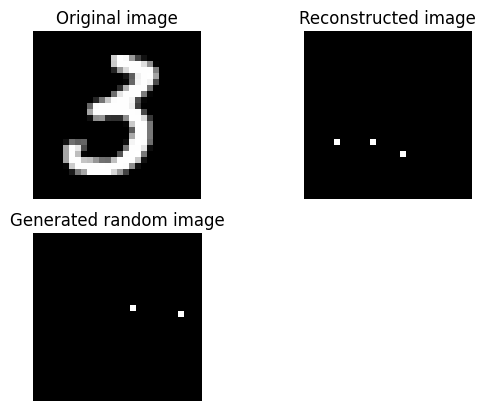

Epoch: 495
------

Train loss: 27.35
Test loss: 26.79
ELBO: 8.919692993164062


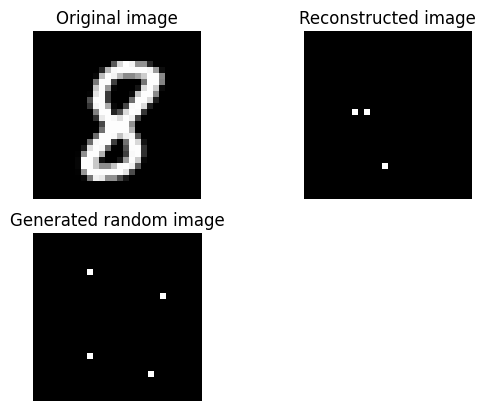

Epoch: 496
------

Train loss: 27.34
Test loss: 26.77
ELBO: 9.71909236907959


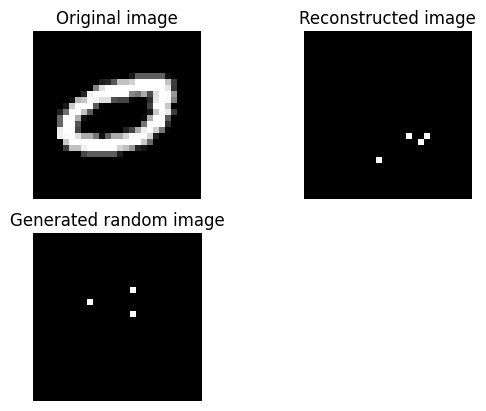

Epoch: 497
------

Train loss: 27.34
Test loss: 26.79
ELBO: 9.588269233703613


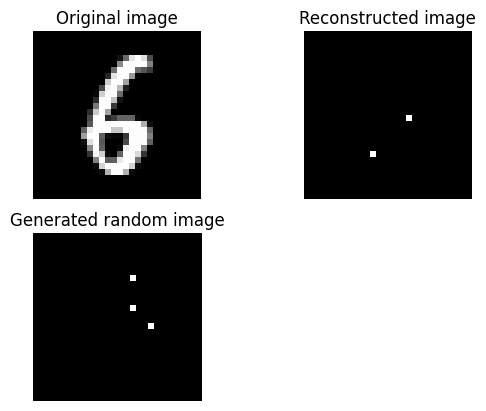

Epoch: 498
------

Train loss: 27.30
Test loss: 26.78
ELBO: 8.864419937133789


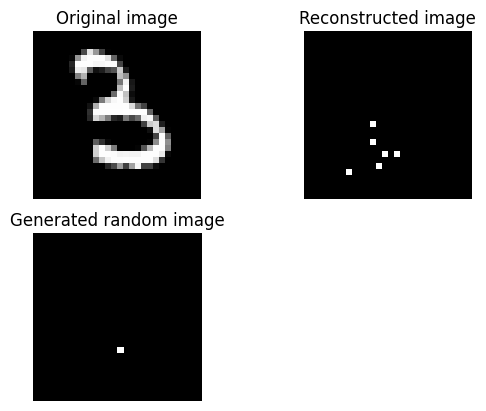

Epoch: 499
------

Train loss: 27.33
Test loss: 26.78
ELBO: 13.224565505981445


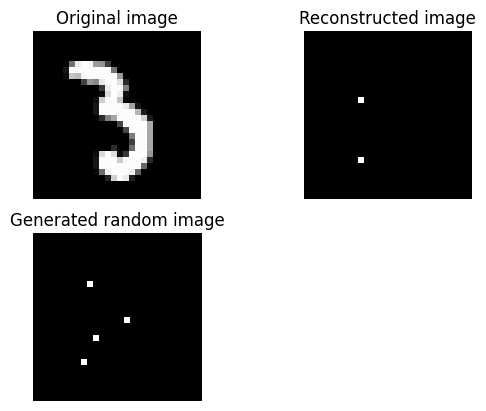

Epoch: 500
------

Train loss: 27.32
Test loss: 26.81
ELBO: 9.296344757080078


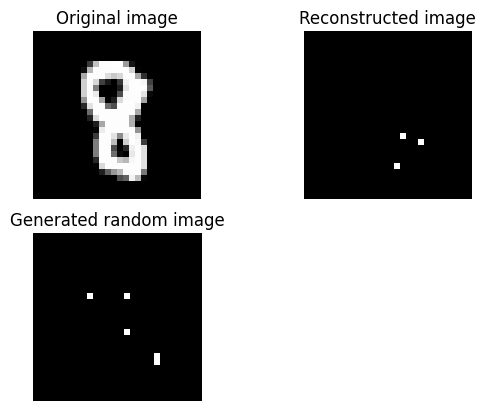

Epoch: 501
------

Train loss: 27.32
Test loss: 26.78
ELBO: 8.75014877319336


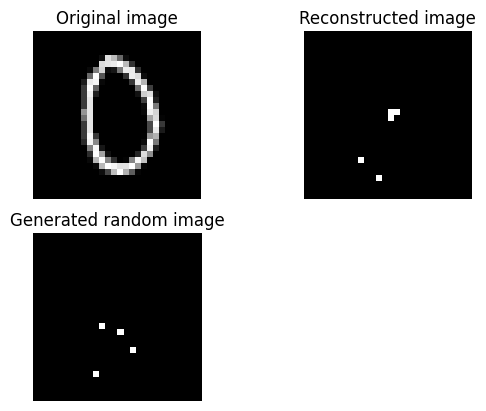

Epoch: 502
------

Train loss: 27.35
Test loss: 26.81
ELBO: 5.314026355743408


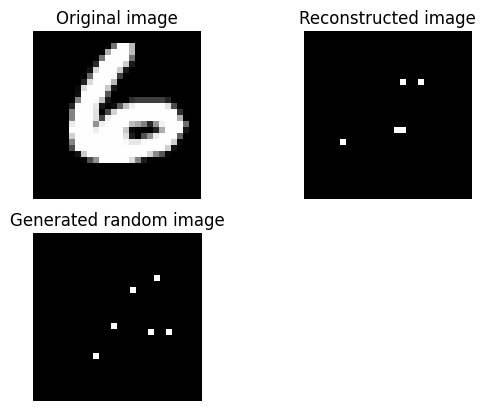

Epoch: 503
------

Train loss: 27.34
Test loss: 26.78
ELBO: 9.09402847290039


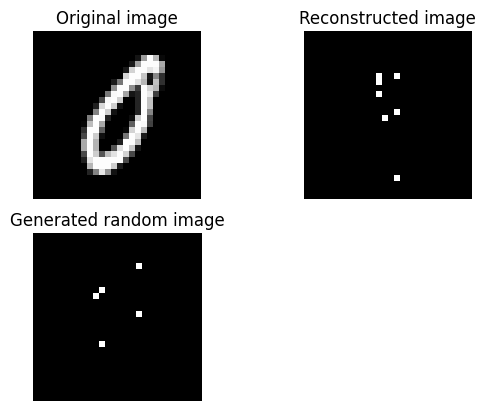

Epoch: 504
------

Train loss: 27.37
Test loss: 26.79
ELBO: 9.258933067321777


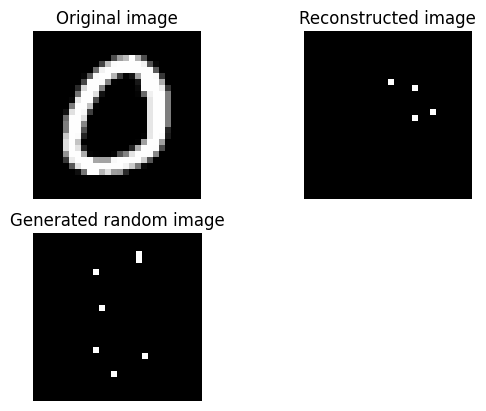

Epoch: 505
------

Train loss: 27.34
Test loss: 26.81
ELBO: 9.556279182434082


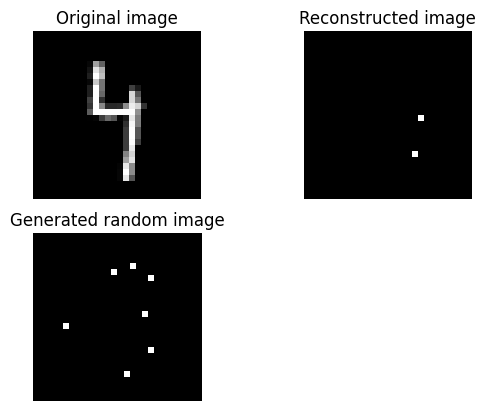

Epoch: 506
------

Train loss: 27.36
Test loss: 26.79
ELBO: 8.421890258789062


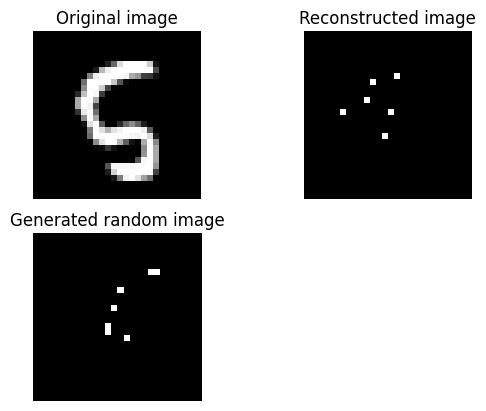

Epoch: 507
------

Train loss: 27.32
Test loss: 26.82
ELBO: 8.881553649902344


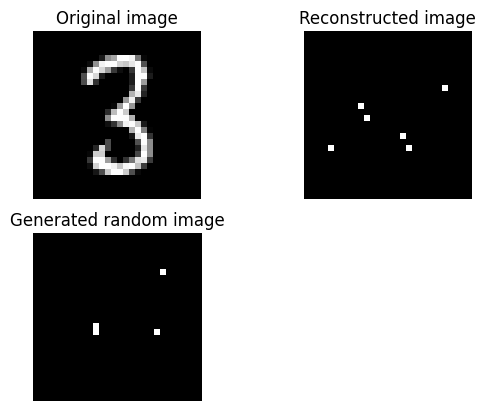

Epoch: 508
------

Train loss: 27.35
Test loss: 26.79
ELBO: 12.597373008728027


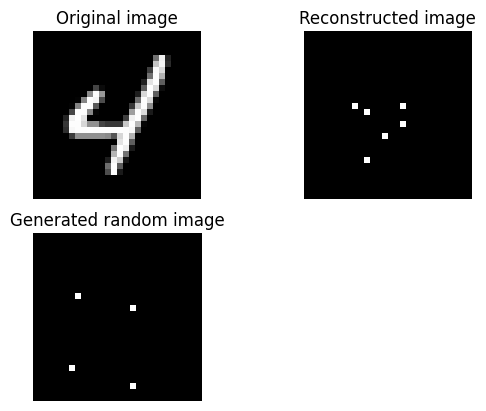

Epoch: 509
------

Train loss: 27.33
Test loss: 26.78
ELBO: 13.139322280883789


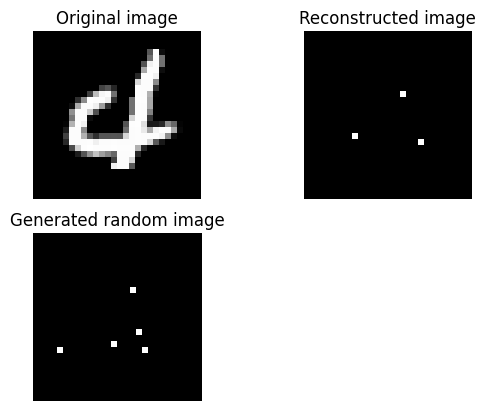

Epoch: 510
------

Train loss: 27.34
Test loss: 26.81
ELBO: 16.768178939819336


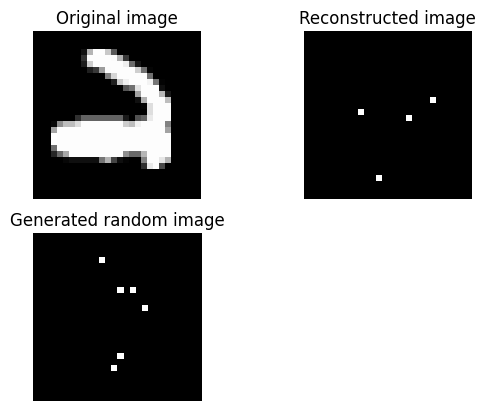

Epoch: 511
------

Train loss: 27.32
Test loss: 26.79
ELBO: 8.919281005859375


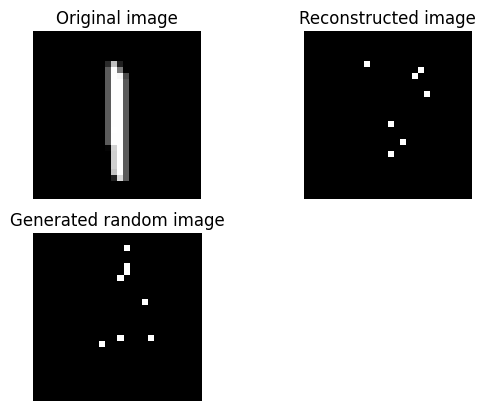

Epoch: 512
------

Train loss: 27.31
Test loss: 26.80
ELBO: 17.113258361816406


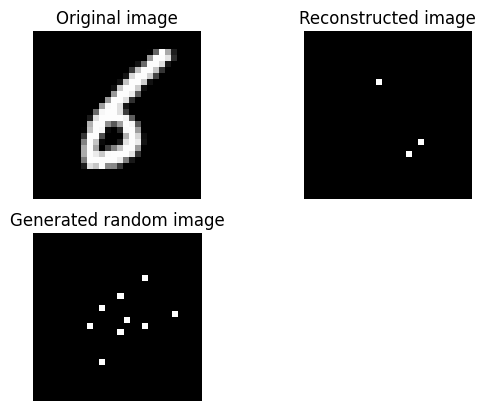

Epoch: 513
------

Train loss: 27.34
Test loss: 26.81
ELBO: 16.956308364868164


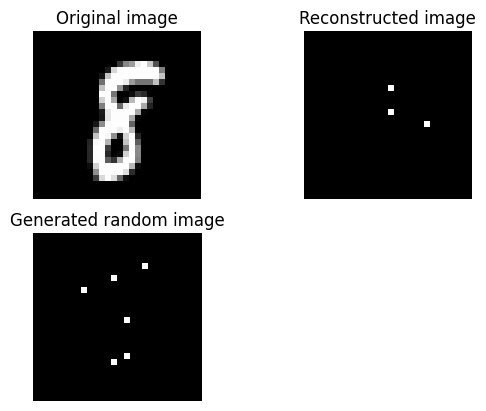

Epoch: 514
------

Train loss: 27.37
Test loss: 26.79
ELBO: 22.314008712768555


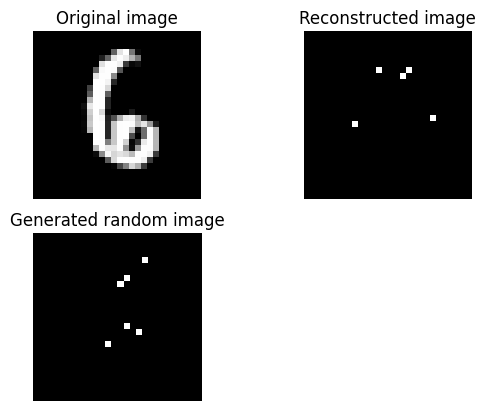

Epoch: 515
------

Train loss: 27.31
Test loss: 26.79
ELBO: 5.2612457275390625


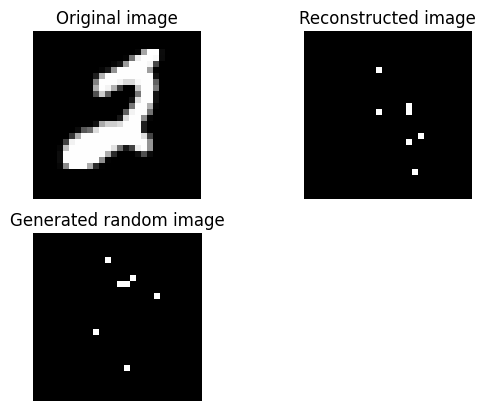

Epoch: 516
------

Train loss: 27.31
Test loss: 26.80
ELBO: 10.219625473022461


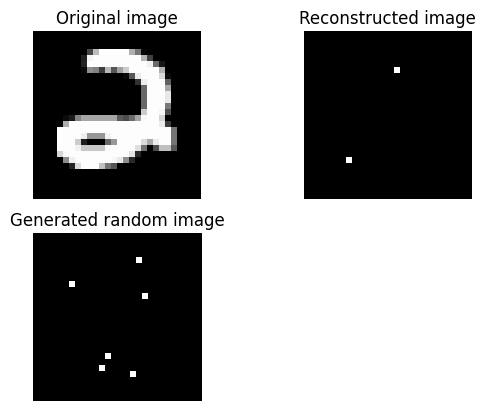

Epoch: 517
------

Train loss: 27.32
Test loss: 26.82
ELBO: 7.8226823806762695


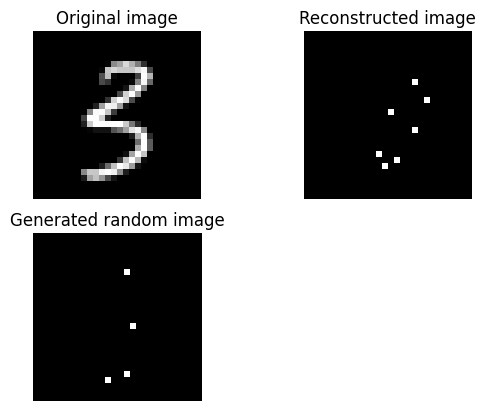

Epoch: 518
------

Train loss: 27.32
Test loss: 26.80
ELBO: 9.97894287109375


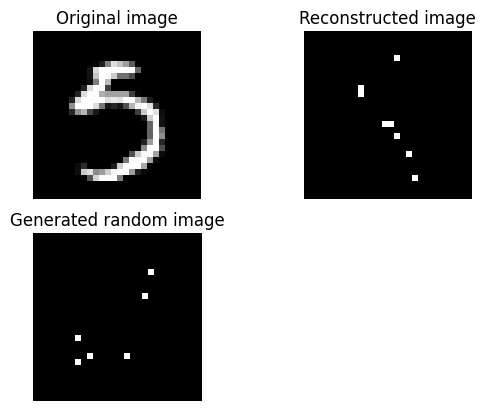

Epoch: 519
------

Train loss: 27.32
Test loss: 26.81
ELBO: 5.114562034606934


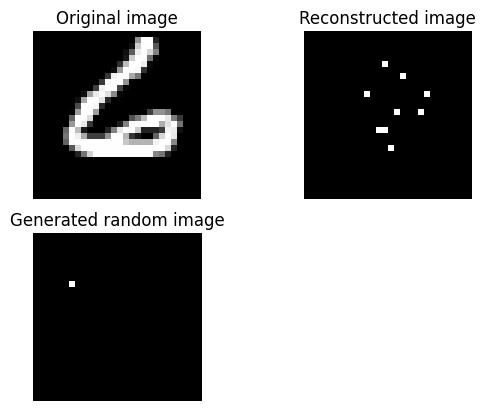

Epoch: 520
------

Train loss: 27.34
Test loss: 26.82
ELBO: 16.923538208007812


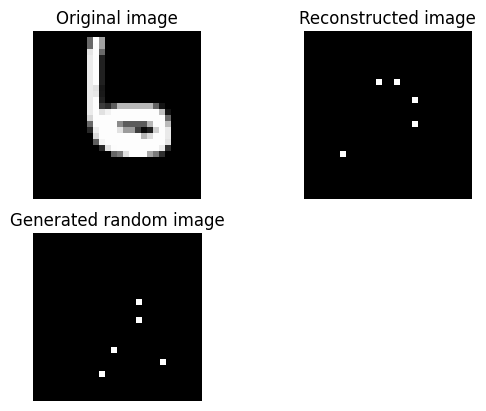

Epoch: 521
------

Train loss: 27.30
Test loss: 26.77
ELBO: 13.076883316040039


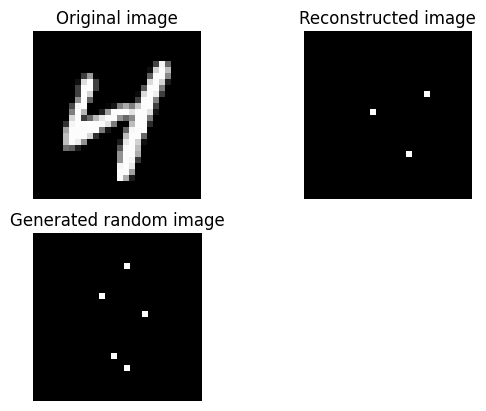

Epoch: 522
------

Train loss: 27.33
Test loss: 26.79
ELBO: 9.352907180786133


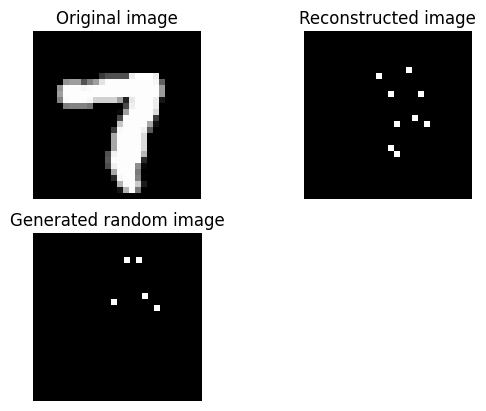

Epoch: 523
------

Train loss: 27.33
Test loss: 26.80
ELBO: 12.110240936279297


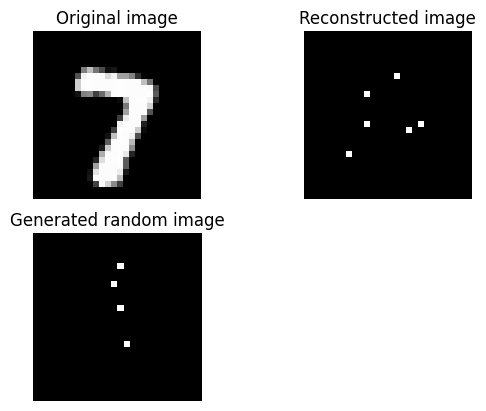

Epoch: 524
------

Train loss: 27.34
Test loss: 26.80
ELBO: 5.311755657196045


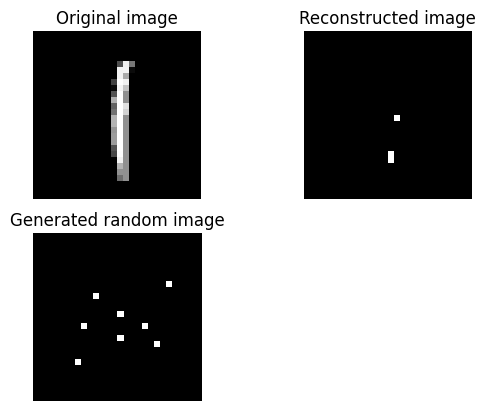

Epoch: 525
------

Train loss: 27.31
Test loss: 26.80
ELBO: 12.918484687805176


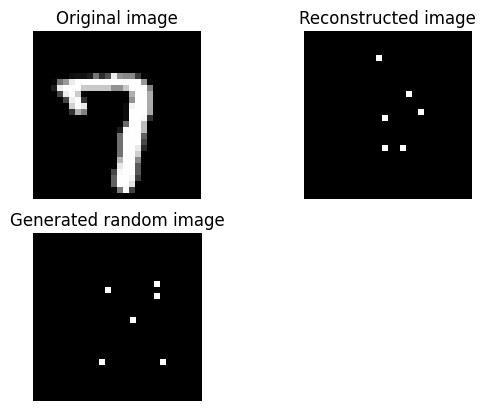

Epoch: 526
------

Train loss: 27.33
Test loss: 26.81
ELBO: 5.237821102142334


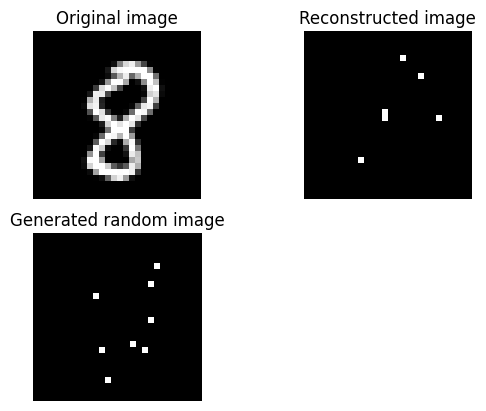

Epoch: 527
------

Train loss: 27.33
Test loss: 26.80
ELBO: 26.81816864013672


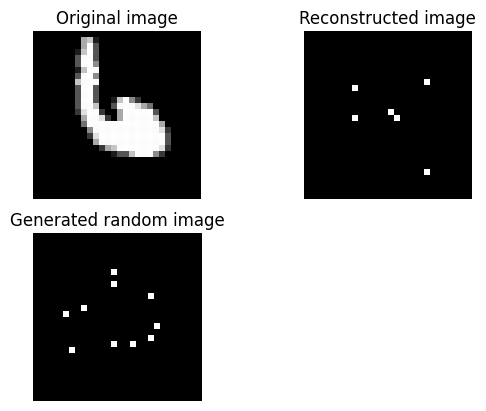

Epoch: 528
------

Train loss: 27.35
Test loss: 26.80
ELBO: 8.650381088256836


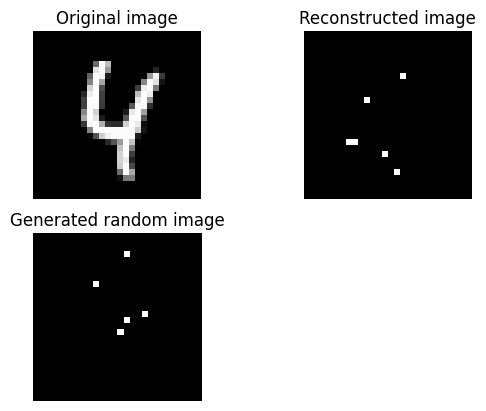

Epoch: 529
------

Train loss: 27.37
Test loss: 26.81
ELBO: 8.865555763244629


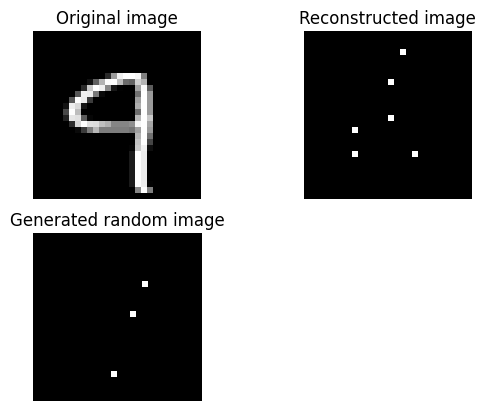

Epoch: 530
------

Train loss: 27.34
Test loss: 26.81
ELBO: 9.398478507995605


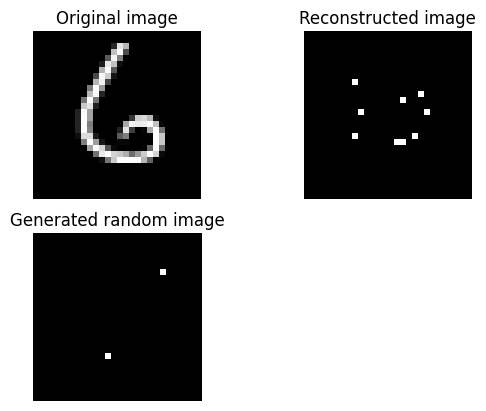

Epoch: 531
------

Train loss: 27.30
Test loss: 26.81
ELBO: 9.234512329101562


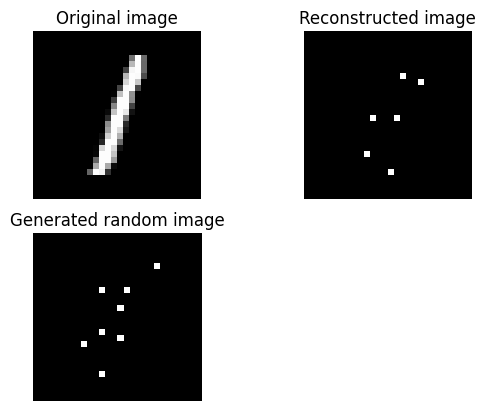

Epoch: 532
------

Train loss: 27.32
Test loss: 26.79
ELBO: 8.929545402526855


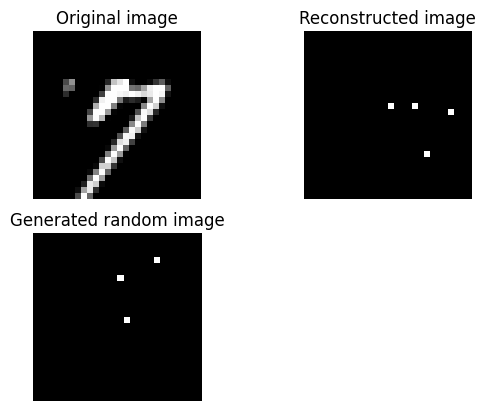

Epoch: 533
------

Train loss: 27.32
Test loss: 26.82
ELBO: 9.053241729736328


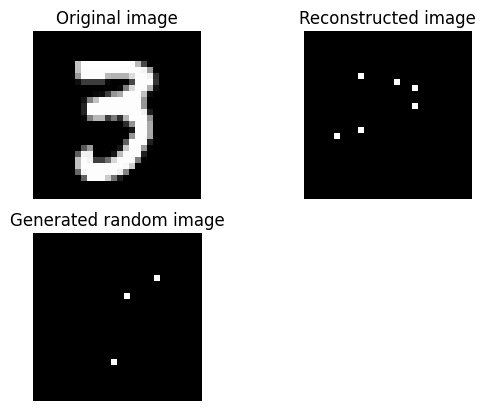

Epoch: 534
------

Train loss: 27.31
Test loss: 26.85
ELBO: 15.442819595336914


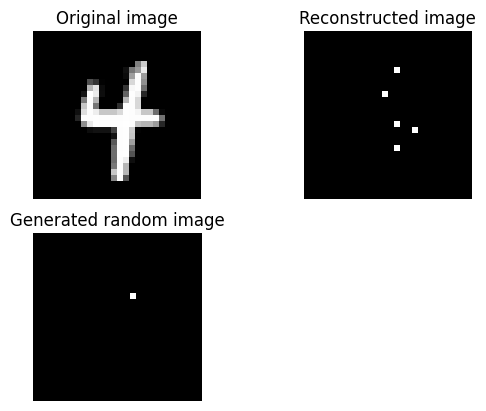

Epoch: 535
------

Train loss: 27.35
Test loss: 26.81
ELBO: 9.432657241821289


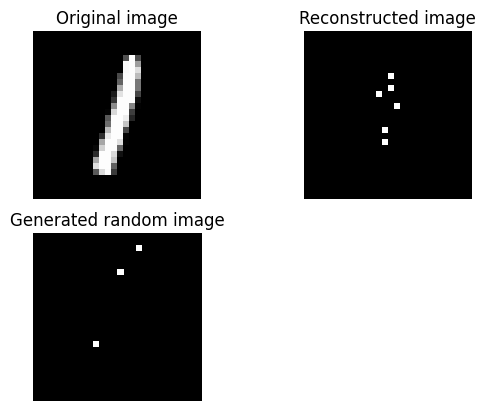

Epoch: 536
------

Train loss: 27.33
Test loss: 26.79
ELBO: 9.433283805847168


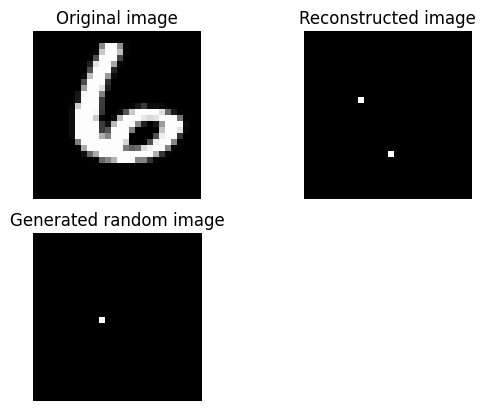

Epoch: 537
------

Train loss: 27.35
Test loss: 26.79
ELBO: 9.26292896270752


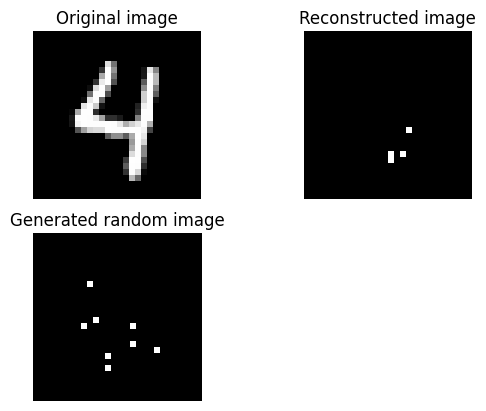

Epoch: 538
------

Train loss: 27.33
Test loss: 26.83
ELBO: 8.896468162536621


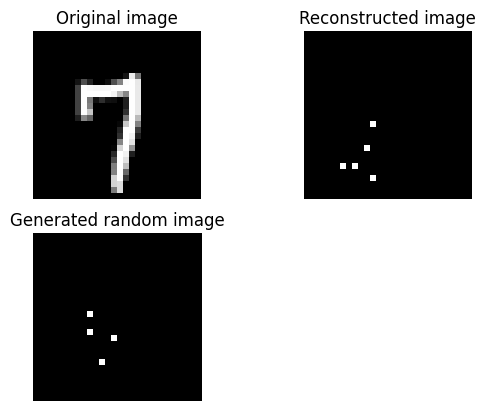

Epoch: 539
------

Train loss: 27.32
Test loss: 26.81
ELBO: 411.81463623046875


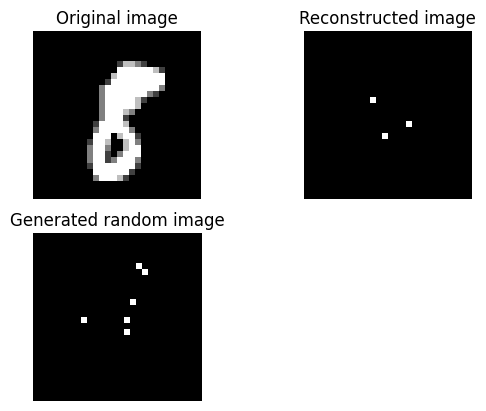

Epoch: 540
------

Train loss: 27.37
Test loss: 26.79
ELBO: 9.41521167755127


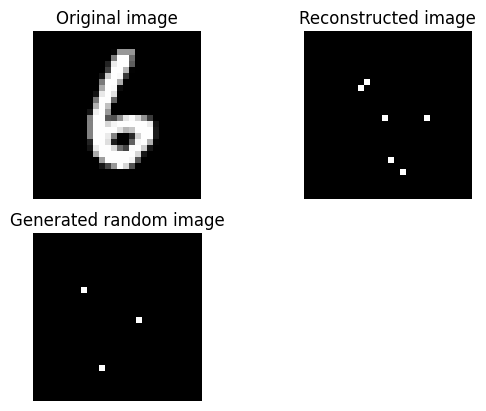

Epoch: 541
------

Train loss: 27.33
Test loss: 26.82
ELBO: 14.616186141967773


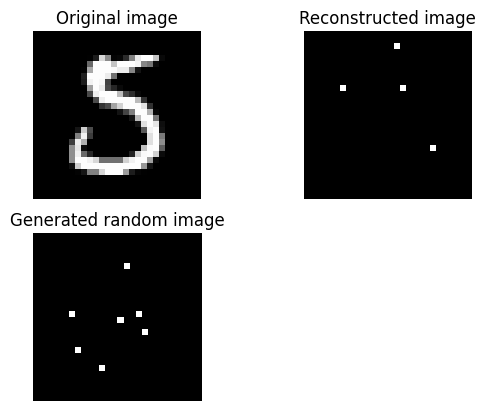

Epoch: 542
------

Train loss: 27.33
Test loss: 26.82
ELBO: 9.232959747314453


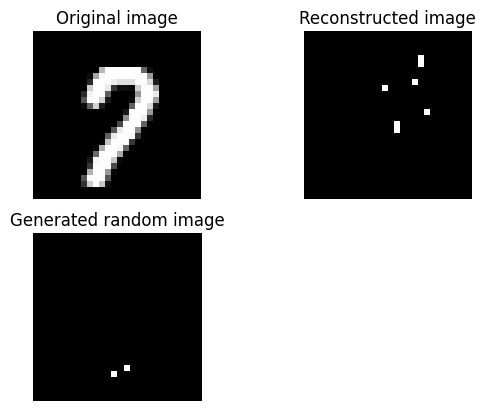

Epoch: 543
------

Train loss: 27.32
Test loss: 26.79
ELBO: 10.238218307495117


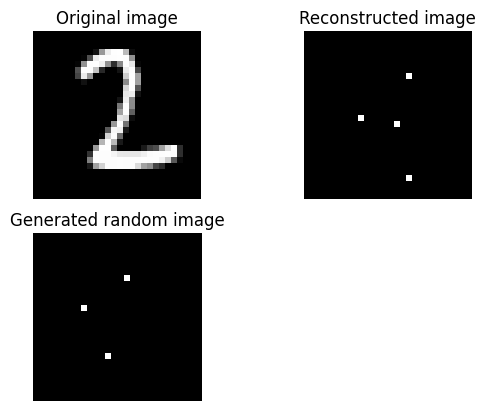

Epoch: 544
------

Train loss: 27.34
Test loss: 26.79
ELBO: 8.480616569519043


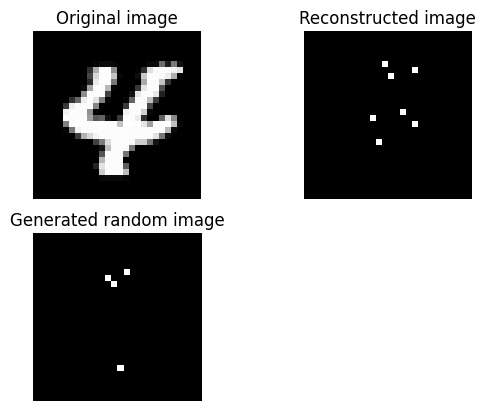

Epoch: 545
------

Train loss: 27.33
Test loss: 26.79
ELBO: 8.110357284545898


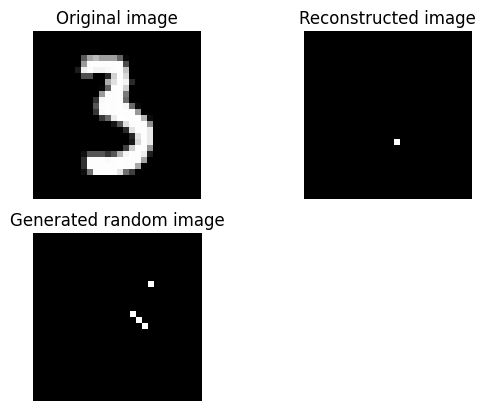

Epoch: 546
------

Train loss: 27.32
Test loss: 26.79
ELBO: 161.2912139892578


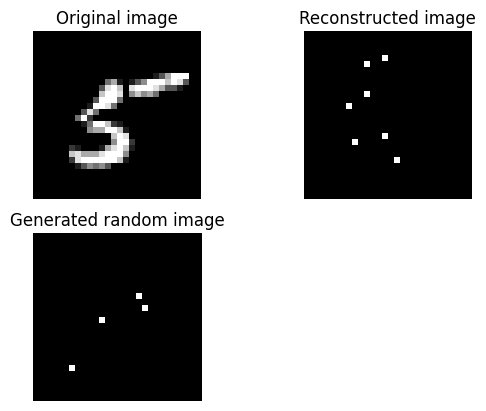

Epoch: 547
------

Train loss: 27.32
Test loss: 26.79
ELBO: 5.291684150695801


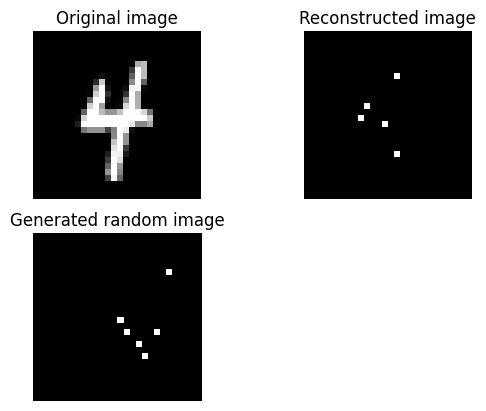

Epoch: 548
------

Train loss: 27.32
Test loss: 26.78
ELBO: 8.743898391723633


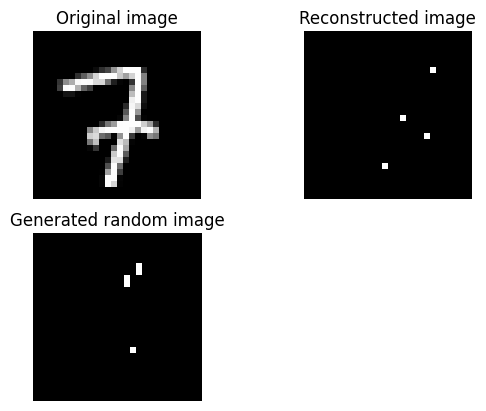

Epoch: 549
------

Train loss: 27.31
Test loss: 26.81
ELBO: 9.127880096435547


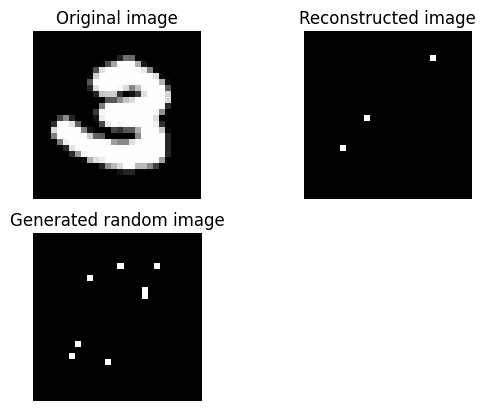

Epoch: 550
------

Train loss: 27.38
Test loss: 26.79
ELBO: 9.149829864501953


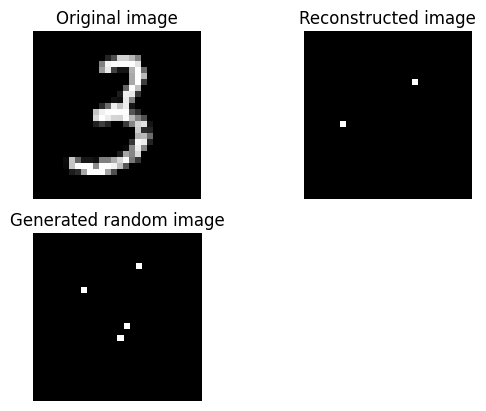

Epoch: 551
------

Train loss: 27.34
Test loss: 26.78
ELBO: 10.521102905273438


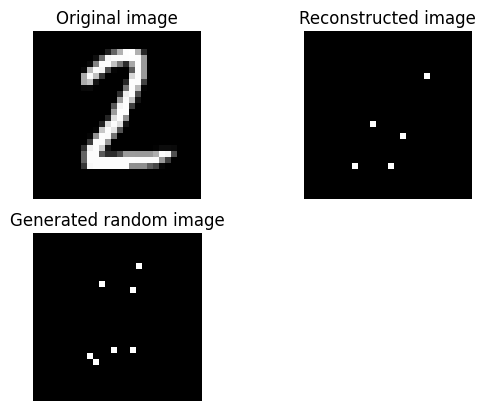

Epoch: 552
------

Train loss: 27.35
Test loss: 26.82
ELBO: 20.55191421508789


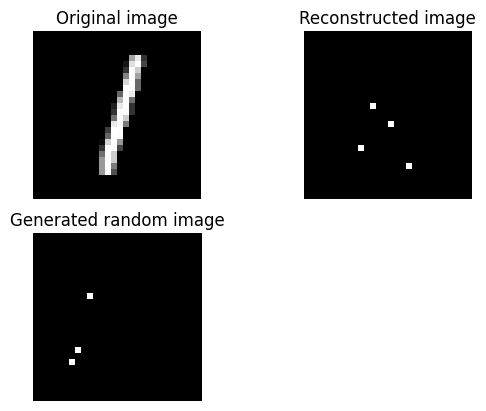

Epoch: 553
------

Train loss: 27.33
Test loss: 26.81
ELBO: 9.271214485168457


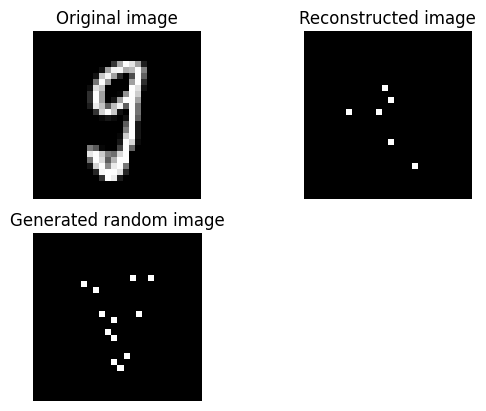

Epoch: 554
------

Train loss: 27.32
Test loss: 26.79
ELBO: 5.338057518005371


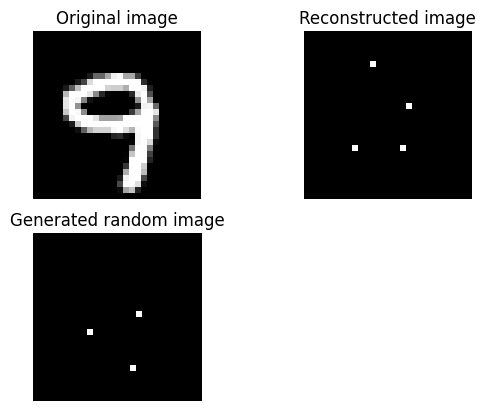

Epoch: 555
------

Train loss: 27.33
Test loss: 26.81
ELBO: 9.233039855957031


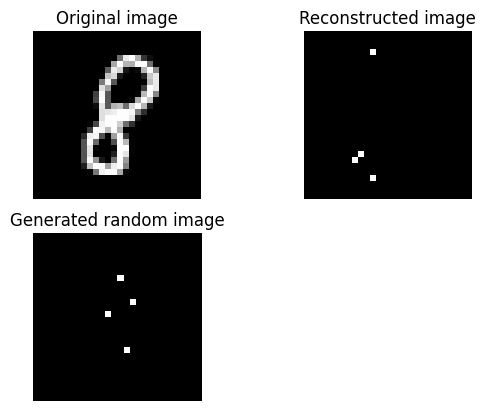

Epoch: 556
------

Train loss: 27.34
Test loss: 26.83
ELBO: 5.234078884124756


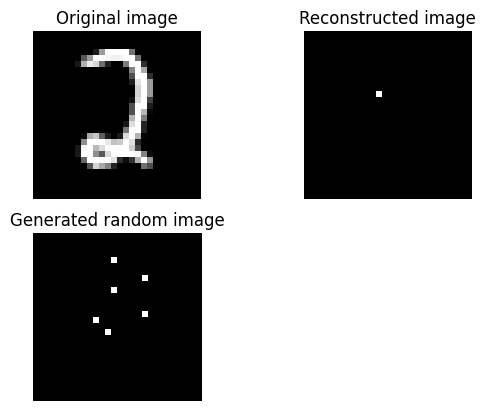

Epoch: 557
------

Train loss: 27.36
Test loss: 26.79
ELBO: 5.259055137634277


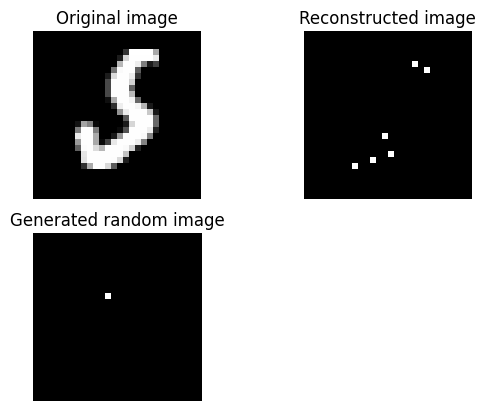

Epoch: 558
------

Train loss: 27.35
Test loss: 26.79
ELBO: 13.16802978515625


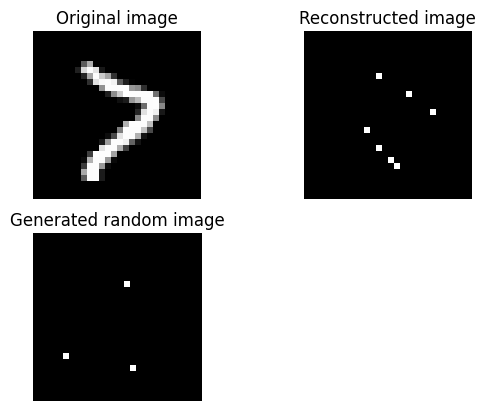

Epoch: 559
------

Train loss: 27.33
Test loss: 26.80
ELBO: 19.72828483581543


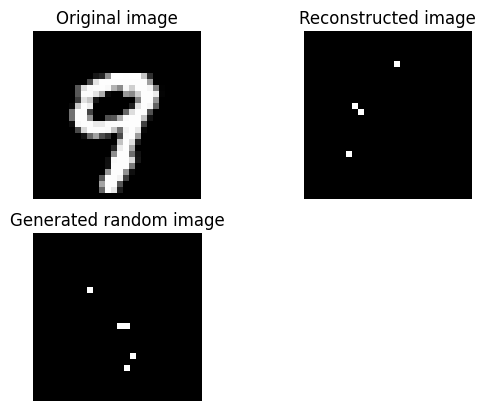

Epoch: 560
------

Train loss: 27.32
Test loss: 26.80
ELBO: 8.691203117370605


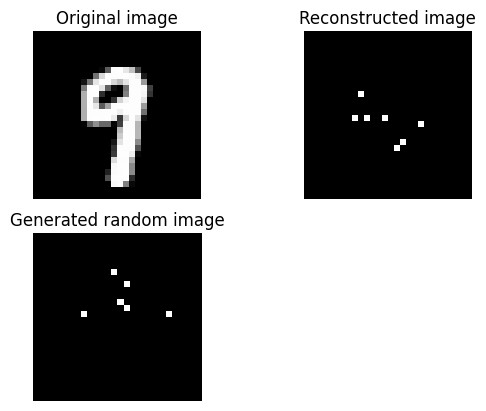

Epoch: 561
------

Train loss: 27.31
Test loss: 26.84
ELBO: 8.952287673950195


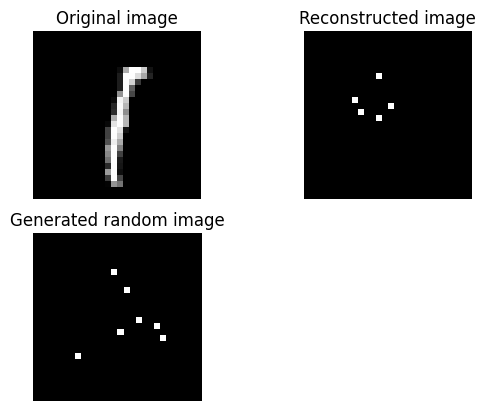

Epoch: 562
------

Train loss: 27.31
Test loss: 26.80
ELBO: 5.335972309112549


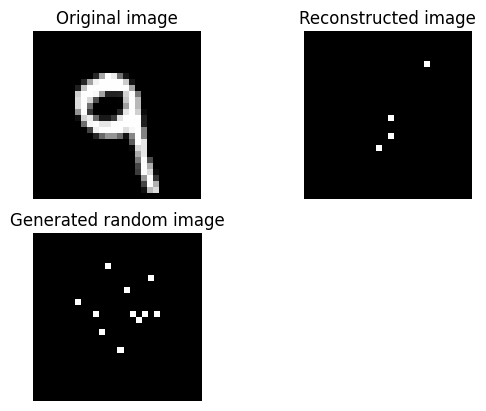

Epoch: 563
------

Train loss: 27.32
Test loss: 26.79
ELBO: 8.640316009521484


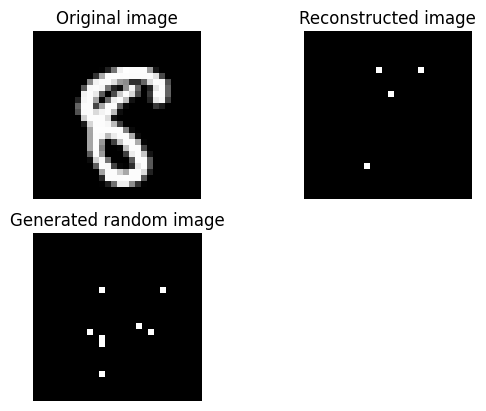

Epoch: 564
------

Train loss: 27.32
Test loss: 26.79
ELBO: 12.485166549682617


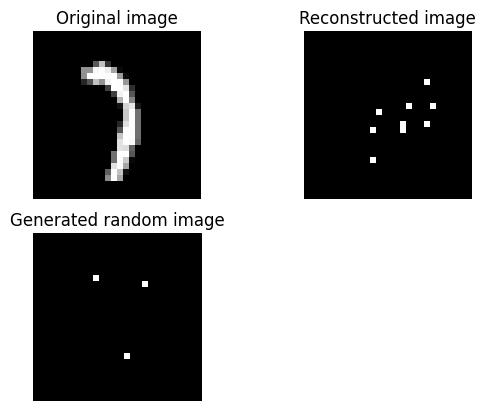

Epoch: 565
------

Train loss: 27.33
Test loss: 26.80
ELBO: 22.565893173217773


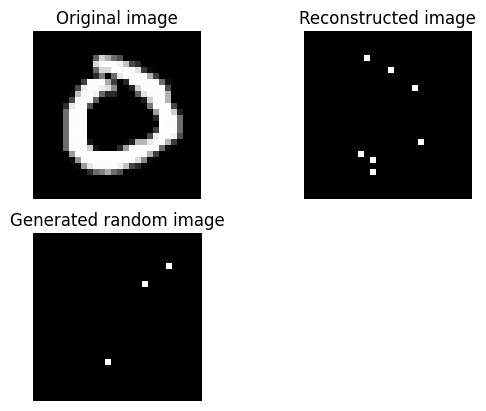

Epoch: 566
------

Train loss: 27.34
Test loss: 26.79
ELBO: 32.60439682006836


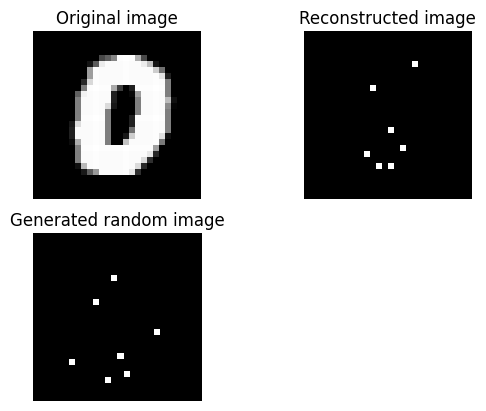

Epoch: 567
------

Train loss: 27.31
Test loss: 26.80
ELBO: 197.4341278076172


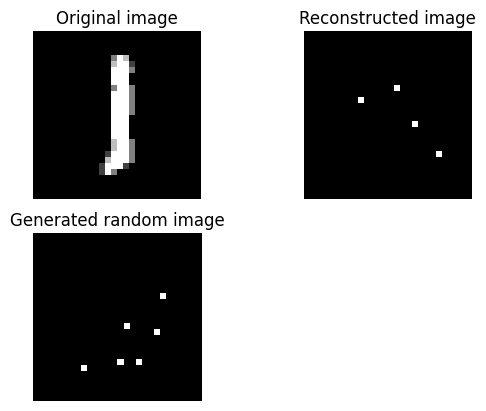

Epoch: 568
------

Train loss: 27.33
Test loss: 26.81
ELBO: 29.583934783935547


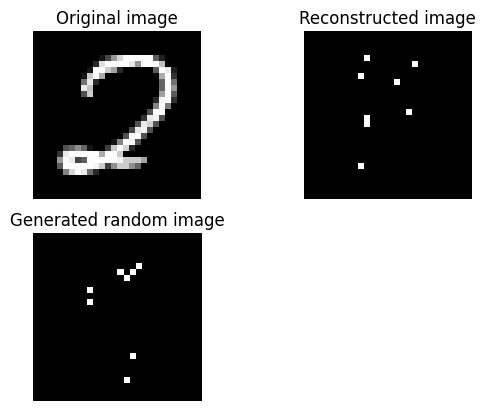

Epoch: 569
------

Train loss: 27.31
Test loss: 26.83
ELBO: 9.225555419921875


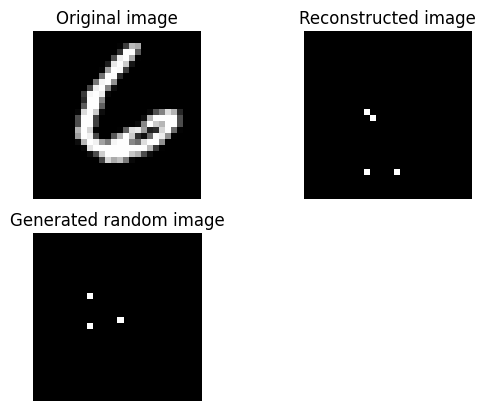

Epoch: 570
------

Train loss: 27.33
Test loss: 26.79
ELBO: 17.650516510009766


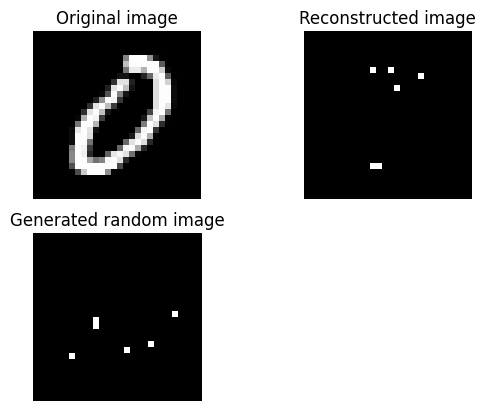

Epoch: 571
------

Train loss: 27.30
Test loss: 26.84
ELBO: 5.541640281677246


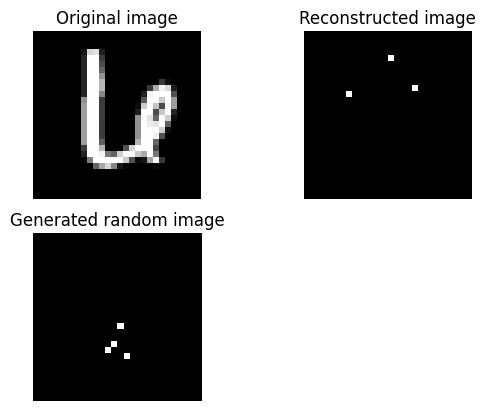

Epoch: 572
------

Train loss: 27.32
Test loss: 26.82
ELBO: 12.440266609191895


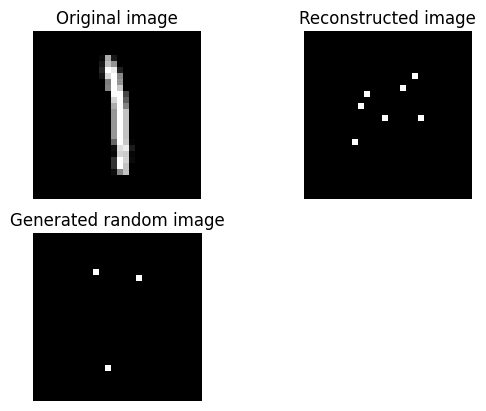

Epoch: 573
------

Train loss: 27.31
Test loss: 26.80
ELBO: 23.28571319580078


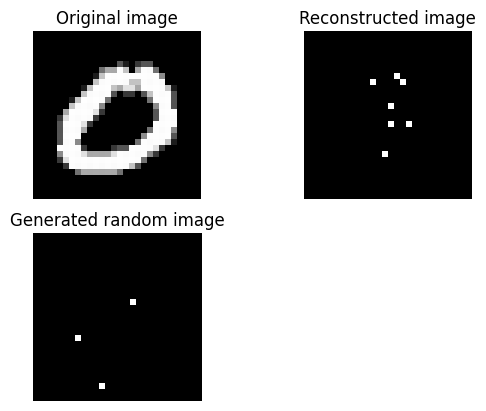

Epoch: 574
------

Train loss: 27.33
Test loss: 26.79
ELBO: 24.102401733398438


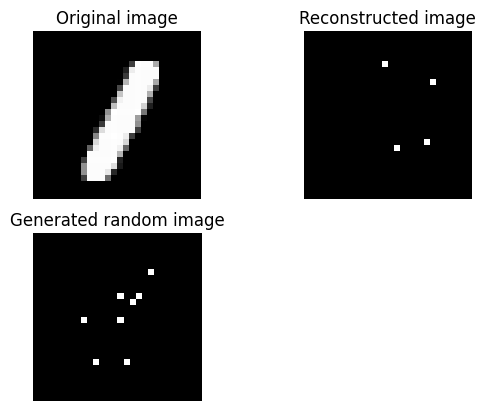

Epoch: 575
------

Train loss: 27.33
Test loss: 26.81
ELBO: 9.553483963012695


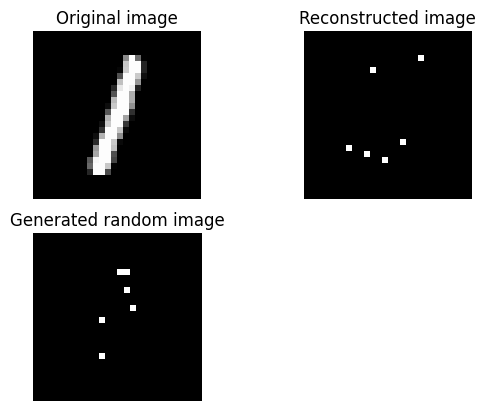

Epoch: 576
------

Train loss: 27.34
Test loss: 26.83
ELBO: 9.35784912109375


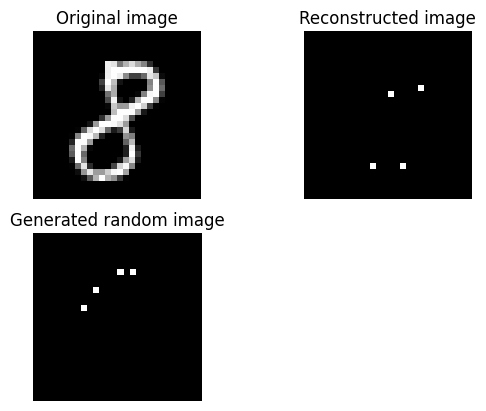

Epoch: 577
------

Train loss: 27.32
Test loss: 26.80
ELBO: 9.612586975097656


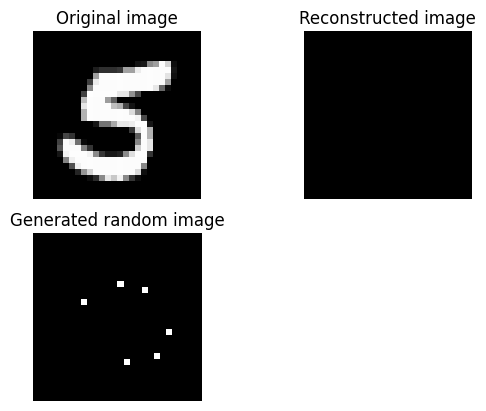

Epoch: 578
------

Train loss: 27.30
Test loss: 26.79
ELBO: 9.253000259399414


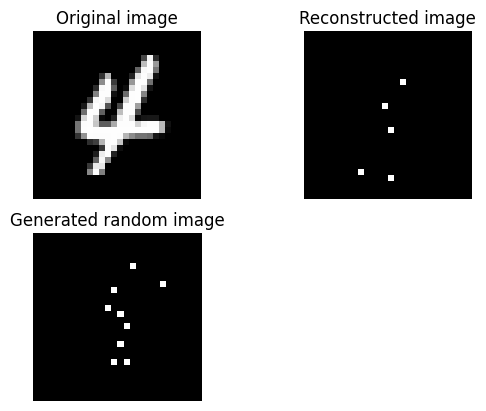

Epoch: 579
------

Train loss: 27.31
Test loss: 26.81
ELBO: 8.405881881713867


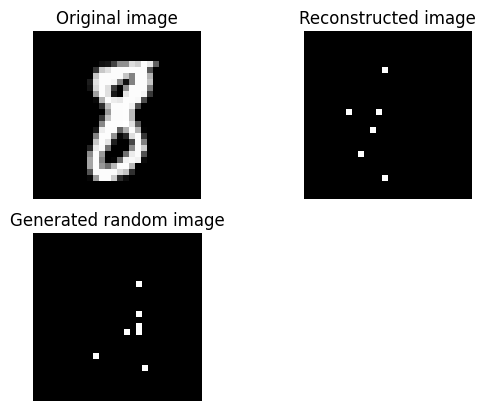

Epoch: 580
------

Train loss: 27.35
Test loss: 26.80
ELBO: 9.764021873474121


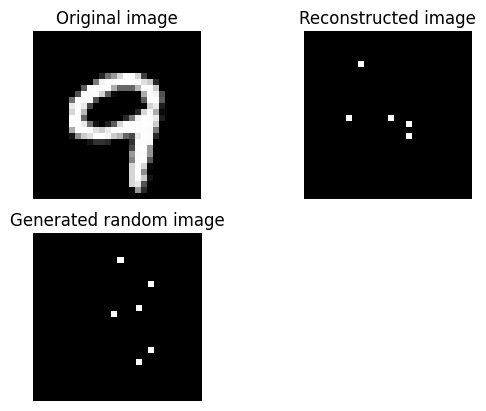

Epoch: 581
------

Train loss: 27.33
Test loss: 26.77
ELBO: 406.6351318359375


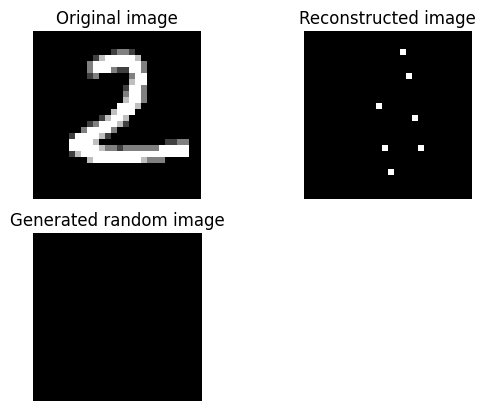

Epoch: 582
------

Train loss: 27.34
Test loss: 26.79
ELBO: 26.00146484375


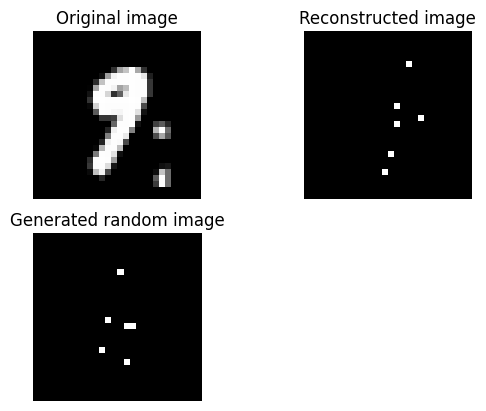

Epoch: 583
------

Train loss: 27.30
Test loss: 26.79
ELBO: 32.34126281738281


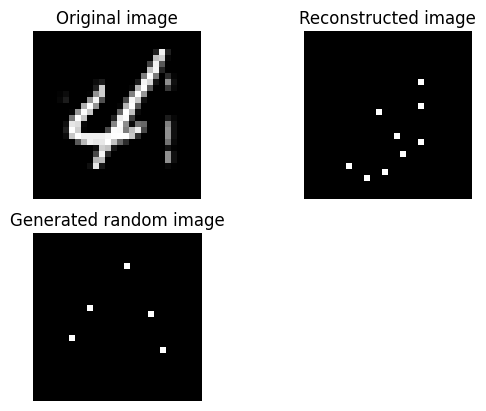

Epoch: 584
------

Train loss: 27.34
Test loss: 26.79
ELBO: 12.910541534423828


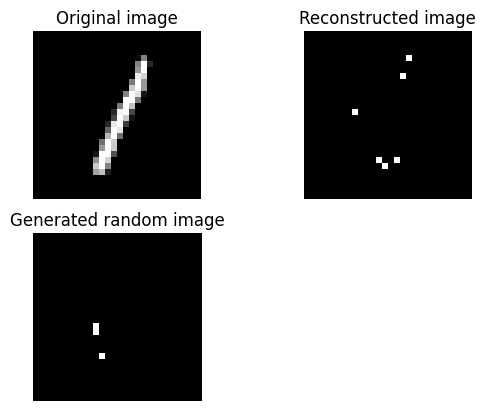

Epoch: 585
------

Train loss: 27.33
Test loss: 26.83
ELBO: 5.38768196105957


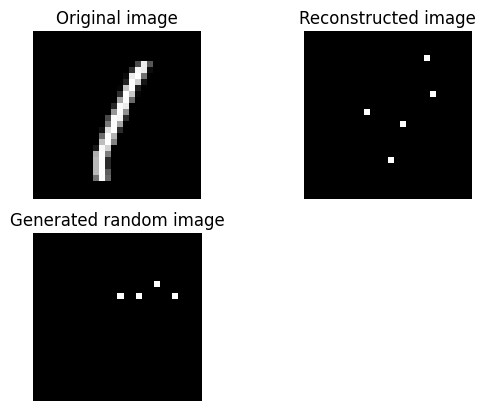

Epoch: 586
------

Train loss: 27.32
Test loss: 26.83
ELBO: 5.573987007141113


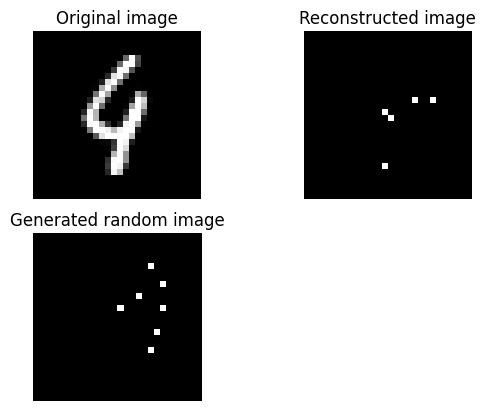

Epoch: 587
------

Train loss: 27.32
Test loss: 26.80
ELBO: 5.079644203186035


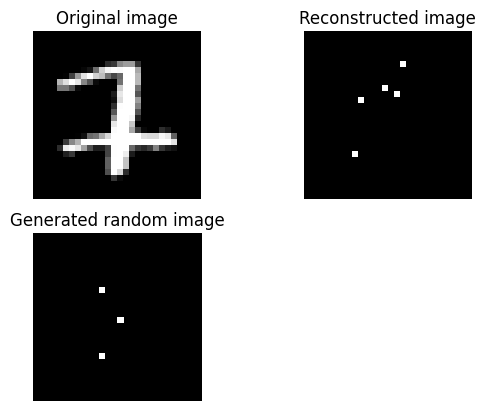

Epoch: 588
------

Train loss: 27.36
Test loss: 26.82
ELBO: 4.960892200469971


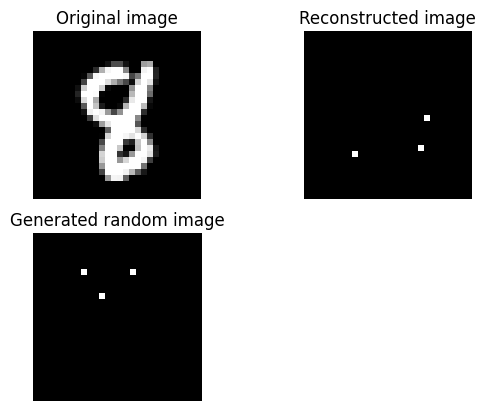

Epoch: 589
------

Train loss: 27.33
Test loss: 26.81
ELBO: 8.887001037597656


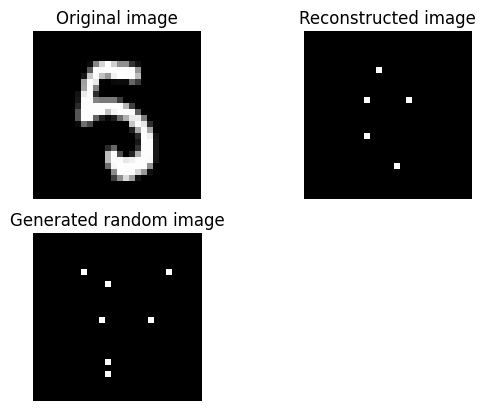

Epoch: 590
------

Train loss: 27.33
Test loss: 26.80
ELBO: 9.674427032470703


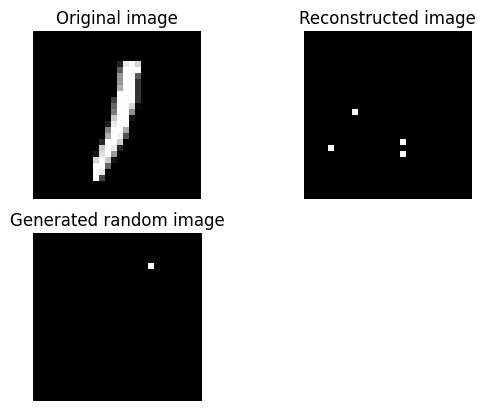

Epoch: 591
------

Train loss: 27.33
Test loss: 26.81
ELBO: 9.28105354309082


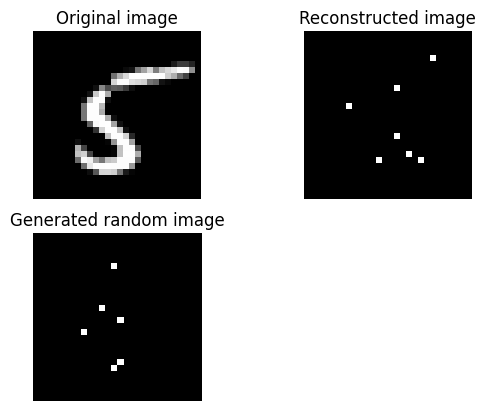

Epoch: 592
------

Train loss: 27.33
Test loss: 26.80
ELBO: 15.825536727905273


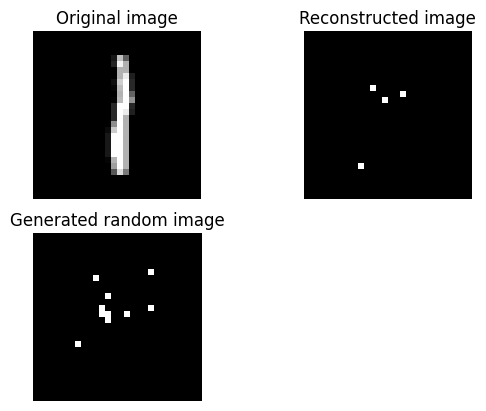

Epoch: 593
------

Train loss: 27.31
Test loss: 26.84
ELBO: 9.569267272949219


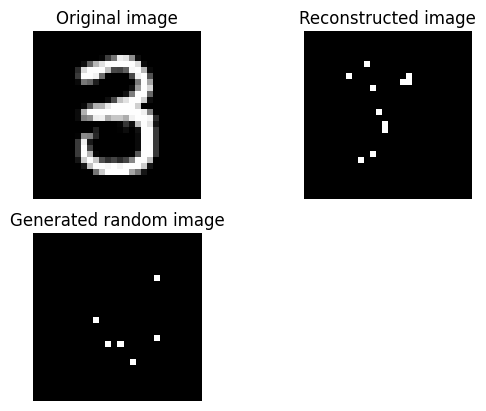

Epoch: 594
------

Train loss: 27.33
Test loss: 26.78
ELBO: 10.25549602508545


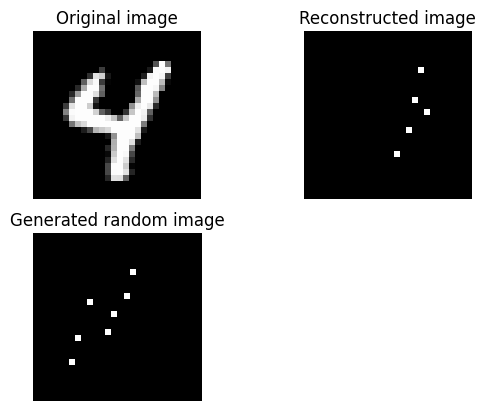

Epoch: 595
------

Train loss: 27.32
Test loss: 26.80
ELBO: 12.798991203308105


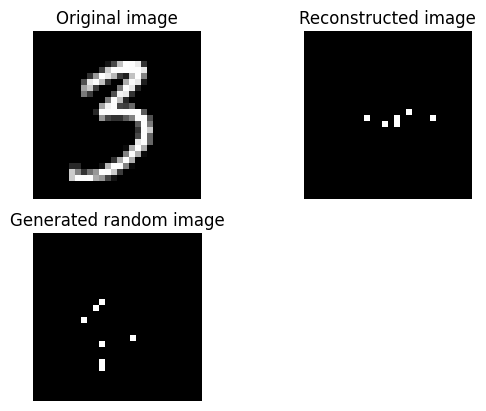

Epoch: 596
------

Train loss: 27.38
Test loss: 26.79
ELBO: 9.326432228088379


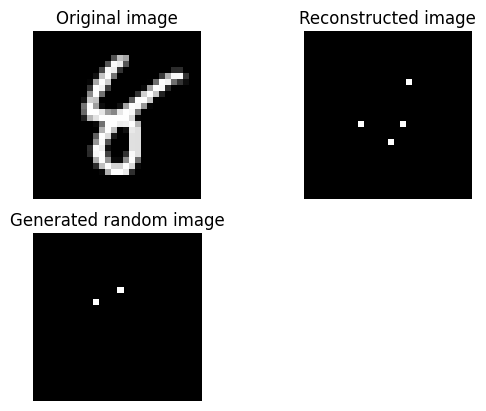

Epoch: 597
------

Train loss: 27.35
Test loss: 26.77
ELBO: 9.369603157043457


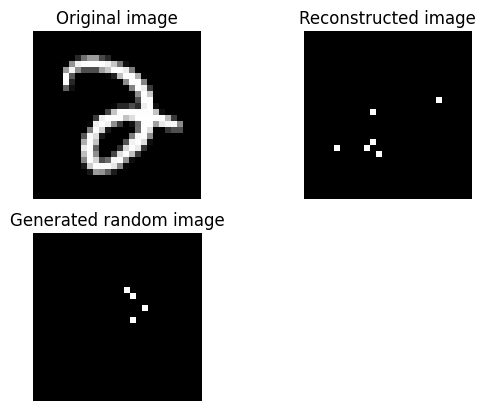

Epoch: 598
------

Train loss: 27.33
Test loss: 26.82
ELBO: 5.002036094665527


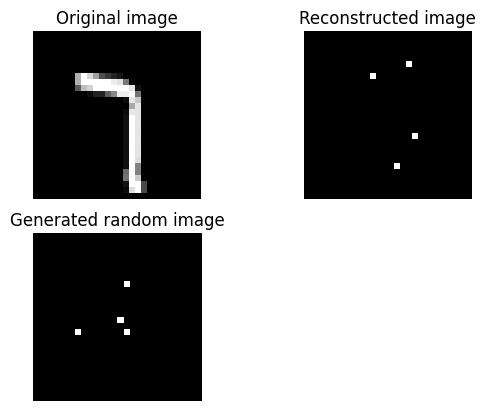

Epoch: 599
------

Train loss: 27.33
Test loss: 26.80
ELBO: 5.4708075523376465


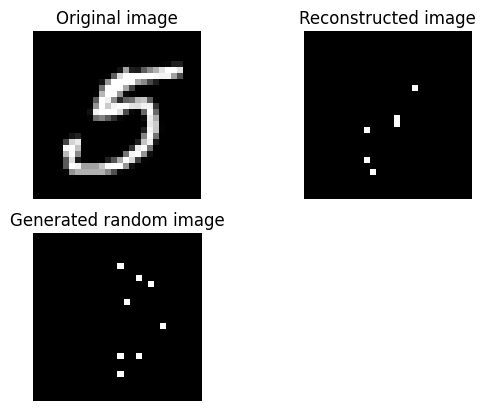

Epoch: 600
------

Train loss: 27.37
Test loss: 26.84
ELBO: 12.270944595336914


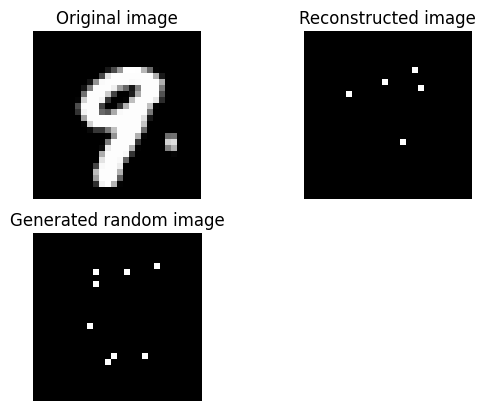

Epoch: 601
------

Train loss: 27.33
Test loss: 26.79
ELBO: 13.094066619873047


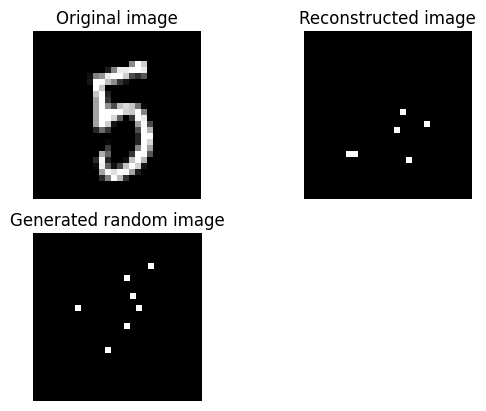

Epoch: 602
------

Train loss: 27.30
Test loss: 26.81
ELBO: 9.787881851196289


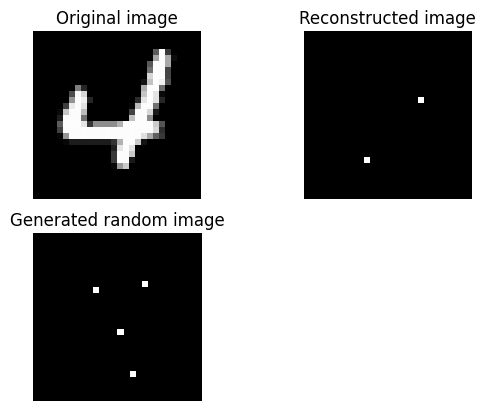

Epoch: 603
------

Train loss: 27.34
Test loss: 26.80
ELBO: 9.32133674621582


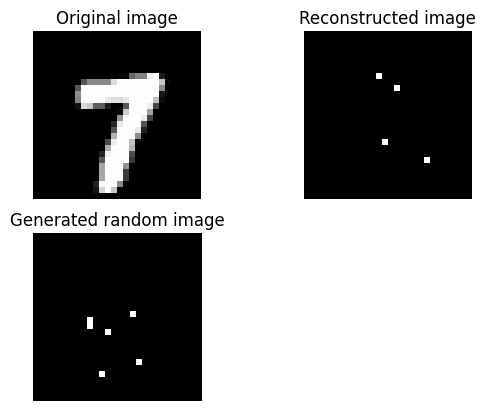

Epoch: 604
------

Train loss: 27.35
Test loss: 26.78
ELBO: 9.08698558807373


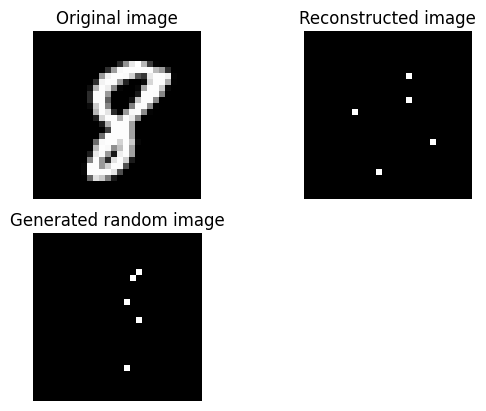

Epoch: 605
------

Train loss: 27.38
Test loss: 26.82
ELBO: 9.367612838745117


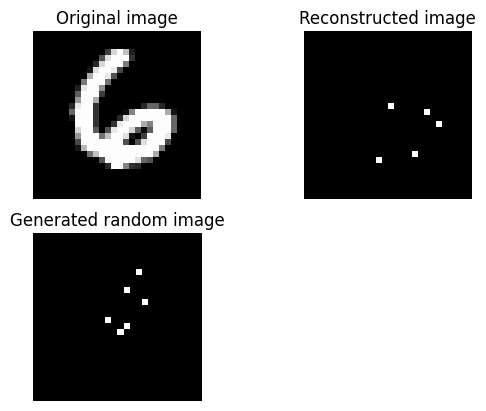

Epoch: 606
------

Train loss: 27.31
Test loss: 26.79
ELBO: 12.255745887756348


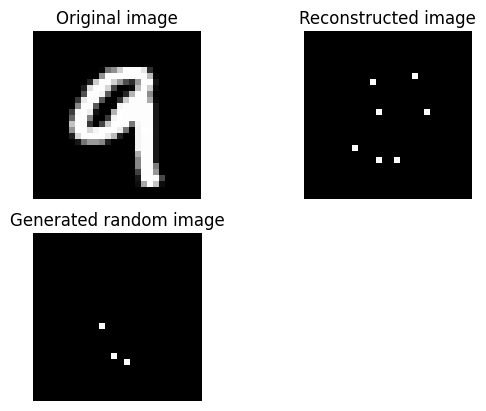

Epoch: 607
------

Train loss: 27.32
Test loss: 26.78
ELBO: 9.168811798095703


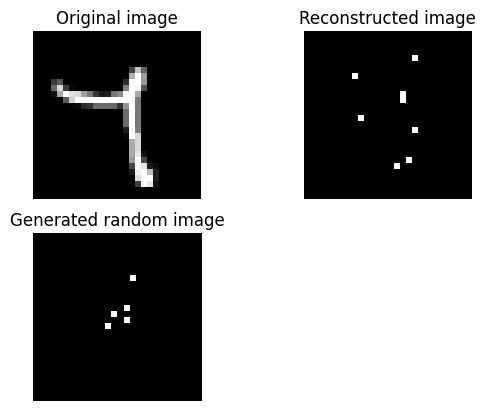

Epoch: 608
------


In [ ]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

for epoch in tqdm(range(num_epochs)):
  print(f"Epoch: {epoch+1}\n------")

  train_step(model, train_loader, optimizer, beta, device)
  test_step(model, valid_loader, beta, device)

  plot_outputs(encoder=model.encoder, decoder=model.decoder, dataset=test_dataset)